In [2]:
%autosave 1
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import scipy.stats as stats


Autosaving every 1 seconds


## PV with square activation function and square in learning rule

In [3]:
def phi_square(_x):
    x = np.array([_x])
    x[x<=0] = 0
    x[x>0] = x[x>0]**2 
    x[x>20] = 20
    return x[0]

<ipython-input-4-32e68bedbca2>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./PV_activation_function.pdf', bbox_inches='tight',rasterized=True)


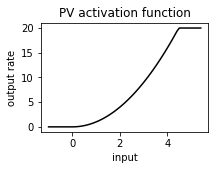

In [4]:
x = np.arange(-1,5.5,0.1)
y = np.empty((len(x)))
for i,x_i in enumerate(x):
    y[i] = phi_square(x_i)
    
plt.figure(figsize=(3,2))
plt.plot(x,y,'k')
plt.ylabel('output rate')
plt.xlabel('input')
plt.title('PV activation function')
plt.savefig('./PV_activation_function.pdf', bbox_inches='tight',rasterized=True)

<ipython-input-5-e0e20e66dbc8>:10: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./SST_activation_function.pdf', bbox_inches='tight',rasterized=True)


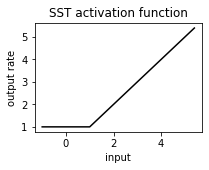

In [5]:
x = np.arange(-1,5.5,0.1)
y = np.ones((len(x)))
y[x>1]= x[x>1]
    
plt.figure(figsize=(3,2))
plt.plot(x,y,'k')
plt.ylabel('output rate')
plt.xlabel('input')
plt.title('SST activation function')
plt.savefig('./SST_activation_function.pdf', bbox_inches='tight',rasterized=True)

<ipython-input-9-0a1a086a96b0>:20: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./whisker_input_y1.pdf', bbox_inches='tight',rasterized=True)


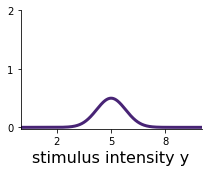

In [9]:
Y1_sigma = 0.8
Y2_sigma = 0.4

import scipy.stats as stats
x_values = np.arange(0, 10, 0.001)
y1_values = stats.norm(Y1_mean, Y1_sigma)
y2_values = stats.norm(Y2_mean, Y2_sigma)
plt.figure(figsize = (3,2.5))
a = plt.subplot(111)
plt.plot(x_values, y1_values.pdf(x_values), color = cm.viridis(0.1),linewidth =3,label='x1')
#plt.plot(x_values, y2_values.pdf(x_values), color = cm.viridis(0.5),linewidth =3,label='x2')
#plt.legend()
plt.xlim(0,10)
plt.yticks([0,1,2],[0,1,2])
plt.xticks([2,5,8],[2,5,8])
plt.xlabel('stimulus intensity y', fontsize = 16)
a.spines['top'].set_visible(False)
a.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('./whisker_input_y1.pdf', bbox_inches='tight',rasterized=True)

<ipython-input-7-e8c13a350e81>:21: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./whisker_input.pdf', bbox_inches='tight',rasterized=True)


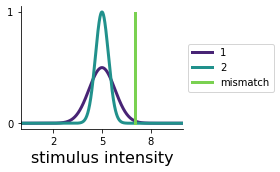

In [7]:
import scipy.stats as stats
x_values = np.arange(0, 10, 0.001)
y1_values = stats.norm(Y1_mean, Y1_sigma)
y2_values = stats.norm(Y2_mean, Y2_sigma)
plt.figure(figsize = (4,2.5))
a = plt.subplot(111)
plt.plot(x_values, y1_values.pdf(x_values), color = cm.viridis(0.1),linewidth =3,label='1')
plt.plot(x_values, y2_values.pdf(x_values), color = cm.viridis(0.5),linewidth =3,label='2')
plt.plot(np.ones((100))*7,np.arange(0,1,0.01),color = cm.viridis(0.8),linewidth=3, label = 'mismatch')
ldg = plt.legend()
plt.xlim(0,10)
plt.yticks([0,1],[0,1])
plt.xticks([2,5,8],[2,5,8])
plt.xlabel('stimulus intensity', fontsize = 16)
a.spines['top'].set_visible(False)
a.spines['right'].set_visible(False)
a.legend(loc='center left', bbox_to_anchor=(1, 0.5),fancybox=True, shadow=False)
#a.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.savefig('./whisker_input.pdf', bbox_inches='tight',rasterized=True)

<ipython-input-8-da2113ec5a83>:17: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./whisker_input_y2.pdf', bbox_inches='tight',rasterized=True)


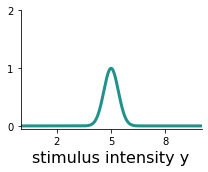

In [8]:
import scipy.stats as stats
x_values = np.arange(0, 10, 0.001)
y1_values = stats.norm(Y1_mean, Y1_sigma)
y2_values = stats.norm(Y2_mean, Y2_sigma)
plt.figure(figsize = (3,2.5))
a = plt.subplot(111)
#plt.plot(x_values, y1_values.pdf(x_values), color = cm.viridis(0.3),linewidth =3,label='x1')
plt.plot(x_values, y2_values.pdf(x_values), color = cm.viridis(0.5),linewidth =3,label='x2')
#plt.legend()
plt.xlim(0,10)
plt.yticks([0,1,2],[0,1,2])
plt.xticks([2,5,8],[2,5,8])
plt.xlabel('stimulus intensity y', fontsize = 16)
a.spines['top'].set_visible(False)
a.spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('./whisker_input_y2.pdf', bbox_inches='tight',rasterized=True)


## No plasticity and no Y, look at how X drives E, PV and SST

In [16]:
T = 100000
T2=100
rX1 = np.zeros((T2))
rX2 = np.zeros((T2))
rX1[:int(T2/2)] = 1
rX2[int(T2/2):] = 1
rP = 0.0
rS = 0.0
rE = 0.0
tau_E = 1.0
beta_S = 0.1 
beta_P = 0.1


wEP = np.array([1.0])
wES = np.array([-1.0])
wEY1 = np.array([1.0])
wEY2 = np.array([1.0])

Y1_new_mean = Y1_mean + 2.0
Y2_new_mean = Y2_mean + 2.0
#Y1_sigma = 0.5
#Y2_sigma = 0.1
#Y3_sigma = 1.0

#rY1 = Y1_sigma*np.random.randn(T)+Y1_mean
rY1n = np.ones((T))*Y1_new_mean
rY1n[int(T2/2):] = 0
rY2n = np.ones((T))*Y2_new_mean
#rY2 = Y2_sigma*np.random.randn(T)+Y2_mean
rY2n[:int(T2/2)] = 0

rP_monitor = np.empty((T2))
rE_monitor = np.empty((T2))

IP_monitor = np.empty((T2))
wPX1_monitor = np.empty((T2))
wPX2_monitor = np.empty((T2))

rS_monitor = np.empty((T2))
IS_monitor = np.empty((T2))
wSX1_monitor = np.empty((T2))
wSX2_monitor = np.empty((T2))
#wPB * rB[t]

#wPX1 = wPX1*10
#wPX2 = wPX2*10

for t in range(T2):
    #beta_S = (T*1.0-t)/T
    #beta_P = (T*1.0-t)/T
    drS = (-rS + (1-beta_S)*(wSX1 * rX1[t] + wSX2 * rX2[t]) + beta_S*(wSY1 * rY1n[t] + wSY2 * rY2n[t]))/tau_S
    #drS = (-rS + wSX1 * rX1[t] + wSX2 * rX2[t])/tau_S
    drP = (-rP + phi_square((1-beta_P)*(wPX1 * rX1[t] + wPX2 * rX2[t]) + beta_P*(wPY1 * rY1n[t] + wPY2 * rY2n[t] + wPS * rS)))/tau_P
    #drP = (-rP + phi_square(wPX1 * rX1[t] + wPX2 * rX2[t] + wPS * rS))/tau_P
    drE = (-rE + 1.0/(1.0 + wEP * rP) * (wEY1 * rY1n[t] + wEY2 * rY2n[t] + wES * rS))/tau_E
    IS_monitor[t] = (1-beta_S)*(wSX1 * rX1[t] + wSX2 * rX2[t]) + beta_S*(wSY1 * rY1[t] + wSY2 * rY2[t])
    rP_monitor[t] = rP
    rS_monitor[t] = rS
    rE_monitor[t] = rE
    wPX1_monitor[t] = wPX1
    wPX2_monitor[t] = wPX2
    wSX1_monitor[t] = wSX1
    wSX2_monitor[t] = wSX2

    rP += dt*drP
    rS += dt*drS
    rE += dt*drE

[0.         5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843 5.16791843
 5.16791843 5.16791843 5.16791843 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794
 5.18838794 5.18838794 5.18838794 5.18838794 5.18838794 5.1883

<ipython-input-17-0e359fee8961>:44: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./rates_and_weights_Gauss_mismatch.pdf', bbox_inches='tight',rasterized=True)
<ipython-input-17-0e359fee8961>:79: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./E_PV_SST_rates_Gauss_mismacth.pdf', bbox_inches='tight',rasterized=True)


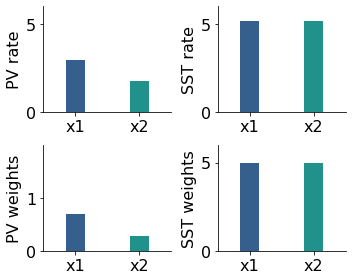

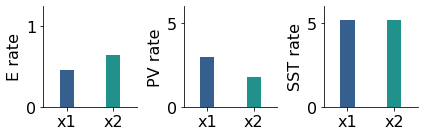

In [17]:
plt.figure(figsize=(5,4))

a1 = plt.subplot(221)
plt.bar([0,1],[np.mean(rP_monitor[5:int(T2/2)]),np.mean(rP_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
a2 = plt.subplot(222)
plt.bar([0,1],[np.mean(rS_monitor[5:int(T2/2)]),np.mean(rS_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
a3 = plt.subplot(223)
plt.bar([0,1],[wPX1_monitor[-1],wPX2_monitor[-1]],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,2)
plt.xlim(-0.5,1.5)
plt.yticks([0,1],[0,1],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('PV weights',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

a4 = plt.subplot(224)
plt.bar([0,1],[wSX1_monitor[-1],wSX2_monitor[-1]],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a4.spines['top'].set_visible(False)
a4.spines['right'].set_visible(False)
plt.ylabel('SST weights',fontsize=16)
#plt.xlabel('time')
plt.tight_layout()
print(rS_monitor)
print(rP_monitor)
plt.savefig('./rates_and_weights_Gauss_mismatch.pdf', bbox_inches='tight',rasterized=True)


plt.figure(figsize=(6,2))

a1 = plt.subplot(131)
plt.bar([0,1],[np.mean(rE_monitor[5:int(T2/2)]),np.mean(rE_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('E rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,1],[0,1],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,1.25)
plt.xlim(-0.5,1.5)
a2 = plt.subplot(132)
plt.bar([0,1],[np.mean(rP_monitor[5:int(T2/2)]),np.mean(rP_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
a3 = plt.subplot(133)
plt.bar([0,1],[np.mean(rS_monitor[5:int(T2/2)]),np.mean(rS_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

plt.tight_layout()

plt.savefig('./E_PV_SST_rates_Gauss_mismacth.pdf', bbox_inches='tight',rasterized=True)

In [22]:
T2=100
rX1 = np.zeros((T2))
rX2 = np.zeros((T2))
rX1[:int(T2/2)] = 1
rX2[int(T2/2):] = 1
rP = 0.0
rS = 0.0
rE = 0.0
tau_E = 1.0


wEP = np.array([1.0])
wES = np.array([-1.0])
wEY1 = np.array([1.0])
wEY2 = np.array([1.0])

Y1n = Y1+2.0
#Y2 = [4.0,5.0,6.0]

rY1n = np.ones((T2))*Y1n
rY1n[int(T2/2):] = 0
rY2n = np.ones((T2))*Y1n
rY2n[:int(T2/2)] = 0

rP_monitor = np.empty((T2))
rE_monitor = np.empty((T2))

IP_monitor = np.empty((T2))
wPX1_monitor = np.empty((T2))
wPX2_monitor = np.empty((T2))

rS_monitor = np.empty((T2))
IS_monitor = np.empty((T2))
wSX1_monitor = np.empty((T2))
wSX2_monitor = np.empty((T2))
XtoP = np.empty((T2))
YtoP = np.empty((T2))
StoP = np.empty((T2))

#wPB * rB[t]

#wPX1 = wPX1*10
#wPX2 = wPX2*10

for t in range(T2):
    #beta_S = (T*1.0-t)/T
    #beta_P = (T*1.0-t)/T
    drS = (-rS + (1-beta_S)*(wSX1 * rX1[t] + wSX2 * rX2[t]) + beta_S*(wSY1 * rY1n[t] + wSY2 * rY2n[t]))/tau_S
    #drS = (-rS + wSX1 * rX1[t] + wSX2 * rX2[t])/tau_S
    drP = (-rP + phi_square((1-beta_P)*(wPX1 * rX1[t] + wPX2 * rX2[t]) + beta_P*(wPY1 * rY1n[t] + wPY2 * rY2n[t] + wPS * rS)))/tau_P
    #drP = (-rP + phi_square(wPX1 * rX1[t] + wPX2 * rX2[t] + wPS * rS))/tau_P
    drE = (-rE + 1.0/(1.0 + wEP * rP) * (wEY1 * rY1n[t] + wEY2 * rY2n[t] + wES * rS))/tau_E
    IS_monitor[t] = (1-beta_S)*(wSX1 * rX1[t] + wSX2 * rX2[t]) + beta_S*(wSY1 * rY1[t] + wSY2 * rY2[t])
    rP_monitor[t] = rP
    rS_monitor[t] = rS
    rE_monitor[t] = rE
    XtoP[t] = (1-beta_P)*(wPX1 * rX1[t] + wPX2 * rX2[t])
    StoP[t] = beta_P*(wPS * rS)
    YtoP[t] = beta_P*(wPY1 * rY1n[t] + wPY2 * rY2n[t])

    wPX1_monitor[t] = wPX1
    wPX2_monitor[t] = wPX2
    wSX1_monitor[t] = wSX1
    wSX2_monitor[t] = wSX2

    rP += dt*drP
    rS += dt*drS
    rE += dt*drE

[0.         5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.2        5.2        5.2
 5.2        5.2        5.2        5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743 5.15818743
 5.15818743 5.15818743 5.15818743 5.15818743 5.1581

<ipython-input-23-6ea9fb988175>:44: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./rates_and_weights_discrete.eps', bbox_inches='tight',rasterized=True)
<ipython-input-23-6ea9fb988175>:79: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./E_PV_SST_rates_discrete.pdf', bbox_inches='tight',rasterized=True)


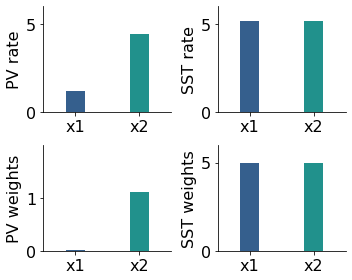

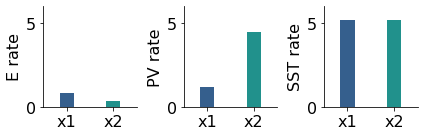

In [23]:
plt.figure(figsize=(5,4))

a1 = plt.subplot(221)
plt.bar([0,1],[np.mean(rP_monitor[5:int(T2/2)]),np.mean(rP_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
a2 = plt.subplot(222)
plt.bar([0,1],[np.mean(rS_monitor[5:int(T2/2)]),np.mean(rS_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
a3 = plt.subplot(223)
plt.bar([0,1],[wPX1_monitor[-1],wPX2_monitor[-1]],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,2)
plt.xlim(-0.5,1.5)
plt.yticks([0,1],[0,1],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('PV weights',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

a4 = plt.subplot(224)
plt.bar([0,1],[wSX1_monitor[-1],wSX2_monitor[-1]],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a4.spines['top'].set_visible(False)
a4.spines['right'].set_visible(False)
plt.ylabel('SST weights',fontsize=16)
#plt.xlabel('time')
plt.tight_layout()
print(rS_monitor)
print(rP_monitor)
plt.savefig('./rates_and_weights_discrete.eps', bbox_inches='tight',rasterized=True)


plt.figure(figsize=(6,2))

a1 = plt.subplot(131)
plt.bar([0,1],[np.mean(rE_monitor[5:int(T2/2)]),np.mean(rE_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('E rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
a2 = plt.subplot(132)
plt.bar([0,1],[np.mean(rP_monitor[5:int(T2/2)]),np.mean(rP_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
a3 = plt.subplot(133)
plt.bar([0,1],[np.mean(rS_monitor[5:int(T2/2)]),np.mean(rS_monitor[int(T2/2)+5:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

plt.tight_layout()

plt.savefig('./E_PV_SST_rates_discrete.pdf', bbox_inches='tight',rasterized=True)

In [24]:
def run_sweep(param_name, value_range):
    params = {'mean': 5.0,
             'sigma': 0.5,
             'wP': 6.0}
    PV_rates = np.empty((len(value_range)))
    SST_rates = np.empty((len(value_range)))
    E_rates = np.empty((len(value_range)))
    PV_std = np.empty((len(value_range)))
    SST_std = np.empty((len(value_range)))
    E_std = np.empty((len(value_range)))
    
    for k, param_value in enumerate(value_range):
        
        params[param_name] = param_value
        #sim parameters
        dt = 1
        T = 100000 # number of time steps

        # time constants
        tau_P = 1
        tau_S = 1
        tau_E = 1.0

        # weights
        # to PV
        wPB = np.array([1.0])
        wPY1 = np.array([params['wP']])
        wPX1 = np.array([0.01]) # small intitial weights
        wPS = np.array([-params['wP']])

        # to SST
        wSX1 = np.array([0.1]) # small intitial weights
        wSY1 = np.array([1.0])

        # to E
        wEP = np.array([1.0])
        wES = np.array([-1.0])
        wEY1 = np.array([1.0])
        wEY2 = np.array([1.0])

        # nudging parameter
        beta_S = 0.1 
        beta_P = 0.1


        # inputs
        # sound
        rX1 = np.ones((T))

        # whisker
        Y1_mean = params['mean']
        Y1_sigma = params['sigma']

        rY1 = Y1_sigma*np.random.randn(T)+Y1_mean

        #learning rate
        eta_S = 0.1
        eta_P = 0.001

        #initial rates
        rP = 0.0#phi_square(rB[0])
        rS = 0.0
        rE = 0.0

        # monitors
        rP_monitor = np.empty((T))
        rE_monitor = np.empty((T))
        rS_monitor = np.empty((T))

        wPX1_monitor = np.empty((T))
        wSX1_monitor = np.empty((T))


        for t in range(T):

            drS = (-rS + (1-beta_S)*(wSX1 * rX1[t]) + beta_S*(wSY1 * rY1[t]))/tau_S
            drP = (-rP + phi_square(((1-beta_P)*(wPX1 * rX1[t]) + beta_P*(wPY1 * rY1[t] + wPS * rS))))/tau_P
            drE = (-rE + 1.0/(1.0 + wEP * rP) * (wEY1 * rY1[t] + wES * rS))/tau_E

            # store monitors
            rP_monitor[t] = rP
            rS_monitor[t] = rS
            rE_monitor[t] = rE
            wPX1_monitor[t] = wPX1
            wSX1_monitor[t] = wSX1


            # rate changes
            rP += dt*drP
            rS += dt*drS
            rE += dt*drE

            # weight changes
            wPX1 += eta_P * ((rP - ((wPX1*rX1[t])**2)) * rX1[t])
            wSX1 += eta_S * ((rS - (wSX1*rX1[t])) * rX1[t])

        PV_rates[k] = np.mean(rP_monitor[100:])
        SST_rates[k] = np.mean(rS_monitor[100:])
        E_rates[k] = np.mean(rE_monitor[100:])
        PV_std[k] = np.std(rP_monitor[100:])
        SST_std[k] = np.std(rS_monitor[100:])
        E_std[k] = np.std(rE_monitor[100:])
        
    return E_rates, SST_rates, PV_rates, E_std, SST_std, PV_std



In [25]:
sigma_range= np.arange(0.0,1.1,0.1)
mean_range= np.arange(0.0,5.1,1.0)
wP_range= np.arange(1.0,10.1,1.0)
E_rates_mean, SST_rates_mean, PV_rates_mean, E_std_mean, SST_std_mean, PV_std_mean = run_sweep('mean',mean_range)
E_rates_sigma, SST_rates_sigma, PV_rates_sigma, E_std_sigma, SST_std_sigma, PV_std_sigma = run_sweep('sigma',sigma_range)


In [26]:
sigma_range= np.arange(0.0,1.1,0.1)
mean_range= np.arange(0.0,5.1,1.0)
wP_range= np.arange(1.0,10.1,1.0)

#PV_rates = np.empty((len(sigma_range)))
#SST_rates = np.empty((len(sigma_range)))
#E_rates = np.empty((len(sigma_range)))

#PV_rates = np.empty((len(mean_range)))
#SST_rates = np.empty((len(mean_range)))
#E_rates = np.empty((len(mean_range)))

PV_rates = np.empty((len(wP_range)))
SST_rates = np.empty((len(wP_range)))
E_rates = np.empty((len(wP_range)))


wP = 6.0
mean= 5.0
sigma= 0.5
#for k, sigma in enumerate(sigma_range):
#for k, mean in enumerate(mean_range):
for k, wP in enumerate(wP_range):
    #sim parameters
    dt = 1
    T = 100000 # number of time steps

    # time constants
    tau_P = 1
    tau_S = 1
    tau_E = 1.0

    # weights
    # to PV
    wPB = np.array([1.0])
    wPY1 = np.array([wP])
    wPX1 = np.array([0.01]) # small intitial weights
    wPS = np.array([-wP])

    # to SST
    wSX1 = np.array([0.1]) # small intitial weights
    wSY1 = np.array([1.0])

    # to E
    wEP = np.array([1.0])
    wES = np.array([-1.0])
    wEY1 = np.array([1.0])
    wEY2 = np.array([1.0])

    # nudging parameter
    beta_S = 0.1 
    beta_P = 0.1


    # inputs
    # sound
    rX1 = np.ones((T))

    # whisker
    Y1_mean = mean
    Y1_sigma = sigma

    rY1 = Y1_sigma*np.random.randn(T)+Y1_mean

    #learning rate
    eta_S = 0.1
    eta_P = 0.001

    #initial rates
    rP = 0.0#phi_square(rB[0])
    rS = 0.0
    rE = 0.0

    # monitors
    rP_monitor = np.empty((T))
    rE_monitor = np.empty((T))
    rS_monitor = np.empty((T))

    wPX1_monitor = np.empty((T))
    wSX1_monitor = np.empty((T))


    for t in range(T):

        drS = (-rS + (1-beta_S)*(wSX1 * rX1[t]) + beta_S*(wSY1 * rY1[t]))/tau_S
        drP = (-rP + phi_square(((1-beta_P)*(wPX1 * rX1[t]) + beta_P*(wPY1 * rY1[t] + wPS * rS))))/tau_P
        drE = (-rE + 1.0/(1.0 + wEP * rP) * (wEY1 * rY1[t] + wES * rS))/tau_E

        # store monitors
        rP_monitor[t] = rP
        rS_monitor[t] = rS
        rE_monitor[t] = rE
        wPX1_monitor[t] = wPX1
        wSX1_monitor[t] = wSX1


        # rate changes
        rP += dt*drP
        rS += dt*drS
        rE += dt*drE

        # weight changes
        wPX1 += eta_P * ((rP - ((wPX1*rX1[t])**2)) * rX1[t])
        wSX1 += eta_S * ((rS - (wSX1*rX1[t])) * rX1[t])
    
    PV_rates[k] = np.mean(rP_monitor[100:])
    SST_rates[k] = np.mean(rS_monitor[100:])
    E_rates[k] = np.mean(rE_monitor[100:])
    


<ipython-input-27-aad618cdb478>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./SST_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)
<ipython-input-27-aad618cdb478>:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./E_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)
<ipython-input-27-aad618cdb478>:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./PV_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)


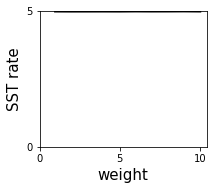

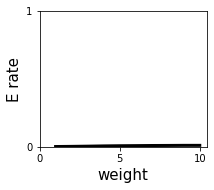

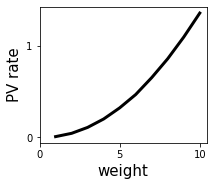

In [27]:
plt.figure(figsize=(3,2.5))
plt.plot(wP_range,SST_rates, color = 'k',linewidth=3)
plt.xlabel('weight',fontsize=15)
plt.ylabel('SST rate',fontsize=15)
plt.xticks([0,5,10],[0,5,10])
plt.yticks([0,5],[0,5])
plt.savefig('./SST_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(wP_range,E_rates, color = 'k',linewidth=3)
plt.xlabel('weight',fontsize=15)
plt.ylabel('E rate',fontsize=15)
plt.xticks([0,5,10],[0,5,10])
plt.yticks([0,1],[0,1])
plt.savefig('./E_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(wP_range,PV_rates, color = 'k',linewidth=3)
plt.xlabel('weight',fontsize=15)
plt.ylabel('PV rate',fontsize=15)
plt.xticks([0,5,10],[0,5,10])
plt.yticks([0,1],[0,1])
plt.savefig('./PV_asfctof_wP.pdf', bbox_inches='tight',rasterized=True)

<ipython-input-28-f33626cd3c5b>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./SST_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)
<ipython-input-28-f33626cd3c5b>:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./E_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)
<ipython-input-28-f33626cd3c5b>:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./PV_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)


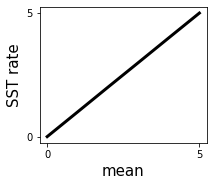

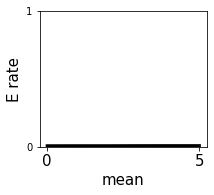

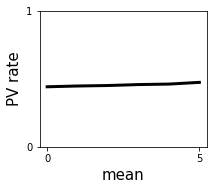

In [28]:
plt.figure(figsize=(3,2.5))
plt.plot(mean_range,SST_rates_mean, color = 'k',linewidth=3)
plt.xlabel('mean',fontsize=15)
plt.ylabel('SST rate',fontsize=15)
plt.xticks([0,5],[0,5])
plt.yticks([0,5],[0,5])
plt.savefig('./SST_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(mean_range,E_rates_mean, color = 'k',linewidth=3)
plt.xlabel('mean',fontsize=15)
plt.ylabel('E rate',fontsize=15)
plt.xticks([0,5],[0,5],fontsize=15)
plt.yticks([0,1],[0,1])
plt.savefig('./E_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(mean_range,PV_rates_mean, color = 'k',linewidth=3)
plt.xlabel('mean',fontsize=15)
plt.ylabel('PV rate',fontsize=15)
plt.xticks([0,5],[0,5])
plt.yticks([0,1],[0,1])
plt.savefig('./PV_asfctof_mean.pdf', bbox_inches='tight',rasterized=True)

ValueError: x and y must have same first dimension, but have shapes (11,) and (10,)

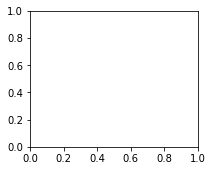

In [29]:
plt.figure(figsize=(3,2.5))
plt.plot(sigma_range**2,SST_rates, color = 'k',linewidth=3)
plt.xlabel('sigma^2',fontsize=15)
plt.ylabel('SST rate',fontsize=15)
plt.xticks([0.0,0.5,1.0],[0.0,0.5,1.0])
plt.yticks([0,5],[0,5])
plt.ylim(0,6)
plt.savefig('./SST_asfctof_sigma2.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(sigma_range**2,E_rates, color = 'k',linewidth=3)
plt.xlabel('sigma^2',fontsize=15)
plt.ylabel('E rate',fontsize=15)
plt.xticks([0.0,0.5,1.0],[0.0,0.5,1.0])
plt.yticks([0,1],[0,1])
plt.savefig('./E_asfctof_sigma2.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(sigma_range,PV_rates, color = 'k',linewidth=3)
plt.xlabel('sigma',fontsize=15)
plt.ylabel('PV rate',fontsize=15)
plt.xticks([0.0,0.5,1.0],[0.0,0.5,1.0])
plt.yticks([0,1],[0,1])
plt.savefig('./PV_asfctof_sigma.pdf', bbox_inches='tight',rasterized=True)

plt.figure(figsize=(3,2.5))
plt.plot(sigma_range**2,PV_rates, color = 'k',linewidth=3)
plt.xlabel('sigma^2',fontsize=15)
plt.ylabel('PV rate',fontsize=15)
plt.xticks([0.0,0.5,1.0],[0.0,0.5,1.0])
plt.yticks([0,1],[0,1])
plt.savefig('./PV_asfctof_sigma2.pdf', bbox_inches='tight',rasterized=True)


1.3772159803752886
1.3324543398391244


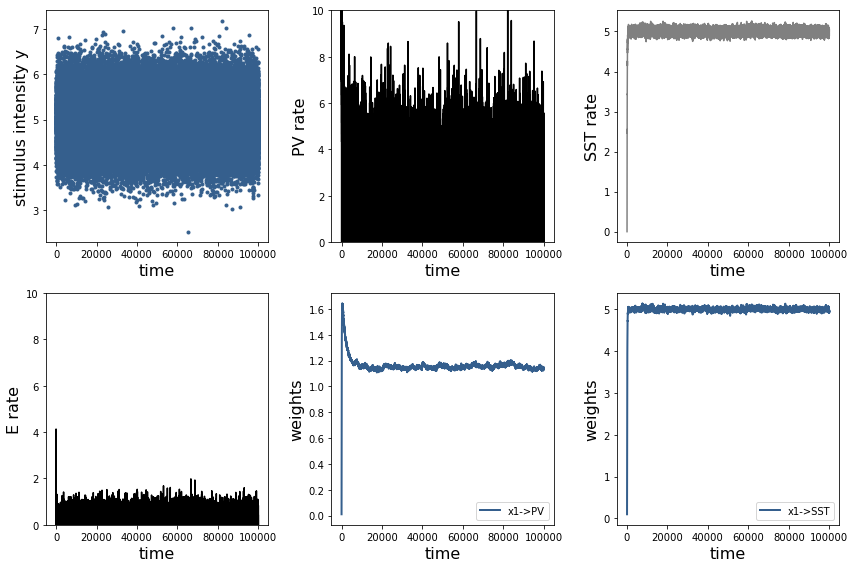

In [30]:
print(np.mean(rP_monitor[100:int(T/2)]))
print(np.mean(rP_monitor[int(T/2)+100:]))

plt.figure(figsize=(12,8))
plt.subplot(231)
plt.plot(rY1,'.',color =cm.viridis(.3))#, label='Y1: mean: %.1f, sigma: %.1f'%(Y1_mean,Y1_sigma))
#plt.plot(rY2,'.',color =cm.viridis(.5))#, label='Y2: mean: %.1f, sigma: %.1f'%(Y2_mean,Y2_sigma))
plt.ylabel('stimulus intensity y',fontsize=16)
plt.xlabel('time',fontsize=16)
#plt.legend(loc='lower right')
plt.subplot(234)
plt.plot(rE_monitor, color = 'k')#,
         #label = 'mean rate during Y1: %.2f; Y2: %.2f'%(np.mean(rP_monitor[100:int(T/2)]),np.mean(rP_monitor[int(T/2)+100:])))
plt.ylabel('E rate',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,10)
plt.subplot(232)
plt.plot(rP_monitor, color = 'k')#,
         #label = 'mean rate during Y1: %.2f; Y2: %.2f'%(np.mean(rP_monitor[100:int(T/2)]),np.mean(rP_monitor[int(T/2)+100:])))
plt.ylabel('PV rate',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,10)
#plt.xlim(1000,2000)
#plt.legend(loc='lower right')
plt.subplot(233)
plt.plot(rS_monitor, color = 'gray')#,
         #label = 'mean rate during Y1: %.2f; Y2: %.2f'%(np.mean(rS_monitor[100:int(T/2)]),np.mean(rS_monitor[int(T/2)+100:])))
plt.ylabel('SST rate',fontsize=16)
plt.xlabel('time',fontsize=16)
#plt.legend(loc = 'lower right')
plt.subplot(235)
plt.plot(wPX1_monitor, label='x1->PV', color =cm.viridis(.3),linewidth=2)
#plt.plot(wPX2_monitor, label='x2->PV',color =cm.viridis(.5),linewidth=2)
plt.ylabel('weights',fontsize=16)
plt.xlabel('time',fontsize=16)
#plt.ylim(0,1)
plt.legend(loc='lower right')
plt.subplot(236)
plt.plot(wSX1_monitor, label='x1->SST', color =cm.viridis(.3),linewidth=2)
#plt.plot(wSX2_monitor, label='x2->SST',color =cm.viridis(.5),linewidth=2)
plt.ylabel('weights',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.legend(loc='lower right')
plt.tight_layout()


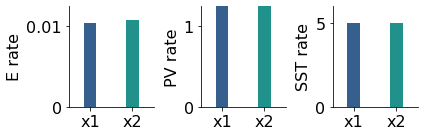

In [31]:
plt.figure(figsize=(6,2))

a1 = plt.subplot(131)
plt.bar([0,1],[np.mean(rE_monitor[100:int(T/2)]),np.mean(rE_monitor[int(T/2)+100:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('E rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,0.01],[0,0.01],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,0.0125)
plt.xlim(-0.5,1.5)
a2 = plt.subplot(132)
plt.bar([0,1],[np.mean(rP_monitor[100:int(T/2)]),np.mean(rP_monitor[int(T/2)+100:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,1],[0,1],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylim(0,1.25)
plt.xlim(-0.5,1.5)
a3 = plt.subplot(133)
plt.bar([0,1],[np.mean(rS_monitor[100:int(T/2)]),np.mean(rS_monitor[int(T/2)+100:])],color=[cm.viridis(.3),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

plt.tight_layout()


In [13]:
def run_network(mean= 5.0, sigma= 0.5, wP= 6.0, w_init_PV = 0.01, w_init_R = 0.1, plastic=True):
    """
    Parameters
    ----------
    mean : float
        mean of the stimulus distribution
    sigma: float
        standard deviation of the stimulus distribution
    wP : float
        connection weight from R to PV and from SST to PV
    w_init_PV : float
        initial weight from Y1 to PV
    w_init_R : float
        initial weight from Y1 to R
    plastic : boolean
        truth value indicates whether plasticity is switched on or off   
        
    Returns
    ----------
    E_avg : float
        mean rate of error neuron
    PV_avg : float
        mean rate of PV
    SST_avg : float
        mean rate of SST
    R_avg : float
        mean rate of R
    wPX1_monitor : array of length t
        weight from X1 to PV over the course of the simulation
    wRX1_monitor : array of length t
        weight from X1 to R over the course of the simulation
    rE_monitor : array of length t
        rate of error neuron over the course of the simulation
    rS_monitor : array of length t
        rate of error neuron over the course of the simulation
    rP_monitor : array of length t
        rate of error neuron over the course of the simulation
    rY1 : array of length t
        whisker deflections over the course of the simulation
    """
    
    #sim parameters
    dt = 1
    T = 150000 # number of time steps

    # time constants
    tau_P = 1.0
    tau_S = 1.0
    tau_E = 1.0
    tau_R = 1.0

    # weights
    # to PV
    wPB = np.array([1.0])
    wPR = np.array([wP])
    wPX1 = np.array([w_init_PV]) # small intitial weights
    wPS = np.array([-wP])

    # to Representation neuron
    wRX1 = np.array([w_init_R]) # small intitial weight
    wRY1 = np.array([1.0])
    
    # to SST
    wSY1 = np.array([1.0])

    # to E
    wEP = np.array([1.0])
    wES = np.array([-1.0])
    wER = np.array([1.0])
   
    # nudging parameter
    beta_R = 0.1 
    beta_P = 0.1


    # inputs
    # sound
    rX1 = np.ones((T))

    # whisker
    Y1_mean = mean
    Y1_sigma = sigma

    rY1 = Y1_sigma*np.random.randn(T)+Y1_mean

    #learning rate
    eta_R = 0.1
    eta_P = 0.001

    #initial rates
    rP = 0.0#phi_square(rB[0])
    rS = 0.0
    rE = 0.0
    rR = 0.0

    # monitors
    rP_monitor = np.empty((T))
    rE_monitor = np.empty((T))
    rS_monitor = np.empty((T))
    rR_monitor = np.empty((T))

    wPX1_monitor = np.empty((T))
    wRX1_monitor = np.empty((T))


    for t in range(T):

        drS = (-rS + wSY1 * rY1[t])/tau_S
        drR = (-rR + (1-beta_R)*(wRX1 * rX1[t]) + beta_R*(wRY1 * rY1[t]))/tau_R
        drP = (-rP + phi_square(((1-beta_P)*(wPX1 * rX1[t]) + beta_P*(wPR * rR + wPS * rS))))/tau_P
        drE = (-rE + 1.0/(1.0 + wEP * rP) * (wER * rR + wES * rS))/tau_E

        # store monitors
        rP_monitor[t] = rP
        rS_monitor[t] = rS
        rE_monitor[t] = rE
        rR_monitor[t] = rR
        wPX1_monitor[t] = wPX1
        wRX1_monitor[t] = wRX1


        # rate changes
        rP += dt*drP
        rS += dt*drS
        rE += dt*drE
        rR += dt*drR

        # weight changes
        wPX1 += plastic * eta_P * ((rP - ((wPX1*rX1[t])**2)) * rX1[t])
        print(plastic * eta_P * ((rP - ((wPX1*rX1[t])**2)) * rX1[t]))
        wRX1 += plastic * eta_R * ((rR - (wRX1*rX1[t])) * rX1[t])
    
    PV_avg = np.mean(rP_monitor[100:])
    SST_avg = np.mean(rS_monitor[100:])
    E_avg = np.mean(rE_monitor[100:])
    R_avg = np.mean(rR_monitor[100:])
    PV_std = np.std(rP_monitor[100:])
    SST_std = np.std(rS_monitor[100:])
    E_std = np.std(rE_monitor[100:])
    R_std = np.std(rR_monitor[100:])
    
    return E_avg, PV_avg, SST_avg, R_avg, E_std, PV_std, SST_std, R_std, wPX1_monitor, wRX1_monitor, rE_monitor, rS_monitor, rP_monitor, rY1
    

In [14]:
Y1_mean = 5.0
Y2_mean = 5.0
Y1_sigma = 0.8
Y2_sigma = 0.4
E_avg1, PV_avg1, SST_avg1, R_avg1, E_std1, PV_std1, SST_std1, R_std1, wPX1_monitor, wRX1_monitor, rE1, rS1, rP1, rY1 = run_network(mean= Y1_mean,sigma=Y1_sigma)
E_avg2, PV_avg2, SST_avg2, R_avg2, E_std2, PV_std2, SST_std2, R_std2, wPX2_monitor, wRX2_monitor, rE2, rS2, rP2, rY2 = run_network(mean= Y2_mean,sigma=Y2_sigma)

[-1.899962e-08]
[-9.999762e-08]
[-9.99956201e-08]
[-9.99936202e-08]
[-9.99916204e-08]
[-9.99896207e-08]
[-9.9987621e-08]
[-9.99856214e-08]
[-9.99836219e-08]
[-9.99816224e-08]
[-9.99796229e-08]
[-9.99776235e-08]
[-9.99756242e-08]
[-9.9973625e-08]
[-9.99716258e-08]
[-9.99696266e-08]
[-9.99676275e-08]
[-9.99656285e-08]
[-9.99636296e-08]
[-9.99616307e-08]
[-9.99596318e-08]
[-9.9957633e-08]
[-9.99556343e-08]
[-9.99536357e-08]
[-9.99516371e-08]
[-9.99496385e-08]
[-9.99476401e-08]
[-9.99456416e-08]
[-9.99436433e-08]
[-9.9941645e-08]
[-9.99396467e-08]
[-9.99376486e-08]
[-9.99356504e-08]
[-9.99336524e-08]
[-9.99316544e-08]
[-9.99296564e-08]
[-9.99276586e-08]
[-9.99256607e-08]
[-9.9923663e-08]
[-9.99216653e-08]
[-9.99196676e-08]
[-9.99176701e-08]
[-9.99156725e-08]
[-9.99136751e-08]
[-9.99116777e-08]
[-9.99096803e-08]
[-9.9907683e-08]
[-9.99056858e-08]
[-9.99036887e-08]
[-9.99016916e-08]
[-9.98996945e-08]
[-9.98976975e-08]
[-9.98957006e-08]
[-9.98937038e-08]
[-9.9891707e-08]
[-9.98897102e-08]
[-9

[-4.58006785e-06]
[8.05287221e-05]
[-4.59035345e-06]
[-4.58973146e-06]
[3.76928949e-05]
[0.00019761]
[2.66612833e-05]
[-4.62467086e-06]
[-4.62404188e-06]
[0.00018926]
[-3.47329036e-06]
[0.00014291]
[1.17878045e-05]
[2.08257049e-06]
[-4.6701163e-06]
[0.00013143]
[9.42678516e-06]
[-4.68874868e-06]
[-4.47169013e-06]
[3.3438553e-05]
[-4.69207413e-06]
[0.00044231]
[1.37699769e-05]
[1.02519826e-05]
[0.00025966]
[-4.79141079e-06]
[-4.79074749e-06]
[0.00013721]
[0.00035319]
[-4.85820595e-06]
[-4.85752873e-06]
[-4.85685165e-06]
[0.00021784]
[-4.88658378e-06]
[0.00023526]
[-4.91884441e-06]
[0.00045005]
[-4.98148041e-06]
[0.00041839]
[-1.51652543e-06]
[4.98856218e-05]
[-5.038083e-07]
[2.86021362e-06]
[0.00191903]
[0.00018344]
[-5.35036685e-06]
[0.00013571]
[0.00012073]
[1.54403597e-05]
[0.0001521]
[-3.79649273e-06]
[0.00017336]
[-5.43676072e-06]
[9.70217436e-08]
[4.8438069e-05]
[5.72492219e-05]
[-5.45156892e-06]
[0.00011164]
[0.00016715]
[0.0004134]
[0.00124443]
[1.05555465e-05]
[0.00013312]
[1.6

[7.56388283e-05]
[2.44026166e-06]
[0.00014807]
[0.00028063]
[0.00020548]
[0.00015929]
[-1.62853869e-05]
[-8.23736642e-06]
[1.87029124e-05]
[5.36852689e-05]
[-1.62976058e-05]
[-1.62934449e-05]
[0.00018574]
[-1.6336731e-05]
[-1.63325551e-05]
[-1.63283808e-05]
[0.00090402]
[-1.65560312e-05]
[-1.65517709e-05]
[-1.65475123e-05]
[0.00054053]
[0.00033437]
[5.27048715e-06]
[-1.67704456e-05]
[-1.67661024e-05]
[-1.67617608e-05]
[-1.67574208e-05]
[-1.67530826e-05]
[-1.67487461e-05]
[0.00019821]
[-1.67957476e-05]
[-1.67913945e-05]
[5.42968182e-06]
[-1.67884501e-05]
[-1.67840998e-05]
[6.38554449e-05]
[0.00014856]
[-1.6834828e-05]
[-1.68304596e-05]
[9.39244658e-05]
[0.00032648]
[2.64764833e-05]
[-6.99525707e-06]
[-5.82535298e-06]
[0.00052037]
[-1.70746112e-05]
[-1.70701493e-05]
[-1.7065689e-05]
[0.00061473]
[0.00015901]
[-1.72639588e-05]
[-1.72594224e-05]
[0.00013666]
[7.02670992e-05]
[-1.73092942e-05]
[-1.730474e-05]
[-1.69492579e-05]
[-1.26807789e-05]
[-1.72923939e-05]
[4.81597768e-05]
[-1.7300513

[-5.10616234e-05]
[-5.10385494e-05]
[-5.01985884e-05]
[-4.3609472e-05]
[0.00106878]
[-5.14568689e-05]
[-5.14335265e-05]
[-1.36215903e-05]
[-5.14040231e-05]
[-5.13807166e-05]
[-5.1357426e-05]
[0.00015161]
[0.00011993]
[0.00099685]
[-5.19105158e-05]
[-5.18868641e-05]
[0.00021221]
[-5.19599302e-05]
[0.00050429]
[5.61142415e-05]
[0.00010633]
[-5.22405792e-05]
[-5.22167015e-05]
[-5.21928402e-05]
[-5.15820987e-05]
[3.97774682e-05]
[0.00019682]
[-5.2253547e-05]
[-5.22296604e-05]
[0.00018105]
[-5.22885555e-05]
[0.00049645]
[-5.2491884e-05]
[0.00087124]
[-4.53245541e-05]
[0.00022825]
[0.00017203]
[-5.30310809e-05]
[0.00024102]
[-5.31177001e-05]
[8.93505935e-05]
[0.00067672]
[0.00059263]
[0.0010978]
[0.00053484]
[0.0001787]
[0.00036265]
[0.00029666]
[0.000285]
[-2.81117552e-05]
[-5.49930214e-05]
[-5.4967232e-05]
[0.00015874]
[0.00036311]
[-5.51863738e-05]
[-5.51604483e-05]
[-4.16894071e-05]
[-5.51149649e-05]
[-5.50890897e-05]
[2.66468712e-05]
[-3.0111938e-05]
[-5.50616066e-05]
[0.00029933]
[-5.5

[-0.00011196]
[0.00065257]
[0.0002045]
[0.00025187]
[-7.74558267e-05]
[0.00029945]
[0.00017373]
[0.00012261]
[-8.44885304e-05]
[-0.00011292]
[-0.0001026]
[-0.00011278]
[-0.0001127]
[0.00089016]
[-0.00011322]
[-0.00011315]
[-0.00011278]
[-0.000113]
[-2.6133126e-05]
[0.00030942]
[-7.12493624e-05]
[0.00127713]
[0.00025172]
[-0.00011409]
[0.00020052]
[-0.00011415]
[-3.14956011e-05]
[0.00031173]
[0.00018458]
[0.00115067]
[-0.00011517]
[0.00062823]
[0.00020895]
[0.00034734]
[-0.00011589]
[7.71773748e-06]
[0.00053366]
[-0.00011618]
[0.00016067]
[1.91418218e-05]
[5.90640606e-05]
[0.00047271]
[-8.66241745e-05]
[-0.00011653]
[0.00100595]
[-7.44034866e-05]
[-0.00011709]
[0.00021681]
[0.00060944]
[-0.00011757]
[-0.00011749]
[0.000523]
[-0.00011777]
[-0.00011769]
[-8.60392205e-05]
[-9.11872064e-05]
[-0.00011749]
[-0.00011741]
[0.00018678]
[-0.00010489]
[1.11627441e-05]
[4.66737718e-05]
[9.58917499e-05]
[-0.00011749]
[0.00019801]
[0.00083984]
[-0.00011812]
[-6.31994437e-05]
[-7.17234224e-05]
[-3.936

[-6.62310045e-05]
[-0.00016003]
[0.00041899]
[-0.0002156]
[-0.0002137]
[-0.00018707]
[-0.0002068]
[-1.5072236e-05]
[-0.00016242]
[-0.000109]
[0.00041741]
[-0.0001951]
[-0.00018794]
[-5.03495614e-05]
[0.00155227]
[-0.000216]
[-0.00014858]
[-0.00021566]
[-0.00017672]
[-0.00021414]
[7.82765776e-05]
[-0.00021517]
[0.00018002]
[8.46003008e-05]
[0.00015787]
[-5.26499309e-05]
[-6.00575834e-05]
[0.00010896]
[4.47522043e-06]
[-0.00021536]
[0.00113388]
[0.00015989]
[-0.00020294]
[-0.00013334]
[0.0009214]
[-4.76798731e-05]
[0.00013595]
[-0.00018492]
[-6.62517166e-05]
[0.00061901]
[-0.00019558]
[0.0001881]
[-0.00021733]
[-0.00014827]
[-8.31012883e-05]
[-7.39007945e-05]
[0.00044372]
[-0.00015495]
[0.00079024]
[0.00042976]
[4.40880624e-05]
[3.8941017e-06]
[-0.00017897]
[0.00013991]
[-0.00021324]
[0.00028687]
[0.00021526]
[0.00098443]
[8.8619881e-05]
[-0.00014724]
[0.00014348]
[-5.79143936e-05]
[0.00077895]
[0.0001006]
[-0.00022017]
[0.00068301]
[-0.00022049]
[-0.00013123]
[-0.00014176]
[-0.00020969]

[-0.00024023]
[-9.14712689e-05]
[-0.00027265]
[-0.00010622]
[0.00029479]
[-0.00027166]
[0.00055883]
[-0.00011638]
[0.00018584]
[-0.00010622]
[0.00184049]
[0.0007393]
[-0.00028995]
[-0.00023638]
[0.00026055]
[0.00235515]
[-0.00029221]
[0.00107373]
[-0.00029305]
[0.00041789]
[0.00052072]
[0.00056269]
[-0.00027665]
[-1.64828446e-05]
[-4.42418044e-05]
[-0.00023289]
[-0.00016086]
[-0.00024177]
[-0.00029331]
[-0.00021806]
[0.00042272]
[7.26487954e-05]
[-0.00013636]
[-0.00028403]
[-0.00027841]
[0.00160438]
[-7.24127029e-05]
[-1.4763934e-05]
[-0.00014524]
[-0.00029402]
[0.00038855]
[-0.00029412]
[6.06385236e-06]
[0.00021299]
[-0.00025762]
[-0.00029376]
[-0.00025693]
[1.51662189e-06]
[-0.00019845]
[0.00070293]
[0.00032038]
[-0.00029406]
[0.00014249]
[-0.00020301]
[-0.00019415]
[0.0002283]
[4.77468973e-05]
[7.58669651e-05]
[0.00030892]
[0.00050052]
[-0.00027177]
[0.00029853]
[-0.00022948]
[-0.00028491]
[0.00036458]
[2.18979381e-05]
[0.00027775]
[-0.00029492]
[-0.0002946]
[-0.00022821]
[0.0001701

[0.00130824]
[0.00055927]
[0.00018113]
[0.00097466]
[-1.53972805e-05]
[0.0009027]
[0.00029614]
[-0.00017265]
[0.00099306]
[0.00135955]
[-0.00040671]
[-0.00025539]
[0.00032898]
[-5.53558793e-05]
[-0.00041757]
[-0.00041735]
[0.00071041]
[7.04111399e-05]
[-0.00036882]
[0.0007612]
[0.00036472]
[-0.00038325]
[0.00033894]
[-0.00039115]
[-0.00024612]
[-0.00024538]
[-0.00020656]
[6.41895185e-05]
[-0.00041741]
[0.0010001]
[-0.00010488]
[0.00055171]
[-0.00041874]
[6.91726367e-05]
[-0.00041829]
[-0.00027277]
[0.00089844]
[5.22447208e-05]
[-0.00041791]
[0.00143223]
[0.00048174]
[0.00078858]
[-0.00038001]
[0.0009291]
[0.00126639]
[6.498593e-05]
[-0.00025162]
[0.00010879]
[-0.00023012]
[-0.00030769]
[0.00029237]
[-0.00042353]
[-0.00035273]
[-0.00036803]
[0.00014533]
[6.15325649e-05]
[0.00039627]
[-0.00033556]
[-0.00022227]
[0.00019882]
[8.25484056e-05]
[-0.00030307]
[-0.00022607]
[-0.00042178]
[6.34930297e-05]
[-0.00042131]
[-0.00029679]
[-0.0003408]
[-0.00041994]
[6.10751393e-05]
[0.00013843]
[0.00

[-0.00041354]
[0.00025344]
[-4.99788817e-05]
[-0.00042974]
[-0.00017043]
[-0.00030078]
[-0.00042279]
[0.00071018]
[-0.00030824]
[-0.00029686]
[8.51111238e-05]
[1.48198216e-06]
[0.00013271]
[-0.00030892]
[-0.00045608]
[-0.00043981]
[0.00069925]
[0.00014528]
[-0.00040092]
[0.0001983]
[-0.00032498]
[0.00042926]
[0.00025243]
[-0.00032233]
[-0.00023359]
[0.00015354]
[0.00036977]
[0.00108806]
[-0.00049919]
[-5.47580748e-05]
[-0.00043986]
[0.00066041]
[-0.00049195]
[0.00071073]
[0.0005885]
[0.00188581]
[0.00035344]
[1.38888252e-05]
[0.00152415]
[0.00038606]
[9.6800332e-05]
[0.00036857]
[-0.00039528]
[-7.1583844e-06]
[0.00059768]
[-0.00049429]
[0.00056306]
[0.00191433]
[0.00044939]
[-0.00031351]
[0.00024583]
[-0.00019183]
[-0.00032384]
[0.00012734]
[0.00014402]
[-0.00050972]
[-0.000509]
[6.77112703e-05]
[0.00167886]
[0.00063681]
[0.00181629]
[-0.00039474]
[-0.00015895]
[-0.00043864]
[-0.00051285]
[-0.00036847]
[-0.00046344]
[-0.00025038]
[-0.00051057]
[0.00105883]
[0.00078882]
[8.42161234e-05]

[0.00018388]
[-0.00022007]
[-0.00049582]
[-0.00059331]
[0.00011166]
[-6.07287686e-05]
[0.00031007]
[0.00045638]
[0.00256833]
[-0.00017876]
[0.00019633]
[-0.00057642]
[-0.00029098]
[-0.00052321]
[-0.00019284]
[0.00010275]
[0.00046386]
[-0.00015054]
[0.00036583]
[-0.00012564]
[-0.00052574]
[-2.60851506e-05]
[-0.00015213]
[4.18052927e-05]
[0.00020203]
[0.00209384]
[6.7095818e-05]
[0.00245871]
[0.00055539]
[0.0009687]
[-0.00056366]
[-0.00054342]
[0.00148864]
[-0.0001757]
[-0.00043129]
[-0.00021517]
[-0.00024326]
[-0.00035877]
[0.00063557]
[-0.0003973]
[0.0010232]
[-0.00020812]
[0.00024194]
[-0.00021601]
[0.00092889]
[-0.00031011]
[0.00028755]
[9.06767686e-07]
[-0.00016998]
[-0.00025378]
[0.0003186]
[-0.00032906]
[-0.00014234]
[0.00090252]
[-0.00056747]
[-0.00041821]
[-0.00029906]
[5.0893545e-05]
[0.00019542]
[-0.00036847]
[0.00162937]
[-0.00030999]
[0.00055642]
[-0.00014559]
[-0.00060751]
[-0.00060654]
[-7.9908826e-05]
[0.0004965]
[6.34816119e-05]
[-0.00026444]
[-0.00048203]
[0.00069137]
[

[-0.00066678]
[-0.00014348]
[-0.00022353]
[-0.00061909]
[-0.00066408]
[-0.00058461]
[0.00098592]
[0.00037224]
[-6.86235745e-05]
[-0.00028513]
[-0.00066331]
[-1.25216439e-05]
[0.00044954]
[0.00014948]
[-0.00054686]
[0.00013036]
[-0.0004818]
[0.00047987]
[-0.00042559]
[-0.00064152]
[0.00067848]
[-0.0004264]
[-0.00041182]
[0.00153074]
[-6.33914116e-05]
[0.0019321]
[-0.00044046]
[-0.00022974]
[0.00026499]
[0.00035308]
[0.00018108]
[0.00032286]
[0.00042284]
[0.0001146]
[0.00015832]
[-0.00028532]
[-0.00056575]
[-0.00066528]
[-3.50399091e-06]
[0.00073456]
[0.00018355]
[0.00034683]
[-0.00028521]
[0.00127241]
[-0.0006226]
[0.00069436]
[3.89383144e-05]
[-0.00022325]
[-0.00040589]
[-0.00015488]
[-0.00063775]
[-0.00043222]
[-0.00065582]
[0.00094377]
[-0.00043607]
[0.00027754]
[0.00020028]
[-0.0004552]
[-0.00036735]
[-0.00014418]
[-0.00065244]
[0.00016654]
[0.00061159]
[-9.96885692e-05]
[0.00018957]
[-0.00048938]
[-0.0004913]
[0.00027265]
[-0.00035511]
[-0.00012433]
[0.00047951]
[0.00029887]
[-0.00

[-0.00012021]
[0.00088457]
[0.00035419]
[-0.00013255]
[-0.00034788]
[-0.00049359]
[0.00076103]
[-0.00061138]
[0.0002393]
[0.00112173]
[-0.00019863]
[-0.00021177]
[-0.00055346]
[0.00239086]
[-0.00031847]
[0.00014753]
[-0.00057686]
[-0.00066244]
[-0.00060255]
[-5.5233317e-05]
[-0.00070842]
[0.00110678]
[0.00069726]
[-0.00010981]
[-0.0006736]
[-0.00039071]
[-0.00033778]
[0.00041857]
[-0.00072492]
[-0.00069786]
[0.00113775]
[0.00039278]
[-0.00019215]
[3.73724098e-05]
[-0.00053332]
[-0.00062003]
[-0.00066727]
[-0.00053108]
[-0.00066176]
[0.00104254]
[-0.00072698]
[0.00091584]
[-0.00047159]
[-0.00040897]
[0.0001416]
[-0.0006784]
[-0.00027833]
[-0.00042254]
[-0.00049222]
[-6.10714391e-05]
[-0.00044025]
[-0.00054081]
[-0.00062591]
[-0.00050549]
[-0.00048543]
[-0.00014976]
[0.00033153]
[0.00076606]
[-0.00040444]
[0.00052415]
[0.00013257]
[-0.00046103]
[-0.00011919]
[0.0008497]
[-0.00072094]
[0.00066064]
[0.0012394]
[8.79262147e-05]
[0.00109625]
[0.00095948]
[-0.00035364]
[0.0010907]
[-0.0004916

[0.00045691]
[-0.00056584]
[-0.00030753]
[-0.00040065]
[0.00106335]
[0.00123633]
[0.0003731]
[-0.00065857]
[0.00099898]
[0.00032622]
[-0.00018647]
[-0.000157]
[-0.00053622]
[0.00161866]
[0.00017549]
[-0.00074748]
[0.00073862]
[-0.00054686]
[0.0004334]
[-0.0004287]
[0.00087765]
[-0.00054776]
[-0.00046973]
[0.00111635]
[0.00034153]
[-0.00073001]
[-0.00049022]
[-0.00022782]
[-0.00031986]
[-7.28974461e-05]
[0.00045578]
[-0.00072731]
[-6.48150779e-05]
[-0.00058234]
[0.00051039]
[-0.00074496]
[-0.00073511]
[0.00037532]
[0.00014973]
[0.00144536]
[0.00064373]
[-0.00024851]
[9.81916981e-05]
[0.00016203]
[0.00117549]
[-0.00036749]
[-0.000327]
[0.00123709]
[0.00138606]
[0.00092583]
[-0.00058729]
[0.0001101]
[-0.00032687]
[0.00065527]
[-0.00023968]
[-0.00069612]
[-0.00035181]
[0.00080933]
[0.00134157]
[0.00024657]
[-0.00015165]
[-0.00022324]
[-0.00036119]
[0.00028511]
[0.00136036]
[-0.0004363]
[0.00096286]
[-0.00024148]
[0.0007066]
[-0.000601]
[-0.00037195]
[7.66213098e-05]
[0.00011267]
[-0.000501

[0.00070373]
[-0.00064126]
[0.00058615]
[-0.00045378]
[0.00024042]
[-0.00083847]
[-0.00069675]
[-0.00072563]
[0.00064561]
[-0.00082719]
[-0.00038744]
[0.00010442]
[0.00012716]
[-0.00072952]
[-0.00065379]
[-0.00039793]
[0.00029116]
[-0.00081394]
[0.00124464]
[-0.00083179]
[-0.00078408]
[0.00057069]
[-0.00054173]
[-0.00010819]
[-0.00076047]
[0.00034555]
[-0.00059316]
[-0.00043058]
[-0.00067568]
[0.00087794]
[-0.00067534]
[-0.0006742]
[-0.0006952]
[-0.00079515]
[0.00103296]
[6.50938195e-05]
[-0.00077061]
[-0.00020373]
[0.00101273]
[-0.00063922]
[-0.00035429]
[-0.00057727]
[0.0002482]
[-7.06602309e-05]
[-3.42712805e-05]
[-0.00047278]
[0.0002343]
[-0.00024948]
[-0.00044124]
[5.14371115e-05]
[0.0001472]
[-0.00036025]
[-0.00019336]
[-0.0005752]
[0.0010145]
[-0.00077951]
[0.00020911]
[-0.00071305]
[0.00022656]
[6.14822846e-05]
[0.00132072]
[-0.00043147]
[-0.00081455]
[0.00077979]
[-0.00028444]
[0.00028665]
[-0.00064604]
[0.00018914]
[-2.74734506e-05]
[-0.00059425]
[0.00092329]
[0.000583]
[-0.0

[0.00061357]
[-0.00036381]
[0.00098907]
[-0.0003262]
[0.0004022]
[-0.00077289]
[-0.00026976]
[-0.00039098]
[-0.00080438]
[-0.00010766]
[-0.00028178]
[0.00021676]
[-0.00074712]
[-0.00070106]
[0.001075]
[-3.38151601e-05]
[0.00078708]
[0.00038336]
[-0.00068678]
[-0.00075154]
[-0.0007281]
[0.00023791]
[0.00158109]
[-0.00021196]
[-0.00079679]
[0.00064643]
[3.68747458e-05]
[-0.00025689]
[3.18941586e-05]
[-0.00020393]
[-0.00022226]
[-0.00040056]
[-0.00017773]
[0.00068557]
[0.00232267]
[-0.00054385]
[-5.61713388e-05]
[0.00014544]
[-0.00056902]
[-0.00057426]
[0.00075465]
[-0.00081769]
[0.00117568]
[-0.00086679]
[-0.00018275]
[-0.00023147]
[-0.00083281]
[-0.00084178]
[-0.00012988]
[-0.00059174]
[-0.00053951]
[-0.00071622]
[-0.00061138]
[-0.00065194]
[0.00041608]
[0.00115881]
[-0.00030589]
[-0.00083976]
[0.00110821]
[-0.00031214]
[0.00169667]
[1.48264962e-05]
[0.0024282]
[7.99179857e-05]
[-0.00019884]
[-2.40882851e-05]
[0.00066483]
[0.00188949]
[0.00045295]
[-0.00038053]
[-0.00022341]
[0.00043084

[-0.00052845]
[0.00267165]
[0.00071884]
[-0.00090295]
[-0.00044833]
[0.00058938]
[-0.00050856]
[-0.00085416]
[-0.0007818]
[0.00039806]
[0.00083389]
[0.00118743]
[-0.00068855]
[4.33993013e-05]
[-0.00067375]
[0.00016484]
[-0.00031725]
[-0.00068586]
[-0.00011599]
[-0.0007547]
[-0.00080314]
[0.00019585]
[0.00047448]
[-0.00058661]
[-0.00068298]
[0.00096073]
[-0.0005858]
[0.00052697]
[0.00091954]
[0.00015708]
[0.00079967]
[0.00064545]
[-0.00033004]
[0.00136556]
[0.00046678]
[-0.00021497]
[-0.00075981]
[-0.00089995]
[-2.42867685e-05]
[-0.00086591]
[0.00011572]
[-0.00089794]
[0.00030758]
[-0.00083547]
[-6.97378574e-05]
[-0.00057757]
[-0.00084648]
[-0.00048291]
[-0.00027836]
[-0.00023579]
[5.232758e-05]
[0.00046476]
[0.00226296]
[-0.00010973]
[-0.00086438]
[0.00021085]
[-0.00018354]
[-0.00067999]
[-0.00048317]
[-0.00067503]
[0.00068293]
[0.00178208]
[0.00179033]
[-0.00057482]
[-0.0003831]
[0.00206128]
[5.7528585e-05]
[0.00082743]
[-0.00080548]
[-0.00086923]
[0.0019711]
[-0.00021754]
[-0.0001972

[-0.00070052]
[-0.0006051]
[0.00072159]
[-0.00017648]
[-9.71328765e-05]
[0.00032369]
[0.00122398]
[0.00047169]
[-0.00038278]
[-0.00054854]
[0.00069048]
[-0.00086242]
[-0.00069131]
[-0.00022102]
[0.00143369]
[-0.00024121]
[-0.00091055]
[0.00055126]
[-0.00041053]
[-0.0004791]
[-0.00079869]
[-0.0008341]
[0.00117397]
[-0.00041033]
[0.00014868]
[-0.00047674]
[0.00150059]
[0.00103866]
[-6.11403791e-05]
[-0.0007352]
[-0.00055096]
[-0.00015512]
[0.0009597]
[-0.00031304]
[-0.00051884]
[-8.96305132e-05]
[-5.05995589e-05]
[0.0005869]
[-0.00034651]
[-0.00094422]
[0.00027851]
[-0.00062407]
[-0.00075207]
[-0.00094023]
[-0.00042426]
[0.00069255]
[-0.00024976]
[-0.00014809]
[-0.00084232]
[0.00083728]
[2.90511101e-06]
[-1.39903956e-05]
[-0.00050027]
[-0.00063075]
[-0.0006072]
[-0.00061482]
[-0.00032523]
[-0.0006456]
[0.0001529]
[-0.00026324]
[-0.0003113]
[-0.00039759]
[0.00041705]
[-0.00056224]
[-0.00050784]
[-0.00033477]
[-0.00026693]
[2.12035731e-05]
[-0.00091286]
[0.00414137]
[-0.00050338]
[-0.00093

[-0.00034642]
[0.00029801]
[-0.00049307]
[0.00274639]
[-0.00073087]
[0.00050651]
[0.00077863]
[0.00170981]
[-0.00086057]
[0.00010935]
[0.00160034]
[-0.00048923]
[-0.00092926]
[-0.00086657]
[-0.0007342]
[-0.00093782]
[-0.00086933]
[0.00027967]
[-0.00032441]
[0.00056047]
[0.00033272]
[-0.00011872]
[-0.00041981]
[0.00038495]
[0.00139279]
[-0.00014332]
[0.00035743]
[-0.00051437]
[5.48593714e-05]
[0.0003378]
[-0.00018754]
[0.00090984]
[-0.00029358]
[0.001213]
[-9.51631995e-05]
[-0.00027939]
[0.00101213]
[3.51016247e-05]
[-0.00094693]
[0.00096217]
[0.00039859]
[6.28461497e-05]
[-0.00084113]
[-0.00014263]
[-0.00078761]
[-0.00074877]
[0.00025213]
[-0.00083209]
[-0.00010624]
[-0.00030813]
[0.00013273]
[-0.00081589]
[-0.00077096]
[-0.00086631]
[7.72244623e-05]
[0.00027478]
[-0.00010679]
[0.00120265]
[-0.00076658]
[-0.00047125]
[0.00045077]
[0.00013648]
[0.00150599]
[0.00015781]
[-0.00057735]
[0.00086528]
[0.00066934]
[-0.00015204]
[0.00102698]
[-0.00010233]
[0.0002143]
[-0.00052979]
[0.00222927]

[-0.00011939]
[0.00091328]
[8.78194954e-05]
[0.00073799]
[-0.00065344]
[-0.00089792]
[-0.00077475]
[0.00017026]
[0.00139832]
[0.00048809]
[-0.00024978]
[0.00039496]
[-0.00076118]
[-0.00022869]
[0.00075528]
[-0.00043827]
[-4.5029222e-06]
[-0.00042813]
[-0.00091755]
[-0.00090557]
[-0.00064735]
[0.00076992]
[0.00323358]
[-2.44374012e-05]
[0.0009506]
[-0.00088298]
[-0.00076184]
[-0.00061364]
[-0.00024553]
[0.00121326]
[-0.00069627]
[0.00072438]
[0.00026498]
[-0.00037666]
[-0.00080646]
[-0.00030707]
[0.00015014]
[6.80289482e-05]
[0.0005742]
[0.00099063]
[-0.00082224]
[-0.00026379]
[-0.00043853]
[0.00095633]
[-0.00083088]
[0.00114747]
[-0.00020805]
[0.00099574]
[-0.00087188]
[-0.00069654]
[0.00116352]
[0.00016948]
[0.00072987]
[-0.00081791]
[0.00198185]
[0.00039797]
[0.00097737]
[-0.00042998]
[-0.00041947]
[-0.00021939]
[0.0006222]
[-0.00062933]
[-0.00010321]
[0.00060336]
[0.00026993]
[0.00076085]
[0.00095993]
[0.00133305]
[-1.0002367e-05]
[-0.00043549]
[-0.00023805]
[0.00155288]
[0.00179893

[0.00013623]
[-0.0002606]
[-0.00059038]
[-0.00080352]
[-0.00077126]
[-0.0008986]
[-0.0008466]
[-0.00037426]
[0.00096976]
[-0.00032008]
[0.00201139]
[-0.00095356]
[0.00082649]
[9.70091464e-05]
[0.00015561]
[0.00195889]
[-0.00086924]
[0.00128079]
[0.00023482]
[0.00019791]
[-0.00048303]
[-0.00081188]
[-0.0002148]
[0.00020738]
[-0.00090445]
[-0.00086848]
[-0.00077064]
[-0.00026644]
[0.00047266]
[-0.00055596]
[0.00111083]
[0.00072288]
[-0.00044184]
[-0.00059467]
[0.00070265]
[-5.27308882e-05]
[-0.00053547]
[-0.00012771]
[0.00120853]
[0.00017565]
[-0.00073178]
[-0.00045907]
[-0.00049611]
[-0.00029218]
[-0.00063113]
[-0.00037362]
[0.00031371]
[-0.00065666]
[-0.0002628]
[0.00078891]
[0.00132413]
[-0.00021245]
[0.00108252]
[-0.00079145]
[-0.00068901]
[0.00284276]
[-0.00072382]
[-0.00024882]
[-0.00081234]
[-0.00055071]
[-0.00048691]
[-0.00085677]
[-6.86184095e-05]
[-0.00046977]
[-0.000533]
[-0.0007898]
[-0.00081651]
[-0.00066643]
[-0.00087808]
[-0.00094844]
[-7.65246528e-05]
[-2.96352488e-06]
[-

[0.00146785]
[-0.00013679]
[-0.00034389]
[-0.00032905]
[-0.00102848]
[0.00117226]
[0.00097352]
[-0.00099093]
[-0.00081312]
[0.00106667]
[-0.00055077]
[-0.00080629]
[-0.00056692]
[0.00018308]
[-0.0003073]
[-0.00090759]
[0.00028678]
[-0.00068176]
[-0.00057062]
[0.00070197]
[0.0002413]
[0.00110144]
[-0.00028349]
[-0.00072137]
[-0.00013535]
[-0.0002613]
[0.0004257]
[-0.00087902]
[-0.00101685]
[-0.00022874]
[-0.0009297]
[-0.00035692]
[-0.00092387]
[0.00210205]
[0.00123286]
[-0.00092914]
[0.00188477]
[-0.00058755]
[0.000793]
[-0.00079229]
[0.00173873]
[-0.00017959]
[0.00063798]
[0.00040641]
[-0.00015901]
[-0.00066677]
[-0.00010612]
[0.00021446]
[-0.00095492]
[6.35348133e-05]
[-0.00079523]
[-0.00041373]
[0.00042201]
[-0.00084276]
[0.0001347]
[0.00104484]
[-5.65093402e-05]
[-0.00079859]
[-0.00075094]
[-0.00079223]
[0.00024669]
[0.00017208]
[0.00021876]
[0.00179145]
[0.00055287]
[-0.00027335]
[-0.00102393]
[-0.00012131]
[-0.00039269]
[-0.00080393]
[-0.00096173]
[-0.00062066]
[0.00063649]
[-5.51

[-0.00052838]
[0.00049356]
[0.00130669]
[-0.00016529]
[-0.00069872]
[0.00052624]
[-0.0002908]
[0.0004726]
[-0.00099268]
[-0.00082469]
[0.00060058]
[0.00037552]
[0.00058541]
[-0.00072175]
[-0.00076065]
[-0.00050604]
[0.00014733]
[-0.00013908]
[-0.00078225]
[-0.00030915]
[-0.00066662]
[0.00030542]
[0.00064122]
[-0.00100777]
[-0.00025699]
[-0.00074578]
[0.0008476]
[2.75313756e-05]
[0.00028852]
[-0.00029675]
[0.00028741]
[-0.0002662]
[-0.0007948]
[-0.00059418]
[0.00086321]
[0.00071358]
[-0.00100589]
[-8.36516967e-05]
[-0.00075862]
[-0.00092295]
[-0.00032274]
[-0.00024363]
[0.00084657]
[0.00131298]
[-0.00060671]
[-0.00033407]
[-0.0004893]
[0.00070522]
[-0.000961]
[0.00080881]
[0.00014239]
[0.00021466]
[0.00041184]
[-0.00100331]
[0.00093905]
[-0.00037716]
[-0.0005466]
[0.0017575]
[-0.0002813]
[-0.00061263]
[-4.27492281e-05]
[-0.00094232]
[0.00080793]
[-3.51195935e-05]
[-0.00034491]
[-0.00050768]
[-0.00017709]
[-0.00037216]
[0.00036264]
[0.00088772]
[0.00103268]
[0.0006871]
[0.00022462]
[0.00

[-0.0004347]
[-0.00093257]
[0.00021164]
[-0.00034843]
[0.00048099]
[-0.0001438]
[-0.00072153]
[-0.00017831]
[-0.00057504]
[-0.00027907]
[-0.00079658]
[-0.00085348]
[-0.00015898]
[0.00010057]
[-0.00056237]
[-0.00012306]
[-0.00067773]
[0.00012131]
[-0.00096224]
[-0.00018993]
[-4.47826999e-05]
[0.00041904]
[0.00013819]
[0.00061566]
[-0.00059274]
[-0.00030889]
[-0.00085507]
[-0.00092789]
[9.50900246e-05]
[-0.00057617]
[0.00108954]
[-0.00053398]
[0.0021029]
[0.00014875]
[0.00115366]
[-0.00028]
[-0.00026562]
[-0.00061534]
[0.00021869]
[-5.95125701e-05]
[-0.00050379]
[9.14293674e-05]
[-0.00062422]
[-0.00025521]
[-3.30602065e-05]
[6.59051426e-06]
[-0.00060114]
[0.00115303]
[-0.00093754]
[-0.00074245]
[-0.00095338]
[0.00072997]
[-0.0007925]
[-0.0005753]
[0.00047655]
[-0.00058137]
[4.16536529e-05]
[0.00034693]
[-0.00048331]
[-0.0004334]
[0.00047351]
[-0.00039141]
[6.2681985e-05]
[-0.00049955]
[-0.00064985]
[-0.00054294]
[0.00135719]
[-0.00025614]
[-0.00049341]
[0.00098451]
[-0.00056459]
[-9.8288

[-0.00012404]
[-0.00061204]
[-5.27080035e-05]
[-0.00089351]
[0.00092312]
[0.00086168]
[-0.00022059]
[-0.00035083]
[-0.00096321]
[-0.0002132]
[0.00186115]
[-7.81763561e-05]
[-0.00085459]
[-0.00032779]
[0.00172879]
[0.0014126]
[0.00074321]
[-0.00035011]
[4.78222954e-05]
[-0.00092028]
[-0.00090606]
[-0.00010941]
[-0.00043853]
[-0.00010221]
[0.0022856]
[-0.00020219]
[0.00140772]
[0.00067779]
[-0.00060434]
[-0.00059046]
[-0.00087977]
[-0.00015541]
[0.00048491]
[0.00038424]
[-0.00045714]
[-2.25460436e-05]
[0.00047311]
[-0.00043961]
[0.00112804]
[0.003114]
[-0.00035588]
[-0.00050983]
[-0.00045369]
[-0.00042954]
[-0.00037145]
[-0.00058542]
[-0.00058391]
[-0.00051069]
[-0.00044283]
[0.00069429]
[0.00022965]
[-0.00018714]
[-0.00091884]
[0.00041599]
[-0.00014757]
[0.00143304]
[0.00033242]
[-0.00025809]
[-0.00074313]
[-0.00057235]
[-0.00078998]
[-0.00012245]
[0.0009235]
[0.00067332]
[0.00236712]
[-0.00097546]
[-0.00097353]
[0.00038457]
[-0.00042395]
[0.00017692]
[-0.00061534]
[0.00291042]
[-0.0008

[-0.00021709]
[0.00010168]
[0.00078456]
[-0.00013473]
[0.00022555]
[0.00095244]
[-0.00092144]
[-0.00098199]
[-0.00088435]
[-8.10261487e-05]
[-0.00068502]
[-0.00057652]
[-8.65236631e-05]
[-0.00081583]
[-7.73593981e-05]
[-0.00055092]
[0.00124219]
[-0.00077208]
[0.00220517]
[-0.00067051]
[-7.32724632e-05]
[-0.00074307]
[0.00191039]
[-0.00038787]
[-0.00095683]
[-0.00019993]
[-0.00061495]
[-0.00035046]
[-0.0003416]
[0.00112784]
[-0.00041223]
[0.001273]
[-0.00097171]
[-0.00050934]
[-0.00013118]
[-0.0009677]
[-0.00091214]
[0.00076676]
[-1.95534044e-05]
[-2.76347166e-05]
[0.00165286]
[-0.00021244]
[-0.00093481]
[-0.00028646]
[0.00064736]
[-0.00079897]
[0.00065942]
[0.00022134]
[0.00101777]
[-0.00063325]
[0.00035667]
[0.00144108]
[-0.00012662]
[-0.00093367]
[-0.00078576]
[0.00017105]
[0.00016672]
[0.00081921]
[-0.00084034]
[0.00023804]
[-9.36511671e-05]
[0.00150981]
[-0.00067977]
[0.00028812]
[0.00030803]
[0.00036235]
[-0.00022041]
[0.000316]
[0.00234794]
[-0.00098353]
[-0.0005767]
[-0.0001282]

[-0.00041765]
[0.00024334]
[0.00062632]
[-0.00084817]
[-0.00039133]
[-0.00096442]
[-0.00051207]
[0.0001579]
[0.00119844]
[0.00054403]
[-0.00098966]
[-0.00028588]
[-9.6896712e-05]
[0.00303818]
[-0.00093414]
[0.00015036]
[-0.00035411]
[-0.00090846]
[0.00093552]
[0.00131082]
[-0.00092432]
[-0.00058425]
[-0.00099037]
[-0.00086594]
[-0.00075899]
[5.1616616e-05]
[-0.00037927]
[-0.00038388]
[-0.00090547]
[0.00066221]
[0.00038003]
[-0.00059629]
[0.00103323]
[-0.00081715]
[-0.00051117]
[0.00042279]
[-0.0008135]
[0.00047869]
[-0.00094029]
[0.00043024]
[-0.0003242]
[-0.00094329]
[0.00038194]
[-0.00042071]
[0.00099817]
[-0.00032463]
[0.00078262]
[-6.21012115e-05]
[0.00110326]
[-0.00010277]
[5.35317783e-06]
[0.00171276]
[-0.00096728]
[0.00084273]
[-0.00010567]
[-0.00097867]
[0.00042925]
[0.00266048]
[0.00123981]
[0.00051922]
[0.00093541]
[0.00035738]
[0.00030163]
[-0.00067417]
[-0.00017794]
[-0.00084424]
[-0.00027936]
[-0.00035439]
[-0.00098015]
[0.00095439]
[0.00057274]
[-0.00053215]
[0.00024713]


[0.00014188]
[0.00164392]
[-0.00023017]
[-0.00051718]
[0.00138576]
[-0.00100195]
[0.00058335]
[0.00011778]
[0.00068456]
[-0.00036574]
[-0.00035668]
[-0.00046507]
[-1.8973898e-05]
[0.00147731]
[-0.00095187]
[-0.00026351]
[-0.00046533]
[-0.00068008]
[0.00037698]
[-0.00082889]
[0.0007043]
[-0.00092783]
[-0.00025106]
[-0.00042764]
[0.00104581]
[-5.77038289e-05]
[-0.00043478]
[-0.0007826]
[0.00069205]
[-7.67095274e-05]
[-0.00047499]
[-0.00063174]
[0.00195184]
[-0.00062779]
[6.64826361e-05]
[-0.00065508]
[0.00228405]
[0.00028228]
[-4.09956517e-05]
[0.00050949]
[0.00046655]
[-0.00095297]
[0.00039826]
[0.00034106]
[-0.00017474]
[-0.00100208]
[-0.00087584]
[0.00045001]
[-0.00048871]
[-0.00040892]
[-0.00083031]
[0.00208164]
[0.00020559]
[-1.08315531e-05]
[-0.00068066]
[-0.0004269]
[-0.00043679]
[0.00154581]
[0.0003322]
[0.00220987]
[0.00175681]
[-0.0003786]
[0.00025267]
[0.00079106]
[-0.00065945]
[0.00081948]
[-0.00078434]
[-0.00090525]
[-0.00052217]
[-0.00078933]
[-0.00085333]
[-0.00022406]
[-0

[-0.00090944]
[0.00085148]
[-0.00058385]
[0.00036624]
[0.00115085]
[0.00067634]
[-0.00066527]
[-0.00065784]
[-0.00055632]
[0.00091462]
[0.00012163]
[0.0002309]
[-0.00014198]
[-0.00078671]
[0.00025341]
[-0.00088515]
[-0.00012889]
[0.00101255]
[-0.00045424]
[0.00026388]
[-0.00027465]
[-3.7373137e-05]
[0.0003149]
[-0.00087627]
[0.00223358]
[-0.00083866]
[-0.00097727]
[0.00076643]
[-0.00089185]
[-0.00089295]
[-0.00041312]
[-0.00062452]
[-0.00095383]
[-0.00089258]
[0.00028091]
[7.95646603e-05]
[0.00047079]
[-0.00100681]
[-0.00063006]
[0.0014439]
[-0.00056294]
[0.0008034]
[-0.00099188]
[0.00059805]
[-0.00020338]
[-0.00043482]
[-0.00065314]
[-3.58192793e-05]
[-0.00038308]
[-0.00021874]
[-0.00095496]
[-0.00064469]
[0.00073316]
[-0.00100052]
[0.00097748]
[-0.00100027]
[-0.00099833]
[0.00041069]
[-0.00019566]
[-0.00062457]
[4.47042632e-05]
[0.00035456]
[0.00107512]
[-0.0007225]
[-0.00094656]
[-0.00096422]
[0.00159236]
[0.00033023]
[-0.00024298]
[-0.00070496]
[0.00051562]
[0.00147964]
[-0.0009562

[0.00025385]
[-0.00056064]
[-0.00099912]
[0.00284096]
[0.0001136]
[-0.00010149]
[-0.00094717]
[-0.00069634]
[-0.00099941]
[0.00044148]
[-0.00014888]
[-0.00072331]
[-0.00053556]
[0.00170275]
[-0.00017061]
[0.00212908]
[-0.00098258]
[-7.97685957e-05]
[-0.00099275]
[0.00121198]
[0.00021903]
[-0.00081048]
[0.00029275]
[0.00091678]
[0.00023471]
[-0.00013414]
[0.00017343]
[-6.53972052e-05]
[-0.00031849]
[0.00027036]
[-0.0010016]
[-7.28071717e-06]
[-0.00020202]
[-0.00035819]
[-2.12307761e-05]
[-8.55546629e-05]
[-0.00088373]
[0.00015481]
[0.00049809]
[-9.73290856e-05]
[0.00229394]
[-0.00087859]
[-0.00072097]
[-0.00020337]
[-0.00073957]
[0.0004929]
[-0.00060582]
[0.00036899]
[7.01129535e-05]
[0.00032694]
[-0.00095847]
[0.00017218]
[-0.00042196]
[-0.00062311]
[5.52592829e-05]
[0.00125105]
[0.0018688]
[-0.00088839]
[-0.00022323]
[-0.00052816]
[-0.00050554]
[0.00075321]
[0.00184738]
[-0.00055857]
[0.00031453]
[-0.00094208]
[0.00109341]
[0.00033685]
[4.41350445e-05]
[-0.00056342]
[-0.00042236]
[0.0

[-0.00077401]
[-0.00079636]
[-0.00012593]
[0.00029276]
[0.0001355]
[-0.00034108]
[0.00014002]
[0.00129066]
[0.00014495]
[-0.00044436]
[-0.00022662]
[0.00070722]
[-0.00098747]
[-0.00017228]
[-0.00019636]
[0.00107283]
[-0.00054976]
[-0.00055057]
[0.00164943]
[0.00027678]
[0.00178187]
[-0.00040658]
[-0.00032714]
[-0.0008764]
[-9.25225987e-05]
[0.00145473]
[-0.00068442]
[-0.00021424]
[0.00012003]
[-0.00062859]
[-0.00069383]
[-0.00042954]
[-0.00019829]
[-0.00095634]
[-4.47159767e-05]
[-0.00060907]
[-0.00075406]
[0.00026884]
[6.94298235e-06]
[0.00090309]
[-0.00043322]
[0.00058643]
[-0.0007823]
[0.00120938]
[-0.0003585]
[0.00033232]
[0.00046247]
[-0.000805]
[0.00115139]
[0.00072342]
[0.00014128]
[-0.00098814]
[-0.00015127]
[0.0009775]
[-0.00079353]
[-0.00067678]
[-0.00032766]
[-0.00031841]
[-0.0009625]
[-0.00067185]
[-0.0008069]
[-0.00016082]
[0.00040173]
[-0.00017375]
[-0.00045183]
[0.00060642]
[0.00030981]
[-0.00050043]
[-0.00037103]
[0.00024051]
[0.00158183]
[0.00248309]
[0.0006181]
[-0.00

[0.00088103]
[-0.000955]
[0.00025411]
[-0.00025725]
[0.00085072]
[-0.00067407]
[0.00101471]
[-0.00029068]
[-0.00036847]
[-0.00017683]
[0.00035158]
[0.00122904]
[-0.00087734]
[-0.00073843]
[-6.01402051e-05]
[0.00014145]
[-0.00021873]
[0.00156985]
[-0.00100911]
[-0.00098088]
[0.00073732]
[0.00138157]
[-0.00060633]
[-2.77903901e-05]
[-0.00021508]
[-0.00098772]
[3.18942199e-05]
[0.00031773]
[-0.00078509]
[0.00018845]
[0.00202905]
[0.00031988]
[-0.00015336]
[0.00169457]
[0.00099439]
[-0.00057577]
[0.00015642]
[-0.00022396]
[-6.08566721e-05]
[0.00063341]
[2.28585369e-05]
[-0.00073769]
[-0.00017387]
[0.00070959]
[0.0014279]
[-6.78337349e-05]
[-0.0008904]
[-0.00100078]
[-9.66517722e-06]
[0.00021867]
[-0.00089187]
[0.00035741]
[0.00086592]
[-0.00011518]
[7.980275e-05]
[-0.00018822]
[0.00138504]
[-0.00026027]
[-0.00012243]
[0.00096966]
[-0.00055241]
[-4.69808894e-05]
[0.00067947]
[-0.00052263]
[-0.0005386]
[0.00029738]
[-0.00082117]
[-9.61639001e-05]
[0.0007291]
[-0.00101629]
[-0.00082096]
[-0.0

[-6.78890147e-05]
[0.000138]
[0.00045152]
[0.00057879]
[-0.00067443]
[0.00082564]
[-0.00030735]
[0.0009921]
[0.00121631]
[-0.00061859]
[-0.00078303]
[0.00045249]
[-0.00020976]
[-0.00052707]
[-0.00083734]
[-0.00025949]
[0.00082502]
[0.00078273]
[-0.00035229]
[-0.00067036]
[-0.00097215]
[0.00032377]
[-2.89273624e-06]
[-0.00045783]
[-0.00035952]
[-0.00072019]
[-0.00054883]
[-0.00058131]
[0.00116927]
[-0.00018128]
[-0.00071872]
[-6.13101229e-05]
[0.00075104]
[-0.00064369]
[-0.00089778]
[0.00299492]
[-0.00101596]
[-0.00095408]
[0.00153091]
[-7.8412442e-05]
[0.00090356]
[0.00135392]
[-0.00056805]
[0.00058649]
[-0.00079891]
[-0.0007812]
[0.00031961]
[-0.00096539]
[-0.00101446]
[0.00018344]
[-0.00071406]
[-0.00036002]
[-0.00099972]
[0.00059384]
[-0.00079746]
[0.00095916]
[-0.00023408]
[-0.0004276]
[-0.00024166]
[0.00019229]
[-0.00041993]
[-0.00068799]
[-7.4194985e-05]
[-0.00053439]
[-0.00059611]
[5.85731852e-05]
[-0.00041519]
[0.00064538]
[-0.0008154]
[-0.00057929]
[-0.00046216]
[-7.9991257e-0

[0.00085503]
[-0.00049341]
[0.00040255]
[-0.00073929]
[-0.00063057]
[-0.00096415]
[0.00043365]
[-0.00091445]
[0.00211395]
[0.00057519]
[0.00024452]
[-1.30282555e-05]
[-5.55924502e-05]
[-0.00025401]
[-0.00032739]
[-6.99942944e-05]
[-0.00049771]
[-0.00025836]
[0.00015754]
[0.00047158]
[0.00017208]
[-0.00017367]
[-0.00037802]
[0.00178931]
[-0.00074321]
[-8.2581055e-05]
[-0.00058228]
[0.00016224]
[-0.00038587]
[0.00174819]
[0.00065646]
[0.00063608]
[-0.00038144]
[-0.00046627]
[-0.0007556]
[-0.00064313]
[-0.00057988]
[0.00012668]
[-0.00075051]
[-0.00089203]
[0.00065117]
[-0.0002848]
[7.69778939e-05]
[0.00208337]
[-0.00058226]
[-0.00079667]
[-0.00020573]
[-0.00096836]
[0.00162284]
[-8.8661814e-05]
[0.00011443]
[-0.00037053]
[-0.0008424]
[-0.00081676]
[0.00058302]
[0.00019432]
[0.00082664]
[-0.00080636]
[1.99694078e-06]
[-0.00045023]
[-0.0004705]
[-0.00061499]
[0.00082428]
[0.00189497]
[-0.00011648]
[0.00019991]
[-0.00011838]
[-0.00085698]
[-5.99516504e-05]
[0.00086261]
[-0.0009728]
[0.000212

[-0.00078497]
[0.00092074]
[0.00012886]
[-0.00077862]
[-7.27044353e-05]
[-0.00067507]
[0.00019921]
[-0.00094566]
[0.00026411]
[-0.00081927]
[-0.00025328]
[-0.00070066]
[0.00138478]
[-0.00035218]
[-0.00098518]
[-0.00060159]
[-0.00070129]
[-0.00083028]
[0.0010102]
[0.00098248]
[0.00020406]
[0.00015782]
[-0.0003851]
[6.5662159e-05]
[-0.00031618]
[-0.00083092]
[-0.00028321]
[-0.0005497]
[-0.00021144]
[-0.00093248]
[-0.00028902]
[-0.0007665]
[0.001584]
[-3.98042507e-05]
[-0.00016429]
[-0.00019278]
[-8.20010221e-05]
[-0.0005717]
[-0.00084997]
[0.00013119]
[-0.00075002]
[0.0001417]
[-0.00064304]
[0.0006247]
[0.00021177]
[0.00020882]
[-0.00084204]
[0.00046744]
[0.00033131]
[0.00040442]
[-0.00046312]
[0.00117028]
[0.00051685]
[-0.00069103]
[-0.00066633]
[-4.34760462e-06]
[0.00013849]
[4.69865085e-05]
[0.00478164]
[0.00026155]
[0.00242856]
[0.00158287]
[-0.00050689]
[-0.00057837]
[-0.00018596]
[-0.00076707]
[0.00027576]
[2.1580102e-05]
[-8.89378727e-05]
[-0.00032274]
[0.0009149]
[-0.00034172]
[-

[-5.32727146e-05]
[-0.00092665]
[-0.00039603]
[0.00014759]
[0.00174587]
[9.59148073e-05]
[-0.0006474]
[-0.00093426]
[0.00246241]
[-0.00030844]
[2.32027233e-05]
[-0.00100959]
[-0.00015793]
[0.00011166]
[-0.00041811]
[-0.00048586]
[-0.0003369]
[0.0022833]
[0.00028857]
[0.00294257]
[-0.0004417]
[0.00068439]
[-0.00089761]
[-0.00076614]
[-0.00020059]
[0.00035703]
[-0.0002587]
[0.00020009]
[-0.00067599]
[-0.00024591]
[-0.00055401]
[0.00109601]
[0.00070947]
[0.00096239]
[-0.00022087]
[-0.00101726]
[-0.00032208]
[-0.00088105]
[-0.00092534]
[0.00051765]
[0.00140317]
[-0.00019143]
[-0.00023159]
[-9.73539228e-05]
[0.0004683]
[0.00100541]
[-0.00096638]
[0.00251412]
[-0.00063868]
[0.00019921]
[-0.00085277]
[-0.00084648]
[-0.00042045]
[0.00077647]
[-0.00016614]
[0.0004781]
[-8.64373499e-05]
[0.00018379]
[-0.00044175]
[-0.00028535]
[-0.00101559]
[0.00056616]
[-0.00101469]
[-0.00023254]
[-0.00060815]
[0.00040642]
[-0.00051846]
[0.00060435]
[1.03321802e-05]
[-0.00068141]
[-0.00092031]
[-0.00086966]
[-0

[-0.00086845]
[-0.0004363]
[-6.04434473e-06]
[-0.00058374]
[-0.00041757]
[0.0049219]
[7.53688983e-06]
[-8.99008152e-05]
[-0.00047097]
[-0.00080985]
[0.0001167]
[-0.00072657]
[-0.00065186]
[-0.00021129]
[-0.00038133]
[7.21706102e-05]
[-0.00066717]
[0.00055552]
[0.0002441]
[-0.00099973]
[-0.00083883]
[-0.00033093]
[-0.00034154]
[0.00053292]
[0.00042659]
[-0.00059265]
[0.00084347]
[-0.00011564]
[-7.74943813e-05]
[-0.00037514]
[-0.00029801]
[-0.00085899]
[0.0003698]
[0.00021509]
[-0.00071976]
[-0.00097316]
[-0.00070799]
[-2.50317069e-05]
[-0.00063766]
[-0.00059381]
[0.00086109]
[-0.00033896]
[0.00023312]
[-0.000715]
[0.0002779]
[-0.00011803]
[0.00072543]
[0.00068871]
[0.00019099]
[-0.00099117]
[-0.00050924]
[0.00070208]
[0.00370011]
[1.44157652e-05]
[-0.00011648]
[-0.00017099]
[0.0002758]
[-0.00049718]
[0.00118106]
[-0.00022657]
[-0.00063671]
[0.00011548]
[0.0005528]
[-0.00019821]
[-0.00088296]
[0.00092902]
[-0.0005486]
[-0.00062578]
[0.00011542]
[0.00016297]
[0.00088748]
[-0.00024124]
[-0

[-0.00079094]
[0.00032203]
[0.00019154]
[0.00087082]
[-0.00064646]
[-0.00032469]
[0.00036901]
[0.0007852]
[0.00080852]
[-0.00033131]
[-0.00020653]
[-0.0006011]
[0.00039796]
[0.00089284]
[0.00051832]
[-0.00061627]
[-0.00089365]
[-0.00024033]
[0.00013085]
[-7.10713789e-05]
[0.00089024]
[-0.00029309]
[0.00034069]
[0.00056058]
[-0.00040762]
[-9.44139755e-05]
[-0.00091376]
[-4.99731327e-05]
[0.00048903]
[-0.00089411]
[-0.0007829]
[6.4693086e-06]
[0.00038692]
[0.00055371]
[-0.00085513]
[-0.00084612]
[-0.00029253]
[-0.00094325]
[0.00016884]
[0.00128185]
[-0.00051004]
[-0.00053579]
[-0.00017164]
[-0.00014941]
[-0.00041681]
[-0.00019166]
[-0.0005409]
[0.00012167]
[-0.00020169]
[0.00033766]
[-0.00094845]
[-0.00097017]
[0.00029662]
[-0.00076977]
[-0.00024297]
[-0.00085651]
[0.00224169]
[0.00025759]
[-0.00085566]
[0.00120903]
[-0.0003242]
[0.00141763]
[0.00019826]
[0.00127266]
[0.00126591]
[-0.00058011]
[0.00069637]
[0.00085282]
[0.00010257]
[0.00164112]
[-0.00015619]
[-0.00094759]
[0.00179635]
[-

[0.00084915]
[-3.37304796e-05]
[-0.0008832]
[0.00165349]
[0.00154413]
[-0.0007707]
[-0.0005715]
[-0.00058088]
[-2.80837524e-05]
[-0.00054178]
[-0.00010496]
[-0.00038107]
[0.00054386]
[-0.00023252]
[-0.00042058]
[0.00022371]
[-0.0006637]
[-0.00037048]
[-0.00018145]
[0.00016955]
[0.00038912]
[0.00047087]
[-0.00077974]
[-0.00098039]
[-0.00056519]
[0.00105608]
[3.43301763e-05]
[-0.00016883]
[-0.00059771]
[-0.00029162]
[-0.00049229]
[0.00034607]
[-0.00097688]
[-0.00073536]
[-0.00097456]
[-0.00092037]
[-0.00084754]
[-0.00023843]
[-0.00033474]
[-0.00055218]
[-0.00039565]
[0.00139878]
[-0.00059955]
[-0.00089501]
[0.00022628]
[-0.00096642]
[-0.00087922]
[-0.00062669]
[0.00026409]
[0.00107735]
[-0.00080018]
[-0.00084713]
[0.00029257]
[-0.00093328]
[0.00234287]
[-0.00090091]
[-0.00071411]
[0.00020547]
[-0.00096035]
[0.00118067]
[-0.0001896]
[0.00058085]
[0.00019987]
[-0.00095674]
[-0.00068821]
[-0.00057162]
[-0.00022156]
[0.00189956]
[0.00036495]
[-0.00010872]
[-0.00062713]
[0.00103659]
[0.000852

[-0.000849]
[-0.00061939]
[0.00037317]
[-0.00013136]
[-0.00051785]
[0.00154881]
[-0.00097604]
[0.00035871]
[-0.00011367]
[-0.00082479]
[-0.00023983]
[-0.00044858]
[-5.7368746e-05]
[-0.00033771]
[-0.00093474]
[-0.00046226]
[-0.00010427]
[-0.00023347]
[0.00034978]
[-0.00091657]
[-0.00092186]
[-0.00014321]
[-0.00072326]
[-0.00078435]
[-0.00035527]
[-0.00039265]
[-1.00183331e-05]
[0.00099049]
[-0.00035721]
[-0.00044123]
[0.00158523]
[0.00159129]
[0.00059097]
[0.00053456]
[-0.00078559]
[0.00075786]
[0.00145215]
[-0.00094554]
[-0.00016205]
[0.00046533]
[-0.00057445]
[-0.00093231]
[-0.00081517]
[0.00051973]
[0.00224241]
[-0.00019672]
[0.00103456]
[0.00051991]
[-4.30706638e-05]
[-0.00050353]
[0.00035984]
[0.00105725]
[-0.00050885]
[-7.06968353e-05]
[0.00170211]
[0.00259066]
[-0.00074949]
[5.99666687e-06]
[0.00040466]
[-0.00040091]
[0.0017922]
[-0.00053312]
[-0.00014528]
[-0.00081054]
[-0.00018274]
[0.00013009]
[-0.00034368]
[-0.00058423]
[-0.00076139]
[-9.85133397e-05]
[-0.00038644]
[0.0003374

[-0.0008234]
[-0.0002114]
[-0.00024432]
[-0.00012773]
[-0.00097501]
[-0.00079532]
[0.00020383]
[-8.86927844e-05]
[0.00037396]
[0.0006227]
[-0.0004543]
[0.00087775]
[-0.00038418]
[-0.0005782]
[0.00189922]
[-0.00062546]
[-0.00092095]
[0.00082164]
[0.00021395]
[-0.00022317]
[-0.00025807]
[-0.00061126]
[0.00040766]
[0.00063596]
[0.0004965]
[-0.00075233]
[-0.00031782]
[-0.00063065]
[0.00016416]
[-0.00046748]
[8.76872075e-05]
[5.99024068e-05]
[0.00140797]
[-0.00098831]
[-0.00029683]
[0.00112274]
[0.00024471]
[-0.00072706]
[-0.00085776]
[-0.00088661]
[0.00041265]
[-0.00098439]
[0.00087381]
[0.00030447]
[0.00025208]
[0.00113931]
[0.00060733]
[3.29225042e-05]
[-0.00086578]
[0.00055688]
[0.00110951]
[0.00100115]
[-0.00011471]
[-0.00035134]
[-0.00051846]
[0.0005338]
[0.00042984]
[-0.00097049]
[-0.00041813]
[-0.00077735]
[0.0011593]
[-0.00074032]
[-0.00085202]
[-0.00055805]
[-0.00020789]
[0.00036997]
[-0.0001125]
[0.00060573]
[0.0008654]
[-0.00011786]
[0.00082397]
[-0.0003105]
[0.00186826]
[-0.000

[-0.00010851]
[0.00096752]
[-0.00049123]
[-0.00023696]
[-0.00079634]
[-0.00017903]
[-0.00022748]
[0.00012171]
[0.00093913]
[-0.00012985]
[-0.00066222]
[-0.00075072]
[-0.00082455]
[0.00046025]
[-0.00061227]
[-0.00099156]
[0.00077438]
[0.00059201]
[-0.00084865]
[-0.00062601]
[-0.00040648]
[0.00080474]
[-0.00098187]
[-0.00056562]
[0.00103225]
[-0.00100658]
[-0.00081583]
[-0.00098189]
[-0.00080056]
[-0.00077115]
[0.00090637]
[-0.00091163]
[0.00043281]
[-0.00097775]
[-0.00045517]
[0.00023512]
[-0.00042538]
[-0.00015846]
[-0.00086999]
[-0.00050984]
[-0.00073111]
[6.29495042e-05]
[-0.0002173]
[-0.00021257]
[0.00018791]
[0.00017641]
[-0.00011518]
[-0.00087504]
[-0.0005091]
[-0.00064199]
[0.00217261]
[0.00058296]
[0.000707]
[-0.00043797]
[-0.00099266]
[-0.00041002]
[0.00033963]
[-0.00054313]
[-4.28022392e-05]
[0.00018637]
[-0.00096063]
[-0.00098191]
[0.00022348]
[-0.00067243]
[0.00166512]
[0.00042223]
[0.00083171]
[-0.0008101]
[-0.00072812]
[-0.00019635]
[0.00091062]
[0.00016781]
[0.00087991]
[

[-0.00096615]
[-6.19760769e-05]
[0.00102059]
[-0.00049655]
[-0.0004534]
[0.00027959]
[0.00141766]
[-0.00084926]
[0.00098172]
[-0.00100066]
[-0.00091786]
[7.0835006e-05]
[-0.00096631]
[-1.85657894e-05]
[-7.80257851e-05]
[-0.00083727]
[0.00035213]
[-2.09399512e-05]
[-0.00033307]
[-0.00070273]
[0.00082309]
[-0.00029939]
[-0.00014373]
[-0.00029924]
[-0.00037512]
[-0.00013299]
[0.00026758]
[-0.00091008]
[0.00117633]
[0.00011992]
[-0.00013342]
[-0.00051423]
[-0.0009597]
[0.00042297]
[-0.0010005]
[-0.00088476]
[-0.00027968]
[-0.00093242]
[0.00023146]
[-0.00045317]
[0.00010917]
[6.23260918e-05]
[-0.00014582]
[-0.00030657]
[-0.00075408]
[-0.00043441]
[-0.00059979]
[0.00064496]
[-0.0003048]
[-0.000498]
[0.00020296]
[-0.00094475]
[0.00010199]
[-0.00095204]
[-0.00068988]
[0.00085256]
[0.00026009]
[-0.00097695]
[0.00249344]
[-0.00070891]
[0.00118636]
[0.00029911]
[0.00116991]
[-0.00099014]
[0.00022103]
[-0.000656]
[0.00154442]
[-0.00054005]
[0.00295515]
[-0.00080664]
[0.00080347]
[0.00014777]
[0.00

[-0.00017025]
[-0.00078605]
[-0.00038194]
[-0.00067967]
[5.37783923e-05]
[-0.00032593]
[-0.0007323]
[-0.00035987]
[-7.3072423e-06]
[-0.00043513]
[-0.00043416]
[0.00072034]
[0.00062225]
[0.00328022]
[0.00136741]
[-0.00033841]
[-0.00083027]
[-0.00089217]
[7.60061892e-05]
[7.61312524e-06]
[-0.00071601]
[-0.00058779]
[-0.00055404]
[0.00014684]
[-0.00099962]
[-0.00033466]
[0.00086128]
[-0.00084423]
[-0.00025013]
[0.00074891]
[0.0001137]
[0.00039228]
[0.0001569]
[-0.00058917]
[-0.00055536]
[-0.00087124]
[-0.00059354]
[-0.0003999]
[-0.00036849]
[-0.00094064]
[-0.00058135]
[-9.49255457e-05]
[-0.00044174]
[-0.00044541]
[0.00010006]
[-0.0005528]
[-0.00040686]
[0.00093567]
[0.00110265]
[-3.80787013e-06]
[7.70281608e-05]
[0.00063121]
[0.00067411]
[-0.00028017]
[0.00035028]
[-0.00021868]
[0.00232626]
[-0.00023195]
[0.00088712]
[-0.00073461]
[-0.00033889]
[-0.00098604]
[0.00062146]
[0.00174031]
[-0.00099346]
[-0.00083125]
[-0.00101173]
[0.00083673]
[-0.00011224]
[-0.00086263]
[0.0001902]
[-0.0005516

[2.47232311e-05]
[0.00168388]
[-0.00051272]
[-0.00065808]
[-0.00078121]
[-0.00022965]
[-0.00078774]
[-0.00037628]
[-4.7675068e-05]
[-0.00036614]
[0.00012333]
[0.00172484]
[-2.505313e-05]
[0.00247363]
[-0.00085799]
[2.09562832e-05]
[-7.73524508e-05]
[-0.00058473]
[-0.00024475]
[-0.00092427]
[-0.00020175]
[0.00140442]
[-0.00044597]
[0.00042645]
[-0.00048494]
[0.00078806]
[0.00013649]
[-0.00079459]
[-0.00019504]
[-0.00087926]
[-0.00039083]
[-2.34769405e-05]
[-0.00071486]
[0.00160221]
[-0.00080143]
[0.0001288]
[-0.00051656]
[0.00067037]
[-0.00023546]
[-0.00065085]
[0.00189383]
[-0.00073735]
[-0.0001536]
[-0.0003537]
[-0.00014041]
[-0.00070558]
[0.00165519]
[-0.00069693]
[-0.00085883]
[0.00041847]
[0.00129797]
[-0.00051351]
[-9.70690257e-05]
[-0.0004798]
[7.89954017e-05]
[-0.00075426]
[-0.00034067]
[0.00068528]
[-0.00089586]
[-8.43591378e-05]
[-0.00021762]
[-0.00013384]
[0.00066099]
[-0.00051799]
[-0.00073361]
[-4.48396926e-05]
[-1.91262811e-05]
[0.0023771]
[-0.00026841]
[-2.16113562e-05]
[

[-2.86562698e-05]
[-0.00074945]
[0.00103748]
[-0.00035897]
[-2.24646858e-05]
[-0.0008572]
[-8.8288256e-05]
[0.00051519]
[-0.00011021]
[-0.00038162]
[0.00110615]
[-0.0002201]
[0.00021805]
[0.00227756]
[0.00026788]
[-0.00094653]
[0.00084893]
[-0.00050592]
[0.00144474]
[-0.00097518]
[0.00202204]
[-0.00098076]
[0.00067164]
[0.00065996]
[-0.00038504]
[0.00121191]
[-0.00011214]
[-0.00029222]
[-0.00057403]
[-9.20869739e-06]
[0.00040831]
[0.00073457]
[0.00034457]
[0.00052948]
[-0.00035877]
[9.79639919e-05]
[-0.00088136]
[0.00014576]
[-0.00059445]
[0.0006682]
[-0.00026768]
[0.00201005]
[-0.00036841]
[-0.00073423]
[-0.00075679]
[-0.00028417]
[-0.00072034]
[-0.00079863]
[-0.00057902]
[-0.00063744]
[0.00015692]
[-0.00096565]
[-0.0009791]
[-0.00035033]
[4.11332495e-05]
[-0.00078135]
[0.00054989]
[-0.00039282]
[-0.00067601]
[0.00041218]
[0.00029491]
[-0.00014395]
[-0.00081085]
[-9.78992735e-05]
[-0.00053522]
[-0.00035313]
[-0.00031443]
[0.00191261]
[0.00260226]
[-0.00096482]
[-0.0002682]
[-0.0004801

[-0.00048244]
[-0.00096747]
[0.00187956]
[-0.00040378]
[0.00082029]
[-0.00023694]
[0.00046143]
[0.00268272]
[-0.00084687]
[-0.00031862]
[0.00201413]
[0.00017587]
[-0.00035151]
[-0.00050156]
[-0.00016741]
[-0.0006607]
[-0.00059405]
[0.00091287]
[0.00126049]
[-0.00047989]
[-0.00055444]
[0.00132998]
[-0.00047965]
[-5.63432337e-05]
[1.59946967e-05]
[0.00028279]
[0.00045699]
[-0.00024702]
[-0.00045552]
[-0.00037081]
[-0.00097654]
[-0.00052212]
[0.00052626]
[0.0004045]
[-0.00097542]
[-0.00095244]
[0.00231634]
[0.00012605]
[-0.00089589]
[0.00026228]
[0.00019694]
[0.00060486]
[-0.00058635]
[-0.00072475]
[-0.00020017]
[0.00264838]
[-4.77241203e-05]
[-0.00034334]
[-0.00023428]
[-0.00056983]
[-0.00010982]
[-0.00031844]
[8.75858823e-05]
[0.00041736]
[-7.61718777e-05]
[-0.00072983]
[-0.00034905]
[-0.00058236]
[0.00020601]
[-0.00068163]
[-0.00066115]
[0.00101148]
[0.00567976]
[0.00123714]
[-0.00077283]
[0.00050261]
[-0.00095565]
[-0.0001585]
[0.00015814]
[-0.00028959]
[-0.00028328]
[0.0007164]
[-0.0

[-0.00056527]
[4.78183518e-05]
[-0.00048737]
[-0.00019909]
[0.0001416]
[-0.00035534]
[-8.78964992e-05]
[-0.0006792]
[-0.00093739]
[-0.00074581]
[0.00094266]
[9.98753891e-05]
[6.31747967e-05]
[-0.00051721]
[0.00126646]
[-0.00018751]
[0.00010156]
[0.00033561]
[-0.00065579]
[2.40600262e-05]
[-0.00094642]
[0.00073429]
[-1.80065183e-06]
[-0.00015168]
[0.00046257]
[-0.0003545]
[-0.00031524]
[-0.0009662]
[-0.00069847]
[-0.00082962]
[0.00011123]
[0.00149216]
[-0.0007722]
[-0.00096692]
[-0.00013401]
[-0.00049684]
[-0.00096378]
[-0.00049039]
[-8.87486686e-05]
[-0.00026849]
[-0.00046833]
[0.00018804]
[-0.00017611]
[0.00061342]
[-0.0008909]
[-0.00050459]
[-0.00083502]
[-0.00021265]
[-0.00045959]
[-0.00033567]
[-0.00017671]
[0.0021362]
[0.00073355]
[-2.50153979e-07]
[3.43627554e-05]
[0.00027826]
[-0.00092118]
[0.0018855]
[-0.00089466]
[-8.0162431e-05]
[-0.00066349]
[-0.00081909]
[0.00047642]
[7.44317147e-05]
[-0.00076533]
[2.58818721e-06]
[0.00024953]
[-3.58168607e-05]
[-0.00046955]
[-0.00051077]
[

[-0.00011243]
[-0.00062704]
[0.00174477]
[0.00247755]
[0.00012147]
[-5.65639762e-05]
[0.00034292]
[0.0001108]
[-0.00059378]
[-1.09089148e-05]
[0.0003138]
[0.00064698]
[0.00010318]
[-5.52436669e-05]
[-0.00085266]
[0.00109815]
[-0.00042875]
[0.00065347]
[-8.00551195e-05]
[0.00119801]
[0.00414349]
[-0.00047624]
[-0.00042772]
[-0.00075239]
[-0.00087207]
[0.00036512]
[-0.00083861]
[0.00031382]
[-0.00029173]
[-0.00084597]
[0.00036409]
[-2.24237054e-05]
[-0.00068293]
[-0.00069161]
[-0.00047713]
[0.00176867]
[-0.00066509]
[-0.00024221]
[0.00071335]
[-0.00055663]
[-4.72628679e-05]
[-0.00059193]
[-0.00080671]
[-0.00038788]
[0.00074321]
[-0.00053575]
[-0.00079629]
[0.00023136]
[-0.00091983]
[-0.00048858]
[-0.00091568]
[-0.00019923]
[-0.00085742]
[0.00020127]
[-0.00095563]
[-0.00034962]
[0.00041283]
[-0.00028895]
[0.00067477]
[0.00013742]
[-0.00092858]
[-0.00021059]
[0.00012241]
[0.00203391]
[0.00016423]
[0.00019247]
[0.00188923]
[-0.00027107]
[-0.00067812]
[0.00116401]
[-0.00038862]
[0.00065386]


[-0.00036475]
[-0.00015812]
[-0.00094721]
[-0.00032413]
[-0.00062697]
[-0.00050563]
[0.00055599]
[-0.0003816]
[0.00126708]
[-0.00064107]
[-0.00080258]
[-0.00035131]
[0.00035507]
[-0.00076683]
[5.03726415e-05]
[0.00070221]
[-0.00022829]
[2.61596018e-05]
[0.00089544]
[0.00071974]
[-0.00035539]
[-0.00090868]
[0.00057167]
[0.00033797]
[0.00042108]
[0.00049151]
[0.00096097]
[0.00030786]
[0.00593582]
[-0.00093001]
[-0.00095142]
[-0.00093588]
[-0.00067135]
[-0.0005826]
[-0.00083007]
[-0.00062787]
[-0.000863]
[0.00023137]
[-0.00038602]
[-3.93987862e-05]
[-0.00080336]
[0.00023102]
[0.00197933]
[0.00046017]
[-0.00055757]
[-0.00088334]
[0.00021412]
[-0.00052115]
[-2.31247268e-05]
[-0.00043963]
[0.00074785]
[0.00173569]
[0.00070356]
[0.00086636]
[0.00033668]
[7.52934084e-05]
[-0.00094825]
[0.00014011]
[-0.00072191]
[-0.0009526]
[-0.00059977]
[-0.00046444]
[-0.00047492]
[-0.00045751]
[-0.00032854]
[0.00012212]
[0.00074589]
[0.00083238]
[-7.4685849e-05]
[-0.00035363]
[0.00140279]
[-0.00067346]
[5.23

[0.00061996]
[-0.00042318]
[0.00028427]
[-0.00041923]
[-0.00064109]
[-0.00076978]
[-0.00075776]
[0.00036477]
[-0.0007295]
[-0.00046338]
[-0.00097225]
[-0.00040878]
[-0.00035843]
[-0.00015651]
[-0.00073685]
[-0.00055193]
[0.00077976]
[7.62065373e-05]
[0.00139749]
[0.00072712]
[-0.00029964]
[-0.00085188]
[-0.00036324]
[-0.00016962]
[0.00043277]
[-0.00028534]
[0.00047822]
[0.00010519]
[4.94356977e-05]
[0.00040102]
[0.00051321]
[-0.00034985]
[-0.00090113]
[-0.00074331]
[0.00058659]
[-0.00096723]
[6.15004675e-05]
[-0.00080871]
[-0.00055884]
[3.45170327e-06]
[-0.00090959]
[-0.00038426]
[-0.0007688]
[-0.00089409]
[0.00094131]
[-0.00076209]
[-0.00095918]
[-0.00036421]
[-0.00039935]
[0.00069827]
[-8.00116166e-05]
[-0.00051563]
[0.0004821]
[-0.00058051]
[-0.00085618]
[-0.00053005]
[-0.00088869]
[-0.00048828]
[-0.00087295]
[-0.00052575]
[0.00165377]
[0.00052773]
[-0.00066523]
[-0.00086366]
[-0.00047853]
[0.00064048]
[0.00048843]
[0.00189982]
[0.00083545]
[0.00030804]
[0.00017007]
[0.0006452]
[0.0

[-0.00073645]
[0.00336952]
[-0.00054177]
[-0.00093167]
[0.00062248]
[0.00035342]
[0.0008243]
[-0.00044448]
[-0.00099173]
[-0.00032813]
[0.00142534]
[-0.00018766]
[-0.00061457]
[-0.00089558]
[-0.00098857]
[0.00318329]
[-0.00024048]
[9.72074252e-05]
[-0.00057006]
[-0.0002328]
[-0.00017701]
[-0.00091851]
[-0.00044033]
[-0.00012715]
[0.00046341]
[-0.00066303]
[-0.00050472]
[0.0001149]
[-0.0004804]
[0.00127364]
[-0.0006293]
[2.96933158e-06]
[0.00073989]
[-0.00050754]
[-0.00098119]
[9.09936131e-05]
[0.00142096]
[-0.00066113]
[-0.00038739]
[-0.00049867]
[0.00130968]
[0.00022996]
[0.00011146]
[0.00051554]
[-0.00059896]
[-0.0008408]
[-0.00077961]
[-0.00039652]
[4.62782589e-05]
[0.00032749]
[0.00026327]
[-0.00096663]
[0.00123462]
[0.00041021]
[-0.00062454]
[0.00193091]
[0.00173889]
[0.00050473]
[-2.3498487e-05]
[-0.00056164]
[-0.00022365]
[-0.00088774]
[-0.00077256]
[0.00082666]
[-0.00060652]
[-0.00066423]
[0.00123718]
[0.00102683]
[-0.00092329]
[-0.00036154]
[-0.00077429]
[-0.00071671]
[-0.0009

[-0.00029289]
[-0.0005127]
[-0.00075192]
[0.00033315]
[-0.00036393]
[0.00098865]
[-0.0008233]
[-0.00044723]
[-0.00096383]
[-0.00084244]
[4.88169308e-05]
[-0.00054376]
[-0.00012512]
[-0.0008882]
[0.00033088]
[-0.00091572]
[0.00130944]
[-0.00075209]
[0.00046541]
[-0.00032053]
[-0.0005009]
[0.00088109]
[-0.0001128]
[-0.00058114]
[-0.00084508]
[0.00066508]
[-0.0003132]
[0.00119155]
[-0.00070873]
[0.00057524]
[-0.00050502]
[0.00152786]
[0.00043019]
[0.00053697]
[0.00025809]
[-0.00047601]
[0.00065842]
[-0.00092069]
[-0.00039811]
[-0.00044243]
[0.00102555]
[-0.00051404]
[-0.00071529]
[-0.00053796]
[0.00066435]
[-8.42970777e-05]
[-0.00065927]
[0.00018158]
[1.37991891e-05]
[0.00039076]
[0.00044189]
[-0.00056568]
[-0.00072052]
[-0.00091746]
[-0.00046007]
[-0.00030986]
[-0.00049391]
[-0.00048179]
[0.00033598]
[0.00028572]
[0.00105794]
[0.00080968]
[0.00115693]
[-2.31544038e-05]
[0.00163396]
[0.00048677]
[-7.02752244e-05]
[0.00074539]
[0.00026722]
[0.00112909]
[-0.00074121]
[-0.00062113]
[0.000174

[2.01406259e-05]
[5.82186333e-05]
[-6.62539896e-05]
[-0.0003527]
[0.00133777]
[0.00151272]
[-0.00030425]
[0.00050671]
[2.59519575e-05]
[-0.00052372]
[-0.00078954]
[0.00026049]
[0.00022008]
[0.00061041]
[9.88693846e-05]
[-0.00093486]
[9.092069e-05]
[-0.00028756]
[0.0004854]
[-0.00075235]
[0.000429]
[0.00027655]
[-0.00090496]
[-0.00038723]
[0.0005202]
[-0.0006683]
[-0.00081367]
[-9.73467384e-05]
[0.00178299]
[0.00255594]
[0.00029356]
[-0.00038191]
[0.00017824]
[0.00082585]
[-0.00076516]
[4.82018353e-05]
[-0.00043589]
[-0.00051983]
[0.00036573]
[-0.00021636]
[-0.00043065]
[0.00012328]
[0.00195755]
[-0.00088892]
[-0.00086583]
[-0.00069876]
[0.00017367]
[-0.00086721]
[-0.00061257]
[-0.00015775]
[-0.00034637]
[0.00201825]
[-0.00045105]
[0.0008801]
[-0.00044798]
[-8.0669239e-05]
[-0.00054384]
[-0.00020774]
[-3.49004974e-05]
[0.00040327]
[-0.00097061]
[-4.06061277e-05]
[-0.00036636]
[0.00113305]
[0.00043334]
[0.00084987]
[0.00060683]
[-0.00036148]
[-0.00083779]
[0.00189529]
[-0.000814]
[2.5292

[-0.00095659]
[0.00071419]
[-0.00019656]
[-0.00053876]
[-5.65998211e-05]
[-9.11993097e-05]
[-0.00057607]
[0.0031584]
[-0.00085501]
[0.00213248]
[0.00154884]
[-0.0008712]
[-0.00048643]
[0.00204951]
[-0.00072987]
[-0.00094179]
[0.00071833]
[-0.000177]
[-0.00088987]
[0.00103613]
[-0.0006754]
[-0.00099335]
[-0.00024627]
[-0.00093567]
[0.000849]
[-0.00075134]
[0.00086537]
[0.00221863]
[-2.33446478e-05]
[-0.00096513]
[0.00013947]
[-0.00062322]
[0.00104546]
[-0.00089316]
[0.00100633]
[-0.00061475]
[0.00064793]
[2.45035472e-05]
[-0.0004004]
[0.00253365]
[0.00039231]
[0.00116184]
[0.00019136]
[-0.00084646]
[0.00098274]
[-0.00019939]
[-0.00058638]
[-5.65273674e-05]
[-0.00055975]
[-0.00045532]
[-0.00079329]
[-0.00035499]
[0.00105882]
[0.00099717]
[0.00011254]
[-5.65702367e-05]
[-0.00063116]
[-0.00069864]
[0.00011765]
[0.00183551]
[-0.00030247]
[-0.00083853]
[-0.0005884]
[-0.00062833]
[4.55037207e-05]
[-0.00027745]
[-0.00076954]
[-0.00031531]
[0.0028859]
[-0.00032334]
[-0.00023187]
[-0.00061234]
[

[-0.00045933]
[0.00098143]
[-0.00016726]
[-3.22109946e-05]
[0.00032259]
[0.00048645]
[-0.00088533]
[-0.00085288]
[0.00135896]
[6.27288685e-05]
[-0.0001285]
[0.00021551]
[0.0013701]
[0.00074189]
[-0.00070075]
[0.00019893]
[0.00021421]
[-0.00082795]
[1.8812449e-05]
[0.0001144]
[-0.00083944]
[0.00111231]
[-0.00032284]
[-0.00057305]
[0.00081404]
[0.00102092]
[-0.00036275]
[-0.00055087]
[0.00077331]
[-0.00010478]
[-0.00037732]
[0.00100241]
[-0.00077216]
[0.00045167]
[-0.00061819]
[5.94744796e-05]
[-0.00015392]
[-0.00085347]
[-0.00013516]
[-0.00039584]
[-0.00034319]
[-0.00081455]
[-0.00073838]
[-0.00084088]
[0.00120606]
[0.00029734]
[-6.67463454e-05]
[0.000122]
[-0.00083731]
[-0.00088478]
[-0.00029851]
[4.1776048e-05]
[0.00034298]
[0.00038648]
[-0.00083666]
[-0.00026312]
[0.00018458]
[0.00026754]
[0.00064023]
[-0.00012982]
[0.00091011]
[-0.00083604]
[0.00160689]
[-0.00075408]
[-0.00046408]
[7.59236603e-05]
[0.0015098]
[0.00016839]
[0.00166254]
[-0.00070806]
[9.74592487e-05]
[-0.00052033]
[-0

[-0.00082546]
[-0.00070081]
[-0.00042092]
[-4.03590173e-05]
[0.00091652]
[0.00016177]
[-0.00064887]
[0.0001645]
[-5.58259587e-05]
[-0.00077514]
[0.00015849]
[-0.00020903]
[-2.21561095e-05]
[0.00181791]
[-0.00096632]
[-0.00093458]
[-0.00043553]
[-0.00043654]
[-0.00051498]
[-0.00025554]
[-0.00061553]
[0.00483869]
[0.00096667]
[-0.00092165]
[-5.09301082e-05]
[0.00065582]
[0.001008]
[-0.00048932]
[-0.00056557]
[-0.00066551]
[5.86693154e-05]
[0.00125113]
[-0.00055952]
[-5.41794018e-05]
[0.00095914]
[-0.00028088]
[-0.00094202]
[0.00025116]
[-0.00026131]
[0.00082827]
[-0.00022106]
[-0.00074718]
[-3.91234031e-06]
[0.00091376]
[3.81298443e-06]
[0.00050417]
[-0.00036984]
[0.00302297]
[0.00153838]
[0.00030886]
[-0.00036855]
[0.00140097]
[0.00096867]
[-0.0004949]
[0.00087737]
[-0.00092542]
[0.00121109]
[-0.00051656]
[-0.00036707]
[0.00015494]
[2.7887497e-05]
[0.00037813]
[-3.56561995e-05]
[0.00034477]
[0.00154501]
[-0.00027049]
[-0.00041392]
[0.00128951]
[-0.00048901]
[-4.08241507e-05]
[0.0005058]

[-0.00034224]
[0.00047346]
[-0.00075662]
[-0.00015205]
[-0.00078664]
[-0.00081639]
[-0.00057668]
[0.00144744]
[-0.00043587]
[-0.00035943]
[0.00071063]
[-0.00097696]
[-0.00013832]
[-0.00045843]
[-0.00081331]
[-0.00024466]
[0.00033414]
[0.000563]
[8.88076699e-05]
[-0.00081807]
[-0.00025021]
[-0.0008785]
[-0.00083849]
[0.00071253]
[0.00118523]
[0.00021572]
[-0.00099014]
[-0.00084687]
[0.00123291]
[-0.00065143]
[-0.00048972]
[0.00143442]
[-0.00099082]
[0.00082313]
[0.00027858]
[-0.00054375]
[-0.00057137]
[-0.0003074]
[0.00011651]
[-0.00042576]
[-0.00071281]
[-0.0007945]
[-8.06738426e-05]
[-0.00069362]
[0.00110064]
[0.00063528]
[-0.00017137]
[-0.00063291]
[-8.10232405e-05]
[-0.00058684]
[0.00065402]
[0.00070587]
[0.00150004]
[-6.66884306e-05]
[0.00207975]
[0.00109124]
[0.00016431]
[-0.00040234]
[0.00072933]
[-0.00072552]
[0.00112697]
[6.00408009e-05]
[2.5891906e-06]
[-0.00035452]
[-0.00036017]
[0.00033132]
[-0.00101656]
[0.00133685]
[-0.00101616]
[1.83563424e-06]
[0.00018984]
[0.000859]
[-0

[0.00026816]
[0.00016226]
[8.23100752e-05]
[0.00287865]
[-0.00067326]
[0.00117967]
[-0.00010585]
[0.00069863]
[0.00141533]
[0.0011097]
[-0.00022715]
[0.00180664]
[-9.59897939e-06]
[-0.00023036]
[0.00157034]
[-0.00078978]
[0.0002423]
[6.04973188e-05]
[-1.68686493e-05]
[0.00110117]
[-3.50443334e-05]
[-0.00026952]
[0.00013851]
[1.72989593e-06]
[0.0003173]
[-0.00010913]
[0.00060795]
[0.00030833]
[-0.00086894]
[-0.00076244]
[0.00011136]
[-0.00079724]
[-0.00079783]
[-0.00099628]
[-0.00029002]
[-0.00022589]
[-0.0002805]
[-0.00068813]
[0.00030696]
[-0.00020704]
[-0.00024515]
[9.2871921e-05]
[-0.00080202]
[-0.00085011]
[0.00051431]
[-0.00098437]
[0.00063379]
[-6.8002095e-05]
[-5.89195741e-05]
[-0.00089001]
[0.00041564]
[-4.18396282e-05]
[-0.00030469]
[0.00047094]
[-0.00010112]
[-0.00076046]
[0.00179393]
[-0.00073336]
[-0.00027147]
[-0.00058898]
[0.00119414]
[0.00111541]
[-0.00098077]
[0.00020591]
[-0.0001943]
[-0.00077444]
[-0.00046695]
[9.86696595e-06]
[0.00025678]
[0.00134536]
[0.0002079]
[-8

[-0.00085086]
[7.58844752e-05]
[0.00118465]
[-0.00098491]
[-0.00072949]
[-0.00070034]
[-0.00078515]
[-0.00099001]
[-0.00017933]
[-0.00046666]
[0.00034231]
[-0.00016287]
[-0.0004331]
[-0.00042631]
[-0.00041139]
[-0.00072443]
[0.00030949]
[-0.00029637]
[-0.00081285]
[-0.00079794]
[-0.00030459]
[-0.00062406]
[0.00079458]
[-0.00063728]
[3.9366659e-05]
[-0.0004826]
[0.00205854]
[-0.00012675]
[-0.00079014]
[-3.32260332e-05]
[0.00089195]
[-0.00037607]
[-0.00023561]
[0.00028833]
[-0.00044934]
[-0.00048275]
[-0.00061425]
[-0.00017245]
[-0.00097623]
[-9.98454808e-05]
[0.00013665]
[-0.00089027]
[-0.00086143]
[-0.00053966]
[0.00116383]
[0.00055106]
[-0.00088079]
[-0.00056503]
[-0.00071225]
[-0.00084544]
[-0.00024953]
[-0.00035606]
[-3.62460053e-05]
[0.00141014]
[-0.00033198]
[-0.00082752]
[-0.00073668]
[-0.00093558]
[-7.34831255e-05]
[0.00143318]
[-0.00087009]
[-0.00058098]
[-0.00073107]
[0.00021208]
[0.00087577]
[0.00228687]
[0.00114944]
[0.00019377]
[-0.0006645]
[-0.0002426]
[-0.00092924]
[-0.00

[0.00032761]
[-0.00021619]
[0.00052709]
[-0.0006361]
[0.00014157]
[-0.00087894]
[-0.00076138]
[1.21693078e-05]
[0.00022125]
[0.0002708]
[0.00120631]
[0.00118192]
[-0.00016199]
[-0.00073229]
[-0.00095203]
[-0.00078992]
[-0.00032871]
[7.80378567e-05]
[0.00092941]
[-0.00026341]
[-0.00042183]
[-0.0002606]
[0.00109477]
[0.00107891]
[-0.00010497]
[-0.00051416]
[0.00093296]
[0.00103849]
[-0.00072064]
[-0.00082804]
[-0.00096362]
[-0.00032027]
[0.0011781]
[0.00041487]
[-0.00079481]
[-0.0008315]
[5.48185024e-05]
[-0.00018101]
[0.0002062]
[0.00087121]
[-3.8980753e-05]
[0.00161991]
[-0.0007718]
[-0.00081296]
[0.00138137]
[3.53476381e-05]
[-0.00072585]
[0.00140836]
[0.00158742]
[0.00021705]
[-0.00079292]
[0.00035566]
[-0.00060497]
[-0.00038858]
[-0.00030221]
[-0.00035148]
[-0.00094368]
[-0.00021608]
[0.00062059]
[-0.00077812]
[0.00013773]
[0.00015006]
[-0.00071527]
[-0.00023621]
[0.00041272]
[-0.00077728]
[-0.00013138]
[0.00181481]
[0.00013878]
[-0.00055626]
[-0.00078625]
[-0.00093762]
[-3.33660882

[0.00200263]
[0.00123472]
[-0.00078399]
[-0.00019539]
[9.169527e-05]
[-0.00048023]
[-0.00094681]
[0.0002617]
[-0.00093789]
[0.00047475]
[-0.00035691]
[-0.00096716]
[-9.58284448e-05]
[-0.00059323]
[0.00059502]
[-0.00072506]
[-0.00078247]
[0.00015337]
[-0.00075694]
[0.00045467]
[0.00148518]
[0.0002482]
[-0.00074684]
[-0.00020488]
[6.85042132e-06]
[0.00087303]
[0.00126721]
[-0.00089923]
[-0.00096581]
[-0.00044396]
[0.00038394]
[-0.00046386]
[0.00124842]
[-0.00089447]
[0.00068192]
[0.00112598]
[0.00154743]
[-0.00075937]
[-0.00095904]
[-0.00077906]
[4.1966542e-05]
[-0.00068719]
[-0.00092435]
[0.00179018]
[-0.00023043]
[0.00032466]
[-0.00014193]
[-0.00092533]
[0.00165012]
[0.00058921]
[-0.00096819]
[-0.00065097]
[-0.00080715]
[-0.00051596]
[-0.00060875]
[-0.00090683]
[0.00014865]
[-0.00086535]
[-0.00049561]
[-0.00020944]
[-0.00027133]
[-0.00019384]
[0.00079267]
[-0.00019037]
[0.00222597]
[-5.33295993e-05]
[-0.00028593]
[-0.00073118]
[0.0002292]
[0.00014634]
[-8.16035355e-05]
[0.00019381]
[-0

[0.00070123]
[-0.00074596]
[0.00252214]
[-0.00017684]
[-0.00038497]
[-5.52469818e-05]
[-0.00039559]
[0.00123769]
[-0.0009299]
[-0.00037047]
[-7.44384443e-05]
[0.00041425]
[-0.00069912]
[-0.00017596]
[-0.00083118]
[-0.00037972]
[-0.00088593]
[-0.00022525]
[-0.00021347]
[0.00073458]
[-3.48362101e-06]
[9.43597684e-05]
[0.00038167]
[0.00015334]
[0.00251974]
[-4.84588477e-05]
[0.00073892]
[0.00108607]
[-0.000734]
[0.00118024]
[-0.00039305]
[6.11567779e-05]
[-0.00022224]
[-0.00078388]
[9.38174401e-05]
[-0.0003534]
[-8.36765395e-05]
[-0.00025359]
[0.00042204]
[-0.00029531]
[-0.00017963]
[-0.00062751]
[-0.00059064]
[-0.00073125]
[6.72573066e-06]
[-0.00022318]
[0.00043841]
[0.00013206]
[-0.00029281]
[-0.00095411]
[-6.35472586e-05]
[0.00012955]
[-0.00015162]
[0.00376824]
[-0.00031361]
[-0.00042313]
[0.0003551]
[-0.00093691]
[0.00054018]
[-6.30067039e-05]
[-0.00019294]
[-0.0009784]
[0.00178149]
[0.00052463]
[-0.00070028]
[-0.00037019]
[-0.00075155]
[-0.00012593]
[-0.0001941]
[0.00177235]
[-0.0009

[0.00115888]
[-0.00077652]
[-0.00095984]
[0.00026502]
[-0.00042421]
[-0.000332]
[0.00012832]
[-0.00021084]
[-0.00013797]
[-0.00086078]
[0.00071947]
[-0.00018184]
[-0.00098425]
[0.00084847]
[-0.00016141]
[-0.00077282]
[-0.00058714]
[0.00148519]
[0.00095717]
[-0.00087475]
[-0.00086486]
[-0.00013585]
[-0.00014908]
[0.0004588]
[0.00035464]
[-0.00017332]
[0.00092268]
[0.00160354]
[-0.00065147]
[-0.00095014]
[0.00033183]
[0.00035883]
[-0.0006033]
[-0.00086074]
[-0.00049177]
[0.00053398]
[0.00160512]
[-0.0007317]
[-9.30176044e-05]
[0.0019159]
[0.00032797]
[-0.00023658]
[0.00037689]
[0.00090352]
[-0.00091644]
[-0.00045142]
[-4.89425205e-05]
[-0.00020491]
[-6.59034492e-05]
[-0.00051414]
[0.00356839]
[-0.0002554]
[0.00056372]
[0.00069315]
[0.00040143]
[0.00072462]
[0.00048858]
[-0.00067957]
[-0.00099812]
[-0.00015969]
[-0.00078156]
[-0.00099425]
[-7.31064649e-05]
[-0.00099212]
[0.0013758]
[0.00074815]
[-0.00098236]
[0.00090731]
[-0.00066022]
[-0.00051243]
[3.47015484e-05]
[0.00202811]
[-0.000938

[0.00065038]
[0.00065331]
[-0.00073001]
[0.00072452]
[-0.00047562]
[0.00167652]
[-0.000544]
[0.00058629]
[0.00115264]
[0.00039167]
[-0.0009534]
[0.00095885]
[-0.00091426]
[-0.00039725]
[-0.00088167]
[0.00062689]
[-0.00067459]
[-0.00020459]
[-0.00042284]
[0.00029523]
[-0.0007052]
[0.0010496]
[-0.00066632]
[0.0007753]
[-0.00062846]
[0.00278658]
[0.00045627]
[0.00173397]
[0.00108322]
[-0.00038231]
[0.00268383]
[0.00012714]
[-0.00032376]
[0.00087491]
[-0.00054179]
[-0.00029241]
[-0.00024184]
[6.16186079e-05]
[-0.00084155]
[0.00021947]
[0.00028846]
[-0.00066953]
[-0.00101383]
[0.00339419]
[0.00077067]
[2.50803878e-05]
[-0.00021728]
[0.00035875]
[-0.00052898]
[-0.00079684]
[-0.00074152]
[-0.00034421]
[-0.0010151]
[-0.00080697]
[-0.00019276]
[-0.00047765]
[0.00114792]
[-0.00074955]
[-0.00011446]
[-0.00066619]
[-0.00017379]
[0.00022588]
[0.00249095]
[6.7873363e-05]
[0.00088245]
[-0.0010169]
[0.00140877]
[0.00027974]
[-0.00077168]
[-3.69917912e-05]
[-0.00025009]
[-0.00017379]
[0.00034488]
[-0.0

[-0.00086509]
[0.00062433]
[0.00026127]
[0.00011345]
[-0.00095394]
[0.00260274]
[0.00093108]
[-1.36295278e-05]
[0.00085735]
[-0.00074117]
[-0.00069881]
[0.00048809]
[-5.85525112e-05]
[-0.00034219]
[0.00110143]
[0.00013897]
[4.01673825e-05]
[-0.0004821]
[1.49154555e-05]
[-0.00054875]
[-0.0006756]
[0.0011122]
[8.49737301e-05]
[-0.00013212]
[-0.00080255]
[-0.00084236]
[0.00045493]
[-0.0006761]
[-0.0003608]
[-0.00021932]
[-0.00058179]
[0.00045068]
[-0.00011949]
[-0.00098525]
[0.00058918]
[-0.00058244]
[-0.00043163]
[0.0027409]
[9.19851876e-05]
[-0.0001137]
[0.00144986]
[0.0008908]
[-0.00055704]
[-0.00101274]
[0.0002161]
[-0.00031945]
[-0.00026012]
[0.00016823]
[-0.0008818]
[-0.00018828]
[0.0003922]
[0.00039203]
[-0.00036892]
[0.00051641]
[-0.00014362]
[0.00061978]
[-0.00030999]
[-0.00025152]
[-0.00034024]
[-0.00081489]
[0.00033349]
[-0.00085196]
[0.00154327]
[-0.00044903]
[-0.00025837]
[-0.00092897]
[0.00178112]
[0.00033315]
[-0.00011026]
[-0.00048809]
[-5.53570581e-05]
[7.23778684e-05]
[0

[0.00156661]
[-0.00034497]
[0.0010709]
[-0.00012623]
[0.00099511]
[-0.00099916]
[0.00087142]
[-0.00037335]
[-0.00084715]
[-0.0004222]
[8.32472376e-05]
[0.00025074]
[0.00051767]
[0.00020723]
[-0.00060058]
[-7.79712536e-05]
[-0.00093616]
[-0.00063318]
[-0.00101738]
[0.00035209]
[-0.00101529]
[0.00208749]
[0.00107426]
[-0.00080633]
[-0.00016694]
[-0.00064442]
[-0.00023302]
[-0.00010701]
[-0.0002859]
[-0.00056071]
[0.00063059]
[-0.00090853]
[0.00167531]
[-0.00052327]
[-0.0008124]
[-0.00101483]
[0.00055194]
[0.00223522]
[8.13165122e-05]
[0.00040899]
[0.00022466]
[0.00020378]
[0.00046725]
[-0.00035152]
[-0.00023869]
[-0.00093549]
[-0.00031166]
[5.64214395e-05]
[-0.00101761]
[0.00182969]
[0.00077681]
[-0.00038016]
[-0.00063848]
[0.00156156]
[0.00060314]
[-0.00062375]
[-0.00035272]
[4.61809563e-05]
[0.00020847]
[9.14677726e-05]
[-0.00041568]
[-0.00097945]
[0.00053865]
[-0.00090955]
[-0.00082196]
[-0.00090627]
[-0.00049673]
[-0.00010987]
[-0.00016886]
[-0.00069856]
[-0.00096103]
[-0.00014089]
[

[-0.00013284]
[0.00025281]
[2.92212156e-05]
[-0.00023413]
[-0.00011731]
[0.00080265]
[0.00121607]
[7.69202522e-05]
[-5.61357149e-05]
[-0.00087089]
[-0.00069424]
[0.00040552]
[0.00089045]
[0.00140127]
[-0.00083523]
[0.00211455]
[-0.00062768]
[-0.00026254]
[0.00011366]
[0.00130307]
[-0.00097813]
[0.00030986]
[0.0003985]
[0.00015976]
[-0.00068222]
[0.00144711]
[-0.00054474]
[0.00032666]
[-0.00026798]
[-5.69467525e-05]
[0.00075949]
[0.00035445]
[-0.00037128]
[-0.00012577]
[-0.00035734]
[-0.00068645]
[-0.00081038]
[-0.00085804]
[0.00083878]
[0.00119721]
[-0.00094495]
[0.00073988]
[-0.00079857]
[-0.0004658]
[-7.58577863e-06]
[-0.00022316]
[-0.00016777]
[0.00041577]
[-0.0003403]
[0.00010253]
[-0.00101414]
[0.00060864]
[0.00042216]
[0.00074351]
[0.0018245]
[-0.00041602]
[-0.00014392]
[-0.00036975]
[0.00063593]
[-0.00065454]
[0.00036985]
[-0.00039588]
[0.00189901]
[-0.00046544]
[-0.00028753]
[-0.00014918]
[-4.71241291e-05]
[-0.00070503]
[0.00036308]
[-0.00071613]
[0.0010587]
[-0.0007418]
[0.000

[0.00068607]
[-0.00013942]
[-0.00019102]
[-0.00077607]
[-0.00016039]
[-0.00033676]
[-9.76678441e-05]
[-0.0007702]
[-0.00067205]
[-0.00037665]
[-0.00039114]
[0.00010981]
[-0.00087799]
[-0.00035572]
[-0.00067868]
[0.00169578]
[0.00050393]
[-0.00092138]
[-0.00081336]
[0.00085877]
[-0.00084729]
[-0.00061814]
[0.00070276]
[0.00073331]
[-0.00096766]
[0.00087582]
[0.00086406]
[-0.00064786]
[0.00062201]
[-0.00043039]
[-0.00043678]
[-0.00053786]
[0.00018962]
[-0.00051034]
[-0.00055892]
[-0.0009195]
[0.00067493]
[0.00122535]
[0.00138253]
[-0.00056699]
[-0.00052672]
[0.00166386]
[-0.00036279]
[-0.00094693]
[0.00055866]
[-0.00059878]
[-0.00056844]
[-0.00088134]
[-0.00016367]
[-0.00077608]
[-0.00032681]
[0.0002697]
[-0.00066805]
[-0.00030159]
[-6.52292868e-05]
[-0.00063055]
[0.00019113]
[0.00153442]
[0.00075495]
[-0.0009557]
[0.00012782]
[0.00149383]
[0.00076689]
[0.00033381]
[0.00035852]
[9.99388522e-05]
[0.00020876]
[0.0001139]
[-0.00082171]
[0.00082234]
[-0.00065777]
[-0.00018343]
[0.00027324]
[

[0.00014292]
[0.0007283]
[0.00021003]
[0.00121606]
[-0.00067479]
[-0.00050548]
[-0.00047143]
[0.00125575]
[0.00078244]
[-4.26994745e-05]
[-0.00016352]
[0.00188895]
[0.00142097]
[-0.00084822]
[0.00021904]
[-0.0001352]
[-0.00097985]
[0.000219]
[-6.85075961e-05]
[-0.00092058]
[-0.00063434]
[0.00026183]
[-0.0009304]
[-0.00097603]
[-0.00068984]
[-0.00072426]
[-9.08421799e-05]
[-0.00064906]
[0.00100612]
[-0.00078599]
[-0.00069658]
[-0.00096892]
[0.00020976]
[-0.00068519]
[0.00013111]
[-0.00077094]
[-0.00071655]
[-0.00067819]
[0.00111124]
[-0.00025036]
[0.00105584]
[-7.5496657e-06]
[0.00121753]
[0.0008989]
[-0.00013792]
[0.00086628]
[0.00062918]
[-0.00076581]
[0.00051104]
[-0.0005602]
[-0.00054375]
[-0.00023943]
[-0.00064291]
[0.00144951]
[-0.00028944]
[-0.00071299]
[-0.00030485]
[-0.00052518]
[0.00122447]
[-3.34645656e-05]
[0.00022047]
[-0.00044642]
[0.00029242]
[4.35510385e-05]
[-4.72185225e-05]
[0.00079947]
[0.00175923]
[0.00041091]
[-0.00042433]
[0.00144311]
[-0.00091787]
[-0.0001749]
[0.

[-0.00098967]
[-0.00044753]
[-0.00021823]
[0.0006071]
[0.00030767]
[-0.00033408]
[-0.00093735]
[-0.00063319]
[0.00162409]
[-4.83167382e-05]
[0.00028984]
[0.00041855]
[-0.00072965]
[-0.00085246]
[9.44163167e-05]
[-0.00094795]
[-0.00024819]
[-0.00098056]
[-0.0008391]
[0.00213232]
[-0.00030466]
[-8.5145906e-05]
[-0.00043249]
[-0.00013855]
[-0.00051053]
[-0.00034847]
[0.00012881]
[0.00059315]
[0.00171997]
[-0.00058306]
[0.00062381]
[9.00147435e-06]
[0.00058267]
[-0.00091349]
[0.0002647]
[0.00053196]
[0.00100813]
[-0.00086083]
[-0.00058731]
[-0.00094521]
[-0.00031172]
[3.0435296e-05]
[-0.00010739]
[7.72170197e-05]
[0.00060586]
[-0.00094081]
[-1.47731244e-05]
[-0.00045829]
[-0.0007764]
[0.0020603]
[-0.00049841]
[-0.00028264]
[0.0001884]
[-0.00090438]
[-0.00069029]
[0.00143686]
[-0.0008989]
[-0.00082626]
[-0.00026148]
[-0.00038609]
[0.00062506]
[-0.00060073]
[0.00089377]
[0.0012686]
[9.38549507e-05]
[-0.00019698]
[-7.16812482e-05]
[0.00076032]
[-0.00032688]
[0.00101365]
[0.00038286]
[-0.00079

[-0.00091734]
[-0.00049171]
[-0.00051851]
[0.00075843]
[-0.00043515]
[0.00015883]
[0.00191461]
[0.00033466]
[0.00054332]
[-0.00048836]
[0.00091214]
[-0.0005221]
[4.71687513e-05]
[-0.00090509]
[9.60823189e-05]
[-0.00029251]
[0.00087685]
[-0.00094681]
[0.00073184]
[0.00232434]
[-0.00019536]
[0.00027611]
[0.00034451]
[7.33957296e-05]
[6.93620537e-05]
[0.00224028]
[-0.00053412]
[0.00058531]
[-0.00019322]
[0.00017808]
[-0.00063584]
[-0.00034083]
[-2.46045821e-05]
[-0.00096435]
[0.00049592]
[0.00060664]
[-0.00094923]
[-0.0001409]
[0.00101285]
[-0.00097081]
[-0.00094363]
[-0.00033569]
[0.00075294]
[0.00228769]
[0.00076025]
[0.0021435]
[-0.00046188]
[-0.00091585]
[-0.00058212]
[0.00149154]
[0.00131351]
[0.00166227]
[-0.00086928]
[-0.00013471]
[0.00054646]
[-0.00051095]
[-6.22477498e-05]
[-0.00096205]
[0.00075906]
[0.00080472]
[-0.00049098]
[0.00112995]
[-0.00017146]
[-0.00048508]
[0.00047164]
[-0.00014946]
[0.00111602]
[-0.00091743]
[0.00018545]
[-4.19817665e-05]
[0.003769]
[0.00177204]
[-0.00

[-0.00046511]
[0.00077838]
[3.64565687e-05]
[-0.00031302]
[-0.00037461]
[-0.00053934]
[-0.00022797]
[0.00055688]
[-0.00051769]
[-0.00031568]
[-0.00076283]
[-0.00085823]
[-0.00058551]
[-6.81612832e-05]
[-0.00053501]
[-0.00043979]
[0.00016068]
[-0.00071717]
[-0.00037501]
[-0.00058877]
[-0.0009638]
[0.00032668]
[-0.00075715]
[6.66168906e-05]
[0.00153242]
[-0.00024402]
[0.00033827]
[-0.00068459]
[0.00014276]
[-0.00022887]
[-0.00049624]
[-5.14193926e-06]
[-0.00052314]
[-0.00018212]
[0.00042176]
[-0.00048431]
[0.00016921]
[-0.0006922]
[0.00221096]
[0.0022309]
[-0.00021]
[-0.00089407]
[-0.00010003]
[-0.00038822]
[-0.00071849]
[-0.0001794]
[-0.00050756]
[-0.00032419]
[-0.00096156]
[0.00029949]
[0.00050276]
[0.00106289]
[-0.00024954]
[0.00053208]
[0.00023374]
[0.00155167]
[0.00022276]
[-8.67769117e-05]
[9.87300877e-05]
[-0.00031543]
[0.00065552]
[-0.00036018]
[-0.00096007]
[0.00098901]
[0.00022743]
[-0.00046297]
[-0.00087943]
[-0.00048983]
[-2.93364215e-05]
[3.98446603e-05]
[0.00152731]
[6.4229

[-0.00068936]
[-0.00059242]
[0.00179013]
[-0.00047474]
[-0.00085891]
[0.00053541]
[-2.68264619e-05]
[0.00152252]
[0.00233035]
[-0.00100479]
[0.00032977]
[-7.91995066e-06]
[-7.18658084e-05]
[0.00098854]
[-0.00090011]
[0.00101852]
[-0.00070917]
[-0.00100178]
[-0.00035404]
[-1.63724225e-06]
[0.00025028]
[-0.00047847]
[-0.00099491]
[-0.00077638]
[0.00126977]
[6.73343675e-05]
[-0.00061866]
[0.00013461]
[0.00143248]
[-0.00083601]
[-0.00088145]
[-0.0002332]
[-0.00059399]
[0.00134645]
[-0.00078998]
[-0.00012374]
[-0.00017001]
[-0.00052843]
[-0.00070119]
[-0.00041333]
[-0.00041235]
[-0.00029108]
[-0.00099269]
[-0.00065523]
[-0.0009777]
[-0.00098746]
[0.00013282]
[-0.00013582]
[-0.0009855]
[-0.00069983]
[0.00108712]
[-0.00077376]
[0.0002443]
[-0.00078311]
[0.00088125]
[-4.04196649e-05]
[-0.00041145]
[8.02012082e-05]
[-0.00049511]
[0.00311068]
[-0.00029821]
[0.00024302]
[0.00063713]
[-0.00090446]
[-0.0003609]
[-0.00072363]
[-0.00043432]
[-0.00029778]
[-0.00042555]
[-0.0002346]
[-0.00086915]
[0.00

[0.00121121]
[-0.00099505]
[-1.81905247e-05]
[3.09538655e-05]
[0.00018953]
[-0.00011166]
[0.00032812]
[0.00201838]
[0.00036341]
[-0.00047015]
[-0.00089002]
[0.00015782]
[-0.00023788]
[-0.00010867]
[0.00087177]
[-0.00053594]
[0.00090321]
[-0.00099135]
[-0.00042546]
[0.00041272]
[0.0019752]
[0.00136079]
[-0.00090678]
[-0.00100787]
[0.00052012]
[-0.00101471]
[0.0010994]
[0.00104891]
[-0.00055552]
[-0.00031093]
[-0.00094859]
[0.00055611]
[0.00137655]
[0.00072887]
[-0.00018042]
[8.55036491e-08]
[0.00037195]
[0.00093259]
[-0.00059524]
[0.00041667]
[-1.86898831e-05]
[3.69962056e-06]
[0.00047503]
[-0.00019838]
[-0.00049328]
[-0.00037464]
[0.00191909]
[0.00049611]
[0.00023117]
[0.00017654]
[0.00111596]
[0.0005541]
[0.00087491]
[-0.00060306]
[0.00117351]
[-0.00022742]
[0.00086827]
[-0.00075355]
[0.00110295]
[3.55332871e-05]
[-0.00101186]
[-0.00100472]
[-0.00081655]
[-0.00077262]
[-0.00036857]
[-0.0010135]
[0.00032796]
[-0.00025468]
[-0.00074229]
[0.00044204]
[-0.00022904]
[-0.00078404]
[-0.00022

[0.00081102]
[-0.00022879]
[-0.00062837]
[-0.00084182]
[-0.00091169]
[-0.0008277]
[-0.00047275]
[0.00176513]
[-0.00034531]
[0.00301665]
[0.00164219]
[-0.00072467]
[0.00015204]
[-8.80191346e-05]
[0.00265087]
[-0.00074061]
[0.0004879]
[9.43580623e-07]
[0.00036435]
[-0.0008113]
[-0.00075883]
[-3.32473803e-05]
[-3.01442671e-05]
[-0.00059431]
[0.00054346]
[-0.00040946]
[-0.00024736]
[-5.78799283e-05]
[0.00260469]
[-0.00070122]
[0.00058833]
[0.00038049]
[0.00064879]
[-5.05781412e-05]
[-0.00102365]
[-0.00069682]
[0.00036267]
[0.00076064]
[-0.00052223]
[-0.00031651]
[-0.00012446]
[-0.00083568]
[-0.00084234]
[-0.00020399]
[-0.00101793]
[0.00122257]
[-0.00101834]
[8.12282768e-05]
[-0.00072147]
[-0.00083123]
[-0.00062854]
[0.00165314]
[-0.00077335]
[-0.00017954]
[4.68740491e-05]
[0.0019945]
[-0.00019671]
[-0.00069657]
[0.00024771]
[0.00052974]
[-0.00061198]
[0.00169312]
[0.00035925]
[-6.22094939e-05]
[-0.00066682]
[-0.00063239]
[0.00089903]
[-0.00013272]
[-0.0008594]
[-0.00091137]
[0.00141736]
[9

[0.00026066]
[0.00017662]
[8.56623549e-05]
[0.00173215]
[0.00041771]
[-0.00054619]
[0.00045126]
[0.00045482]
[-0.00094888]
[0.00018125]
[-0.00099716]
[-0.00084676]
[0.00025252]
[-0.00085997]
[0.00021891]
[0.0005203]
[-0.00080356]
[0.00064862]
[0.0009723]
[-0.00079975]
[0.00066392]
[8.5838923e-05]
[-0.00073302]
[-0.00087611]
[-0.00073387]
[-0.0004812]
[0.00065789]
[-0.00027918]
[-0.00054772]
[-0.00092309]
[-0.00028539]
[-0.0009275]
[-6.01175388e-05]
[0.00040988]
[-0.0003052]
[-0.00038035]
[-2.94533852e-05]
[-0.0005282]
[-0.00077402]
[-0.00054717]
[-0.00045765]
[0.00100078]
[-0.0003315]
[-0.0009811]
[-0.00052542]
[-0.00064737]
[-3.50160673e-05]
[0.00197399]
[-0.0004357]
[-8.53263291e-05]
[0.00038614]
[-0.00053569]
[-0.00020168]
[-0.0001744]
[0.00016262]
[-0.00013871]
[0.00114934]
[-0.00098086]
[-0.00080699]
[-0.00023289]
[-0.0009763]
[-7.6210086e-05]
[-0.00031823]
[-4.03479936e-05]
[-0.00023902]
[8.98084292e-05]
[-0.00020331]
[-0.00065139]
[0.00241657]
[0.00059918]
[-0.00097811]
[-0.0007

[0.00038354]
[-0.00078736]
[-5.48574516e-05]
[-0.00086517]
[0.00032393]
[0.00010361]
[0.00105211]
[-0.00013416]
[0.00030368]
[-0.00087268]
[0.00159753]
[7.64077432e-05]
[-0.00075346]
[-0.00073217]
[-0.0003344]
[-0.00075295]
[-0.00081458]
[-0.00047]
[-0.00075042]
[0.00085437]
[-0.00070389]
[-0.00015246]
[-0.00084283]
[-0.00085178]
[-0.00066146]
[2.57624422e-06]
[-0.00044692]
[2.5079875e-06]
[-0.00080675]
[0.00058132]
[0.00074583]
[0.0003832]
[-0.00056666]
[-0.00031739]
[0.00053741]
[-0.00021447]
[0.00063003]
[0.00176781]
[0.00224727]
[-0.0002236]
[0.000103]
[-0.00054841]
[-0.00062705]
[-0.00015967]
[-0.00057586]
[0.00072124]
[-0.00092655]
[8.59841327e-05]
[0.00028503]
[-0.00057334]
[-0.00058172]
[-0.00082617]
[-0.00034402]
[-0.00048775]
[0.00017956]
[-0.00025736]
[-0.0005928]
[-0.00077872]
[-0.00076704]
[0.00101098]
[0.00121143]
[-0.00020458]
[0.00075174]
[-0.00075651]
[-0.00071885]
[-2.2138128e-05]
[0.00087776]
[0.00166649]
[0.00105373]
[-0.0009845]
[-8.67467152e-05]
[-0.00053495]
[-0.

[-0.00037438]
[-7.79450653e-05]
[-0.00075332]
[-0.00091946]
[0.00194371]
[-0.00015185]
[-0.00097706]
[-0.00094561]
[-0.0008445]
[-0.00086834]
[0.00087322]
[0.00082704]
[0.00023108]
[-0.00052152]
[-0.00047159]
[-0.0005245]
[-0.0004497]
[-0.00020438]
[0.00018118]
[-0.00061405]
[0.00182246]
[-0.00025819]
[-0.00087177]
[-0.00029817]
[-0.00084896]
[0.00047419]
[-1.42445281e-06]
[0.00110789]
[-9.04186949e-05]
[-0.0009599]
[0.00033074]
[-0.00098998]
[0.00188233]
[0.00018972]
[-0.00076219]
[0.00072473]
[-0.00016027]
[0.00063616]
[0.00059095]
[-7.04288596e-05]
[-0.00039534]
[0.00030162]
[-1.12561098e-05]
[0.00035316]
[0.00153554]
[-0.0002205]
[0.00103024]
[-0.00099923]
[-0.00089097]
[0.00121334]
[9.18761444e-05]
[-6.16104992e-06]
[-0.00074796]
[-0.00097919]
[-0.00034324]
[-0.00064893]
[-0.00085086]
[0.00088845]
[0.00048543]
[-0.00023201]
[0.00102332]
[-0.00048716]
[-0.00092925]
[-0.00043847]
[0.00025963]
[0.00097962]
[-0.00056487]
[-0.00052822]
[-0.00030577]
[8.83003257e-05]
[-0.00031406]
[-0.0

[0.00032781]
[0.00075058]
[-0.00092363]
[-0.00018466]
[-0.00087186]
[0.0002993]
[-0.00088566]
[-0.00051382]
[-0.00054116]
[-0.00096187]
[0.00050842]
[-0.00074099]
[-0.00011063]
[0.00072816]
[0.00077148]
[0.00107351]
[-0.00082876]
[-0.00059367]
[0.00035563]
[0.000411]
[0.00422513]
[-0.00046673]
[-0.00092717]
[-0.00046915]
[-0.00028053]
[-0.00096698]
[-9.37603186e-05]
[-0.00018783]
[5.50403618e-05]
[-0.00071033]
[-7.7317158e-05]
[-0.00072904]
[-0.00077914]
[-0.00015134]
[-0.00031345]
[-0.00095939]
[-5.95175913e-06]
[-0.00061845]
[0.00051358]
[-0.00049895]
[0.000134]
[-0.00042485]
[-0.00032082]
[0.00105916]
[-0.00028505]
[-0.00086431]
[-0.00030567]
[0.000141]
[0.00150191]
[0.00025843]
[-0.00094775]
[0.00011145]
[0.00083657]
[-9.4685722e-05]
[5.70645889e-05]
[-0.00069044]
[-0.00047931]
[-0.00062579]
[-0.00039105]
[0.00111133]
[-0.00081275]
[-0.00051462]
[-0.00011686]
[-0.00023453]
[-0.00089934]
[-0.00066356]
[0.00094753]
[0.0001588]
[0.0002657]
[-0.00033607]
[0.00080107]
[7.49106826e-05]
[

[-0.00033397]
[0.00127373]
[-0.00040964]
[-0.00054038]
[0.00036411]
[-0.00055423]
[-0.00100472]
[-0.00088953]
[0.00137959]
[-0.00079183]
[0.0013148]
[-0.00093138]
[-0.00100287]
[-0.0001213]
[0.00033806]
[0.00196704]
[-0.00072982]
[-0.00099987]
[-0.00095579]
[0.00130169]
[6.33316676e-05]
[-0.00030826]
[-0.00057359]
[0.00120887]
[7.83904581e-05]
[0.00013754]
[-0.00025783]
[5.73707586e-05]
[0.00047881]
[-0.00039225]
[-0.00052153]
[-0.00047664]
[-0.00090396]
[0.00083061]
[-0.00035945]
[0.00070682]
[0.00035599]
[-0.00012751]
[0.00043845]
[0.00115121]
[0.00078229]
[-1.59151066e-05]
[-0.00056413]
[-0.00098643]
[-2.17725581e-05]
[-0.00071388]
[-0.00050863]
[-0.00041616]
[-0.00059106]
[0.00061039]
[-0.0008521]
[-0.00042001]
[-0.00089252]
[-0.0001775]
[0.00012748]
[-0.00086884]
[-0.00016017]
[-0.00073195]
[-0.00098914]
[-0.00099059]
[-0.00043597]
[-3.6534952e-05]
[0.00283909]
[-0.00012712]
[1.2028078e-05]
[0.00017946]
[-5.93535869e-05]
[-0.00018168]
[0.00064549]
[-0.00019125]
[-0.00029192]
[-0.0

[0.0011788]
[-0.00090189]
[-0.00040718]
[-0.00049389]
[0.00027801]
[-0.00070966]
[-0.00064395]
[-0.00079631]
[-0.00048069]
[-0.00077215]
[-0.0003044]
[0.00099264]
[-0.00100099]
[-2.51914353e-05]
[0.00040716]
[0.00114598]
[0.00023555]
[0.00068723]
[-2.05579444e-05]
[-0.00017095]
[0.00075825]
[0.00062685]
[0.0008957]
[-0.000395]
[-0.00070689]
[-0.00100937]
[0.00088413]
[0.00203655]
[-0.00048902]
[-0.00064877]
[-0.00025375]
[0.00214762]
[0.00045575]
[-0.00049259]
[0.00059162]
[-0.0005883]
[-0.0009689]
[4.79030419e-05]
[0.00023637]
[-0.00057636]
[0.00345626]
[0.0004533]
[-0.00068567]
[-0.00075233]
[0.0011163]
[-0.00098601]
[-0.00030999]
[-0.00101675]
[-0.00090835]
[0.00024306]
[0.00023334]
[-0.00074993]
[-3.73128285e-05]
[-0.00042887]
[-7.13207726e-05]
[-0.00068373]
[-0.00039791]
[-0.00049295]
[-0.00038028]
[-0.00094532]
[0.00107637]
[-0.00017067]
[0.00056178]
[0.00039868]
[0.00212507]
[-0.00053519]
[0.00291586]
[-0.00059664]
[-0.00037056]
[0.00147012]
[0.00087226]
[0.00010063]
[0.00099425

[0.00104725]
[-0.00079177]
[0.00024216]
[-0.00031559]
[9.63389165e-05]
[0.00029131]
[-0.00013587]
[-0.00052482]
[-0.00019521]
[-0.00027453]
[-0.0002849]
[-0.00038797]
[0.00095047]
[-8.43652699e-05]
[0.00267043]
[0.0002939]
[0.00017777]
[0.00035517]
[-0.00094471]
[0.00281846]
[0.0012007]
[0.00012345]
[-0.00058926]
[-0.00100383]
[0.00178173]
[0.0024161]
[0.00058733]
[-0.00078172]
[-0.00102013]
[0.00192662]
[-0.00078201]
[0.0004605]
[0.00020557]
[-0.00050974]
[-0.00095538]
[-0.00048205]
[-0.00063125]
[0.00052596]
[-0.00091851]
[1.6057832e-05]
[0.00224765]
[-0.00079302]
[-0.00080278]
[-0.00091645]
[0.00023905]
[0.00046047]
[-0.00037807]
[-0.00083397]
[0.00045358]
[0.00034261]
[-0.00102851]
[0.00012643]
[1.66109476e-05]
[-0.0002096]
[0.00271386]
[-0.00036334]
[-0.00040988]
[-0.00053684]
[-7.56007323e-05]
[0.00057747]
[-0.00065153]
[-0.000295]
[-0.00022742]
[3.15779792e-06]
[-0.00096554]
[-0.0002215]
[0.00042374]
[0.00144798]
[-0.0007329]
[0.00105299]
[-0.00055729]
[-0.00081699]
[-0.00043994

[-0.00097909]
[-0.00062516]
[-0.00071925]
[0.00046159]
[-0.00102162]
[-0.00062725]
[0.00094675]
[-0.00079877]
[0.00022878]
[-0.00084621]
[-0.0009676]
[-0.00039544]
[-0.00038554]
[-0.00045807]
[-0.00098574]
[-0.00012439]
[-4.65713662e-05]
[-0.00026088]
[-8.46819085e-05]
[-0.00079546]
[0.0003425]
[-0.0007838]
[-0.00049072]
[2.43904146e-05]
[-0.00027574]
[0.00032615]
[-0.00070375]
[-0.00064131]
[-0.00083492]
[-0.00023405]
[0.0022724]
[-0.00026117]
[-0.00054022]
[-0.0001468]
[-0.00034324]
[0.00026897]
[0.0012942]
[0.00030334]
[-0.00093636]
[-0.00072125]
[0.00018967]
[4.26563868e-05]
[-0.00074277]
[-0.00088863]
[0.00107979]
[0.00087785]
[-0.0007284]
[-0.0001259]
[-0.00011841]
[-0.00079516]
[-0.00011712]
[-0.0001855]
[-0.00082576]
[-0.0004868]
[0.00119109]
[-0.00072576]
[-0.00049837]
[0.00066809]
[-0.00037267]
[0.0005293]
[-0.00057782]
[-0.00062384]
[-0.00037032]
[0.00094917]
[-0.00078996]
[0.00045536]
[-0.0007427]
[-0.00012065]
[0.00150836]
[0.0026734]
[0.00073855]
[-0.00044241]
[-0.0008095

[-0.00028595]
[0.00308212]
[-0.00065027]
[-0.00016088]
[0.00077593]
[-0.00094614]
[-0.00047182]
[-0.00035431]
[-0.00078431]
[-0.00060787]
[0.00031459]
[0.00061433]
[0.00088555]
[0.00159964]
[0.00022402]
[-0.00056827]
[0.0001163]
[-0.00100177]
[-0.00099977]
[0.00031682]
[-0.00039665]
[-0.00024789]
[-2.02620293e-05]
[-0.00054351]
[-0.00068909]
[-0.00075272]
[-0.00020445]
[-0.00058394]
[0.00116701]
[0.00036123]
[-0.00064083]
[8.37935689e-05]
[-0.00089953]
[-0.00018489]
[0.00027826]
[0.00036548]
[-0.0009926]
[-0.00093572]
[-0.00053838]
[-9.26571193e-05]
[0.00164127]
[0.00083282]
[0.00043499]
[0.00172439]
[-0.00073545]
[-0.00039478]
[-0.00056497]
[-0.00048608]
[0.00157135]
[-0.00057294]
[0.00021153]
[-0.00084728]
[8.54062458e-05]
[-0.00043918]
[-0.00063778]
[-0.00098585]
[-0.00084695]
[0.00106432]
[0.00067548]
[-0.00086317]
[0.00106991]
[-0.00026234]
[-0.00098153]
[-0.00031681]
[0.00083573]
[0.00010689]
[0.00296222]
[4.43140787e-05]
[-0.00086873]
[0.00014002]
[-0.00093448]
[0.00038241]
[-0.

[-0.00015098]
[0.00101786]
[0.00040885]
[-0.0004153]
[-0.00086092]
[0.00033744]
[-0.00052706]
[-0.00088278]
[0.00130439]
[0.00311909]
[0.00040718]
[-0.00067027]
[0.0010181]
[-0.00079212]
[0.00177956]
[-0.00053537]
[0.00035256]
[-9.6499003e-05]
[0.00118882]
[0.00216444]
[0.00080168]
[0.00023889]
[-0.00069665]
[-0.00098338]
[-0.00015256]
[-0.00053806]
[-0.00040733]
[-0.00078825]
[-0.00046235]
[-0.00066317]
[0.00064271]
[0.0009912]
[-0.00089335]
[-0.00068447]
[0.00053597]
[0.00049409]
[-0.00081409]
[-0.00067112]
[0.00011534]
[0.00192904]
[-0.00011022]
[0.00011624]
[-0.00015756]
[8.48549049e-05]
[-0.00018125]
[-0.0002524]
[0.00093341]
[-0.00072109]
[-0.00077205]
[-0.00065565]
[-0.00023208]
[-0.00061531]
[-0.00066425]
[-0.00010166]
[-0.00011347]
[0.00068093]
[-0.00055951]
[-0.00086177]
[-0.00097377]
[0.00232382]
[0.00010001]
[-0.00061776]
[0.00050191]
[3.02853087e-05]
[-0.00097646]
[-0.000756]
[0.00169357]
[0.00082085]
[-0.0009626]
[0.00037144]
[-0.00067904]
[7.7313204e-05]
[-0.00012608]
[-

[-0.00022152]
[0.00048836]
[-0.00010302]
[-0.00102277]
[0.00185588]
[0.00091361]
[-0.00012525]
[-0.0003188]
[-0.00031749]
[-9.34811999e-05]
[-0.00032484]
[-0.00102106]
[-0.00082292]
[-0.00077329]
[-0.00060142]
[-0.00090346]
[-3.25717894e-05]
[-0.00038163]
[-0.0005802]
[-0.00075424]
[0.00154942]
[-0.00070581]
[0.00158846]
[-0.00019366]
[-0.00040733]
[-0.00021722]
[-0.00042031]
[0.00014879]
[0.00197178]
[-0.00069686]
[-0.00094623]
[-0.000703]
[-0.00043511]
[0.00275973]
[0.00057109]
[0.00159178]
[-0.00036566]
[0.00123995]
[-0.00029319]
[-0.00082194]
[-0.00073164]
[-0.00064394]
[-0.00100044]
[0.00071831]
[-0.00070819]
[0.00104672]
[-0.00041893]
[-0.00099241]
[3.13865819e-05]
[0.00034506]
[-0.00035967]
[-0.00038629]
[-0.00033114]
[-0.00019785]
[0.00028882]
[-0.00025727]
[0.00019261]
[-0.0004495]
[-0.00088792]
[0.00044037]
[-0.00021737]
[-8.02363064e-05]
[-0.00071484]
[-0.00024513]
[7.58453029e-05]
[-0.00041201]
[0.00154259]
[-0.0010141]
[-0.00051848]
[-0.00013363]
[-0.00086138]
[-0.00012295

[0.00148506]
[-0.0010206]
[-0.00085051]
[-9.64800655e-06]
[4.52017999e-05]
[0.00029064]
[-0.00060278]
[0.00035114]
[0.00060921]
[-0.00022124]
[-0.00040721]
[-0.00014864]
[0.00020155]
[0.00040969]
[0.00033026]
[-0.00098626]
[0.00011463]
[0.00139352]
[-0.0003919]
[-7.5300395e-05]
[4.23863269e-05]
[0.00062702]
[-0.00046567]
[-0.0003554]
[0.00047702]
[-0.00082624]
[-0.00101763]
[-0.0004524]
[-0.00101467]
[0.00014444]
[-0.00084194]
[-0.0003053]
[-0.00075402]
[0.00019462]
[-0.00075628]
[-0.00042554]
[-0.00048105]
[0.00017879]
[0.00053038]
[-0.00100754]
[-0.00072699]
[0.0026668]
[-0.0004133]
[-0.00089325]
[-5.38499744e-05]
[-0.00096433]
[-0.00050578]
[0.00163645]
[0.00120021]
[-0.0005501]
[-0.00077665]
[0.00050357]
[-0.00061011]
[0.00012816]
[6.00173349e-05]
[-0.00061598]
[0.00039265]
[-0.00093937]
[-0.00097284]
[0.00135129]
[-0.00042124]
[0.00283888]
[-0.00049553]
[-9.38147642e-05]
[-0.00030648]
[0.00072365]
[-0.00068742]
[0.00048628]
[0.00171085]
[0.00014104]
[-0.00043412]
[-0.00081775]
[-8

[-0.00096655]
[-0.00070211]
[0.00045995]
[-0.00026793]
[0.00010061]
[0.00010194]
[-0.00052728]
[0.00056603]
[0.00066238]
[0.00227409]
[-0.00045085]
[-0.0009895]
[0.00041938]
[-0.00085804]
[-0.00041314]
[-0.00043787]
[-0.00017565]
[0.00037205]
[0.00059997]
[-0.00020344]
[0.0001058]
[0.00054466]
[-0.00092103]
[-0.00072736]
[0.00036643]
[0.000295]
[0.00379116]
[-0.00038717]
[-0.0004677]
[-0.0002689]
[0.00132269]
[-0.00098314]
[-0.00041377]
[0.00025035]
[-0.00059142]
[-0.00012934]
[-1.77946931e-05]
[0.00025291]
[0.00094126]
[0.00119653]
[-0.00055406]
[-0.00048359]
[0.00054791]
[0.00107653]
[-0.00101596]
[-0.00069306]
[-0.00044654]
[-0.00063831]
[-0.00077427]
[0.00162918]
[-0.00098127]
[-0.00037707]
[8.8891343e-05]
[0.00064377]
[0.00028568]
[0.000897]
[0.00094732]
[-0.00018447]
[-0.0001843]
[-0.000972]
[7.18741302e-05]
[-0.00044275]
[-0.0008106]
[0.00029801]
[-8.69313531e-05]
[-0.00067757]
[0.00043583]
[-0.00058914]
[0.00028546]
[-0.00054394]
[-0.00068474]
[-0.00044877]
[-0.00084988]
[-0.00

[-0.00089864]
[0.00171496]
[-0.00062387]
[0.00022789]
[-0.000534]
[0.00081132]
[-0.00069808]
[-0.00050223]
[0.00080959]
[0.00017982]
[-0.00038645]
[-0.00013841]
[0.00091985]
[0.00064096]
[0.00073802]
[-0.00048401]
[0.00013559]
[0.00100301]
[0.00120023]
[-0.0007352]
[-0.00037519]
[0.00034546]
[-0.00014189]
[-0.00071391]
[-0.00079475]
[-0.00081767]
[1.94641715e-05]
[0.00097335]
[-0.00055349]
[0.00146468]
[-0.00049729]
[-0.00079385]
[-0.00042982]
[-0.00081799]
[-9.21426678e-05]
[0.00013816]
[-0.00088262]
[0.00116346]
[-0.00066091]
[0.0005406]
[0.00161011]
[-0.00038654]
[0.00031246]
[-0.00042272]
[-0.0002162]
[-0.00087754]
[-0.00084655]
[-0.00031484]
[0.00115313]
[0.00044087]
[-0.00081286]
[0.00026414]
[-0.00033604]
[0.00070085]
[0.0002808]
[-0.00090205]
[0.00023728]
[-4.36900893e-05]
[0.00207233]
[-0.00095547]
[-9.79263486e-05]
[0.00119613]
[0.00047497]
[0.00022153]
[-0.00011183]
[-0.00091578]
[-0.0008257]
[0.00057698]
[-0.00021687]
[0.00078746]
[-0.00073711]
[-0.00028477]
[0.00086037]
[0

[0.00057193]
[0.0003909]
[-0.00037253]
[-5.8766217e-06]
[0.00106947]
[1.80401759e-05]
[-0.0007207]
[0.00225273]
[0.0001216]
[0.00013385]
[0.00071494]
[0.00032468]
[0.00123575]
[-0.00028837]
[0.0009809]
[-0.00060525]
[-0.00090727]
[0.0009346]
[4.67274054e-05]
[0.00174922]
[0.00071309]
[-0.00076703]
[-0.00050984]
[-0.00019878]
[-0.00038302]
[0.00126478]
[0.00022274]
[0.00293389]
[-0.00074539]
[0.00017909]
[-0.00061991]
[0.00257012]
[-0.00024094]
[-0.00035676]
[0.00031957]
[0.00125433]
[5.15303748e-05]
[0.00181201]
[-0.00049436]
[-0.00050709]
[0.00078189]
[-0.00101119]
[0.00111791]
[-0.00096669]
[-0.00029916]
[-0.00088302]
[0.00019439]
[-0.00026504]
[-0.00087104]
[-0.00074199]
[0.00141946]
[-0.0007452]
[0.00042207]
[-0.00031649]
[0.00041166]
[-0.00096171]
[-0.00038738]
[0.00046382]
[-0.00097725]
[0.00137479]
[-0.00031867]
[-0.00066816]
[-0.00034621]
[0.00104432]
[-5.63388956e-05]
[-0.00016631]
[0.00104052]
[-0.00057019]
[-0.00065808]
[-0.0002779]
[2.76110243e-05]
[-0.00045484]
[-0.0001127

[-0.00092864]
[-0.00037042]
[0.00123955]
[-0.00054365]
[-0.00027215]
[0.00041893]
[0.00061591]
[0.00026143]
[0.00060782]
[6.25448188e-05]
[-0.00057281]
[0.0002518]
[-0.00025445]
[-0.00097744]
[-0.00045467]
[-0.00052337]
[0.00057512]
[0.00072279]
[0.00051255]
[0.00052057]
[3.90900964e-05]
[-0.0001208]
[3.6802174e-06]
[-0.00076779]
[-0.00094441]
[6.15529781e-05]
[0.00104681]
[-0.00042997]
[-0.00095551]
[0.00033994]
[0.00088913]
[0.00019541]
[0.00108226]
[0.00235343]
[-0.00027422]
[0.00011517]
[-0.00044577]
[0.00128732]
[-0.00060662]
[-0.00079261]
[-0.00099369]
[-0.00023413]
[0.00066262]
[-0.00025728]
[-0.00058478]
[0.00057114]
[-5.26605267e-06]
[0.00289936]
[0.00055516]
[0.000856]
[3.99713577e-05]
[-0.0010007]
[-5.5214204e-05]
[-0.00040969]
[-0.0001925]
[-0.00038674]
[-0.00077349]
[0.00155863]
[-9.39517308e-05]
[-0.00046889]
[-0.00093869]
[0.00098815]
[-0.00077309]
[-0.00064236]
[-0.00026538]
[-0.00087346]
[-0.00068522]
[0.00098282]
[0.00016223]
[0.0001987]
[0.00081027]
[-0.00015105]
[0.

[-0.00087446]
[9.12054151e-05]
[-0.00035413]
[-0.00095413]
[0.0013117]
[0.00012742]
[-0.0001202]
[-0.00053615]
[-3.70034772e-06]
[-0.00067565]
[-0.00041383]
[-8.39774781e-05]
[-0.00050675]
[-0.00034731]
[0.0002596]
[0.00149377]
[-3.6910161e-05]
[-0.00046923]
[-1.38618817e-05]
[-0.00091803]
[0.00044157]
[-0.00057561]
[-0.00095771]
[0.00019253]
[0.00145847]
[-0.00028426]
[-0.00035267]
[-0.00093319]
[-0.00078429]
[-0.0005943]
[0.00026577]
[0.00339053]
[-0.00052261]
[-0.00068604]
[0.00196993]
[-0.000998]
[-6.96383907e-05]
[-0.00024173]
[0.00105375]
[-0.0005078]
[0.00023587]
[-0.00070368]
[-0.00016017]
[8.21664149e-06]
[0.00328811]
[-0.00075634]
[-0.00042131]
[-0.00019792]
[0.00042871]
[-0.00096339]
[-0.00033036]
[0.00119867]
[0.00022472]
[-0.0002714]
[-0.00075243]
[-0.00032297]
[-0.00037021]
[-0.00099667]
[-0.00089531]
[-0.00078831]
[0.00137322]
[-0.00082643]
[-0.00029438]
[-0.00095932]
[-0.00095775]
[-0.00025981]
[0.00016113]
[-0.00026645]
[0.00032554]
[-0.00074192]
[-0.00014505]
[0.00046

[0.0019374]
[-0.00016307]
[-0.00056958]
[0.00226196]
[-0.00073113]
[-9.43884647e-05]
[0.00057226]
[-0.00098623]
[0.00035044]
[-0.00039167]
[-0.00039115]
[-0.00043136]
[-0.00048457]
[0.00015598]
[0.00067068]
[-0.00091641]
[-0.0008536]
[-0.00099126]
[0.0003321]
[-0.000363]
[-0.00025721]
[-0.00038997]
[-0.00094663]
[-0.00018054]
[-0.0006822]
[0.00145774]
[-0.00079764]
[-0.00015661]
[-0.00089678]
[-0.00015442]
[-0.00062383]
[0.00037041]
[-0.00048408]
[-0.00047643]
[0.00193113]
[-0.00095057]
[-0.00028565]
[-0.0006592]
[0.00115678]
[-0.00062365]
[0.00016628]
[-0.00100294]
[0.00350432]
[0.00075136]
[0.00140843]
[-0.00024994]
[0.00053433]
[0.00016043]
[0.00035222]
[0.00034356]
[-0.00029683]
[-0.00031478]
[-0.00082094]
[0.00048727]
[0.00053672]
[9.72456846e-05]
[0.00141255]
[0.00183825]
[-0.00095128]
[0.00072918]
[-0.00080856]
[-0.0008028]
[-0.00034875]
[-0.00061807]
[0.00150677]
[-0.00101836]
[-0.00100816]
[0.00048551]
[0.00043211]
[-0.00080604]
[0.000307]
[-0.00019069]
[-0.00051641]
[-0.00077

[4.62989728e-06]
[-0.00100407]
[0.00015906]
[0.0001361]
[0.00171231]
[0.00136631]
[-0.00027798]
[0.00034276]
[-0.00070938]
[-0.00081513]
[0.00084374]
[-0.00076231]
[-0.00050392]
[-0.0003284]
[-0.00014194]
[0.00014182]
[-0.00015447]
[0.00035226]
[0.00021762]
[-0.00099407]
[-0.00086504]
[-4.39571636e-05]
[-0.00100141]
[0.00017675]
[-0.00024337]
[-0.00027815]
[-0.00097439]
[-0.00070421]
[-0.00086413]
[0.00030479]
[0.00233229]
[2.65250439e-05]
[0.00105168]
[0.00036699]
[-0.00049208]
[0.00106628]
[0.00110056]
[0.0003519]
[-0.00064714]
[-0.00100456]
[-0.00028975]
[-0.00040941]
[0.00059618]
[0.00041376]
[-0.00044147]
[0.00036923]
[-0.00053966]
[0.00017926]
[-0.00075813]
[-0.00074324]
[0.00160266]
[-0.00080286]
[0.00083028]
[-0.00065145]
[-0.00056368]
[6.94139725e-05]
[-0.00049563]
[-0.00047738]
[0.00111316]
[0.00072567]
[0.0002584]
[5.25365138e-05]
[-0.00062992]
[-5.02408426e-05]
[-0.00017757]
[-0.0002818]
[-0.00031372]
[-0.00085797]
[-0.00029065]
[-0.00072651]
[-0.00085546]
[0.00024502]
[0.0

[-0.00059467]
[2.5768916e-05]
[-0.00041285]
[-0.00029169]
[-0.00013365]
[-0.00078804]
[-0.00056996]
[0.00018432]
[0.00027995]
[-0.00065354]
[-0.00065254]
[-0.00044811]
[-0.00040334]
[-0.00062269]
[0.00116546]
[-0.00070918]
[-0.00033873]
[-0.00031481]
[-0.00060864]
[-0.00047682]
[0.00025894]
[4.27143439e-05]
[0.00099094]
[-0.00053454]
[0.00047553]
[0.00117262]
[-0.00053121]
[-0.00073051]
[0.00218144]
[0.00026683]
[-0.00028944]
[-0.00097282]
[0.00129425]
[-0.00098164]
[-0.00073364]
[-0.00079838]
[0.00086049]
[0.00076802]
[-0.00044103]
[-0.00051882]
[-0.00022206]
[-0.00080946]
[-0.00064915]
[0.00095138]
[-0.00030461]
[-0.00085776]
[0.00022758]
[0.00048249]
[0.00016226]
[0.000907]
[0.00018051]
[-0.00077442]
[0.00123143]
[0.0001794]
[0.00227439]
[1.64503866e-05]
[-0.00053695]
[0.00112347]
[-0.00047547]
[-0.00092624]
[-0.00025345]
[0.00012529]
[-0.00076046]
[0.00204025]
[0.00058751]
[-0.00087792]
[-0.00077723]
[-0.00063383]
[0.00019005]
[-0.00052643]
[-0.00066683]
[-0.00030801]
[-0.00069808]

[0.00055459]
[0.00018541]
[-0.00099744]
[-0.0009976]
[0.00172879]
[0.00099522]
[-0.00100127]
[-0.00015996]
[0.00033202]
[0.00048846]
[-0.00056977]
[-2.05661051e-05]
[-0.00045116]
[0.00082068]
[0.00155243]
[0.00067204]
[0.00110849]
[1.54177515e-05]
[-0.00100595]
[0.0002182]
[-0.00081842]
[-0.0003052]
[-0.00018742]
[0.00042105]
[0.00045046]
[0.00157044]
[-0.00073019]
[-0.00092814]
[0.00167899]
[0.00182429]
[0.00037457]
[0.00072678]
[-0.0007251]
[-0.00087235]
[-0.00056338]
[-1.9687919e-05]
[1.59370917e-05]
[-0.00090339]
[-0.00034557]
[0.00192491]
[-0.000569]
[0.00037529]
[1.96635436e-05]
[-0.00055973]
[0.00029942]
[-0.00085792]
[-0.00088051]
[-0.00082003]
[-0.00065382]
[-0.00020336]
[-0.000958]
[0.00015262]
[0.00027897]
[0.00039726]
[-0.00080189]
[-0.0003997]
[-0.0008509]
[0.00178017]
[-0.00045035]
[6.71586117e-05]
[-0.00019267]
[0.00041854]
[0.00058868]
[0.0008558]
[0.00162388]
[0.00079188]
[0.00181133]
[8.70566533e-05]
[-0.00038395]
[-0.0008356]
[-0.00029782]
[0.00015277]
[-0.00042261]


[-0.00081355]
[-0.0005316]
[-0.00052557]
[-0.00027017]
[0.00010977]
[0.00049297]
[0.00023047]
[0.00026162]
[-0.00024187]
[-0.00061982]
[9.77310308e-05]
[-0.00092513]
[-1.30357059e-05]
[-0.00046186]
[-0.00074458]
[-0.00081051]
[-0.00046525]
[-0.00063786]
[0.00030156]
[-0.00027256]
[-0.00096642]
[-0.00066117]
[-0.00026642]
[0.00010431]
[-0.00087328]
[0.00072967]
[-0.00036449]
[-0.00016408]
[0.0017786]
[-8.44487387e-05]
[0.00112932]
[7.58356153e-05]
[0.00035768]
[-9.69228712e-05]
[-0.00047726]
[-0.00015132]
[0.00232413]
[-5.60062986e-05]
[0.00103598]
[0.00126292]
[-0.00040097]
[-0.00026039]
[0.00052843]
[-0.00054527]
[-0.00059431]
[0.00142404]
[-0.00082567]
[0.00310303]
[-0.00063819]
[0.00109424]
[0.00035668]
[-0.00040671]
[0.00016264]
[-0.00042025]
[0.00115072]
[-0.0004007]
[-0.00060987]
[-0.00010516]
[0.00114241]
[-4.5167895e-05]
[0.00053936]
[-0.00048408]
[-0.00049683]
[0.0001585]
[0.00037389]
[0.00013572]
[-0.00023978]
[0.00191428]
[0.00099349]
[0.00051737]
[-0.00092629]
[-0.00052713]

[-4.43634936e-05]
[-0.00014785]
[-0.00050562]
[-0.00057855]
[-0.00011096]
[0.00027318]
[0.00099891]
[0.0002756]
[0.00025317]
[0.00212144]
[-0.00088217]
[-0.00088668]
[-0.00015234]
[-0.00020931]
[0.00074209]
[-0.00067046]
[-0.00085808]
[-0.00088877]
[-0.00088431]
[0.00015438]
[0.00025715]
[0.00054202]
[-0.00063697]
[0.00117301]
[-0.00037418]
[-0.00050429]
[-0.00095707]
[-4.92384154e-05]
[-0.00024756]
[-0.00024892]
[-0.00076865]
[-0.00093428]
[0.00011472]
[0.00147998]
[0.00097675]
[-0.00084106]
[-0.0008376]
[-6.21801259e-06]
[0.00035235]
[-8.20382489e-05]
[-0.00019608]
[-0.00084613]
[-0.00082446]
[-0.00079059]
[0.00028261]
[-0.00039426]
[0.00063202]
[-0.0004171]
[-0.00027451]
[0.00241065]
[-0.00031983]
[0.00079376]
[0.0004057]
[-0.00026618]
[0.00117815]
[0.00093314]
[-0.0002128]
[0.0009003]
[-0.00092114]
[-0.00056665]
[-0.0003749]
[0.00250703]
[0.00116877]
[-0.00088712]
[-0.00089007]
[-0.00026017]
[0.00145361]
[-0.00081624]
[-0.00022702]
[-0.00049979]
[-0.00093292]
[-0.00081736]
[-0.0005

[0.00109845]
[-0.00053831]
[0.00082478]
[0.00059615]
[-0.00088167]
[-0.00015081]
[-0.00043192]
[-0.00055124]
[-0.00087804]
[6.45001505e-05]
[-0.00061058]
[-0.0004187]
[-0.00020912]
[0.00056148]
[-0.00077095]
[-0.00095801]
[-0.00097604]
[-0.00032579]
[-0.00077793]
[-0.00091246]
[0.00047748]
[0.00073926]
[-0.00088982]
[0.00144572]
[-0.00073646]
[-2.37934673e-05]
[-0.00054336]
[0.00073667]
[0.00145496]
[0.00086011]
[0.00049905]
[-0.000527]
[-8.34571862e-05]
[-0.00042711]
[0.00043745]
[-0.0001257]
[0.00083494]
[-0.00079794]
[-0.00079005]
[-0.00026087]
[0.00024911]
[0.00204871]
[-0.00087604]
[0.00038829]
[0.00010247]
[-0.00044424]
[0.00092029]
[0.00052713]
[-6.79127749e-05]
[0.00236275]
[-0.00064899]
[0.00071625]
[0.00200615]
[-0.00090779]
[-0.00079376]
[0.00017807]
[-0.00050877]
[-3.31001224e-06]
[-5.33530689e-05]
[-0.00068982]
[-0.00076463]
[0.00047956]
[0.00263529]
[0.000684]
[0.00211843]
[0.00159964]
[-0.00084363]
[-0.00017127]
[0.00022832]
[0.00011787]
[-5.99405236e-05]
[-2.16539866e-0

[0.00042989]
[-0.00042103]
[-0.00055047]
[-0.00033829]
[-0.00011951]
[-0.00064674]
[-0.00014331]
[0.00047485]
[-0.00081315]
[0.00088707]
[-0.00100119]
[-0.00027457]
[-0.00094618]
[0.00304039]
[-0.00072447]
[-0.00082155]
[0.00062473]
[0.00156211]
[-0.00025794]
[-0.0009732]
[-0.00052191]
[-0.00043052]
[-0.00034318]
[-0.00042157]
[-0.00025035]
[0.00144528]
[-0.00058197]
[0.00029366]
[0.0006986]
[-0.00060304]
[-0.00011449]
[0.00049586]
[-0.00046583]
[-0.00054487]
[-0.00062249]
[-0.00072141]
[0.00119496]
[-0.0009543]
[-0.00068888]
[-0.00037951]
[-0.00010453]
[-0.00091899]
[0.00133701]
[-0.00028345]
[-0.0005677]
[0.00029667]
[-0.00014773]
[-0.00064506]
[-0.00035106]
[0.0014709]
[1.29465154e-05]
[-0.00057758]
[-4.02542257e-05]
[0.00020578]
[-0.00040902]
[-0.00073562]
[0.00189438]
[-0.00099331]
[0.0003873]
[3.3493933e-05]
[-0.00088087]
[0.00101809]
[0.00019078]
[-0.00063047]
[0.00030924]
[0.00068005]
[0.00028428]
[-0.00099628]
[-0.0009893]
[-0.00076392]
[-0.00083035]
[-0.00057382]
[0.00096127]

[-0.00039095]
[3.40161161e-05]
[0.00073312]
[0.00147601]
[-0.00091137]
[0.00040193]
[-0.00049436]
[0.00021657]
[0.00040501]
[-0.00097]
[0.00043024]
[0.00041041]
[-0.00090897]
[-0.00043335]
[0.00039238]
[-0.00063954]
[0.00047099]
[-0.00043316]
[4.81211167e-05]
[0.00120262]
[0.00168386]
[-0.00038127]
[-0.00082249]
[-0.00067917]
[0.00038217]
[-0.00052358]
[0.00068145]
[-0.00096983]
[-0.00060948]
[-0.0005429]
[-0.00014436]
[-0.00010122]
[-0.00033418]
[-0.00044462]
[0.00360189]
[-9.32394322e-05]
[0.00021551]
[0.00237117]
[-0.00059167]
[-0.00016266]
[0.00124374]
[-0.00091654]
[0.00044826]
[0.00132628]
[-0.00073123]
[0.00022957]
[0.00212829]
[-0.00030218]
[0.00051908]
[0.0007196]
[-0.00077858]
[-0.00073607]
[-0.0003834]
[-0.00064862]
[-0.00017483]
[9.23060918e-05]
[-0.00051047]
[0.00043305]
[5.63266338e-05]
[3.68084752e-05]
[-0.00081004]
[-0.00081529]
[-0.00026952]
[2.83005649e-05]
[0.0001163]
[-0.00018597]
[-0.00015223]
[-0.00051628]
[-0.00030891]
[-0.00012654]
[-0.00083769]
[0.00104419]
[-0

[0.00021044]
[0.00044503]
[0.00163106]
[0.00046322]
[-0.00092935]
[0.00024655]
[-0.00010893]
[0.00014367]
[-0.00028442]
[0.0012766]
[-0.00054613]
[-0.00029924]
[0.00082553]
[0.00143941]
[0.00016659]
[-0.00055894]
[-0.00011004]
[0.00076342]
[-0.00043091]
[-9.45393291e-05]
[0.00192716]
[-5.115863e-05]
[0.00099944]
[-0.00092302]
[-0.00048213]
[0.00040947]
[-0.0003944]
[-0.00079644]
[-0.00036867]
[0.0003479]
[-0.00023404]
[0.00050644]
[-0.00091594]
[0.00035168]
[-0.00063578]
[0.00031675]
[-5.24152138e-05]
[-0.00045184]
[-0.00041297]
[-0.00063556]
[4.76151102e-05]
[-0.00041189]
[0.00164165]
[0.00050051]
[-0.00089059]
[-0.00040748]
[-0.00035206]
[-0.00089285]
[0.00093514]
[-0.00065436]
[-0.00078344]
[-0.00071312]
[0.00160809]
[-0.00081342]
[-1.58515783e-06]
[0.00032863]
[0.00036525]
[-0.00010111]
[-0.00084433]
[0.00227453]
[-0.0003037]
[0.00027001]
[0.00057442]
[0.00107238]
[-0.00087279]
[-0.00036584]
[0.00071926]
[-0.00034093]
[-7.00153874e-05]
[0.00097121]
[0.00142143]
[-0.00097184]
[0.002

[9.64824846e-05]
[0.00023173]
[0.00063271]
[-0.00020639]
[-0.00068394]
[2.47544311e-05]
[-0.000217]
[0.00034554]
[6.5019684e-05]
[-0.00094869]
[0.00026152]
[0.00142571]
[0.00018514]
[0.00091484]
[-0.00034069]
[-0.00080134]
[-0.00085475]
[-0.00043806]
[0.00066674]
[-0.00035569]
[-0.00024345]
[0.00033621]
[-0.00061192]
[0.0004847]
[-0.00059219]
[-0.0005063]
[0.00024534]
[-0.00044226]
[0.00121232]
[0.00034504]
[0.00014189]
[-0.00027188]
[0.00094083]
[0.00123581]
[-0.00046693]
[-0.00098359]
[9.91276078e-05]
[-0.00034754]
[-0.00083915]
[-0.00097601]
[-0.00094516]
[-0.00053447]
[-0.00048117]
[0.0003238]
[0.00083476]
[-0.00049256]
[-0.00078565]
[0.00091913]
[-0.00018566]
[-0.00096475]
[0.00212687]
[0.0001944]
[0.00063071]
[0.00048309]
[-0.0005177]
[8.98217465e-05]
[-0.00062446]
[0.00028048]
[0.00161936]
[0.00015148]
[-0.00017433]
[-0.00098181]
[0.00047896]
[-0.00010186]
[-0.00083903]
[9.36507334e-05]
[-0.00097914]
[0.00078869]
[0.00062079]
[0.00090716]
[0.00312574]
[-0.00031155]
[0.0002364]
[

[-0.0003421]
[-0.00090454]
[-0.00060771]
[-0.00038831]
[-0.00068902]
[-0.00091852]
[-0.00033378]
[-0.00081528]
[0.00089913]
[-0.00053386]
[-0.00028209]
[0.00108575]
[0.00104553]
[-0.00038394]
[-0.00046778]
[0.00241721]
[0.00118085]
[-0.00027512]
[-0.00039562]
[-5.80226011e-05]
[-0.00060197]
[0.00209159]
[-0.00044683]
[-0.00093833]
[5.28300417e-05]
[-0.00012541]
[-7.1263024e-05]
[3.64185208e-05]
[-0.00040342]
[-0.00020031]
[-0.00082656]
[-0.00055258]
[-0.00049508]
[-0.0009812]
[-0.00070145]
[0.00158424]
[-0.00066616]
[-0.00079709]
[0.00194622]
[0.00043073]
[-0.00058242]
[-0.00034031]
[0.00104367]
[3.48065983e-05]
[-0.00098312]
[-0.00032309]
[0.00029785]
[0.00171482]
[-0.00019568]
[0.00275417]
[-0.00073161]
[1.44643038e-05]
[0.00012204]
[-0.00054664]
[-0.00073298]
[-0.00082962]
[-0.00062045]
[-0.00063025]
[-0.00094151]
[-0.00050741]
[0.00148814]
[0.00029838]
[0.00188465]
[0.00023646]
[0.00078771]
[-0.00073564]
[-0.00035874]
[0.00024336]
[-0.00058512]
[-0.0001191]
[0.00191435]
[-0.0002077

[-0.00094745]
[-0.00070848]
[-0.00046705]
[-0.00066918]
[-0.00053336]
[-0.00056662]
[-0.00054036]
[-8.92432226e-05]
[-3.50441925e-05]
[-0.00063341]
[0.00046461]
[0.00108105]
[-0.0005184]
[0.00104361]
[-0.00016755]
[0.00063399]
[-0.00033811]
[0.00046106]
[-8.22664969e-06]
[-0.00068917]
[0.00020447]
[-0.00085064]
[0.00128575]
[0.00320581]
[0.00092632]
[0.0005939]
[-0.00071566]
[0.00047228]
[-0.00054124]
[0.00052675]
[-0.00057749]
[-0.00069984]
[4.77332013e-05]
[-0.00077378]
[0.00116101]
[0.00128971]
[-5.94566096e-05]
[-0.00077764]
[0.00094966]
[0.00016272]
[0.00027398]
[-0.00012511]
[-0.00084788]
[3.39708205e-05]
[0.00059074]
[0.00100438]
[8.8271606e-05]
[0.0008895]
[-0.0007166]
[-0.00099326]
[-0.00099017]
[0.0015913]
[-0.0004241]
[-0.00099154]
[2.79542502e-05]
[1.88629676e-05]
[-0.00037395]
[-0.00055476]
[-0.00034962]
[0.00062987]
[0.00012724]
[0.00029519]
[0.00127841]
[-0.00078187]
[0.0006589]
[0.00044176]
[3.18052145e-05]
[-4.25673945e-05]
[-0.00036357]
[-0.00096774]
[0.00013328]
[0.0

[0.00089158]
[-0.00042679]
[0.00119227]
[-0.00081721]
[-0.00047854]
[-0.00053269]
[-0.00049586]
[-0.00057286]
[-0.00079467]
[-0.00046269]
[0.00030655]
[-0.00040712]
[0.00041978]
[0.00132676]
[-0.00071249]
[7.06601058e-05]
[0.00103255]
[-0.00078101]
[-0.00074127]
[0.00045149]
[0.00120341]
[-0.00033121]
[-0.00065601]
[-0.0002299]
[-0.00064694]
[-0.00094867]
[0.00087369]
[-0.0005413]
[-0.00082186]
[0.00017293]
[-0.00095451]
[-0.00089885]
[-0.00020011]
[-0.00028271]
[0.00043973]
[0.00018752]
[0.00048761]
[-0.00049929]
[0.00059158]
[-0.00023007]
[0.00018861]
[0.00189416]
[0.00052987]
[0.00024007]
[0.00125435]
[0.000492]
[0.00062446]
[0.0001409]
[-0.00058086]
[-0.00031064]
[-0.0005521]
[0.00156408]
[-0.00075775]
[-0.00095947]
[-0.00046528]
[0.00086119]
[0.00128458]
[-0.00089429]
[-0.00062493]
[-0.00068989]
[0.00017193]
[0.0005954]
[0.00041451]
[0.00010096]
[-0.00033549]
[-0.00063234]
[-0.00075808]
[-0.00019955]
[0.00011885]
[0.00104436]
[0.00053795]
[0.00072887]
[-0.0004562]
[-0.00022863]
[0

[-0.00097036]
[0.00039171]
[-0.00060728]
[-3.63969251e-05]
[0.00011516]
[0.00091971]
[-0.00076063]
[-0.00028643]
[0.00040637]
[-0.00093458]
[-0.00043654]
[0.00085713]
[-0.00051937]
[-0.0009419]
[-0.0004136]
[-0.00043135]
[0.00164957]
[-0.00052805]
[2.07028455e-06]
[-0.00069053]
[8.10845506e-05]
[-0.00031322]
[0.00088191]
[-0.00073473]
[-0.00066944]
[0.00068715]
[0.00054576]
[-0.00035997]
[-4.13928619e-05]
[-0.00032772]
[0.00135978]
[-0.00075268]
[0.00027828]
[0.00069637]
[-0.00043287]
[0.00081891]
[-0.0008555]
[-0.0001701]
[0.00017589]
[-0.00043848]
[-0.00096488]
[0.00071169]
[-0.00060819]
[-0.00096319]
[-0.00094504]
[0.00064532]
[-0.00085677]
[-0.00010336]
[0.00084961]
[-0.00073547]
[0.00130034]
[0.00199665]
[0.00069008]
[-0.00039508]
[-0.00018656]
[0.00064911]
[-0.00040063]
[-0.00045776]
[-0.00043983]
[0.00140212]
[0.00139693]
[-0.00095793]
[-0.00092491]
[-0.00031921]
[0.00059153]
[-0.00095688]
[7.88727102e-05]
[0.00116182]
[-0.00036157]
[-0.00034181]
[-3.28648785e-05]
[0.00064558]
[

[-0.00073169]
[-0.00092946]
[0.00097738]
[-0.00050998]
[-0.00026462]
[0.00018577]
[-0.00087851]
[0.00034036]
[-0.00024778]
[0.00010389]
[-0.00079505]
[-0.0006961]
[-0.0002616]
[-0.00076258]
[-0.00052418]
[0.00072648]
[-0.0004958]
[-0.00082903]
[-0.00013802]
[0.0002186]
[-0.00030563]
[-0.00093554]
[-0.00089295]
[-0.00021204]
[0.00192096]
[0.00067389]
[-0.0009842]
[1.54298138e-05]
[-0.00095983]
[0.00015526]
[0.00106365]
[0.00072068]
[0.00175526]
[-0.00070131]
[-0.00092555]
[-0.00062092]
[-0.00064095]
[-0.00073657]
[-0.00031584]
[0.00013575]
[0.00154419]
[0.00023411]
[0.00083379]
[0.00041852]
[0.00039951]
[-0.00098696]
[0.0025047]
[-0.00047143]
[0.00091349]
[-0.00090506]
[0.00056729]
[0.00034675]
[0.00223403]
[-0.00087244]
[-0.00088156]
[-0.00068321]
[0.00116022]
[-0.00079076]
[0.00045614]
[0.00018888]
[0.00040853]
[-0.00029893]
[0.00066451]
[-0.00089586]
[0.00017397]
[-0.00086994]
[-0.0005289]
[-0.00073396]
[0.00130326]
[-0.00080779]
[0.00023192]
[-0.00098051]
[0.00021427]
[-0.0001276]
[

[-0.00063337]
[0.00236611]
[-0.00057384]
[-0.00036903]
[-0.00100468]
[0.00068337]
[0.00019118]
[-0.00061901]
[-9.55970527e-05]
[-0.00054282]
[0.00038906]
[-6.63691125e-05]
[0.00208181]
[-0.00041425]
[-3.85576257e-05]
[0.00221917]
[-0.0004092]
[-0.00039949]
[-5.53508644e-05]
[0.00080251]
[-0.00047783]
[0.0001197]
[0.00182884]
[-0.00068884]
[-0.00096861]
[0.0006922]
[-0.00071152]
[-0.00072447]
[-0.00049531]
[-0.00036306]
[-7.34654259e-05]
[0.0009786]
[-0.00049677]
[-0.00040498]
[-0.00081704]
[-0.00022633]
[-0.00069102]
[-0.00089042]
[-0.00011816]
[0.0011595]
[-0.00035317]
[0.00110955]
[-0.0009315]
[-0.00012927]
[-0.00100286]
[0.00013162]
[-0.00087634]
[-0.00059361]
[-0.00074696]
[0.00059472]
[0.00086331]
[-0.00028195]
[-0.00058758]
[0.00018636]
[-0.00070691]
[0.00033004]
[-0.00079413]
[-0.00041315]
[-0.00071659]
[4.02268605e-05]
[-0.00074164]
[-0.00044864]
[-0.00086435]
[-0.00058782]
[0.00098314]
[-0.00019484]
[0.00050214]
[-0.00095355]
[0.00072348]
[0.00018943]
[-0.00084068]
[-0.0007969

[-0.00085089]
[-0.00075644]
[-0.00057568]
[-0.00079147]
[-0.00073928]
[-0.00051987]
[-0.00063178]
[-0.00095504]
[0.00201022]
[-0.0005544]
[0.00037816]
[0.00267654]
[0.00115614]
[-0.00045282]
[9.55813738e-05]
[0.00190481]
[-0.00049036]
[-0.00035392]
[-0.00047247]
[-0.00035783]
[-0.00035158]
[-0.00075283]
[-0.00075584]
[-0.0007125]
[0.00085105]
[0.00061768]
[-0.00088243]
[-0.00097229]
[-0.00015483]
[-0.00047374]
[0.00068733]
[-0.00073385]
[-0.00047212]
[0.00135616]
[-0.0001867]
[-0.0008599]
[-0.00096513]
[0.00052166]
[-0.00072403]
[0.00028799]
[0.00021929]
[-0.00013067]
[-0.00011551]
[-0.00033861]
[-0.00093149]
[-9.33412543e-05]
[-0.00076171]
[0.00012901]
[-0.00013511]
[-8.86639464e-07]
[-0.00063248]
[0.00032531]
[0.00091009]
[-0.00038199]
[-0.00087544]
[-0.00064475]
[0.00034096]
[-0.00064046]
[0.0003877]
[0.00013535]
[-0.0006853]
[-0.00024006]
[-0.00097633]
[0.00051157]
[-0.0007815]
[0.00088563]
[0.00126557]
[-0.00083498]
[0.00011727]
[0.00065934]
[0.00025992]
[0.00044166]
[-0.00030099]

[-6.20022386e-06]
[-0.00020635]
[4.33652909e-05]
[0.00162452]
[-0.00064548]
[0.00079367]
[-0.00088265]
[-6.91631579e-05]
[-2.2099998e-05]
[9.70238071e-05]
[0.00150581]
[0.00059325]
[0.00141868]
[-0.00099819]
[-8.6189429e-05]
[0.00056516]
[0.0003042]
[-0.0007464]
[-0.00063192]
[0.00062659]
[-0.00095981]
[-0.00055523]
[9.68826319e-05]
[-0.00013032]
[-0.0008095]
[-0.00020863]
[0.0003981]
[0.00068593]
[-0.00090128]
[0.00069136]
[-0.00074559]
[-0.00012071]
[-0.00044631]
[0.00018137]
[-0.00064472]
[-0.00061424]
[-0.00062651]
[-0.00036938]
[-0.0001455]
[-0.00029647]
[-0.00095528]
[0.00330044]
[0.00119631]
[0.00027413]
[0.00017277]
[-0.00089246]
[6.9067687e-05]
[0.00075066]
[4.6423457e-05]
[0.00050281]
[-8.27797385e-05]
[-0.00053706]
[-0.00060616]
[5.45837055e-05]
[0.00271322]
[-0.00075232]
[7.85805323e-05]
[0.00015574]
[0.00010667]
[-0.00084046]
[0.00041662]
[-0.00099556]
[0.00126714]
[-0.00019905]
[0.00094497]
[-0.00099757]
[0.00152946]
[-1.30260276e-05]
[3.8904483e-05]
[-0.000895]
[-0.00022

[-0.00065382]
[0.00011747]
[-0.00093751]
[-0.00072345]
[0.00079026]
[-0.00093436]
[-0.00092299]
[0.00483637]
[-8.55854399e-05]
[-0.00066239]
[0.00019495]
[0.00072275]
[-0.00092696]
[-0.00094059]
[-0.00078255]
[0.00052358]
[-0.00012966]
[0.00182028]
[-0.00084379]
[-0.00087097]
[-0.0001821]
[0.00013975]
[0.00026009]
[-4.41161147e-05]
[0.00063057]
[0.00058076]
[0.00062893]
[-0.00074807]
[0.00036594]
[0.0016842]
[-1.62028333e-06]
[0.00068182]
[-0.00021646]
[-0.00013092]
[-0.0009453]
[-0.00056019]
[-0.00084918]
[0.00036577]
[0.00024908]
[-0.00018971]
[-0.00084341]
[0.00016902]
[-0.00075757]
[8.39121507e-05]
[-0.00025117]
[0.00027092]
[-0.00065141]
[-0.0002929]
[0.00174545]
[-0.00014202]
[9.30713023e-05]
[0.00024691]
[0.0007657]
[0.00076412]
[0.00052599]
[0.0001606]
[-0.00087238]
[-0.00092159]
[-0.00054181]
[0.00027261]
[1.37038234e-05]
[-0.00023506]
[-0.00093782]
[-0.00093896]
[-0.00012585]
[-0.00082391]
[-0.00046388]
[0.00094674]
[0.00307845]
[0.00032407]
[-0.00073049]
[-0.00078664]
[-0.00

[0.00040588]
[0.00098752]
[-0.00029511]
[-0.00031938]
[0.00039886]
[-0.000176]
[0.00039537]
[0.00163353]
[0.0009777]
[-0.00079941]
[0.00115448]
[-0.00071617]
[-0.00057814]
[-0.00018664]
[0.00099609]
[0.00082341]
[0.00022184]
[0.00142197]
[0.00043537]
[0.00251186]
[-0.00087655]
[0.00013468]
[-0.00055162]
[0.00034106]
[-0.00041018]
[-0.00092598]
[-0.00010676]
[0.00108446]
[-0.00097464]
[-0.00014007]
[0.000118]
[-0.00089857]
[-0.00018317]
[-0.00022803]
[-5.8651656e-05]
[0.00061949]
[0.00025358]
[-0.00020478]
[-0.00089147]
[0.00069634]
[-0.00042207]
[-0.00050804]
[-0.00023132]
[0.00026311]
[0.00016273]
[-0.00060985]
[0.00161746]
[-0.00057336]
[-0.00090659]
[-3.78006704e-07]
[-0.0003195]
[0.00124964]
[-0.00031673]
[-0.00024036]
[-0.00029114]
[0.00015612]
[-0.00054077]
[0.00137176]
[-0.00069335]
[-0.00038589]
[-0.00043671]
[-0.00022941]
[-0.00076889]
[0.00151106]
[-0.00092428]
[-0.00082965]
[-0.00016794]
[-0.00043167]
[-0.00096211]
[-0.00014664]
[0.00046529]
[-0.00015088]
[-0.00026469]
[-0.0

[0.00068874]
[0.0009521]
[-0.00043875]
[0.00063445]
[0.000383]
[0.00130887]
[0.00095268]
[-0.00055189]
[-0.00025761]
[-0.00035563]
[-0.0005166]
[-0.00074339]
[0.00140493]
[0.00035296]
[-0.00013264]
[0.00073368]
[-7.53307327e-05]
[-0.00096536]
[-0.00080915]
[-0.00010886]
[-0.00042244]
[-0.00071267]
[0.00074965]
[-0.00069866]
[-0.00037926]
[0.00025703]
[0.00100711]
[-7.97348615e-05]
[8.78218947e-05]
[-0.0008955]
[0.00178677]
[0.00028747]
[-0.00031689]
[-0.00096298]
[-0.00095948]
[0.00035059]
[0.00031289]
[0.0001407]
[-0.00027898]
[-0.00072484]
[0.00086404]
[-0.00085178]
[0.00046002]
[-0.00036909]
[-0.00056876]
[0.00025878]
[0.00015751]
[0.00366766]
[-0.00022471]
[0.00157279]
[0.00021902]
[-0.00024079]
[0.00054009]
[0.00117715]
[0.00016824]
[-0.00096901]
[-0.00053442]
[-0.00068728]
[0.00177758]
[-0.00065247]
[-0.0009364]
[-0.00049856]
[-0.00012552]
[-0.00063942]
[0.00254723]
[-0.00039059]
[-0.00053677]
[-4.35561432e-06]
[0.00024356]
[0.00154579]
[0.00115366]
[-8.33949024e-05]
[-0.00083843

[-0.00043977]
[-0.0001821]
[-0.00047815]
[0.00027643]
[-0.00010006]
[0.00020131]
[0.00033659]
[0.00021406]
[0.00012051]
[-0.00018576]
[-0.00048515]
[0.00022146]
[-0.00073709]
[0.00155257]
[-0.00056203]
[-0.00090249]
[7.35353473e-05]
[-0.00080903]
[0.00078514]
[-0.00061363]
[-7.80093734e-05]
[-0.00028888]
[-0.00074918]
[0.00130651]
[-0.00014275]
[0.00046768]
[-0.00058601]
[-0.00090409]
[0.00043875]
[-0.00065353]
[-0.00042823]
[-9.43513604e-05]
[-0.00049652]
[0.00090211]
[0.00015558]
[0.00174808]
[0.00091307]
[-0.00032905]
[-0.00036243]
[-0.00046982]
[-0.000576]
[-0.00068003]
[0.00062639]
[-0.0008148]
[-0.00094628]
[-0.00051383]
[0.00042471]
[0.00066401]
[-0.00096105]
[-0.00049023]
[-0.00011572]
[0.00015054]
[-0.00064309]
[-0.00090596]
[-0.00045187]
[0.00024558]
[-0.00023769]
[-0.00035561]
[-0.00041128]
[5.65364374e-05]
[0.00066023]
[-0.00036659]
[0.00154339]
[0.00124593]
[-0.0002667]
[-0.00074735]
[0.00166084]
[-0.00025488]
[0.00159147]
[-0.00024251]
[0.00312688]
[-0.00098871]
[0.000358

[0.00043493]
[-0.00051701]
[-0.00050973]
[-0.00013603]
[-0.0009932]
[0.00017419]
[0.00093014]
[-0.00089364]
[0.00020729]
[-0.00038849]
[-0.00050508]
[-0.00015187]
[0.00022247]
[-0.00097697]
[-0.00091779]
[-0.00087808]
[-0.00044014]
[-0.00070364]
[-0.00066457]
[-0.00045719]
[0.00063813]
[-5.64744518e-05]
[0.00017912]
[0.0004629]
[-0.00077285]
[4.21076482e-05]
[0.00146437]
[-0.00012352]
[-0.00029569]
[-0.00093458]
[-0.0003102]
[-0.00017992]
[-0.00077817]
[-0.00027729]
[-0.00043662]
[0.00043682]
[-0.00012294]
[0.00118113]
[-0.000435]
[0.00049683]
[-0.00095964]
[-0.00011451]
[0.00075961]
[-2.56997713e-05]
[-0.00039121]
[-0.00072877]
[-0.00030045]
[-0.00032544]
[0.00017867]
[-9.54016235e-06]
[-0.00076559]
[-0.00052667]
[-0.00053797]
[9.23576911e-05]
[-0.00034566]
[-0.00098383]
[-0.0008807]
[-1.04256168e-05]
[-0.00066845]
[3.16892619e-05]
[-0.00067942]
[-0.00086947]
[0.00089815]
[-0.00029066]
[-0.00050571]
[-0.00024132]
[-0.00075808]
[-0.00045125]
[-0.00032392]
[0.00025389]
[-0.00076613]
[0.

[0.00094516]
[-0.00097015]
[-0.00015968]
[-0.00054973]
[-0.00097622]
[0.00034329]
[-0.00046543]
[-0.0005838]
[0.00073107]
[-0.0007086]
[0.00036581]
[-0.00089838]
[-0.00061748]
[0.00044697]
[0.00016168]
[-0.00030547]
[-0.00041364]
[-0.00087387]
[-0.00052463]
[-9.39129722e-06]
[0.00084952]
[0.00123257]
[-0.00033825]
[-0.0005693]
[-0.00067127]
[-0.000807]
[-0.00064035]
[-0.00070437]
[0.00104331]
[-0.00084102]
[-0.00080297]
[0.00017832]
[0.00155272]
[0.00023281]
[0.00033898]
[3.03251201e-05]
[0.00032398]
[0.00027701]
[-0.000348]
[-0.00021773]
[0.00133391]
[-0.00044344]
[-0.00096967]
[0.00053232]
[-0.00066939]
[-0.00035595]
[8.61590999e-05]
[7.00585602e-05]
[0.00011174]
[4.08717312e-05]
[-0.0005248]
[0.00047388]
[0.00062896]
[0.00052024]
[-0.00060622]
[-0.00093257]
[7.22880231e-05]
[-0.00081648]
[0.00049936]
[0.0005415]
[-0.00042997]
[0.00032251]
[-0.00025268]
[-0.00012896]
[0.0011016]
[-0.00069552]
[-0.00068434]
[-5.22608374e-05]
[0.00043941]
[0.00041849]
[0.00047131]
[0.00077059]
[0.00021

[-0.00096436]
[-0.00015885]
[-0.00035277]
[0.00064922]
[-0.00093449]
[-0.0007078]
[0.00159432]
[0.00012086]
[-0.00097518]
[-0.00041699]
[8.47276255e-05]
[7.15009001e-05]
[-0.00034568]
[0.00199419]
[-0.00053197]
[0.00084191]
[-0.00078542]
[-0.00087046]
[0.00129091]
[9.62592758e-06]
[-0.00078057]
[-0.00055175]
[-0.00030073]
[0.00019592]
[0.0002164]
[0.00027459]
[0.00015617]
[-0.00093512]
[-0.00053969]
[-0.0007173]
[-0.00047369]
[-0.00087947]
[-0.00051895]
[-0.00098185]
[-0.00043464]
[0.00067446]
[0.0002604]
[-0.00016017]
[-0.00094427]
[-0.00024288]
[-0.00010811]
[-0.00078275]
[0.00100655]
[-0.00094444]
[0.00060495]
[-0.00084058]
[-0.00044035]
[0.00048668]
[-0.00018307]
[-0.00029099]
[-8.523983e-05]
[0.00035213]
[0.00274335]
[0.00102118]
[-0.00041619]
[-0.00081478]
[-0.0001045]
[-0.00076993]
[-0.00050844]
[0.00175538]
[-0.00049018]
[-7.63218874e-05]
[-0.00041041]
[-0.000639]
[0.00088706]
[-0.00014127]
[-0.00035364]
[0.00120178]
[0.00014734]
[-0.0004519]
[-0.00098091]
[0.00055718]
[0.00017

[0.00073923]
[0.00070459]
[0.00147949]
[-0.00062219]
[0.00016173]
[0.00096541]
[0.00018863]
[-0.00078327]
[-0.00047284]
[-0.00081945]
[0.0018411]
[-0.00092114]
[-0.00049354]
[-0.00086705]
[-0.00084128]
[0.00031248]
[1.18353722e-05]
[-0.00072058]
[-0.00070073]
[4.64645792e-05]
[0.00016553]
[-0.0009141]
[0.00095468]
[0.00083009]
[-0.00049163]
[-0.00050738]
[-0.00086578]
[0.00071407]
[-0.00034647]
[0.0006882]
[0.00033514]
[0.00046859]
[-0.0001922]
[0.00080208]
[0.00039972]
[0.00077161]
[-0.00012934]
[-0.00060683]
[0.00049077]
[0.00061502]
[0.00108643]
[-0.00042967]
[-0.00081357]
[-0.00061312]
[-0.00027215]
[0.00028607]
[-0.00096943]
[-0.0002591]
[-0.00097019]
[-0.00093385]
[-0.00059209]
[-0.00095348]
[-0.00061804]
[-0.00056787]
[0.00042247]
[-0.0005699]
[-0.00085316]
[-0.00064536]
[-3.90657626e-05]
[-0.00045557]
[-0.00052885]
[-8.19500967e-05]
[-0.00030136]
[-0.00016864]
[0.00131031]
[-0.00080309]
[-0.00071094]
[-0.00013162]
[-0.00069893]
[-0.0006999]
[0.00042003]
[-0.00026147]
[0.0011783

[0.00060701]
[-0.00068533]
[-0.00024226]
[-0.0003686]
[-0.00090898]
[-0.00092901]
[-0.00070836]
[-0.00028064]
[0.00086461]
[-0.00074234]
[-0.00076852]
[0.00053871]
[-0.00069893]
[-0.00071156]
[-0.00078973]
[-0.00052807]
[-0.00052778]
[0.00078952]
[-0.00081569]
[-0.0009485]
[0.00058085]
[0.00027317]
[-0.00016735]
[0.00057351]
[-0.00069689]
[-0.00094856]
[0.00093579]
[-0.00055318]
[-0.00065096]
[0.00042137]
[-0.00038349]
[3.19467939e-05]
[0.00063654]
[-0.00022624]
[-0.00083876]
[-0.00077251]
[-0.00048216]
[0.00141307]
[0.00021811]
[-1.35045518e-05]
[0.00068047]
[-0.00054437]
[-0.00036779]
[-0.00070685]
[0.00092078]
[-3.80363681e-05]
[-3.04219354e-05]
[0.00021557]
[-0.0006755]
[0.00039067]
[-0.00035226]
[0.00018777]
[0.00144152]
[-0.00067319]
[-0.00033104]
[-0.00024899]
[0.00029607]
[0.00051593]
[3.65241567e-05]
[0.00170637]
[0.00038097]
[0.000263]
[-0.00033932]
[-0.00039819]
[0.00159093]
[0.00106988]
[0.00013745]
[0.00083431]
[0.00038507]
[-0.00043835]
[-7.44039835e-05]
[-8.51643264e-05]

[0.00175161]
[0.00229662]
[0.00031612]
[-0.00053571]
[0.00070275]
[-0.00085783]
[-0.00086724]
[-0.00052298]
[-0.00065366]
[0.00033412]
[2.18603715e-05]
[0.00135596]
[5.66151889e-05]
[0.00017367]
[-0.00061654]
[-0.00052482]
[-0.0008063]
[0.00097512]
[-0.00061856]
[-0.00095947]
[0.00049403]
[-0.00070948]
[0.00011737]
[0.00027644]
[-0.00061679]
[-0.00039105]
[-0.00090356]
[-0.00018627]
[-0.00011138]
[-0.00020919]
[-0.00015396]
[-0.00060057]
[1.79032825e-05]
[-0.0004575]
[0.00066127]
[0.00162438]
[-0.00095534]
[0.00033631]
[0.00212199]
[-0.00084941]
[-7.32613502e-05]
[-0.00065059]
[-0.00033462]
[-0.0009496]
[0.00027477]
[-0.00024264]
[0.00011271]
[-0.00093194]
[-3.07965583e-05]
[-0.00020385]
[0.00037559]
[-0.0006015]
[-7.77245618e-07]
[0.0003069]
[0.00059099]
[-0.0007643]
[-0.00074371]
[-4.7968146e-05]
[0.00098539]
[0.00125167]
[0.0018157]
[-0.00040263]
[-8.54730936e-05]
[0.00078997]
[0.00090937]
[0.00135102]
[-0.00022168]
[0.00099209]
[0.00054705]
[0.00063172]
[-0.00096574]
[-0.00010325]


[-0.00031414]
[0.0004284]
[8.43323868e-05]
[-0.00088153]
[-9.71501878e-05]
[-0.0002204]
[-0.0003335]
[-0.00020799]
[-0.00094713]
[-0.00051117]
[0.00062331]
[-0.00082246]
[-0.00013781]
[-0.0009434]
[0.0001345]
[0.00072744]
[-0.00078364]
[0.00079866]
[-0.00076685]
[0.00096444]
[-0.00047159]
[-0.00075019]
[0.00048682]
[-0.00047362]
[0.00034608]
[0.00065894]
[-0.0009435]
[-0.00089561]
[-0.00028061]
[0.00333821]
[-0.00089006]
[0.00039194]
[-0.00066825]
[-0.00088193]
[-0.00071223]
[-0.00037171]
[0.00025847]
[-0.00039281]
[-0.0004533]
[0.00116959]
[-0.00042245]
[0.00059003]
[-0.00082929]
[0.00106274]
[-0.00050441]
[-0.00064862]
[-0.00042173]
[0.00137658]
[-0.00014923]
[0.00049009]
[0.0005219]
[-0.00056818]
[0.00021693]
[-0.00093744]
[-0.00093902]
[0.00021353]
[0.0011516]
[0.00186764]
[0.00025023]
[-0.00048709]
[0.0005726]
[-0.00078688]
[-0.00090574]
[1.33561438e-05]
[-0.00092986]
[0.00041191]
[0.0006132]
[3.45286577e-05]
[-0.00083958]
[-0.00041251]
[0.00020073]
[0.0011818]
[0.00064368]
[0.000

[7.6005317e-05]
[0.00084174]
[-0.00057459]
[0.00055535]
[0.00069299]
[0.00070725]
[-0.00064295]
[-0.00058472]
[-0.00095146]
[0.00054412]
[9.59335895e-05]
[-1.499241e-05]
[0.00212351]
[-0.00082331]
[-0.00061461]
[0.0025491]
[0.00043449]
[-0.00075083]
[0.00043738]
[-0.00012254]
[0.0021244]
[0.00125331]
[3.74418616e-05]
[0.00071608]
[-0.00063711]
[0.0028919]
[-0.00076897]
[-5.77368115e-05]
[-0.00035489]
[-0.00058606]
[-0.0005458]
[-0.00084019]
[0.00310711]
[-0.0006464]
[0.00044089]
[5.73241922e-05]
[0.00101884]
[0.00016364]
[-0.00090518]
[-0.00044089]
[-0.00094601]
[-0.0009819]
[-0.00084115]
[0.00056416]
[0.00015289]
[0.0003003]
[-0.0009567]
[-0.00092466]
[-0.00027203]
[0.00389402]
[-0.00078893]
[-0.00072744]
[0.00104408]
[-0.00035695]
[-0.00035643]
[-0.00035931]
[0.00188501]
[-0.00072624]
[-2.61002763e-05]
[-0.00069047]
[-0.00078122]
[-0.00086345]
[0.00027049]
[-0.00037352]
[0.0002003]
[-0.00014686]
[-0.00056664]
[0.0008124]
[-0.00068477]
[0.00047402]
[0.00110214]
[0.000316]
[-0.00052144

[-0.00068934]
[0.00086417]
[-0.00010695]
[-0.00038378]
[-0.00019097]
[-0.00026821]
[-0.00029052]
[-0.00011807]
[0.00154594]
[0.00039717]
[0.00115137]
[-0.00064535]
[-0.0004172]
[-0.00054904]
[0.00081225]
[0.00083894]
[-0.0008042]
[-0.00035702]
[-0.00073328]
[0.00095686]
[-0.0007919]
[-0.00073888]
[-0.00048738]
[-0.00064456]
[-0.00047154]
[0.00034532]
[-0.00090223]
[-0.00017257]
[-0.00080496]
[0.00064094]
[0.00198144]
[-0.00055457]
[0.00167914]
[0.00190715]
[-0.00063334]
[0.00021537]
[0.00125721]
[-0.00013562]
[0.00142541]
[-0.00033871]
[0.00032578]
[0.00053699]
[-0.00063739]
[-0.00096954]
[0.00040831]
[0.00029761]
[6.39837416e-05]
[-0.00018956]
[-0.00056746]
[-0.00034466]
[0.00072771]
[-0.00086206]
[0.00087688]
[0.00046957]
[-2.57829682e-05]
[0.00048755]
[-0.00054473]
[-0.00027575]
[-0.00022605]
[-9.43592008e-05]
[-0.00089903]
[-0.00044816]
[-6.08857706e-06]
[-0.00029697]
[0.00015204]
[-0.00071297]
[-0.00080509]
[-0.00065171]
[-0.00014372]
[-0.000636]
[0.00162034]
[0.00120134]
[0.00064

[0.00020788]
[0.00107029]
[0.0001672]
[-0.00085465]
[-0.00072689]
[0.0009993]
[0.00030751]
[0.00020565]
[-0.00044919]
[-0.00087476]
[0.00101799]
[-0.00085216]
[0.00010832]
[0.00031063]
[0.00115086]
[0.0017469]
[-0.00060436]
[-0.00058203]
[-3.09126489e-05]
[-0.00068628]
[-0.00089688]
[-0.00096851]
[-0.00031914]
[-0.00067498]
[8.70428655e-05]
[-0.000875]
[-0.00077771]
[0.00213413]
[-0.0008027]
[-3.87629549e-05]
[-0.00091863]
[0.00044282]
[4.33957887e-05]
[-0.00048862]
[-0.00050607]
[0.00036121]
[-0.00045865]
[-0.00077527]
[-0.00056987]
[0.00020683]
[-0.00042513]
[-0.00058418]
[8.67338666e-05]
[-0.00040467]
[0.00021057]
[-3.75190111e-05]
[-0.00069617]
[-0.00069338]
[-0.00037069]
[-0.00020768]
[-0.00019038]
[-0.00046946]
[-0.00082982]
[-0.00091024]
[-0.000857]
[0.00111725]
[0.00051319]
[0.00030947]
[-0.00067618]
[-0.00021611]
[-0.00061668]
[-0.00087941]
[0.00162989]
[-0.00066857]
[0.00019962]
[0.00010398]
[-0.00027734]
[3.02457257e-05]
[-0.00082421]
[-6.12678287e-06]
[-0.00071869]
[3.94204

[0.00047145]
[-0.00072262]
[0.0013227]
[0.00045927]
[0.00099355]
[-0.00097418]
[-1.61083471e-05]
[0.00053997]
[-0.00048145]
[0.00081375]
[0.00021975]
[0.0004834]
[-0.00019235]
[0.00081641]
[-0.00087018]
[0.00046739]
[-0.00038214]
[-0.00069893]
[-0.00026055]
[-0.00039843]
[-0.00022423]
[-0.00082931]
[-6.02115718e-05]
[-0.00071569]
[-0.0009085]
[-0.00088541]
[0.00071585]
[-0.00046028]
[-0.00096571]
[0.0009547]
[-0.00074728]
[-0.00042099]
[-0.00043268]
[-0.0008077]
[-0.00041022]
[-0.00040958]
[-0.00040087]
[0.00115329]
[0.00024742]
[1.91411701e-05]
[0.0011259]
[0.00078383]
[0.00025415]
[-0.00030331]
[0.00013092]
[-0.00032947]
[0.00139565]
[0.00176593]
[0.00026682]
[-9.26692002e-05]
[0.00124157]
[-0.00086097]
[-2.92481274e-05]
[-0.00068988]
[-0.00061732]
[-4.34045441e-05]
[-5.17064812e-05]
[-0.00012858]
[-0.00018188]
[-2.45219363e-05]
[0.00062908]
[-0.00096968]
[-0.00076545]
[-0.00094197]
[0.0006469]
[0.00184369]
[0.00084906]
[0.00120904]
[0.00041403]
[-0.00020193]
[-0.00058353]
[0.0011485

[0.00068209]
[0.00138823]
[-0.00044487]
[0.00219153]
[-0.00098644]
[-0.00055907]
[0.00053097]
[0.00029851]
[-0.00085181]
[0.00025053]
[0.00033906]
[-0.00025208]
[-0.00098172]
[-0.00014245]
[-0.0008102]
[-0.00031856]
[0.00034002]
[-0.00031935]
[-0.00023819]
[0.0008988]
[-0.00075009]
[-0.00079978]
[0.00038927]
[-0.0009084]
[0.00054854]
[0.00063428]
[-0.00053023]
[-0.00096276]
[0.00096965]
[-0.00027289]
[-0.00032588]
[0.00137644]
[0.00063192]
[-0.00024352]
[-0.0009804]
[-0.00089089]
[-0.00017004]
[0.0005276]
[-0.00070538]
[-9.04546768e-05]
[0.0008369]
[-0.00064424]
[-0.00061888]
[-0.0004821]
[7.78349632e-05]
[-0.00033283]
[-1.87976284e-06]
[-0.00077869]
[-0.00056935]
[-0.0003442]
[-0.00026734]
[9.51487954e-05]
[0.0002122]
[-0.00094435]
[0.00027051]
[0.00045329]
[0.00010811]
[-0.00034143]
[-0.00040108]
[-5.42913887e-05]
[-0.0006049]
[0.00032172]
[0.00057819]
[0.00114669]
[0.0001561]
[0.0009766]
[0.00010916]
[0.00043493]
[6.1086519e-05]
[0.00022052]
[-0.00061065]
[-0.00022145]
[0.00045265]


[0.00039702]
[-0.00063106]
[-0.00039476]
[-0.00011357]
[0.00215847]
[0.00026732]
[0.00028403]
[0.00188409]
[-0.0008772]
[-0.00065305]
[-0.00031721]
[0.00051245]
[-0.00060915]
[-0.00081194]
[0.00137073]
[-0.0001331]
[-0.00030848]
[-0.00016846]
[-0.0002724]
[-0.00092913]
[-0.00032373]
[-0.00066962]
[-0.00067099]
[0.00087694]
[-0.00083322]
[0.00258996]
[0.00023987]
[5.26887316e-05]
[-0.00073957]
[-0.00011314]
[-0.00067266]
[-0.00079014]
[-0.00057253]
[-0.00071119]
[0.00066574]
[-0.00056301]
[-0.00047516]
[-0.00063592]
[-0.00069586]
[-0.00085988]
[-0.00045063]
[-0.00077722]
[0.00010071]
[-0.00013245]
[-0.00013946]
[-0.00075784]
[0.0004573]
[0.00010463]
[-0.00042222]
[0.00063952]
[-0.00054727]
[-0.00082859]
[0.0001694]
[-0.0003701]
[-9.39513704e-05]
[-0.0002883]
[-0.00028917]
[-0.0005114]
[0.00073432]
[0.00147496]
[0.00154686]
[-0.00027803]
[-0.00046339]
[0.00030777]
[0.00016867]
[-0.00010617]
[-0.0009092]
[-0.0007919]
[-0.0005836]
[0.00157035]
[-0.00061737]
[0.00068612]
[4.24960575e-05]
[0

[-0.00026954]
[-0.00082769]
[-0.00022672]
[-0.00078307]
[-0.00051535]
[0.00123639]
[0.00058733]
[0.00029728]
[-0.00079025]
[-0.00051349]
[0.00066389]
[0.00057552]
[-0.00092531]
[-0.00067142]
[-0.00065648]
[-0.00022293]
[0.0001834]
[0.00140928]
[-0.00064036]
[-0.00040119]
[0.00026059]
[-0.00051045]
[-0.00019096]
[-0.00043305]
[-0.0004094]
[0.0005746]
[-0.00032574]
[3.09280361e-05]
[-7.0298543e-05]
[0.00087857]
[-0.00027948]
[-0.00050657]
[0.00013837]
[-0.00041878]
[-0.00016732]
[-0.00082793]
[0.00047215]
[0.00104623]
[0.00056497]
[0.00253076]
[0.00067962]
[-0.00066505]
[0.00125009]
[0.00104961]
[1.02300986e-06]
[7.67337573e-05]
[0.00095014]
[-0.00031649]
[-0.00096381]
[0.00071349]
[-0.00035371]
[-0.00029137]
[-0.00016369]
[-0.00048382]
[-0.00035125]
[0.00105902]
[0.00043547]
[0.00044495]
[-4.43716327e-06]
[0.00090342]
[-0.00025474]
[-1.67305905e-05]
[-0.00096183]
[0.00101096]
[0.00104219]
[-0.00090368]
[-0.00049296]
[-0.00072024]
[-0.00026596]
[-0.00027853]
[-0.00037286]
[-0.00096131]
[

[0.00110681]
[0.00034494]
[0.00014535]
[-0.00028092]
[0.00037074]
[-0.00054554]
[0.0001848]
[-0.00042779]
[0.00143344]
[-0.00037421]
[-0.00093267]
[-0.00044825]
[0.00054639]
[-0.00036974]
[0.00075337]
[0.00157742]
[0.00114979]
[-0.00080841]
[-0.00055447]
[0.00171715]
[-0.00073304]
[-0.00038937]
[0.00039793]
[-0.00037877]
[-0.00061798]
[-0.00033742]
[-0.00092744]
[-0.00039832]
[-0.00023713]
[0.00040234]
[-0.00087887]
[-7.74340437e-05]
[-0.0004948]
[0.00077555]
[0.00113629]
[0.00068757]
[0.00089551]
[0.00018116]
[-0.00067223]
[-0.00077976]
[-0.00049418]
[0.00048325]
[6.78817809e-05]
[-0.00081024]
[-0.0006078]
[0.00011987]
[-2.1145023e-05]
[-0.00060586]
[2.75420248e-05]
[-1.24338732e-06]
[0.00068334]
[5.78031289e-05]
[-0.0007707]
[0.00137567]
[-0.00055319]
[0.00146094]
[-0.00050747]
[0.00010982]
[0.00186675]
[0.00036872]
[-0.00037224]
[0.00110175]
[0.00035254]
[-0.00036896]
[0.00064208]
[0.00061959]
[-0.00010421]
[-0.00021294]
[-0.00010311]
[-0.00046095]
[0.00105439]
[1.79834847e-06]
[0.0

[-0.00043885]
[0.00021786]
[-0.00061916]
[0.0012564]
[0.00059599]
[0.00157772]
[-0.0002118]
[0.00029357]
[0.00057852]
[-0.00023345]
[0.00101281]
[5.40056378e-05]
[0.00033848]
[0.00019123]
[0.00034501]
[0.00023382]
[0.0002042]
[0.00097637]
[0.00032067]
[0.00030274]
[0.00056152]
[0.00052044]
[0.00097449]
[0.00123319]
[0.00199008]
[6.4358955e-05]
[6.2392216e-06]
[-0.00094764]
[-0.00017148]
[0.00143041]
[5.93749628e-05]
[0.00047817]
[-0.00025031]
[-0.00063544]
[-0.0005321]
[0.00012696]
[-0.00094678]
[-0.00012777]
[-0.00077746]
[-0.00094317]
[-0.00044254]
[-0.00090037]
[0.00028728]
[-0.00066988]
[0.0001839]
[0.00078135]
[-0.00086042]
[-8.66159606e-05]
[-8.74049169e-05]
[0.00011726]
[-0.00081191]
[-0.00060763]
[9.7085523e-05]
[0.00061038]
[0.00012787]
[-0.00027303]
[2.22995869e-05]
[-0.00050274]
[-0.00072645]
[0.00047025]
[0.00255266]
[-0.00018652]
[-0.0009391]
[-0.00041755]
[-0.00089943]
[0.00107869]
[0.00058206]
[0.00011221]
[-0.00078125]
[3.56762689e-05]
[0.00019566]
[0.00033684]
[-0.0006

[-0.00076575]
[-0.00083331]
[-0.0002406]
[-0.00057139]
[-0.00035494]
[-0.00060215]
[0.00213385]
[-0.0005063]
[-0.00030567]
[-1.59622569e-05]
[-0.00020308]
[-0.00038307]
[4.42723235e-05]
[0.0003176]
[0.00100383]
[-0.00040426]
[-4.37452917e-05]
[-0.0009333]
[-0.00016542]
[-0.00093117]
[-0.00071937]
[-9.14481637e-05]
[0.00070516]
[-0.00073953]
[0.0001547]
[0.00130795]
[0.00087954]
[0.0009805]
[-0.00053805]
[-0.00090968]
[-0.00017223]
[0.0001905]
[-0.00026881]
[-4.24123885e-05]
[0.00064792]
[-6.06801684e-05]
[0.000555]
[-0.00078764]
[0.00032967]
[-0.00066085]
[0.00120609]
[-0.0003825]
[0.0024526]
[-0.00093718]
[0.00075764]
[0.00089769]
[0.00100935]
[-0.00082639]
[-0.00047085]
[0.00031349]
[0.00252905]
[0.00084531]
[-0.00082241]
[-0.00042757]
[-0.00023193]
[0.0003014]
[-0.00038634]
[-0.00058277]
[-0.00023119]
[0.00036902]
[0.00028885]
[-0.00056351]
[-0.00023694]
[-0.00020788]
[0.00049211]
[0.00039526]
[0.00076764]
[0.00038198]
[0.00064435]
[-0.00081849]
[-0.00051365]
[-0.00020691]
[0.000109

[-0.00095377]
[0.0013336]
[0.00191674]
[0.0004533]
[-0.00045243]
[-0.00031453]
[-0.00095857]
[0.00031612]
[-0.00095731]
[-0.00087548]
[0.00011606]
[-0.00065355]
[-0.00012127]
[-0.00083445]
[0.00064778]
[-9.16136009e-05]
[-0.00089943]
[-0.00091728]
[-0.00072356]
[-0.00087592]
[0.0002003]
[0.00144545]
[-0.00062572]
[-0.00085348]
[-0.00089995]
[-0.00045133]
[0.00106016]
[8.89648294e-05]
[0.0011002]
[0.00165758]
[-7.88318309e-05]
[0.00070087]
[-0.00061675]
[-0.00015774]
[0.00032365]
[-7.28552462e-05]
[0.00061482]
[-0.00084397]
[3.55354395e-05]
[0.00039714]
[-0.00054955]
[0.0007364]
[1.6470271e-05]
[0.00041954]
[-0.00063136]
[-0.00042195]
[-2.28091373e-05]
[-0.00045227]
[0.0007185]
[0.0005258]
[0.00054095]
[-0.00040575]
[-0.00066162]
[0.00046606]
[0.00142181]
[-0.00086265]
[0.00050886]
[0.00017286]
[0.00024217]
[-0.00067113]
[-0.00082062]
[-0.00075306]
[0.00107399]
[0.00140625]
[-0.0001497]
[0.00133477]
[0.00016345]
[0.00260375]
[-0.00011631]
[0.00069086]
[0.00041989]
[-0.00079463]
[5.31718

[-0.00078419]
[0.00087185]
[-0.00048383]
[0.00017366]
[0.00073753]
[-0.00057798]
[0.00094186]
[-0.00096761]
[0.00037725]
[0.00072157]
[-0.00018029]
[-0.00020676]
[-0.00015089]
[0.00174969]
[5.32662038e-06]
[0.00020942]
[-0.00041774]
[-0.00010358]
[0.00099873]
[-0.00032592]
[-0.00073534]
[0.00074997]
[0.00028298]
[0.00096181]
[-0.00062883]
[-0.00051415]
[0.00115006]
[-0.00097378]
[-0.00023923]
[-0.00011579]
[4.40666897e-05]
[0.00207682]
[-8.39184018e-05]
[-0.00029903]
[0.00113999]
[0.00107246]
[0.00016913]
[-0.00058555]
[-0.00083477]
[0.00072775]
[0.00050104]
[-0.00026169]
[-0.00090051]
[6.06181979e-05]
[-0.00033068]
[-0.00031253]
[0.00048421]
[0.00020925]
[-0.0008455]
[-0.00073186]
[0.00011543]
[-0.00052143]
[-0.00065468]
[-0.0007656]
[-9.21541686e-05]
[-0.00065233]
[-0.00088122]
[-0.00018081]
[0.00161001]
[0.00176795]
[0.00204507]
[0.00094836]
[-0.00048198]
[-0.00075058]
[-0.00086174]
[0.00040069]
[-0.00059021]
[0.00182638]
[-0.00097772]
[0.00034261]
[-4.72632753e-05]
[0.00058685]
[-0

[-0.00061345]
[-0.00028242]
[-0.0004463]
[0.00024697]
[-0.00012171]
[-0.00063375]
[-0.0008091]
[-4.87816087e-05]
[0.00116641]
[-0.00045029]
[-0.00063521]
[0.00030392]
[-0.00040386]
[-0.00019591]
[-0.00051998]
[0.00102785]
[0.00135456]
[-0.00074775]
[0.00118596]
[0.00043075]
[-0.0006918]
[-0.0003114]
[-0.00070213]
[0.00028296]
[0.0001013]
[-0.00021616]
[-0.00056772]
[-0.00037259]
[-0.00070219]
[-0.00060023]
[-0.00038114]
[-0.00030052]
[-0.00066915]
[-0.00053467]
[-0.00051161]
[-3.54889653e-05]
[0.00010585]
[-0.00093382]
[-0.00033099]
[0.00263167]
[0.00104511]
[-5.70689594e-05]
[-0.00054699]
[0.00045921]
[-0.00078988]
[-0.00034421]
[-3.27238432e-05]
[0.00034448]
[-1.22212564e-05]
[-0.00070853]
[-0.00081889]
[-0.00044473]
[-0.00056121]
[0.00083268]
[-0.00067042]
[0.00043772]
[-0.00076931]
[0.00107302]
[-0.00096306]
[-9.87442916e-06]
[-0.00068566]
[-1.74660662e-05]
[-0.00045306]
[0.00121371]
[-0.00038212]
[-0.00060626]
[-0.00033175]
[-0.00072042]
[0.00144235]
[-0.00027527]
[-0.00027693]
[0

[0.00104042]
[0.00039181]
[0.00220936]
[-0.00044653]
[-0.00028056]
[0.00044674]
[-0.00035449]
[0.00117764]
[0.00065997]
[-0.00040724]
[0.00043915]
[9.07557988e-05]
[0.00124541]
[-0.00054291]
[0.000191]
[-0.0001846]
[-0.00098632]
[-0.00038801]
[-0.00093513]
[0.00060033]
[-0.00070085]
[0.00057171]
[0.00092591]
[0.00014267]
[4.1395244e-05]
[-0.00080157]
[0.00101366]
[0.00026564]
[-0.00096729]
[-0.00028367]
[0.00042994]
[-0.00095754]
[-0.00094416]
[0.00021011]
[-0.00062221]
[-0.00089051]
[-0.00053248]
[-0.00032906]
[-0.00092621]
[1.24318628e-05]
[0.00014006]
[-0.00019738]
[8.59256638e-05]
[-0.00041902]
[2.30474178e-05]
[-0.00031653]
[-0.0006542]
[0.00057894]
[-0.00055619]
[0.00030954]
[-0.00067435]
[-0.00031787]
[-0.00030407]
[0.00068002]
[-0.00023296]
[0.00070236]
[-0.00053609]
[-0.00066436]
[-0.00093908]
[-0.00082109]
[-0.00062161]
[-0.00085393]
[0.00105201]
[-0.00021929]
[-0.00031811]
[-0.00096435]
[-0.00022148]
[-0.00091259]
[-0.0009477]
[-0.00037211]
[-0.00024713]
[-0.00012476]
[-0.00

[0.00152263]
[-0.00080739]
[-0.00069808]
[0.00035034]
[0.00104645]
[-0.00077389]
[-0.00081964]
[-4.78843346e-05]
[-0.00093843]
[-0.00059739]
[-0.00097134]
[0.00017875]
[0.0006451]
[-0.00039448]
[-0.00028145]
[-0.00072792]
[0.00011033]
[-0.00066612]
[-0.00099658]
[0.0018959]
[-0.00068796]
[-0.00072436]
[-0.00023258]
[-6.14752957e-05]
[-0.00099497]
[-0.00069915]
[0.00045591]
[0.00084832]
[-0.00012144]
[0.00119926]
[0.00030597]
[-0.00017274]
[-0.00080954]
[0.00026142]
[-0.00098983]
[-0.00056446]
[0.00117296]
[-0.00065122]
[6.17685307e-05]
[-0.00036743]
[-0.00049626]
[0.00054334]
[-0.00051745]
[-0.00042116]
[0.00268434]
[0.00162107]
[-0.00041588]
[-0.00050819]
[-0.00039496]
[0.00092032]
[-0.00098956]
[-0.00089953]
[-0.00017843]
[-0.00073618]
[0.00259527]
[-0.0005771]
[0.00025465]
[0.00070345]
[0.00117925]
[0.00018491]
[2.7992466e-05]
[0.00027651]
[-1.58894723e-05]
[0.00063051]
[0.00065539]
[-6.45378414e-05]
[-0.00034506]
[-0.0005483]
[0.00162444]
[-0.00027785]
[-0.00068593]
[-0.00069643]
[

[-0.00074761]
[-0.0005218]
[-0.00057227]
[0.0028098]
[0.00121226]
[0.00038841]
[-4.35576892e-05]
[-0.00064453]
[-0.00035467]
[-0.00077585]
[-6.17495001e-05]
[0.00018422]
[-0.00035179]
[-0.00056599]
[-8.35089509e-05]
[-0.00066274]
[0.00048414]
[-0.00060109]
[-0.00060626]
[-0.00098238]
[-0.00050227]
[-0.00064306]
[0.00055008]
[-0.00064428]
[0.00025011]
[0.00128514]
[0.00135831]
[-0.00073569]
[0.0003634]
[-0.00030963]
[-0.00070142]
[0.00060864]
[6.55665324e-05]
[-0.00055925]
[-0.00039743]
[0.00040397]
[-0.00053902]
[-0.00072708]
[0.00304346]
[-0.00013325]
[0.00174204]
[0.0005112]
[-0.0005329]
[0.00104049]
[0.00031172]
[0.00025143]
[0.00018664]
[-0.00074177]
[0.00046249]
[0.00055771]
[-0.0007481]
[0.00086624]
[-0.00011678]
[-6.11621703e-05]
[-0.00042635]
[0.00076383]
[0.00100222]
[-0.00026947]
[-0.00090462]
[0.00072443]
[0.00120858]
[-0.00011937]
[0.0006752]
[-0.00013259]
[0.00228457]
[-0.00061619]
[0.00018171]
[0.00242075]
[-0.00037624]
[-0.00047841]
[0.00032891]
[-0.00072158]
[-0.0004392

[0.0004018]
[0.00187093]
[-0.00062612]
[0.00038297]
[0.00015456]
[-0.00096374]
[-0.00052024]
[-0.00095223]
[-4.20220713e-05]
[-0.00034013]
[-0.00075174]
[-0.00028857]
[-8.76757589e-05]
[-0.00056492]
[-0.00039352]
[-0.00065923]
[-0.00073862]
[8.35639421e-05]
[-0.00016369]
[-0.00025771]
[0.00086123]
[0.00022473]
[-0.00060355]
[-0.00063643]
[0.00048567]
[6.43568847e-05]
[-0.00078881]
[0.0012348]
[0.00043216]
[0.00022374]
[-0.00029827]
[-0.00029023]
[0.00271412]
[-0.00075172]
[0.00115553]
[-0.00013067]
[-0.00080978]
[-0.00030334]
[-5.64827959e-05]
[-0.00048831]
[0.00237116]
[0.00091204]
[0.00077892]
[-0.00015586]
[-0.00055846]
[-0.00022466]
[0.00042938]
[0.00011389]
[-0.00051613]
[-0.00024048]
[-0.00013188]
[-0.00013518]
[0.00035784]
[-0.00090043]
[0.00090593]
[-0.00040057]
[-0.00025284]
[0.00022516]
[0.00018383]
[-0.00083429]
[-0.00017751]
[0.00093294]
[0.00035029]
[-0.00038147]
[-0.00089877]
[0.00167586]
[0.00055987]
[0.00109298]
[-0.00074461]
[0.00065028]
[-0.00020925]
[-0.00066016]
[-0

[0.0002417]
[0.00025256]
[-0.00064269]
[0.00051946]
[-0.00031205]
[-0.00034242]
[0.0017451]
[0.00018771]
[-0.00018958]
[-0.00053579]
[-3.07919632e-05]
[-0.0002719]
[-0.00036993]
[-0.00058158]
[3.30963663e-05]
[0.00025694]
[-0.00080374]
[0.00078039]
[0.00087004]
[0.00047074]
[-0.00073609]
[9.12206552e-05]
[0.00036585]
[5.82296498e-05]
[-0.00054492]
[0.00061485]
[-0.00030102]
[0.00029057]
[0.00146279]
[-0.00070779]
[0.00329146]
[0.00024087]
[-0.00035614]
[-0.00041476]
[-0.0005708]
[-0.0002223]
[-0.00013952]
[0.00027687]
[-0.00060556]
[0.00013582]
[0.00177892]
[1.44214597e-06]
[-0.0004222]
[-0.00079306]
[-0.00041215]
[7.55034611e-05]
[-0.0005092]
[-0.00062996]
[-0.00019472]
[-0.0007699]
[-3.37054536e-05]
[0.00078733]
[-0.00062466]
[0.00148453]
[-2.59644432e-05]
[-0.00054456]
[-0.00042868]
[0.00142276]
[-0.00091416]
[0.00037309]
[0.00012937]
[-0.00063932]
[-0.00047432]
[0.00074254]
[-0.00046607]
[0.00090594]
[0.00036365]
[-0.00017284]
[2.57084826e-05]
[0.00080995]
[-0.00012089]
[0.00118424

[0.00067441]
[0.00050387]
[0.00149126]
[-0.0006631]
[0.00218727]
[-0.00021734]
[-0.00018188]
[0.00127587]
[-0.00019205]
[0.00017034]
[0.00035409]
[-0.0006964]
[0.00138341]
[-0.00092192]
[-4.47587255e-05]
[-8.93665058e-05]
[-0.00073834]
[0.00033616]
[0.00041287]
[0.00031482]
[-0.00045278]
[0.00020296]
[-0.00021593]
[-0.00034721]
[-0.00096164]
[7.27487963e-05]
[-3.74655691e-05]
[0.00013205]
[-0.00074113]
[-0.000751]
[0.00048235]
[-0.00031233]
[-0.00089929]
[-0.00072459]
[-0.00083713]
[0.00080755]
[-0.00095426]
[0.0026987]
[-0.00089877]
[0.0001602]
[-0.00065727]
[-0.00081531]
[-0.00036272]
[-0.00089587]
[0.0004746]
[-0.00084769]
[-0.0002033]
[-0.00018866]
[-0.00044203]
[-0.00094849]
[-0.00020791]
[-0.00026812]
[-0.00033016]
[-0.00033908]
[-0.00060859]
[0.00076218]
[0.00143923]
[-0.00019754]
[-0.00058758]
[3.08333186e-05]
[5.20926196e-05]
[0.00109634]
[0.00056591]
[-0.00039887]
[-0.00091759]
[0.00039034]
[0.00045813]
[-0.00020147]
[-0.00090065]
[0.00067039]
[-0.00065463]
[-0.0001892]
[0.00

[0.00146083]
[-0.00097568]
[-0.0007333]
[-0.00045309]
[0.00079571]
[-0.00022924]
[0.00164494]
[-0.00064918]
[-0.00067268]
[-0.0002303]
[0.00163037]
[-0.00023418]
[-0.00032472]
[0.00018445]
[-0.00060741]
[-0.00043258]
[-0.00098015]
[-0.00010771]
[-0.00030536]
[0.00103813]
[-0.00063903]
[0.00015416]
[0.00079974]
[0.00177802]
[0.0011154]
[0.00023888]
[0.00173849]
[0.00121212]
[0.00026568]
[-0.00040645]
[-0.00054341]
[-0.00059172]
[-0.00074206]
[-0.00081157]
[0.00075271]
[-0.00023336]
[-0.00027507]
[-0.00052104]
[-3.86028604e-05]
[-0.0009859]
[0.00140351]
[-0.00050352]
[7.94796292e-05]
[-9.43455444e-05]
[-0.00096809]
[-0.00063607]
[-0.00036147]
[-0.0007406]
[0.00034559]
[-0.00037909]
[0.0006448]
[0.00030442]
[-0.00098214]
[0.00051875]
[0.00136916]
[2.9095749e-05]
[-0.00054554]
[-0.00087815]
[-0.00010021]
[0.00045012]
[0.00043246]
[0.00022329]
[0.00019155]
[-0.00087365]
[0.00092839]
[-0.00016009]
[0.00095824]
[-0.0008745]
[-0.00021601]
[-0.0004461]
[-4.54445511e-05]
[0.00034226]
[-0.0009713

[-0.00096127]
[-0.00096411]
[-0.00049182]
[-0.00019497]
[-0.00014595]
[0.00021782]
[-0.00056113]
[-0.00026482]
[0.00019806]
[0.00074635]
[-0.00077823]
[0.00058341]
[-0.00025749]
[-0.00011785]
[0.00070579]
[0.00045903]
[-5.87977744e-06]
[-0.00070761]
[0.00036801]
[-0.00031885]
[-0.00045942]
[-0.00034438]
[-0.00098259]
[-0.00082829]
[-0.00021731]
[0.00057449]
[0.00041273]
[-0.00065064]
[7.6040344e-05]
[0.00036809]
[-0.00087897]
[0.00016718]
[-0.00063786]
[-0.00081553]
[-0.00029067]
[0.00014386]
[-0.00019758]
[-0.00054678]
[-0.00059029]
[0.00095364]
[-0.00044534]
[0.00049279]
[-0.00084544]
[0.00028204]
[-0.00063244]
[-0.0003635]
[-3.03646976e-05]
[7.11569194e-05]
[-0.00073917]
[-0.00012005]
[0.00042661]
[0.00019973]
[-0.00058663]
[0.00060488]
[-8.48693863e-05]
[-0.00040314]
[0.00015463]
[-0.00050372]
[-0.00021295]
[0.00059541]
[-0.00078789]
[-0.0007442]
[0.00115612]
[0.0010883]
[-0.00086833]
[-0.00081888]
[0.00161006]
[0.00011774]
[0.00015239]
[-0.00047587]
[0.00043164]
[-0.00065739]
[-0.

[0.00043166]
[-0.00037774]
[-0.00071319]
[-0.00068838]
[-4.17192073e-05]
[-0.00096528]
[-0.0001832]
[-0.00096509]
[0.00117743]
[-0.00033735]
[0.00021123]
[0.00032497]
[-0.00036102]
[-0.00037413]
[-0.00074898]
[-0.00097996]
[-0.00048578]
[-0.00035564]
[0.00157424]
[0.0007759]
[0.00011696]
[0.00037835]
[-0.0003606]
[-0.00083922]
[-0.00078032]
[0.00028558]
[-0.00042185]
[-0.00050058]
[-0.00093806]
[-0.00073696]
[-0.00093688]
[-0.00065312]
[0.00098115]
[0.0009904]
[-0.00069912]
[-0.00037333]
[6.56185865e-05]
[0.00043431]
[0.00046734]
[-3.28699186e-05]
[-0.0005482]
[-5.04114523e-05]
[0.00093875]
[-0.00070054]
[-0.00060659]
[-0.00023909]
[0.00062593]
[-0.00023632]
[0.00063485]
[-0.00045554]
[0.0008023]
[-0.00051753]
[-0.00022328]
[0.00017923]
[-0.00065016]
[-0.00089494]
[0.00045116]
[0.00085147]
[0.0003031]
[6.07800782e-05]
[0.0008365]
[0.00131555]
[-0.00049765]
[0.00067963]
[-0.00015217]
[6.57158606e-05]
[4.78707484e-05]
[0.0018549]
[-0.00096831]
[-0.00026746]
[-0.0009803]
[-0.00090563]
[-0

[0.00137769]
[0.00054839]
[-0.00096845]
[-0.00029439]
[-1.0942879e-05]
[-0.00096594]
[0.00079745]
[0.00147721]
[-0.00041936]
[0.00180841]
[0.00083293]
[-0.00023554]
[-0.00044734]
[-0.00094237]
[-0.00048578]
[0.00136201]
[0.00058403]
[-0.00045426]
[-0.00012505]
[-0.0002347]
[-0.0006136]
[8.89195158e-05]
[0.00113991]
[-0.00012739]
[0.00019486]
[0.00019722]
[0.00087957]
[-0.00041039]
[-0.00011752]
[0.00039051]
[-0.0008853]
[-0.0007934]
[0.00126159]
[-0.0005038]
[0.00025169]
[-0.00067425]
[-0.00090673]
[0.00198038]
[-0.00096802]
[0.00028925]
[-0.00074772]
[-0.00041171]
[-0.00055252]
[-0.00037063]
[-5.32912859e-05]
[0.00153959]
[-0.00075021]
[0.00025773]
[0.0014822]
[0.00017102]
[-0.00097338]
[0.00130519]
[-0.00088858]
[-0.00097231]
[-0.0008355]
[0.00011563]
[0.00086018]
[0.00046646]
[-0.00010837]
[-4.61099047e-05]
[0.00082059]
[-0.0007672]
[0.0003547]
[-0.0006842]
[-5.94686793e-05]
[-0.00051884]
[-0.0009696]
[-0.00020276]
[0.00119612]
[-0.00037552]
[-0.00080219]
[0.00014328]
[0.00077002]
[

[-0.00022278]
[0.00020457]
[-0.00052662]
[-1.85267073e-05]
[0.0005501]
[-0.00056213]
[-0.00035269]
[0.00073212]
[-0.00047809]
[0.00067347]
[0.00132162]
[0.00041503]
[0.001386]
[0.00148516]
[-0.00047209]
[-0.00030781]
[0.00066209]
[-0.00046824]
[-6.75984605e-05]
[0.00082246]
[-0.00045917]
[0.00054939]
[-0.00090194]
[-0.00098579]
[-9.67098911e-05]
[0.00028362]
[0.0005148]
[7.08148285e-05]
[0.00017369]
[-0.00020935]
[0.00014801]
[0.00035726]
[0.00093494]
[-0.00048578]
[-0.00067588]
[0.00081418]
[-0.00048411]
[-0.00063723]
[-2.70877395e-05]
[0.00088376]
[0.0015135]
[-0.00066623]
[-1.33807679e-06]
[-0.00075677]
[0.00092122]
[-0.00086334]
[-0.00011442]
[-0.00030254]
[-0.00098429]
[-0.00021221]
[0.00018773]
[-0.0004622]
[-0.00080926]
[-0.00050611]
[0.00011579]
[0.00010958]
[0.00018146]
[-0.00031271]
[-0.00071821]
[7.26499501e-05]
[0.00050885]
[-0.00084071]
[-0.00082403]
[0.00044754]
[0.00129054]
[-0.00071539]
[-0.00095492]
[-0.00023545]
[0.00058841]
[-0.00078195]
[-0.00024438]
[-3.18389215e-0

[-0.00011832]
[0.00043193]
[0.00063743]
[0.00104083]
[-0.00026066]
[-0.00045732]
[-0.00024439]
[0.00018261]
[-2.62348547e-05]
[-0.0003834]
[-0.00091983]
[-0.00052167]
[-0.00038743]
[-0.00055996]
[-0.00061851]
[-2.91269123e-07]
[0.00086403]
[-0.00090994]
[0.00275725]
[0.00032309]
[-0.00034033]
[-0.00054379]
[-0.00096543]
[-0.00017485]
[-0.00055749]
[-0.00012841]
[0.00019921]
[0.00072195]
[0.00431454]
[-0.00047032]
[-0.00030695]
[0.00045812]
[-0.00021061]
[4.29925837e-05]
[0.00192231]
[-0.00084263]
[-0.00093716]
[0.00017871]
[0.00048621]
[0.00123639]
[0.00025088]
[0.00051269]
[0.00319744]
[-0.00098276]
[-0.00056935]
[-0.00095782]
[-0.00033456]
[-0.00079337]
[0.00078881]
[0.00141501]
[0.00064701]
[0.00107422]
[-0.00073688]
[-0.00023009]
[0.00121631]
[-0.00039451]
[0.00047293]
[-0.00087404]
[0.00044278]
[-0.00088966]
[0.00136895]
[-0.00071147]
[0.00067634]
[-0.00025996]
[0.00033277]
[-7.71689616e-05]
[-0.00098416]
[-0.00097594]
[0.00050989]
[1.68344118e-05]
[0.00165462]
[-5.3550261e-05]
[-

[0.00221431]
[0.00036712]
[-0.00058454]
[-0.00049319]
[0.00053782]
[1.08687641e-05]
[-0.00028189]
[0.00020724]
[-0.00072045]
[0.00242439]
[0.0005887]
[-0.00096997]
[0.00034336]
[-0.00014609]
[-0.00033626]
[-0.00036226]
[0.00118079]
[0.00105001]
[0.0010624]
[0.0001162]
[-4.55233095e-05]
[-0.00066788]
[-0.00056309]
[-0.00029976]
[-0.00046298]
[-0.00077314]
[0.00163711]
[-0.00014423]
[0.00428904]
[2.70320413e-06]
[-0.00096162]
[0.00117949]
[-0.00072342]
[-0.00079778]
[0.00088071]
[0.00090782]
[-0.00069907]
[0.00024097]
[0.00147971]
[-0.00050296]
[-5.16266558e-05]
[0.00091881]
[-0.00082276]
[-0.00058048]
[0.00064077]
[-0.00087533]
[-0.0005327]
[-0.00086461]
[0.00164417]
[-0.00044408]
[0.0005793]
[-0.00064818]
[-2.47793852e-05]
[-0.00050416]
[-0.00031935]
[0.00056382]
[2.39830252e-06]
[-0.00051252]
[-0.0008655]
[0.00053611]
[-5.67450033e-05]
[-0.00032769]
[-0.00087758]
[0.0006169]
[-0.00090582]
[-0.0002173]
[0.00108353]
[-0.00058834]
[-0.0003438]
[-0.00088162]
[-6.43217705e-05]
[0.00093646]

[0.00280294]
[3.01249488e-05]
[-0.00044096]
[-0.00064703]
[0.00183388]
[-0.00065093]
[0.00087214]
[-0.00062795]
[-0.00022675]
[-0.00087572]
[0.00069286]
[-0.00070891]
[-0.00030283]
[-0.00054757]
[-0.0008099]
[0.00075622]
[0.00161738]
[0.00146343]
[-0.00062555]
[-5.16157201e-05]
[-0.00048916]
[0.00020306]
[-0.00060842]
[-0.00081959]
[0.00057846]
[-0.00065516]
[-0.00089045]
[-4.28507234e-05]
[0.00090945]
[-0.00085424]
[0.0004527]
[-0.00083482]
[-0.00068996]
[0.00081403]
[0.00160557]
[-2.01311352e-05]
[0.00034505]
[4.6198903e-05]
[0.00054155]
[0.00042513]
[0.00049734]
[-0.00039533]
[-8.56932493e-06]
[0.0001192]
[-0.00018421]
[-0.00089209]
[0.00094078]
[-0.00077023]
[-0.00046751]
[-0.00055473]
[-0.00042747]
[0.00038738]
[-0.00089066]
[0.00015876]
[1.93040933e-05]
[0.00057713]
[0.00012021]
[0.00044971]
[0.00027525]
[0.00162792]
[0.00029052]
[-0.00024366]
[0.00029324]
[-0.00080263]
[-8.08158531e-05]
[-0.00026294]
[0.00089362]
[8.91260991e-06]
[-0.00064095]
[-0.00014658]
[-0.00091118]
[0.0003

[-0.000695]
[-0.00015294]
[0.00161565]
[-0.0009745]
[-0.00023095]
[-0.00034852]
[-0.00085725]
[8.21538066e-05]
[-0.00077183]
[-5.00013643e-05]
[-0.0005027]
[-0.00056567]
[-0.00019789]
[-0.00084396]
[-0.00067248]
[-0.0008242]
[-0.00020118]
[-0.00086251]
[0.00040828]
[9.06909845e-05]
[0.00045205]
[-0.00060658]
[-0.00025356]
[0.00102911]
[0.00208084]
[0.00058011]
[-0.00096081]
[-0.00049849]
[0.00158156]
[-0.00038723]
[-0.00031345]
[-0.00081622]
[-0.00086633]
[-0.0009621]
[-0.00071208]
[-7.43528763e-05]
[-0.00043552]
[-0.00024363]
[-0.00095343]
[0.00062174]
[-0.00057314]
[-0.00046068]
[7.14907023e-06]
[0.00011019]
[-0.0009549]
[-0.00051304]
[-0.00095204]
[0.0005107]
[0.00041185]
[0.00025676]
[-4.15347913e-05]
[0.00015715]
[-0.0005431]
[-0.00036326]
[0.00061824]
[-0.00042657]
[0.00325293]
[-0.00068832]
[-0.00015915]
[-7.88244827e-05]
[-0.00048158]
[7.99978863e-05]
[-0.0002726]
[7.16372874e-05]
[0.00058166]
[-0.00042007]
[-0.00047273]
[2.45199645e-05]
[-0.00080705]
[-0.0002891]
[0.0006587]
[

[4.1263966e-05]
[-0.00077647]
[0.00127077]
[4.44265373e-05]
[-0.00094712]
[0.00064716]
[-0.00025627]
[2.47595337e-05]
[-0.00086203]
[0.00010544]
[0.00053013]
[0.00088239]
[-8.9761836e-05]
[-0.0003738]
[-0.00039144]
[4.75534452e-05]
[-0.00029647]
[-0.00037916]
[-0.00016379]
[-0.0006006]
[-0.00061231]
[-0.00067212]
[5.46887468e-05]
[0.00181095]
[-0.00088587]
[0.00076039]
[-0.00072548]
[-0.00035872]
[0.00016905]
[0.00018707]
[-0.0007167]
[0.00153333]
[0.00083394]
[0.00036618]
[0.00128696]
[0.00171623]
[-0.00050988]
[-0.00058644]
[-0.00074024]
[0.00078166]
[-0.00083585]
[0.00182645]
[-0.00097013]
[2.27946085e-06]
[-0.00091478]
[-0.00076068]
[-0.00023094]
[0.00108019]
[0.00129047]
[0.00202138]
[0.00106648]
[-0.00030444]
[-0.00097462]
[-0.00053342]
[-0.00064828]
[-0.00097013]
[-0.00041371]
[-0.00054879]
[-0.00035902]
[-0.00069072]
[0.0011537]
[0.00010924]
[-0.00088077]
[0.0008794]
[-0.00010222]
[-0.00094437]
[-0.00059241]
[-0.00038944]
[0.00075806]
[-0.00056251]
[-0.0008248]
[0.00148423]
[-0

[-0.00020683]
[-0.00077179]
[-0.00015385]
[0.00045584]
[0.00248624]
[-0.00065008]
[0.00033273]
[0.00052896]
[0.0007063]
[0.00038211]
[-0.00039553]
[-0.00068938]
[-0.00019744]
[0.0016831]
[0.00033572]
[-0.00040478]
[-1.82111553e-05]
[5.00563082e-05]
[0.001099]
[0.00053747]
[0.00171091]
[-0.00052594]
[-7.06716176e-05]
[-0.00055343]
[0.00042604]
[-0.00086629]
[6.98117637e-05]
[0.00217912]
[0.00036597]
[-0.00095311]
[-0.00033181]
[-7.86896254e-05]
[-0.00061716]
[0.00180361]
[-0.00033935]
[-0.00044773]
[-0.00035953]
[-0.00086928]
[-0.00071571]
[-0.00066595]
[-0.00082434]
[-0.00084342]
[-0.00035316]
[-0.00033833]
[-0.00074149]
[0.00020274]
[0.00048082]
[-0.00015095]
[-0.00035822]
[-0.00057294]
[-0.00084257]
[0.00027379]
[0.00145817]
[0.00125985]
[-0.00041812]
[0.0012472]
[-0.000347]
[0.00079735]
[0.00139377]
[-6.46861698e-05]
[-0.00074276]
[0.00055898]
[0.00139377]
[-0.00028524]
[-0.00065132]
[0.00062109]
[-0.00035302]
[-0.00067152]
[-0.0002343]
[-0.00048564]
[-0.00080169]
[0.00071591]
[-0.0

[0.00101347]
[0.0019239]
[0.00028502]
[-3.81528319e-05]
[-0.00068319]
[-0.00059439]
[-0.0010089]
[-0.00067169]
[-0.00020252]
[-0.00028769]
[0.00063474]
[0.00024298]
[0.0002223]
[-0.00087211]
[0.00060638]
[-0.00037099]
[-0.00096651]
[7.83581029e-05]
[-0.00098611]
[0.00067407]
[0.00106124]
[-0.0005104]
[-0.00030434]
[-0.00048199]
[-0.00090086]
[-0.00069378]
[-0.00044178]
[0.00106317]
[0.00202788]
[0.00158646]
[7.76066129e-06]
[-0.00058219]
[-0.00055515]
[0.00102917]
[0.00017155]
[-0.0001064]
[6.15370821e-06]
[-0.0009399]
[0.00147603]
[0.00079862]
[-0.00084919]
[-0.00019217]
[-0.00091086]
[-0.00097306]
[-0.00062084]
[-0.00070172]
[-0.0007431]
[0.00022732]
[-0.00062653]
[-0.00062728]
[-0.00076531]
[-0.00018598]
[-2.49001539e-05]
[-0.00047371]
[0.0002779]
[-0.00012962]
[-0.00089076]
[-0.00056587]
[6.44728793e-05]
[-0.00078422]
[-0.00045111]
[0.00025841]
[0.00013975]
[-0.00061213]
[0.00019684]
[-0.00096641]
[-7.88857916e-05]
[0.00013773]
[2.2269331e-05]
[0.00046935]
[0.00087046]
[0.00066593]

[-0.00032035]
[0.00054598]
[-0.00093772]
[0.00013211]
[0.00081]
[-0.00049672]
[-0.00042566]
[-0.0008378]
[0.00106444]
[-0.00091433]
[0.00221015]
[0.00079628]
[0.0006257]
[-0.00022342]
[0.00066006]
[-0.00098825]
[-0.00098189]
[-0.00074073]
[-0.00039035]
[-0.00030029]
[0.00064433]
[-0.00046458]
[-0.00051905]
[9.30574622e-05]
[-0.0003202]
[0.00087295]
[-0.0009179]
[-0.0002917]
[1.29242821e-05]
[-0.00014384]
[-0.00040137]
[0.00061581]
[0.00041019]
[0.00150967]
[-0.0008866]
[-0.00062603]
[0.00094236]
[0.00058893]
[0.00019048]
[0.00102949]
[-1.70935602e-05]
[-0.00027827]
[-0.00013392]
[0.00140856]
[0.00020712]
[0.00048105]
[0.00095887]
[-0.00070497]
[0.00031272]
[-0.0004891]
[-0.00048342]
[-0.00087275]
[-0.00099262]
[-0.00080857]
[0.00071902]
[0.00017981]
[-0.00091888]
[0.00072313]
[-0.00022297]
[0.00107582]
[0.00045972]
[-0.00088298]
[-9.95085182e-05]
[3.4939344e-05]
[2.38506465e-05]
[-0.0003838]
[-0.00029569]
[0.00062479]
[-0.00050156]
[-0.00031714]
[-0.00050727]
[-0.00086899]
[0.00092682]

[-0.00054851]
[0.0002245]
[0.00230042]
[-0.00094692]
[-4.27719829e-05]
[-0.00027513]
[-0.00055071]
[0.00139378]
[0.00064255]
[-0.00065896]
[0.0005456]
[-4.26692464e-05]
[-0.00045638]
[-0.00071065]
[0.00044691]
[-0.00052913]
[0.00048759]
[0.00060754]
[0.0001466]
[-0.00032358]
[-0.00031261]
[-0.00061411]
[-0.000732]
[0.00171445]
[-0.00085548]
[0.00050468]
[-0.00069773]
[0.00033061]
[-0.0006777]
[-0.00088652]
[0.00094542]
[-0.00060563]
[0.00016187]
[-0.0004663]
[-0.000563]
[0.00123707]
[0.00037964]
[-0.0003018]
[0.00027039]
[0.00067686]
[-0.00063616]
[0.0021488]
[0.00123278]
[-0.00058456]
[-0.00052143]
[-0.00035436]
[-0.00088136]
[-0.00040464]
[-0.00042862]
[-0.0002328]
[0.00096221]
[0.00156958]
[-0.00045503]
[-7.87518974e-05]
[-0.00047304]
[0.0007116]
[-0.00049555]
[0.00035085]
[0.00028835]
[-0.00052049]
[-0.00071287]
[0.00180679]
[0.00101003]
[-9.54594104e-05]
[-0.00084459]
[0.00029022]
[-0.00071618]
[-2.35385268e-05]
[-0.00043854]
[0.0016237]
[-0.00018014]
[0.00177358]
[-0.00038934]
[-

[-0.00072379]
[0.00110678]
[-0.00069283]
[0.00069819]
[-0.00088514]
[-0.00082624]
[-0.00048975]
[-0.00038374]
[0.00130302]
[-0.00086355]
[0.00110881]
[0.00155188]
[-0.00050173]
[-0.00066458]
[0.00011084]
[-0.00013571]
[0.00061417]
[-0.0004468]
[0.00423242]
[-0.00041009]
[-0.00041697]
[-0.000181]
[0.00054952]
[0.00084753]
[0.0011035]
[0.0016482]
[0.00040175]
[-0.00036881]
[-0.00015525]
[0.00137641]
[0.00136503]
[1.02919241e-05]
[-0.00045797]
[-0.0007413]
[-0.00016285]
[-0.00049723]
[-0.00059515]
[-0.00096612]
[0.00162506]
[0.00167802]
[-0.00046225]
[-0.00062063]
[0.00065216]
[-0.00083802]
[-9.7135819e-05]
[-0.00073729]
[0.0002642]
[0.00095101]
[0.00073395]
[0.00089078]
[-0.00085732]
[0.00131934]
[0.00039257]
[0.00089491]
[0.00069033]
[0.00195894]
[0.00094041]
[0.00054373]
[-0.00098229]
[0.00143181]
[0.00027658]
[0.00044494]
[-0.00019076]
[-0.00060904]
[-0.00085588]
[-0.00051885]
[1.25707105e-05]
[0.00065846]
[9.65211171e-05]
[-0.00079038]
[0.00169713]
[2.822293e-05]
[-0.00077049]
[0.001

[0.00020116]
[0.00132531]
[-0.00043863]
[0.00022535]
[-0.00030235]
[0.00028447]
[-0.00026261]
[0.00117099]
[-0.00069679]
[0.00085583]
[0.00367555]
[-0.00049021]
[-0.00094022]
[-0.00070556]
[-0.00017984]
[-0.00044493]
[0.00017221]
[-0.00010717]
[6.10181431e-05]
[-0.00081497]
[-0.00097635]
[-0.00083113]
[-8.4040777e-06]
[0.00179181]
[-4.89240004e-05]
[-0.00042603]
[-0.00010491]
[-0.00053554]
[0.00090507]
[0.0005403]
[-0.00068705]
[-3.52512365e-06]
[0.00020022]
[-0.00048374]
[-0.00083572]
[6.11827123e-05]
[0.000108]
[-0.00033739]
[4.58641111e-05]
[-0.00041479]
[0.00183102]
[-0.00069325]
[-0.00066843]
[-0.00010112]
[-9.89753558e-05]
[0.00064908]
[-6.83442938e-05]
[0.00077968]
[-0.00038236]
[0.00036327]
[-0.00069527]
[-0.00048562]
[-0.0006139]
[-0.0006557]
[0.00217344]
[-0.00096535]
[-0.00084405]
[-0.000972]
[-0.00011548]
[8.42260525e-05]
[0.00065936]
[0.00205191]
[0.00146038]
[-0.00073163]
[-2.47615488e-05]
[-2.82150036e-05]
[-0.00035043]
[-0.00094142]
[-0.00013749]
[-0.00058778]
[-0.00095

[-0.00095822]
[-0.00075252]
[0.00085132]
[-0.00089965]
[0.00070616]
[-0.00033628]
[-0.00071227]
[-0.00028074]
[-0.00075958]
[-0.00032787]
[-8.9787561e-05]
[-0.00052826]
[0.00018464]
[0.00025742]
[0.00209583]
[0.00131148]
[-3.96922711e-05]
[-0.00023114]
[-0.00030439]
[-0.00076675]
[-0.00082917]
[-0.00059293]
[1.57953631e-05]
[-0.0002571]
[0.00013328]
[-0.00022007]
[-0.00046207]
[-0.00062602]
[0.00163532]
[0.0013787]
[0.00088807]
[-0.00088592]
[3.21682482e-05]
[-0.00047144]
[-0.00069018]
[0.00014161]
[0.00082057]
[-0.00061989]
[-0.00070334]
[0.00029661]
[-0.00068757]
[-0.00046399]
[0.00110486]
[0.00102272]
[-0.00083043]
[-0.00012808]
[-0.00083455]
[-0.00011847]
[0.00269891]
[-0.0005575]
[-0.00029856]
[-0.00013691]
[-0.00032116]
[-0.00028417]
[0.00045742]
[-0.00038328]
[0.00110409]
[0.00060432]
[2.65465342e-05]
[0.00021124]
[0.00010364]
[-0.00088827]
[0.00102461]
[-0.00027873]
[0.00054533]
[-0.00034109]
[0.00080395]
[0.00024305]
[0.0007852]
[0.00113006]
[0.00109803]
[-0.00076178]
[-0.0004

[-0.00060564]
[0.00124328]
[-0.00042091]
[0.00200595]
[0.00046075]
[0.00075333]
[0.00066465]
[-0.00079749]
[-0.00084976]
[0.00047625]
[-0.00087634]
[0.00183457]
[-0.00057912]
[-0.00058535]
[-0.0009621]
[0.00160588]
[-0.00086752]
[0.00054429]
[-0.00028437]
[-0.00014054]
[-0.00061995]
[-0.00062818]
[-0.0003715]
[0.00111674]
[-0.00092443]
[-8.17181871e-05]
[-0.00083879]
[-0.00060785]
[0.00032008]
[-0.00080325]
[-0.00069455]
[-0.00019472]
[0.00077779]
[-0.0007195]
[-0.00029925]
[-0.00030432]
[-0.00094534]
[4.03227672e-05]
[0.00046147]
[-0.00071254]
[-0.0004431]
[0.00185084]
[-0.0002301]
[0.0003222]
[0.00152827]
[-0.00044075]
[0.00075935]
[9.29358922e-05]
[0.0008439]
[-0.00075919]
[-0.00077202]
[-0.00016771]
[-7.06878111e-05]
[1.15261459e-05]
[0.00023812]
[-0.00016045]
[-0.00076805]
[0.00080382]
[0.00204965]
[-0.00084314]
[0.00110632]
[-0.00032254]
[-0.00090474]
[0.00458425]
[-0.00055084]
[-6.87625948e-05]
[0.00042342]
[0.00095765]
[-0.00087517]
[-0.00089851]
[0.00100753]
[-0.00041833]
[1.7

[0.00126643]
[-0.00073923]
[-0.00030206]
[-0.00032107]
[0.00124472]
[0.00132722]
[0.00066406]
[-0.00025186]
[0.00048998]
[0.00018562]
[-0.00092342]
[-0.0006962]
[-5.70798623e-05]
[3.68803095e-05]
[-6.50502552e-05]
[3.01260025e-05]
[-0.00019616]
[4.04971549e-05]
[-3.22153452e-05]
[0.00068447]
[-0.00011376]
[0.00112492]
[-0.00044658]
[-0.00045362]
[0.00205792]
[-0.00058905]
[0.00059447]
[0.0004533]
[0.00083509]
[0.00071551]
[-8.11285143e-05]
[-0.0001287]
[0.00058537]
[-0.00017158]
[-0.0006113]
[-3.00846615e-05]
[-0.00022003]
[-0.00074695]
[0.00099707]
[0.00061971]
[-0.00040579]
[-0.00069591]
[-0.00094222]
[5.72569155e-06]
[-0.00024875]
[-2.99906997e-05]
[-0.00032995]
[-0.00051399]
[-0.0009056]
[-0.00026461]
[-0.0008419]
[0.00125746]
[-0.00082556]
[-0.0006239]
[-0.00045624]
[0.00045649]
[-0.00039468]
[-7.17614511e-05]
[0.00020964]
[0.00122756]
[0.00013248]
[-0.00013546]
[0.0019745]
[-0.00096207]
[-3.3238161e-05]
[0.00095424]
[-0.00042936]
[0.00106492]
[-0.00052503]
[0.00127933]
[0.0033798

[-0.00061182]
[-0.0008605]
[-0.00093519]
[-0.00038724]
[0.00084771]
[-0.00026107]
[-0.00039625]
[-0.00046574]
[-0.00087056]
[4.48033929e-05]
[-0.00021939]
[0.00025641]
[0.00076122]
[-4.94856901e-05]
[-0.00027921]
[-0.00010483]
[-0.00077178]
[-0.00031042]
[6.5691724e-05]
[0.00074967]
[0.00108912]
[0.00019479]
[0.00026164]
[0.00051291]
[-0.00017395]
[-0.0001114]
[0.00142781]
[-0.00055974]
[0.00171764]
[0.00032546]
[-0.00020145]
[7.74056594e-05]
[-8.97438841e-05]
[-0.0005385]
[0.00025695]
[0.00203599]
[-0.00020972]
[-0.00094706]
[-0.00072146]
[-0.00081336]
[0.00157614]
[3.16846044e-05]
[-0.00049207]
[-0.00084098]
[0.00057464]
[0.0006074]
[-0.00074683]
[0.00118732]
[0.00159396]
[0.00112191]
[0.0004011]
[0.00072117]
[-0.0006714]
[-0.00063263]
[0.00132264]
[-0.00055888]
[-0.00043208]
[-0.00094887]
[0.00104698]
[0.00049593]
[-0.0009118]
[-0.00081074]
[-0.0002127]
[6.47226793e-05]
[6.66128877e-05]
[0.00234578]
[0.00061819]
[4.53811695e-05]
[-0.00093029]
[-0.0009448]
[-0.00083564]
[-0.00062195]

[0.00062345]
[-0.0008074]
[-0.00093857]
[0.000435]
[0.00122511]
[0.00133615]
[-0.00065674]
[0.0010395]
[-0.00038391]
[-3.2959123e-05]
[-0.00082267]
[-0.00059759]
[-0.0008162]
[0.00090454]
[-0.00081429]
[-3.00502345e-05]
[-0.00014527]
[0.00156229]
[-0.00057961]
[-0.00090953]
[0.00059569]
[-0.00030033]
[-0.0008697]
[-0.00062641]
[0.00210476]
[0.00020937]
[4.83519433e-05]
[-0.0002412]
[0.0014298]
[-0.00091011]
[-0.00094092]
[-0.00089239]
[0.00024822]
[0.00038972]
[-0.00035762]
[0.00041644]
[0.00118394]
[-0.00094101]
[-0.00053934]
[0.00131506]
[-0.00069879]
[-0.00093934]
[-6.38302232e-05]
[-0.00023529]
[0.00255538]
[0.00099752]
[9.5464676e-05]
[0.00133429]
[-0.00083578]
[-0.00065737]
[0.00123973]
[0.00169922]
[0.00116548]
[0.00040028]
[-0.00042032]
[0.0012924]
[-0.00022615]
[2.01679753e-05]
[0.00034735]
[-0.00034858]
[9.81265744e-05]
[0.00113386]
[0.00117978]
[-1.85940359e-05]
[-0.00015636]
[-0.00028691]
[0.00026177]
[-1.86298482e-05]
[0.00038811]
[-0.00073015]
[-7.61382825e-05]
[-0.000273

[-0.00095403]
[-0.00034441]
[0.00051632]
[-0.00076006]
[0.00311958]
[-0.00060925]
[-0.00076671]
[0.00091569]
[0.00121787]
[-0.00047774]
[-5.82695688e-06]
[-0.00092286]
[0.00030664]
[-0.00056123]
[0.00125633]
[-4.30167332e-05]
[-0.00068631]
[-0.00075549]
[0.00171334]
[0.00018361]
[-0.00044039]
[-0.00093012]
[0.00124247]
[-0.00085237]
[-0.00018954]
[-0.00043366]
[0.00114323]
[-3.35248211e-05]
[0.00085241]
[0.00204466]
[-0.00017573]
[9.74218441e-05]
[0.00182438]
[-0.00051377]
[-0.00032397]
[0.0006733]
[0.00133323]
[-0.00066416]
[-0.00069473]
[0.00053881]
[-0.00076216]
[-0.000733]
[-0.00091506]
[-0.00068932]
[-0.00052547]
[-0.00024569]
[-0.00046429]
[-0.00015952]
[-0.00055942]
[0.00075417]
[0.00052443]
[-8.67337709e-05]
[0.0006011]
[-0.00082574]
[0.00109042]
[0.00041448]
[-0.00092348]
[-0.00080019]
[-0.00042145]
[-0.00029396]
[-0.00094639]
[-0.00019021]
[0.00012258]
[-0.00077558]
[0.00027411]
[0.00043396]
[-0.00081186]
[0.0005319]
[0.0005828]
[0.00054963]
[-0.00042967]
[-0.00089967]
[-0.00

[2.044526e-06]
[-0.00081835]
[-0.00056572]
[0.00011388]
[0.00102898]
[-0.00078339]
[-0.00028955]
[0.00096454]
[0.00015679]
[0.00073161]
[0.00126152]
[-0.00094883]
[-0.00043601]
[-0.00089369]
[-0.00028964]
[-0.00037805]
[0.00021441]
[-0.00057673]
[-0.0007528]
[0.00071006]
[0.00058955]
[-0.00041302]
[-0.00072478]
[-0.00081677]
[0.00037144]
[-0.00039437]
[0.00108333]
[-0.00029781]
[-0.00021185]
[-0.0004425]
[-0.00036258]
[0.00065321]
[-0.00012035]
[-0.00081694]
[-0.00026124]
[-0.00020034]
[-0.00046168]
[-4.25872748e-05]
[-0.0001716]
[-0.00029054]
[-0.00029953]
[0.00070797]
[-0.00073223]
[0.00224161]
[-0.0004603]
[0.00097177]
[0.00038949]
[-0.00022874]
[-0.0004691]
[-0.00044679]
[-0.00042141]
[0.00019937]
[0.00034755]
[0.00013528]
[0.00024785]
[-0.000386]
[0.00021847]
[-0.0006536]
[0.00098963]
[0.00053853]
[0.00060599]
[0.00046487]
[0.00150749]
[0.00030133]
[0.00228962]
[-0.00046185]
[0.00061611]
[-0.00033792]
[-0.00088606]
[0.00210272]
[-0.00039298]
[0.00044395]
[-0.00030617]
[-0.00044503

[-0.00016365]
[-0.00014381]
[-0.00094616]
[0.00049215]
[-0.00061518]
[0.00024736]
[-0.00056438]
[-0.00047137]
[-0.00073342]
[0.0005489]
[0.00012118]
[-0.00012897]
[-0.00079555]
[-0.00062147]
[-0.0005045]
[0.00383985]
[0.00133536]
[0.00171088]
[-6.67273096e-05]
[-0.00081892]
[-0.00010881]
[-0.00096111]
[0.00023071]
[0.00029009]
[-0.0003611]
[0.00220299]
[-0.00060342]
[-0.00058496]
[0.00027384]
[0.00174936]
[-0.00088479]
[-0.00037388]
[-0.00057626]
[-0.00047248]
[-0.00025845]
[-0.00044551]
[5.3413044e-05]
[-2.40194111e-05]
[-0.00060786]
[0.00041701]
[0.0002911]
[-0.00028593]
[-8.40234734e-06]
[-0.00039653]
[0.00088278]
[0.00042294]
[-0.00068341]
[-0.00048252]
[0.00051025]
[2.39403078e-05]
[-0.00093252]
[3.73010038e-05]
[-8.76688921e-05]
[0.00010259]
[-0.00016822]
[0.0001802]
[-0.00052827]
[-0.00091672]
[0.00111342]
[0.00222345]
[-0.00014273]
[-0.00069194]
[-0.00089444]
[0.00080792]
[0.00010079]
[-1.78780012e-05]
[-0.00012706]
[-3.68073526e-05]
[0.00032348]
[-0.00076244]
[-0.00094222]
[-0

[0.00054096]
[-0.00044564]
[0.00088608]
[-0.00029375]
[-0.00076943]
[-0.00026796]
[-3.24967486e-05]
[-0.0001106]
[0.00079886]
[-0.00070566]
[0.00039957]
[-0.00026553]
[-0.00048162]
[-0.00087558]
[-0.00055283]
[0.00019436]
[-0.00092695]
[-0.00095289]
[0.00056725]
[-0.00017919]
[9.75310077e-05]
[0.00271191]
[-0.00095731]
[-0.00019719]
[0.00052807]
[-0.00085676]
[-0.00093917]
[0.00061792]
[-0.00055836]
[-0.00095269]
[-0.00050566]
[-0.00012501]
[0.00059494]
[0.0018556]
[0.000314]
[0.00054204]
[-0.00075099]
[0.00128209]
[0.00073437]
[8.74815121e-05]
[6.78998746e-05]
[-0.00058692]
[0.00046762]
[0.00132657]
[-0.00093093]
[-0.00016972]
[0.00031458]
[0.00069896]
[0.0016037]
[-0.00026356]
[-0.0003073]
[-0.00096306]
[-0.00083106]
[-0.00092925]
[-0.00032625]
[0.00135948]
[-0.00037258]
[6.95357083e-05]
[0.00179682]
[-0.00090125]
[0.00080336]
[-1.66470659e-05]
[-9.95121316e-05]
[-0.00024257]
[4.10161524e-05]
[0.00024402]
[-0.00063172]
[-0.00024772]
[-0.00082089]
[-0.00042957]
[-0.00015641]
[-0.00062

[-0.00097754]
[-0.00032532]
[-0.00095118]
[0.00091144]
[-0.00020403]
[0.00082316]
[-0.00089374]
[0.0002306]
[0.00167632]
[-0.00094014]
[-0.00095058]
[-0.0004543]
[-0.00063595]
[-0.00097254]
[0.00063743]
[0.00015938]
[0.00146962]
[0.00075061]
[-0.00023059]
[0.00083583]
[-6.82880999e-05]
[6.60425194e-05]
[-0.00024009]
[1.46249258e-05]
[0.0009838]
[-0.00030702]
[0.00104637]
[0.00089319]
[0.00051114]
[-0.00079052]
[-0.00050894]
[-0.00056761]
[-0.00026355]
[-0.00043694]
[-9.74067317e-05]
[0.00053641]
[-0.0009793]
[0.00043022]
[2.33420653e-05]
[0.0005866]
[0.00056952]
[0.00087726]
[0.00021876]
[-0.00019249]
[0.00223219]
[-0.00031448]
[-8.64705766e-05]
[-7.64839661e-05]
[-0.00010448]
[-0.00032796]
[-0.00016124]
[-0.00071555]
[-0.00028919]
[-0.0007465]
[-0.00067919]
[-0.0007678]
[0.00027978]
[0.00038195]
[-0.00058334]
[-0.00024435]
[-0.00096331]
[-0.00010023]
[0.00049402]
[-0.00030615]
[0.00014608]
[-0.00092718]
[0.00013537]
[-0.00017938]
[3.7947209e-05]
[-0.00047371]
[0.00242033]
[-0.00093019

[7.75951649e-05]
[0.00020194]
[-0.00046425]
[0.00232275]
[0.00509228]
[0.00130132]
[-0.00022717]
[0.0010866]
[0.00045532]
[0.00013925]
[-4.92458051e-05]
[-5.67086115e-05]
[-0.0007101]
[0.00022811]
[0.0002909]
[0.0001144]
[-0.00046852]
[-0.00089531]
[-0.00078914]
[0.0002457]
[-0.00047769]
[0.00079916]
[-0.0008617]
[-0.00027022]
[0.00177643]
[0.00161562]
[-0.00082836]
[0.00030268]
[-0.00090225]
[0.00064266]
[-0.00092954]
[-0.00094608]
[-0.00037381]
[-0.00062417]
[-0.00061306]
[0.00066179]
[1.6471771e-05]
[-0.00030562]
[-0.00011545]
[-9.46262309e-05]
[-0.00048556]
[0.00041593]
[-0.00046808]
[7.61755839e-05]
[8.56920763e-05]
[8.63756013e-05]
[-0.00048951]
[-0.00039768]
[-0.00054641]
[-0.00093881]
[-0.0005355]
[-0.00035843]
[-0.0004008]
[-0.00077591]
[0.00032667]
[0.00033709]
[0.00109306]
[-0.00015795]
[-0.00041902]
[0.00029049]
[0.00105004]
[0.00208774]
[0.00099764]
[0.00132944]
[-0.00094257]
[-0.00057767]
[0.00036084]
[-0.00036506]
[7.72479546e-05]
[0.00038172]
[0.00036345]
[0.00093408]
[

[0.00027369]
[0.0003355]
[-0.00046123]
[-0.00051608]
[-0.00012924]
[0.00129119]
[0.00060934]
[0.00097453]
[0.00026785]
[0.00066299]
[-0.00050943]
[0.00108946]
[-0.00031608]
[0.00047945]
[-0.00051646]
[-0.00016443]
[-0.00038338]
[0.0007323]
[0.00151493]
[-0.00091232]
[9.07344459e-05]
[-0.00011673]
[0.00040335]
[-0.00097602]
[-8.13707473e-05]
[-0.00073967]
[-0.0001283]
[-0.00097554]
[-0.00036779]
[4.47718452e-05]
[-0.00055533]
[-2.88249382e-06]
[-0.00024492]
[2.60782539e-05]
[0.00169018]
[-0.00016018]
[-0.00082163]
[-0.00019559]
[-0.00016998]
[-0.00070799]
[-0.00067372]
[0.00158416]
[-0.00097335]
[-0.00052697]
[-0.00054199]
[0.00019718]
[-0.0001307]
[-0.00083052]
[-0.00045494]
[-0.00093224]
[-0.0008827]
[-0.00092563]
[-0.00034684]
[0.00036665]
[-0.00035101]
[-0.00049583]
[-0.00094752]
[0.0010275]
[-0.00042197]
[-0.00023228]
[0.00037405]
[-0.00094012]
[-0.00019792]
[-0.00091429]
[-0.00093985]
[0.00021188]
[0.00097738]
[0.0003294]
[-0.00082069]
[-0.0002535]
[-0.00014076]
[-0.00018843]
[0.0

[-0.00027594]
[0.00061648]
[0.00014725]
[0.00163939]
[-0.00044793]
[-0.00038857]
[-6.83401708e-06]
[-0.00056304]
[0.00027597]
[0.00039566]
[-0.00082335]
[0.00022377]
[-0.00087493]
[-0.00043261]
[-0.00097511]
[0.0014401]
[-0.00018232]
[-0.00031144]
[-0.00046202]
[-0.00052004]
[0.00033094]
[0.00018678]
[-0.00050357]
[-0.00058464]
[-0.00087328]
[0.00030045]
[0.00047971]
[-0.00093445]
[0.00036542]
[0.0006485]
[-0.00059294]
[6.89767307e-06]
[-0.00069226]
[0.00072492]
[-0.00012813]
[-0.00087229]
[-0.00025206]
[0.00020736]
[0.0016589]
[-0.00066562]
[-0.00049815]
[-0.00056993]
[0.0008135]
[-0.00074783]
[-0.00098354]
[-0.00063446]
[-0.00071724]
[-0.00085988]
[-0.00090761]
[0.00048011]
[-0.00033388]
[-0.00069806]
[0.00032354]
[6.30126936e-05]
[-0.00072846]
[0.0015005]
[0.00047237]
[-0.00090865]
[0.00021887]
[-0.00054356]
[-0.00038998]
[-0.00066068]
[0.00166869]
[-0.00013355]
[0.00051103]
[0.00125468]
[-3.42300973e-05]
[-0.00044955]
[-9.31024706e-05]
[-0.00024212]
[-0.00031324]
[0.0009548]
[-0.00

[-0.0009287]
[4.46281003e-05]
[-0.00011687]
[0.00018688]
[-0.00036829]
[0.00112865]
[-0.00048929]
[0.00115781]
[0.00030602]
[0.00096357]
[-0.00069024]
[0.00077533]
[-0.00029212]
[-0.0007135]
[0.0002229]
[-0.00082479]
[-4.59679262e-05]
[-0.00043189]
[-0.00079293]
[-0.00016503]
[0.0010059]
[0.00023707]
[-6.79543658e-05]
[-0.00043258]
[9.38564959e-05]
[0.00045454]
[-0.00059247]
[-0.0005191]
[0.0006073]
[-1.78514585e-05]
[2.44137265e-05]
[0.00017453]
[-0.00070993]
[0.00010368]
[0.00126789]
[-0.00070751]
[-0.00089295]
[0.00122526]
[0.00062547]
[0.00061]
[-0.00013078]
[-0.00096006]
[-0.00078211]
[0.00080468]
[-0.00013499]
[-0.00093993]
[0.000211]
[-0.00038185]
[-0.00037538]
[-0.00056051]
[-0.00043743]
[-0.00073044]
[-0.00012931]
[0.00044182]
[0.00011964]
[-0.00075954]
[0.00021441]
[0.00035395]
[-0.00021214]
[0.0015371]
[-0.00087083]
[0.00202452]
[0.0001622]
[-0.00066662]
[-0.00072711]
[4.72578729e-05]
[-0.00050485]
[0.00158318]
[0.00026263]
[-0.00022445]
[-0.00054223]
[0.00374152]
[-0.000909

[0.00089212]
[-0.0001731]
[0.00120221]
[0.00041206]
[-0.00030676]
[-0.00077048]
[-0.00073204]
[0.00117806]
[0.00050337]
[-0.00074593]
[-0.00094472]
[-0.00059662]
[0.00017214]
[0.00095863]
[0.00181398]
[-0.00095214]
[-0.00011819]
[0.00019446]
[-0.0004423]
[-5.20603304e-05]
[-0.00038715]
[-0.0005284]
[-0.00072379]
[-0.00031512]
[-1.17810644e-05]
[0.00034678]
[-0.0007688]
[-0.00085881]
[-0.00025115]
[-0.00073569]
[-4.967486e-05]
[-0.0001543]
[0.00039521]
[0.00052113]
[0.00137657]
[-0.00087489]
[-0.00062426]
[-0.00081219]
[0.002108]
[0.00066638]
[-0.00014255]
[0.00126812]
[-0.00041875]
[0.00104935]
[-0.00041541]
[0.00038479]
[-0.00052697]
[0.00113373]
[-0.00046256]
[0.00088574]
[0.00022662]
[-0.00037803]
[0.00038123]
[-0.00061087]
[-0.00085589]
[3.2775266e-05]
[-0.00052361]
[-0.00094472]
[-0.00021423]
[-0.00062331]
[-0.00061981]
[0.00055544]
[-0.00076729]
[0.00029614]
[0.00016728]
[0.00128957]
[-0.00046451]
[-0.00018557]
[-4.98082763e-05]
[-7.31708792e-06]
[-0.00077329]
[-0.00063983]
[1.27

[2.41789899e-05]
[-0.00033468]
[-0.00030013]
[6.31823386e-06]
[-0.00049784]
[0.00012133]
[2.64567088e-05]
[-0.00040873]
[-0.00054889]
[-0.00092122]
[-0.00081871]
[-0.00073842]
[-0.00048166]
[-0.00036043]
[0.00081487]
[0.00030819]
[-0.00060363]
[-0.00087246]
[-0.00013772]
[8.26929951e-05]
[-0.00055875]
[0.00027738]
[0.00237216]
[-2.5915032e-05]
[-0.00094787]
[-4.52827001e-05]
[0.00102226]
[0.00018351]
[-0.00031369]
[0.00029285]
[-0.00064606]
[0.00033167]
[0.00027904]
[7.87408053e-05]
[0.00051248]
[0.00026811]
[-0.00095528]
[-0.00064697]
[0.0003032]
[-0.00087328]
[2.16689247e-05]
[0.000423]
[0.00010557]
[0.00025816]
[0.00113297]
[-8.11389544e-05]
[-0.00062311]
[0.00208185]
[0.00124095]
[-0.00070987]
[7.70471479e-05]
[-0.00044304]
[0.00059583]
[-0.00029016]
[-0.00029813]
[-0.00011892]
[-0.00078125]
[-0.00049663]
[0.00033149]
[-0.00021489]
[-0.00079432]
[0.00017652]
[-0.00080394]
[0.00118937]
[0.00032915]
[0.00012012]
[0.0009493]
[0.00013551]
[0.00122805]
[-0.00084824]
[-0.00060967]
[-0.00

[-0.00086798]
[-0.000407]
[0.000218]
[-0.00084128]
[0.00137969]
[-0.00079344]
[-0.00011191]
[-0.00028694]
[2.69373473e-05]
[-0.00089856]
[-0.00029391]
[-0.00011849]
[-0.00049691]
[-0.00073559]
[0.0002533]
[-0.00080736]
[0.00097862]
[-0.0009589]
[0.00039879]
[0.00035566]
[0.00044271]
[-0.00061671]
[9.33013576e-05]
[0.00193573]
[-0.00084104]
[9.47297923e-05]
[-0.00048829]
[0.00185081]
[0.00043269]
[9.7664041e-05]
[-0.00096073]
[0.0012684]
[-0.0003859]
[-0.00063375]
[-0.00078483]
[-0.00031627]
[0.0005275]
[-0.00088278]
[-0.00014221]
[0.00102662]
[-0.0008339]
[0.00073322]
[0.00187042]
[-0.00037703]
[-0.00015794]
[-0.00032222]
[0.00029167]
[0.000197]
[-0.00093642]
[-9.64491677e-05]
[0.0012897]
[0.00024295]
[0.00195369]
[0.00137471]
[5.78449144e-05]
[-0.00053412]
[-0.00083031]
[0.0005299]
[-0.0002083]
[-0.00053342]
[-0.00028986]
[0.00023558]
[-0.00047474]
[-0.00011195]
[-0.00090664]
[0.00171962]
[-0.00069215]
[-0.00078459]
[-0.00078222]
[0.0001182]
[0.00134921]
[5.24082177e-05]
[-0.00079687]

[-0.00046346]
[0.00077528]
[-0.00083807]
[0.00069911]
[-0.00044071]
[-0.00060375]
[0.000688]
[1.44682766e-05]
[0.00186784]
[0.00022633]
[-0.00018329]
[0.00041136]
[-0.00045357]
[-0.00058405]
[0.00015092]
[-0.00049736]
[-0.00014121]
[0.00123766]
[-0.00066816]
[-0.00067806]
[-0.00078154]
[-0.00062105]
[0.00124141]
[1.2931229e-05]
[-0.00048639]
[-5.85232267e-05]
[-0.00024701]
[-0.00055015]
[0.00118349]
[0.00044074]
[0.00058522]
[0.00025781]
[0.00040165]
[0.00139877]
[0.00087806]
[0.00083128]
[0.00092893]
[-0.00057517]
[-0.00087768]
[-0.00058585]
[0.00134948]
[0.00052713]
[0.00169948]
[-0.00092526]
[0.00019513]
[-0.00048506]
[0.00079648]
[-0.0003338]
[0.00030564]
[-0.00037504]
[-0.00086668]
[-0.00015519]
[-0.00069284]
[-0.00020023]
[-0.00092547]
[-0.00074087]
[-0.00092477]
[-0.0009233]
[0.0006786]
[0.00032029]
[0.00210428]
[0.00157099]
[-0.00016772]
[6.36933445e-06]
[0.00160066]
[0.00028794]
[-0.00094112]
[-0.00060264]
[-0.00040969]
[-0.00021972]
[-0.00024346]
[0.00276169]
[0.00016916]
[-0

[0.00052928]
[-0.00045209]
[-0.00032406]
[-0.00089393]
[-0.00093786]
[-0.00065514]
[0.00035163]
[-0.00038666]
[-0.00026228]
[-0.00034417]
[-0.00082217]
[0.00213115]
[-0.0006675]
[-9.33177933e-05]
[-0.00017854]
[-0.00076434]
[-0.00094152]
[0.00087148]
[-0.00074762]
[-0.00070291]
[-0.00058366]
[0.00117424]
[0.00039378]
[-0.00027791]
[0.0018289]
[0.00027195]
[-0.00093767]
[-0.00071861]
[-0.00034434]
[0.0006712]
[-0.00037775]
[-0.00041484]
[0.00271026]
[0.00047753]
[-9.97758002e-05]
[0.00107937]
[-0.00088496]
[0.00136388]
[0.00167309]
[0.00023726]
[-0.00058238]
[-0.00047494]
[-0.00032464]
[-0.00060361]
[-2.2362947e-05]
[0.00011203]
[0.00317406]
[-0.0001151]
[0.00079015]
[7.11889773e-05]
[-0.00022238]
[0.00342109]
[-0.00028885]
[0.00069578]
[-0.00072087]
[-0.00090824]
[4.93424873e-05]
[-0.0004006]
[5.59912897e-05]
[-0.00071058]
[0.00085562]
[-0.00045513]
[0.00122938]
[-0.00028419]
[-0.00073366]
[-0.00075139]
[-0.00095823]
[-3.68032519e-05]
[-0.0003112]
[-0.00058341]
[-0.00072212]
[0.0007569

[-0.00086768]
[0.00045947]
[0.00047746]
[-0.00038723]
[5.52430335e-05]
[0.00146682]
[-0.00092247]
[0.0019788]
[-8.25723986e-05]
[0.00016453]
[-0.00040853]
[-1.87202405e-05]
[0.00019691]
[-4.40178751e-05]
[-0.00031332]
[-0.00053779]
[1.65856687e-05]
[1.59725971e-07]
[-0.00073605]
[-0.00022714]
[-0.00026584]
[0.00039013]
[0.0014959]
[-0.0001858]
[0.00041299]
[1.68671753e-05]
[-0.0002497]
[0.00213521]
[-0.00069122]
[-0.00068128]
[-0.00096506]
[-0.00029058]
[0.00208947]
[0.00145397]
[-0.00053958]
[-0.00091324]
[0.00137522]
[0.0007464]
[-0.00096936]
[-0.00035331]
[-0.00071196]
[0.00055715]
[-0.00057374]
[0.00058707]
[0.00137953]
[-1.34041476e-05]
[-0.00082517]
[-0.00038847]
[-0.0003967]
[-0.00049532]
[-0.00096654]
[-0.00034298]
[0.00103208]
[0.00141514]
[-0.00049136]
[0.00100031]
[8.56940222e-05]
[-0.00058657]
[-0.00054654]
[-0.00012414]
[-0.00078946]
[0.00137332]
[0.00030177]
[-0.00012527]
[0.00074631]
[0.00071117]
[-0.00034181]
[-0.00032207]
[0.00134227]
[0.0005024]
[0.00083172]
[-0.00042

[-0.0004179]
[0.00041361]
[-0.00028076]
[-0.00027213]
[-0.00021306]
[-0.00098042]
[-0.00028093]
[-0.0009042]
[0.00010776]
[0.00032381]
[-0.00057238]
[-0.00074378]
[5.50016835e-05]
[-0.00023982]
[0.00121906]
[-0.00023624]
[-0.00026515]
[0.00100591]
[-0.00073378]
[-0.0009678]
[-0.00026423]
[0.00161448]
[-0.00011937]
[0.00028763]
[-0.00096921]
[-0.00096939]
[-0.00074618]
[-0.00012637]
[-0.00053779]
[-0.00078627]
[9.11074047e-05]
[-0.00040692]
[-0.00062836]
[-0.00088468]
[-0.00082536]
[7.10226251e-06]
[0.00047792]
[0.00016182]
[-0.00030478]
[0.00139463]
[-0.00080983]
[0.00088828]
[0.00074736]
[0.00029112]
[-5.39866776e-05]
[-0.00078441]
[-0.00045066]
[0.00117283]
[0.00017236]
[5.43032058e-05]
[-0.00084027]
[-0.00064518]
[3.83819476e-05]
[0.0007974]
[0.00252994]
[0.00159489]
[0.00144137]
[7.74204767e-05]
[5.18718582e-05]
[-6.68878111e-05]
[0.00046351]
[4.30832653e-05]
[-1.85081746e-05]
[-6.17647001e-05]
[0.00015409]
[0.000479]
[0.00123298]
[-0.00098389]
[-0.00061649]
[0.00019864]
[-0.000981

[-0.00071464]
[-0.00041568]
[-0.00042382]
[-0.00056675]
[0.00030159]
[-8.10519301e-05]
[0.00018486]
[0.00040707]
[-0.00091746]
[7.40278812e-05]
[-0.00091787]
[0.00051981]
[-0.00021122]
[-0.00037188]
[0.00164726]
[0.00039512]
[-0.00070487]
[0.0008194]
[-0.00022231]
[-0.00084464]
[0.00163913]
[0.0004061]
[-0.00095958]
[-0.00088988]
[0.00013627]
[-0.00084209]
[0.00135055]
[-0.00073212]
[0.00286715]
[-0.00076613]
[5.29294658e-05]
[-4.93574518e-05]
[-0.0009107]
[0.00025519]
[-0.00073748]
[-0.00078959]
[-0.00047432]
[-0.00049779]
[0.00018799]
[0.00101255]
[-0.00018988]
[0.0003175]
[0.00016087]
[0.0002944]
[-0.0009272]
[-0.00064767]
[0.00124392]
[-0.00049089]
[-0.00064405]
[0.0013205]
[-0.0005867]
[-0.00030687]
[0.00101331]
[-0.00032981]
[-0.00056429]
[-0.00088637]
[0.00020658]
[0.00075345]
[0.00112954]
[-0.00050355]
[-0.00095776]
[0.00056539]
[0.0017899]
[5.77636463e-07]
[-0.00013617]
[-0.00067809]
[0.0007896]
[0.0004285]
[0.00064485]
[0.00023724]
[-0.00054636]
[-0.00044882]
[0.0011297]
[0.0

[0.00060664]
[4.3087806e-05]
[-0.00089923]
[-0.00038565]
[0.00075873]
[0.00264381]
[5.40733111e-05]
[-0.00013938]
[0.00092822]
[-0.00030442]
[-0.00050826]
[-0.00069712]
[-0.0005809]
[-0.00074877]
[1.30677248e-05]
[-0.00061843]
[-0.00051031]
[0.00089815]
[-4.90687714e-05]
[-0.00042924]
[0.00029212]
[-5.16315218e-06]
[-0.00010184]
[-0.00056654]
[-4.82068769e-05]
[-0.00064625]
[-0.00063794]
[-0.00020875]
[0.0008042]
[0.00182442]
[0.00055793]
[-0.00053428]
[-0.00073812]
[-0.00067537]
[0.00013379]
[-0.00020215]
[-0.00086629]
[-0.00025354]
[-0.00051168]
[-0.00083789]
[-0.00095183]
[0.000943]
[0.00017464]
[-0.0008637]
[-0.00092363]
[0.0008559]
[-0.00077502]
[-8.33062838e-05]
[-0.0007532]
[-0.00049399]
[-0.00016804]
[0.000294]
[6.31747027e-05]
[3.90638051e-05]
[6.22647943e-05]
[-0.00049372]
[-0.00054961]
[0.00022569]
[-0.00071084]
[-0.00059445]
[0.00124939]
[-0.0009451]
[0.00095229]
[0.00214846]
[-0.00031547]
[0.0001623]
[0.00087641]
[-0.00091557]
[-2.11903724e-05]
[-0.00045753]
[-0.00058144]


[-0.00016167]
[-0.00055861]
[-0.00086969]
[-0.00096376]
[-0.00084723]
[-0.00053193]
[6.72791154e-05]
[-0.00092222]
[0.00073958]
[-0.00065036]
[-6.54935636e-05]
[-0.00033781]
[-0.00095688]
[-0.00092722]
[-0.00034617]
[0.00042226]
[-0.00083339]
[-0.00053719]
[-0.00057978]
[-0.0006977]
[-0.00040736]
[0.00079995]
[0.00201099]
[0.00095986]
[-0.00055568]
[-0.00025542]
[0.00154253]
[-0.00083325]
[-0.00024218]
[-0.00014152]
[-0.00075182]
[-4.58915106e-05]
[-0.00054773]
[-0.00043281]
[-0.00029675]
[-0.00025657]
[0.00106154]
[0.00013583]
[0.00316287]
[0.0006725]
[-0.00017714]
[8.10548053e-05]
[-0.00045256]
[-0.00062429]
[0.0007288]
[-0.00078968]
[0.00014284]
[-0.00035325]
[-0.00051723]
[-0.00095009]
[0.0003065]
[-0.00028496]
[-0.0003095]
[-0.00015194]
[0.0018803]
[-5.48728327e-06]
[6.85049932e-05]
[-0.00060464]
[-0.00083935]
[-0.00040772]
[0.00027412]
[-0.00029868]
[-0.00040247]
[0.00226443]
[-0.00050226]
[-0.00027129]
[-0.00066012]
[-3.99575208e-05]
[0.00166219]
[0.00013033]
[0.00111751]
[0.001

[-0.00035616]
[0.00112865]
[-0.0003843]
[-0.00017394]
[-0.00073853]
[-0.0004433]
[-0.00053281]
[-0.00053094]
[-0.00024905]
[-0.00024444]
[-0.00054185]
[-0.00031005]
[-0.00046269]
[-0.00027246]
[0.00076443]
[-0.00074034]
[0.00057582]
[-0.00040959]
[-0.00015323]
[0.00122588]
[0.0012501]
[-0.00077341]
[-0.00075263]
[0.00085147]
[-0.00056832]
[-0.00050696]
[9.68510716e-05]
[-0.00021011]
[-0.00074702]
[0.00080541]
[0.00054721]
[0.00051188]
[0.00134118]
[7.49568846e-05]
[0.00011408]
[-0.00036038]
[-0.00071769]
[0.00054809]
[-0.00013224]
[0.00107895]
[-0.00095975]
[0.00065996]
[0.00087726]
[-0.00085155]
[0.0002411]
[0.00010121]
[-0.00044114]
[-0.00032086]
[-0.00021595]
[-0.00023444]
[0.00160183]
[-0.00090507]
[-0.00070409]
[0.00239535]
[0.00013328]
[-7.10191464e-05]
[0.00015412]
[-0.0006239]
[0.00135421]
[-0.00034406]
[0.00033017]
[-0.0003765]
[-3.84810245e-05]
[-0.0009632]
[-0.00078185]
[-0.00061488]
[0.00010774]
[0.00071228]
[-0.00076579]
[-0.00095868]
[-0.00012195]
[-0.00068792]
[0.0002502

[-0.00095414]
[-0.0005404]
[0.00069335]
[3.29574507e-05]
[0.00033163]
[-0.00034354]
[-0.00053254]
[-0.00034616]
[0.00043223]
[0.00040078]
[0.00130996]
[0.00028709]
[-0.00017535]
[-0.00022995]
[0.00068865]
[0.00019111]
[-0.00043863]
[-7.87863624e-06]
[-0.00059433]
[-0.00048453]
[-0.00014323]
[-0.0008936]
[0.00236425]
[7.58558929e-06]
[-0.00080334]
[-0.00078999]
[0.00280904]
[7.18920264e-05]
[-0.000879]
[-8.54576966e-05]
[-0.00058816]
[0.00040921]
[-0.00084117]
[-0.00027399]
[-0.00082609]
[-0.00095112]
[0.00081645]
[-0.00025179]
[-0.00086242]
[0.0003378]
[0.00207507]
[-0.00046839]
[0.00034443]
[-0.0009468]
[-0.00095267]
[-0.00094975]
[-3.5753839e-05]
[0.00035879]
[-4.23744552e-05]
[0.00025196]
[-0.00030371]
[-0.00094978]
[-0.00094793]
[0.00038877]
[0.00119422]
[-0.00048746]
[0.00030687]
[0.0001515]
[0.00206229]
[-5.38672316e-05]
[-0.00073399]
[0.00145658]
[-0.00055058]
[-0.00057915]
[0.00158705]
[-0.00032547]
[0.00235785]
[-0.00023206]
[-0.00012777]
[-0.00076171]
[0.00058896]
[0.00049105

[-0.0009934]
[-0.00049467]
[0.00014025]
[-0.0004824]
[-0.00037534]
[0.00018018]
[-0.00050151]
[-9.07047532e-05]
[-0.00042369]
[0.00094727]
[-0.00082533]
[-2.03565534e-05]
[0.00240037]
[-7.3137582e-05]
[-0.00096333]
[-0.00087661]
[0.00158393]
[0.00027047]
[0.00147965]
[-0.00099628]
[-0.00028009]
[-0.00047628]
[0.00016367]
[-0.00026046]
[-0.00096649]
[-0.00055196]
[-0.00073463]
[0.00182739]
[-0.00016691]
[4.23733506e-05]
[0.0001317]
[0.00018553]
[-0.00086505]
[0.00126926]
[-4.84435125e-05]
[-0.00030208]
[2.19597363e-05]
[-0.00095119]
[-0.00086158]
[-0.00048146]
[-0.00087521]
[0.00015434]
[0.00055151]
[0.00072995]
[-0.00090182]
[-0.00095621]
[0.00085289]
[-0.00079649]
[-0.00094083]
[0.00093393]
[0.00027291]
[0.00053143]
[-0.00014468]
[-0.00022495]
[-0.00027472]
[3.98440218e-05]
[-0.00069983]
[-0.00086515]
[-0.00025969]
[7.28112269e-05]
[-0.00089881]
[0.00058732]
[0.00036594]
[-0.00040761]
[-0.00081118]
[-0.00010571]
[-8.0854303e-05]
[0.00074349]
[-0.00075342]
[0.00028568]
[-0.00083097]
[0

[0.00079546]
[0.00162058]
[4.58198287e-05]
[0.00043223]
[0.00051482]
[-0.0004332]
[0.00378815]
[-0.00088406]
[0.00053787]
[-0.0002016]
[4.34811883e-05]
[0.00015753]
[0.00057391]
[-0.00059786]
[-0.00039353]
[-0.00030042]
[-0.00072307]
[0.00114593]
[0.00015601]
[3.46008853e-06]
[-0.00036467]
[0.00015271]
[-0.00071033]
[-0.00036788]
[0.00110655]
[3.19693797e-05]
[0.00062198]
[6.37041443e-05]
[-0.0004158]
[0.00027206]
[0.00018547]
[-0.00085549]
[-0.00092474]
[-0.00091356]
[-0.00019664]
[0.00098851]
[0.00038957]
[-0.00061323]
[-0.00035883]
[0.00028008]
[-0.00041708]
[-0.00072837]
[-0.00023658]
[-0.00089942]
[0.00028189]
[-0.00078844]
[-0.00010199]
[-0.00066444]
[-0.0008708]
[-0.00091848]
[5.98337026e-05]
[0.0021943]
[-6.04505627e-05]
[-0.00095161]
[7.15069832e-05]
[0.00166198]
[-0.00058816]
[0.00011249]
[0.00131162]
[-0.00091159]
[0.00040447]
[-0.00086046]
[-0.0002586]
[-0.00073506]
[8.6965724e-05]
[0.00018973]
[-0.00077833]
[-0.00018147]
[-0.00070859]
[-0.00045602]
[0.00015177]
[-0.0005827

[-0.00093873]
[0.00044979]
[-0.00053239]
[-0.0006878]
[-0.00094236]
[0.00318561]
[-0.00073809]
[-0.00067336]
[-0.0006224]
[0.00225651]
[0.00013464]
[0.00024559]
[-0.00025293]
[-0.00013496]
[-0.00010908]
[0.00148569]
[0.00044863]
[-0.00091699]
[0.00121291]
[0.0008019]
[0.00024639]
[-0.00051155]
[-0.00029948]
[-0.00024387]
[-0.00070867]
[0.00070845]
[-0.00066945]
[-0.00039041]
[0.00141922]
[-0.00088323]
[0.00094209]
[-0.00017735]
[0.00038769]
[-0.00059262]
[-0.00042653]
[-0.00048812]
[-0.00075297]
[0.00066209]
[-0.00068173]
[-0.00020166]
[-0.00039626]
[-0.00063737]
[-0.00012498]
[0.00041706]
[-0.00089877]
[0.00061694]
[-0.00079339]
[-0.00051512]
[-8.88595582e-05]
[0.00011132]
[-0.0005165]
[-0.00066786]
[-0.00063366]
[-0.00072083]
[-0.00063169]
[-0.00013719]
[6.72586299e-06]
[-0.00019957]
[0.0009761]
[0.000303]
[-0.00021275]
[-0.0008504]
[0.00093837]
[-0.0001135]
[0.00080259]
[-0.00072887]
[-4.67034117e-05]
[-0.00051958]
[0.00018373]
[-0.00037244]
[-0.00085444]
[0.00023584]
[0.00053856]
[

[0.00056392]
[0.00085359]
[-0.0001806]
[-0.00010015]
[-0.00042125]
[0.0005596]
[0.00111592]
[-0.00017732]
[-0.00096645]
[0.0003934]
[0.00025309]
[8.24157322e-05]
[0.00046011]
[-0.00024966]
[0.00054223]
[-0.00070662]
[-0.00023057]
[-0.00020052]
[0.00053288]
[-0.00095577]
[0.00012328]
[-0.00092101]
[-0.00014065]
[0.0024784]
[-0.00053129]
[-0.00045246]
[-0.00012187]
[0.00043096]
[-0.00023863]
[-0.00019727]
[0.00087537]
[-0.00046809]
[-0.00033554]
[0.0002722]
[-0.00090722]
[-1.18154103e-06]
[-0.00054529]
[-0.00088563]
[0.00110801]
[-0.0005988]
[0.00067417]
[-6.59769234e-05]
[-0.00064728]
[-0.00031723]
[-0.00086851]
[0.00020383]
[0.00056357]
[0.00166856]
[0.00040845]
[-0.00059574]
[0.00080119]
[0.00017185]
[-0.00010636]
[0.00188563]
[0.00091481]
[-0.00069301]
[0.00025742]
[-0.00014371]
[-0.00056843]
[0.00038637]
[-0.00026343]
[0.00052006]
[0.00025565]
[-0.00062963]
[-0.00069618]
[-0.00022436]
[0.00092669]
[-5.13348375e-05]
[-0.00096857]
[-0.00053929]
[0.00118021]
[-0.00080485]
[-6.20791084e

[0.00164634]
[-0.00032165]
[-0.00046609]
[0.00089728]
[0.00139496]
[0.00014134]
[-0.00043467]
[0.00106008]
[-0.00018028]
[0.00083607]
[0.0013284]
[-0.00093828]
[-0.00088793]
[-0.00065872]
[-0.0003207]
[-0.00025259]
[0.00020436]
[0.00026299]
[-0.00064962]
[0.0019388]
[0.00064705]
[-0.00017623]
[0.0003397]
[-0.00091106]
[-0.00052399]
[0.00172734]
[-0.00012036]
[-0.00082707]
[-0.00049736]
[-0.00093262]
[-0.00089651]
[0.00065585]
[-0.00079159]
[0.00023598]
[0.00027525]
[-0.00084973]
[6.08206092e-05]
[0.00084347]
[-0.00037038]
[-0.00049586]
[0.00095812]
[0.00017438]
[0.00034738]
[-0.0007809]
[4.95278477e-05]
[0.0001123]
[0.00045851]
[-0.00083935]
[0.00010271]
[0.0011092]
[-0.0004105]
[-0.00066757]
[-0.00026997]
[-0.00034589]
[-0.00088329]
[-0.00057781]
[0.00063286]
[-0.00022599]
[0.00108904]
[0.00024694]
[-0.00086449]
[-0.0006613]
[-0.00065732]
[0.00041385]
[0.00072896]
[0.00017254]
[-0.00040076]
[-0.00084604]
[-0.00087142]
[-0.00035494]
[-5.29725301e-05]
[-0.00073258]
[0.00082236]
[0.00048

[-0.00073755]
[0.00045806]
[-0.00050049]
[0.00077153]
[0.00040276]
[-0.00060915]
[-0.00017844]
[-0.00063622]
[-0.00067704]
[-0.00048041]
[-0.00014943]
[-0.00066142]
[-0.00076127]
[0.00206112]
[-0.00072927]
[1.87347956e-05]
[0.00051235]
[0.00020872]
[-0.00028377]
[-0.00095345]
[0.00092223]
[0.00013435]
[0.0008073]
[-0.00073326]
[0.00015224]
[-0.00033735]
[-0.00090963]
[0.00028068]
[2.76584211e-05]
[-0.00057203]
[-0.00037792]
[0.00050579]
[-0.0001677]
[-0.00071263]
[-0.00043768]
[-0.00086169]
[0.00082924]
[-0.00052564]
[0.00085155]
[0.00096542]
[-0.00072024]
[0.00183504]
[-0.00088517]
[0.00037027]
[-0.0009174]
[-0.00074265]
[-0.0006827]
[-0.00092764]
[0.00123736]
[-0.00028857]
[0.00039459]
[0.00150493]
[-0.00074565]
[-0.00015978]
[-0.00040969]
[-0.00094079]
[-0.00083557]
[0.00079651]
[0.00021635]
[-0.0003399]
[-0.00066543]
[-0.00079147]
[0.00131237]
[0.00029859]
[-0.00031372]
[-0.00064711]
[0.00032887]
[-0.00052842]
[-0.00058918]
[0.00168369]
[-0.00078883]
[-0.00012827]
[0.00094623]
[-0.

[0.00011153]
[-6.73105786e-05]
[0.00115899]
[0.0006408]
[0.00049302]
[-0.00082061]
[-0.00038816]
[0.00088574]
[-0.00077612]
[0.00019057]
[0.00177219]
[0.00119563]
[0.00024385]
[-0.00015155]
[0.0008744]
[0.00024148]
[-0.00055616]
[0.00093389]
[-0.0006765]
[-0.00032275]
[0.00118144]
[0.00048552]
[-4.27582428e-05]
[-0.00046795]
[-0.00020801]
[-0.00019931]
[0.00105598]
[-0.00045475]
[-0.00085716]
[0.00080156]
[-0.00025566]
[-0.0001603]
[0.00101121]
[0.00046003]
[0.00305082]
[-0.00032277]
[0.0005162]
[-0.00027249]
[0.00081396]
[-2.59598634e-05]
[-0.00091247]
[-0.00013309]
[0.00018232]
[-0.00024429]
[0.00141582]
[0.00027269]
[-0.00045108]
[0.00053418]
[0.00010085]
[1.56092476e-05]
[0.00047101]
[-0.00053886]
[0.00010771]
[-0.00096548]
[-0.00091572]
[0.00020569]
[0.00073005]
[0.00019252]
[-0.00017335]
[-0.00015703]
[-0.00023112]
[-0.00096637]
[-0.00083767]
[-0.00078836]
[0.00012763]
[0.00127662]
[0.00056562]
[-0.00073385]
[0.00195122]
[0.00032805]
[0.00115312]
[-0.00086436]
[4.64607567e-05]
[-

[-0.00044867]
[-0.00055131]
[0.00172043]
[0.00154672]
[-0.00033764]
[-0.00093205]
[-7.53765716e-05]
[-0.00021029]
[-0.00035105]
[6.47784112e-05]
[-0.00037832]
[0.00021018]
[-0.00090905]
[-0.00097256]
[0.00100325]
[-0.00061785]
[-0.00038961]
[-0.00074708]
[-0.00095546]
[-0.00097013]
[-0.00060127]
[-0.00019724]
[-0.00051868]
[-0.00024176]
[-0.00037306]
[0.0006919]
[-0.00085319]
[-0.00052644]
[-0.00081997]
[0.00171449]
[-0.00020305]
[-0.00093108]
[0.00066]
[-0.00036361]
[-0.00095751]
[-0.00084165]
[0.00062683]
[0.00134488]
[0.00171778]
[-0.00077028]
[-0.00047847]
[-0.00066979]
[-0.00018618]
[-0.0004924]
[-0.00073074]
[-0.00071665]
[0.00047804]
[1.31817736e-05]
[0.00090362]
[-0.00037307]
[0.00064768]
[0.00094411]
[0.00012277]
[9.00739466e-05]
[-0.00030205]
[-0.00047422]
[-0.00053099]
[-0.00079438]
[0.0010946]
[5.43035581e-05]
[-0.00018396]
[-0.00073667]
[-0.0003615]
[-0.00037319]
[0.00047089]
[0.00093341]
[-0.00057443]
[-0.00041741]
[-0.00094255]
[-1.48913143e-05]
[0.0001083]
[-0.00024455]

[-0.00056489]
[0.00260672]
[-0.00066018]
[0.00094308]
[-2.64777614e-05]
[0.00111662]
[0.00055804]
[-0.00098517]
[-0.00049759]
[0.00070429]
[-0.000387]
[0.00128545]
[-0.00071459]
[-0.00088137]
[-0.00085581]
[0.00132516]
[-0.00040843]
[0.00201664]
[3.57201938e-05]
[-0.0002504]
[-0.0009185]
[-0.00040782]
[-0.00055714]
[-0.00060003]
[-0.00022286]
[-0.00078382]
[-0.00015627]
[-0.00037757]
[0.00022192]
[-0.00016854]
[-0.00068327]
[0.00048813]
[-0.00088025]
[-0.00058769]
[-5.70562826e-05]
[0.00011079]
[2.48448981e-05]
[0.000383]
[0.00061093]
[-0.00086982]
[0.00055251]
[-0.00085483]
[6.02761414e-05]
[0.00026916]
[0.00013839]
[0.00467278]
[-0.00074645]
[0.00047295]
[-0.0007104]
[0.00024026]
[5.26084408e-05]
[-0.00089209]
[-0.00098237]
[0.00015092]
[-0.00047238]
[-0.00043164]
[0.00022083]
[-0.00075209]
[-0.00044896]
[-0.00085977]
[0.00035467]
[0.00037971]
[0.00064049]
[-0.00075029]
[-0.00055538]
[0.00011585]
[-0.00027883]
[2.83598629e-05]
[-0.00029726]
[0.00017108]
[-0.00054239]
[-6.59821148e-05

[-0.00089287]
[0.00153034]
[-0.0004185]
[-0.00058517]
[0.00221567]
[-0.00012537]
[0.00079464]
[-0.00099241]
[0.00051004]
[0.00012179]
[-7.54632905e-05]
[-7.21670498e-05]
[0.00055267]
[-0.00019659]
[-0.00091904]
[0.00039044]
[0.0006948]
[0.00118732]
[-0.00077634]
[-0.00081787]
[-0.00068575]
[0.00017251]
[-0.00091638]
[0.00155306]
[-0.00076044]
[-0.00035287]
[0.00035843]
[-0.0008864]
[-0.0004728]
[-0.00022817]
[-3.65319568e-05]
[-0.00094019]
[0.00098468]
[-0.0004792]
[-0.00078477]
[-0.00079102]
[-0.00049628]
[-3.9495112e-05]
[-0.00056733]
[0.00013724]
[-0.00027428]
[4.19697569e-05]
[0.0027622]
[-0.00098403]
[0.00044318]
[-0.00070404]
[-0.0003645]
[0.00085104]
[-0.00056804]
[0.00069498]
[-0.00030547]
[-0.00098529]
[0.00139517]
[-1.40936944e-05]
[-0.00053083]
[-0.00097484]
[-0.0002531]
[-0.00042818]
[-2.0855e-05]
[0.00094646]
[-0.00048532]
[-0.00014541]
[0.0004537]
[-0.00054646]
[-0.00076588]
[0.0005231]
[-7.07826319e-05]
[-0.00041853]
[0.00035967]
[0.0003896]
[0.00016559]
[-0.00089577]
[-

[9.27477432e-05]
[-4.43334642e-07]
[-4.43315973e-07]
[0.00015761]
[4.74848334e-06]
[-4.50160638e-07]
[9.60312167e-06]
[-4.50549118e-07]
[2.99142441e-05]
[3.82420646e-05]
[-4.53427966e-07]
[-4.53408656e-07]
[-4.53389347e-07]
[1.38170469e-05]
[-4.53958629e-07]
[-4.53939285e-07]
[-4.53919942e-07]
[-4.539006e-07]
[-4.5388126e-07]
[5.58820329e-06]
[-4.54100054e-07]
[1.53710626e-05]
[-4.54736026e-07]
[0.00012226]
[5.18622596e-05]
[-4.62172874e-07]
[1.6002049e-05]
[6.57830379e-05]
[-4.65676081e-07]
[-4.44519613e-07]
[1.67242018e-05]
[1.38760417e-05]
[-4.66958357e-07]
[4.48577033e-06]
[-4.6713206e-07]
[-4.67111868e-07]
[-4.67091677e-07]
[-4.67071487e-07]
[-4.67051299e-07]
[-4.67031112e-07]
[-4.67010926e-07]
[-4.66990741e-07]
[-4.66970558e-07]
[1.00416506e-05]
[0.00012067]
[1.93043614e-06]
[4.24440618e-06]
[-4.72885032e-07]
[-4.72864465e-07]
[2.86142115e-06]
[6.34547199e-05]
[1.42199373e-06]
[1.71285344e-05]
[-4.7654195e-07]
[5.64807991e-06]
[-3.76914851e-07]
[-4.76751304e-07]
[0.0001021]
[-4.8

[2.56207705e-05]
[6.59760831e-05]
[-1.21908281e-06]
[1.34746129e-05]
[1.99962103e-05]
[-1.50826908e-06]
[0.00010806]
[-1.51655625e-06]
[-1.51643813e-06]
[6.79704533e-06]
[-1.51684943e-06]
[-1.51673128e-06]
[-1.51661314e-06]
[-1.51649502e-06]
[9.52601813e-06]
[-1.5171189e-06]
[-1.51700072e-06]
[-1.51688255e-06]
[7.07815993e-06]
[0.00016308]
[-1.53004702e-06]
[-1.52992733e-06]
[-1.52980765e-06]
[8.37035989e-05]
[-1.5276819e-06]
[-1.53612273e-06]
[-1.53600232e-06]
[3.44491414e-05]
[-1.53858326e-06]
[2.09527977e-05]
[-1.41630255e-06]
[0.00017712]
[-1.55392848e-06]
[-8.55388691e-07]
[1.03966619e-06]
[-1.42571179e-06]
[-1.5537081e-06]
[-1.55358562e-06]
[2.42736314e-06]
[3.31850402e-05]
[-1.55627167e-06]
[-1.55614888e-06]
[-1.55602611e-06]
[-1.55590335e-06]
[-1.55578061e-06]
[1.74881266e-05]
[1.02163778e-05]
[-1.55784408e-06]
[4.2514555e-05]
[0.00012686]
[1.61597785e-05]
[1.56056935e-05]
[8.35983062e-05]
[-1.58027813e-06]
[-1.43645171e-06]
[6.37869359e-05]
[-1.58511338e-06]
[0.00018177]
[-1.5

[-4.44610233e-06]
[4.87883775e-05]
[-4.4520177e-06]
[6.16967472e-05]
[-4.45966011e-06]
[-4.45906449e-06]
[5.25370625e-05]
[5.53327029e-06]
[-2.9213884e-06]
[9.94670403e-05]
[2.39523089e-05]
[0.00013076]
[-4.49987284e-06]
[-1.3390583e-06]
[0.00039188]
[0.00038064]
[5.98867937e-05]
[-4.61144946e-06]
[9.88567922e-05]
[-4.6242583e-06]
[2.03018917e-06]
[-4.6239055e-06]
[-4.62327668e-06]
[6.06991802e-05]
[4.44349421e-06]
[-4.63151034e-06]
[6.54254203e-05]
[-4.63978872e-06]
[0.00018187]
[-4.66396402e-06]
[-4.66332701e-06]
[0.00013923]
[-4.68172365e-06]
[-4.681083e-06]
[1.73549262e-05]
[5.78633368e-06]
[9.28026045e-05]
[4.51307516e-05]
[-4.70250786e-06]
[2.17683793e-06]
[-4.70216147e-06]
[-4.70151662e-06]
[-4.7008719e-06]
[-4.70022731e-06]
[-4.69958285e-06]
[0.00011109]
[-4.71418048e-06]
[-4.61741608e-06]
[-4.61526539e-06]
[-4.71226549e-06]
[2.13020943e-05]
[-4.71454341e-06]
[2.32312999e-05]
[0.00015606]
[5.73556483e-05]
[2.08201473e-05]
[-4.2331057e-06]
[-2.66120492e-06]
[2.79741249e-05]
[3.1

[-7.42181382e-06]
[-7.4205351e-06]
[-7.41925671e-06]
[6.05574469e-06]
[-7.41902182e-06]
[-7.41774382e-06]
[2.81664804e-05]
[-7.42131827e-06]
[3.54768854e-05]
[6.90257168e-05]
[-7.43805423e-06]
[-7.43677131e-06]
[5.93842243e-06]
[-7.43651289e-06]
[-7.43523036e-06]
[0.00013664]
[-1.86900825e-06]
[-7.45720688e-06]
[9.74063299e-05]
[2.15361688e-05]
[3.41841439e-06]
[1.36671546e-05]
[3.01886132e-06]
[-7.47995109e-06]
[-5.80509977e-06]
[-7.4776533e-06]
[-7.47636012e-06]
[0.00011078]
[-7.49423446e-06]
[-7.49293698e-06]
[7.50251751e-06]
[6.08610197e-05]
[1.72729771e-05]
[-7.50647158e-06]
[-1.68931393e-06]
[-7.50487822e-06]
[-7.50357797e-06]
[9.89766719e-05]
[-7.51943372e-06]
[-7.51812968e-06]
[-7.25543471e-06]
[4.21688918e-05]
[1.27371125e-05]
[-7.52509083e-06]
[-7.52378533e-06]
[-7.52248016e-06]
[-7.52117534e-06]
[6.32542906e-06]
[2.56563161e-05]
[-7.52541861e-06]
[0.00017509]
[-3.92417396e-06]
[-6.99816002e-06]
[7.65285914e-06]
[-7.55395127e-06]
[-7.55263824e-06]
[0.00013836]
[-4.25668786e-0

[-1.32020571e-05]
[-9.87093798e-06]
[-1.31967554e-05]
[0.00015631]
[-1.32296569e-05]
[0.00018073]
[0.00018775]
[1.73813554e-06]
[-7.22497429e-06]
[6.7961603e-05]
[4.1087088e-05]
[-1.3335414e-05]
[0.00010679]
[5.69081631e-05]
[2.02693496e-05]
[-1.33748508e-05]
[-1.33717574e-05]
[-1.13887282e-05]
[2.50872596e-05]
[-1.3371833e-05]
[6.59708488e-06]
[-1.33702662e-05]
[-1.30297077e-05]
[0.00033392]
[-1.06884326e-05]
[-1.34390005e-05]
[0.00014966]
[5.10593975e-05]
[-1.13558156e-05]
[1.30988456e-05]
[-1.3482863e-05]
[0.00014483]
[-1.35133836e-05]
[5.29529774e-07]
[1.27499459e-06]
[-6.08297345e-06]
[-8.02271185e-06]
[-1.35073825e-05]
[-1.3504243e-05]
[-1.35011046e-05]
[5.81526129e-05]
[-1.35114831e-05]
[-9.80520208e-06]
[1.76766538e-05]
[-1.26099973e-05]
[-1.35072407e-05]
[-4.95147842e-06]
[-1.35029505e-05]
[-2.3702146e-06]
[-6.69815607e-06]
[-1.34977053e-05]
[-1.34945692e-05]
[-1.34914341e-05]
[-1.34883002e-05]
[-9.21256029e-06]
[-7.29905456e-06]
[-1.33607448e-05]
[-1.34782303e-05]
[0.00021279

[-2.03490503e-05]
[-2.03432451e-05]
[-4.70480062e-06]
[-1.98780372e-05]
[6.58501651e-05]
[4.06412221e-05]
[5.69984452e-05]
[0.00012481]
[-2.04127289e-05]
[-6.58877281e-06]
[-2.04050141e-05]
[1.46956237e-05]
[-1.81253629e-05]
[0.00023122]
[6.78006023e-05]
[-2.04837087e-05]
[-2.04778458e-05]
[0.00035237]
[7.95417823e-05]
[0.00019632]
[-1.70989981e-05]
[-3.6184526e-06]
[-2.06462024e-05]
[-1.75029784e-05]
[-1.34350567e-05]
[-7.19223029e-06]
[-2.06293149e-05]
[-2.06233894e-05]
[6.50140384e-05]
[-1.44279203e-05]
[0.00010101]
[0.00024738]
[-2.07322039e-05]
[-6.21589267e-07]
[-9.96467457e-06]
[-1.41590829e-05]
[6.03716344e-05]
[-2.07364932e-05]
[2.78882196e-05]
[2.78646513e-05]
[6.41698435e-05]
[-1.98917149e-05]
[-2.07593366e-05]
[8.66233034e-05]
[0.00011064]
[4.03716454e-05]
[-2.08218778e-05]
[-2.08158692e-05]
[-6.5838791e-06]
[-2.08079636e-05]
[6.37992013e-05]
[2.59421574e-05]
[4.18767904e-05]
[5.20845948e-05]
[-1.64657683e-05]
[0.00025887]
[-1.70005051e-05]
[0.00022457]
[5.41849014e-06]
[0.

[-5.51322272e-06]
[-2.7650911e-05]
[-2.76417158e-05]
[0.00013725]
[4.17304921e-06]
[-1.22883942e-05]
[-2.76754749e-05]
[4.59586211e-06]
[0.00038503]
[0.00034835]
[2.23885267e-06]
[0.00056214]
[-2.81012101e-05]
[-2.80917895e-05]
[-1.71496294e-05]
[9.69514227e-05]
[-2.8109126e-05]
[0.00010854]
[-1.78475707e-05]
[0.00013549]
[-1.5241102e-05]
[6.03953379e-07]
[-2.81706673e-05]
[-2.81612117e-05]
[4.41628078e-05]
[-2.63011779e-05]
[0.00014285]
[0.00010312]
[2.16671435e-05]
[5.54692255e-05]
[-2.50021354e-05]
[-2.82578871e-05]
[3.84688188e-05]
[-2.50211148e-05]
[0.0001357]
[-2.05803833e-06]
[-2.8297853e-05]
[0.00022921]
[9.4107422e-05]
[-2.83971961e-05]
[0.00010869]
[4.59614159e-05]
[6.89262547e-05]
[-2.84630143e-05]
[-2.84534111e-05]
[0.00011109]
[3.94498506e-05]
[-2.76971526e-05]
[0.00023917]
[0.00011418]
[6.37074036e-05]
[-2.86262147e-05]
[0.00025987]
[-2.87045163e-05]
[-2.74943089e-05]
[-3.43260078e-06]
[-2.86843139e-05]
[2.49776516e-07]
[-2.86746831e-05]
[7.3473223e-05]
[6.46965047e-05]
[

[9.11700406e-05]
[7.90875778e-05]
[-3.74698241e-05]
[-3.74553193e-05]
[-3.7440823e-05]
[0.00025152]
[0.00030533]
[9.9153226e-05]
[2.23750269e-05]
[-5.48599808e-06]
[-3.06684299e-05]
[-8.45319992e-06]
[4.87312515e-05]
[0.00013544]
[-3.7468788e-05]
[-3.77289255e-05]
[3.77491511e-05]
[0.00011065]
[1.86850511e-05]
[1.78617675e-05]
[-3.77861387e-05]
[0.00021381]
[0.00020356]
[5.52204304e-05]
[0.00015869]
[-3.80172228e-05]
[0.00015923]
[-3.80645057e-05]
[6.45651664e-05]
[6.84222598e-05]
[0.00030087]
[-6.90794719e-06]
[-3.82164009e-05]
[-3.82014605e-05]
[-3.81865288e-05]
[0.00010692]
[-3.15386202e-05]
[-2.80077511e-05]
[-3.81901189e-05]
[4.56011533e-05]
[0.00014571]
[4.924325e-05]
[0.00011524]
[-3.31504097e-05]
[-2.1865029e-05]
[9.93058093e-05]
[0.00018713]
[-7.61392893e-06]
[-3.8159012e-05]
[-3.83870682e-05]
[-3.83720276e-05]
[-3.11750673e-05]
[2.4183873e-05]
[0.00014377]
[-3.22886748e-05]
[3.68094644e-05]
[-3.84123642e-05]
[-3.83973087e-05]
[-2.20652213e-05]
[3.1923976e-05]
[0.00043429]
[0.

[4.53057804e-05]
[-2.28221529e-05]
[1.50089696e-05]
[-4.78867895e-05]
[0.00011037]
[5.701268e-05]
[-1.13028263e-05]
[-4.79341514e-05]
[4.08813537e-06]
[-4.40496525e-05]
[0.00013401]
[-4.79543473e-05]
[0.00026006]
[3.73790367e-05]
[-4.33402344e-05]
[2.04648962e-06]
[-1.34454153e-05]
[-4.80396778e-05]
[-4.80186215e-05]
[-9.51835014e-06]
[-3.86878207e-05]
[1.05593499e-05]
[0.00024433]
[2.61128176e-05]
[-2.10286892e-05]
[-4.80904118e-05]
[-4.44254973e-06]
[-4.79493697e-05]
[-4.80463513e-05]
[0.00038529]
[3.72801021e-05]
[-4.48905773e-05]
[6.93974297e-05]
[0.00031892]
[5.14409165e-05]
[7.21160233e-05]
[-1.59353125e-05]
[5.6373798e-05]
[8.61598034e-05]
[6.08646262e-05]
[-4.84985002e-05]
[-9.90517543e-06]
[-4.62887357e-05]
[-4.84523996e-05]
[8.68806498e-05]
[9.62773071e-05]
[6.45553919e-05]
[-4.85172073e-05]
[-3.70672274e-05]
[2.96963721e-05]
[4.59755204e-05]
[-4.85357939e-05]
[0.00015585]
[3.35581369e-05]
[-3.550272e-05]
[8.3303611e-05]
[-3.89107705e-05]
[-2.51054008e-05]
[8.78264146e-05]
[0

[-1.94843508e-05]
[-3.86450002e-05]
[3.59336307e-05]
[0.00031757]
[-5.22225781e-05]
[-6.0085602e-05]
[-6.00561488e-05]
[-5.5231572e-05]
[0.00019376]
[0.00016753]
[0.00020208]
[0.00011085]
[8.1755046e-05]
[-3.98769888e-05]
[-1.47289527e-05]
[0.00031057]
[-8.44428324e-06]
[0.00014679]
[-6.05645002e-05]
[-1.75210476e-06]
[-6.0533832e-05]
[-6.05040487e-05]
[-5.27224196e-05]
[-2.81122702e-05]
[-1.86496028e-05]
[0.00011401]
[2.97304086e-05]
[-6.0496057e-05]
[-1.64116259e-05]
[-6.04582306e-05]
[0.00028056]
[-6.05665161e-05]
[-6.00839042e-05]
[-7.36616307e-06]
[0.00010028]
[3.03701807e-05]
[-6.05678135e-05]
[-1.63964816e-05]
[3.99359411e-05]
[-5.75371903e-05]
[-6.05212763e-05]
[-5.22146868e-05]
[0.00029099]
[-6.06089011e-05]
[-6.05791723e-05]
[-6.054661e-05]
[-1.68166309e-05]
[-3.30863415e-05]
[9.40116472e-05]
[-6.0541266e-05]
[-4.6262798e-05]
[-6.04887189e-05]
[4.04551192e-05]
[-1.89408048e-05]
[2.88072648e-05]
[0.00023832]
[-2.09170217e-05]
[-4.23070747e-05]
[2.82042008e-05]
[0.00023037]
[-3

[9.73491066e-05]
[0.00010075]
[-7.24932326e-05]
[5.70242843e-05]
[-4.75715393e-05]
[0.00027159]
[0.00014588]
[-5.39624672e-05]
[0.00016814]
[-7.21335625e-05]
[-7.27068849e-05]
[-3.74903803e-05]
[-5.96118751e-05]
[-3.35423169e-05]
[-6.82464135e-05]
[-7.25604903e-05]
[-4.90209047e-05]
[-5.42226683e-05]
[0.00018122]
[0.00014394]
[-7.26409775e-05]
[-4.53469647e-05]
[0.00010694]
[-4.96666724e-05]
[1.39668935e-05]
[-1.35970142e-05]
[-4.5956537e-05]
[-5.14014412e-05]
[8.70562072e-05]
[0.00013382]
[-7.26750353e-05]
[-2.66397729e-05]
[0.00010439]
[0.00011197]
[-7.27381546e-05]
[9.47326684e-05]
[0.00024113]
[0.0002634]
[-7.3022443e-05]
[-6.8057809e-05]
[-2.69442431e-05]
[1.02822133e-05]
[8.58053249e-05]
[-5.79096624e-05]
[-6.5723855e-05]
[-5.49648504e-05]
[-5.61264291e-05]
[0.00046576]
[1.61305816e-05]
[2.88593113e-05]
[-2.90946055e-05]
[0.00025641]
[-3.10221123e-05]
[9.44763073e-05]
[5.80954314e-05]
[-6.43175184e-05]
[0.00052104]
[-5.10637331e-05]
[0.00035323]
[3.85107588e-05]
[1.71505797e-05]


[-8.57449191e-05]
[-2.50303741e-05]
[0.00012101]
[4.69004964e-05]
[0.00011168]
[-2.2020579e-05]
[-6.70162974e-05]
[0.00019191]
[0.000171]
[0.00040543]
[0.00043826]
[0.00035378]
[-6.47828277e-05]
[-8.02207936e-05]
[2.36970825e-05]
[-5.88526512e-05]
[5.69564709e-05]
[0.00038994]
[3.42991683e-05]
[-8.74393613e-05]
[4.48360124e-05]
[-6.99416442e-05]
[6.13763909e-05]
[-9.72453487e-06]
[-4.08245503e-05]
[4.43311669e-05]
[7.91352358e-05]
[-8.38069905e-05]
[-8.71175747e-05]
[-5.72352579e-05]
[-8.73173318e-05]
[-8.40498001e-05]
[7.72939598e-05]
[-8.53155886e-05]
[-8.7211347e-05]
[-2.86369382e-05]
[-6.62781192e-05]
[2.93283832e-05]
[-2.12518209e-05]
[0.00061058]
[-6.33092651e-05]
[3.01096278e-05]
[0.00025232]
[-1.73612792e-05]
[-5.14542512e-05]
[-8.75582944e-05]
[-8.75064846e-05]
[-2.82664446e-05]
[0.00030097]
[-3.8568309e-05]
[-2.87911908e-05]
[-6.887479e-05]
[-7.71777201e-05]
[8.74086623e-06]
[0.00027479]
[0.00053782]
[0.00017887]
[0.00094362]
[4.58525217e-05]
[0.00010609]
[0.00060858]
[-3.313

[-4.20547645e-05]
[-1.90322074e-05]
[-6.48553865e-07]
[0.00046129]
[6.25412741e-05]
[-6.43716844e-05]
[0.00012344]
[-6.96156599e-05]
[-9.19946145e-05]
[-1.53582636e-05]
[-2.3071369e-06]
[-1.97146247e-05]
[-6.23239817e-05]
[-1.08514641e-05]
[-7.6311674e-05]
[-9.49060829e-05]
[0.00021203]
[-2.18028086e-05]
[-5.31741271e-05]
[-3.14971149e-05]
[-9.83637461e-05]
[0.00031094]
[-6.18482017e-05]
[-9.0110815e-05]
[-1.75953467e-05]
[-7.27188089e-05]
[-9.8345122e-05]
[-7.32951261e-05]
[2.02124549e-05]
[4.32143433e-05]
[-7.3875259e-05]
[-1.8275461e-05]
[-1.32214262e-05]
[-6.51013489e-05]
[5.6906774e-06]
[2.04187721e-05]
[0.00013632]
[0.00036128]
[-1.05184505e-05]
[0.00015448]
[-2.79100463e-05]
[-1.19271005e-05]
[-9.85642265e-05]
[-8.19173965e-05]
[-7.00093551e-05]
[0.00021118]
[6.46554437e-06]
[-4.06303948e-05]
[-9.85180943e-05]
[-1.88692645e-05]
[-2.94776319e-05]
[1.74138955e-05]
[-9.43845831e-05]
[0.00013615]
[-6.57043717e-05]
[-2.27906931e-05]
[-6.83198833e-05]
[-4.68861296e-06]
[9.91457591e-05

[-0.00011255]
[-7.44709615e-05]
[-7.25820507e-05]
[-0.00011109]
[-2.47496983e-05]
[-4.94276103e-05]
[0.00048692]
[-0.00011257]
[-4.78910665e-05]
[0.0002897]
[-7.1898462e-05]
[-8.07654763e-05]
[8.29050918e-05]
[-0.00010209]
[-5.42215013e-05]
[-5.40276905e-05]
[-9.65679148e-05]
[8.25862724e-05]
[-5.97431815e-05]
[2.04274772e-05]
[1.8648903e-05]
[-9.59263274e-05]
[-0.00011239]
[-6.81277059e-05]
[-9.2066493e-05]
[-6.49882355e-05]
[0.00042665]
[9.19621408e-05]
[-3.16756904e-05]
[8.58169213e-05]
[-5.72012919e-05]
[-0.0001125]
[8.1597715e-06]
[3.35013209e-05]
[0.00039729]
[9.5344086e-05]
[-0.00010543]
[2.35300111e-05]
[-0.00011271]
[-0.00011266]
[-0.00011258]
[1.60267213e-05]
[-9.74327374e-05]
[-0.00011245]
[-0.00011238]
[-8.21063089e-05]
[0.0001387]
[-3.5404461e-06]
[0.0003999]
[0.00019166]
[0.00022772]
[-3.49120817e-05]
[9.90968876e-05]
[-0.00011293]
[-4.38465794e-05]
[8.82165549e-05]
[-1.43316148e-05]
[0.00010734]
[-2.31062647e-05]
[-7.33124581e-05]
[-5.53569281e-05]
[-0.00010568]
[-0.0001

[-0.00011609]
[0.00040996]
[-4.35725073e-06]
[-4.54404981e-05]
[-6.14284456e-06]
[0.00011569]
[0.0001708]
[0.00034015]
[-7.89589928e-05]
[-0.00012249]
[0.00029905]
[8.39659237e-05]
[9.40183788e-06]
[-0.00012267]
[-0.00012218]
[-7.60385816e-05]
[-7.28454384e-05]
[-0.0001224]
[0.00024723]
[5.81772108e-05]
[-8.12151896e-05]
[-0.00012247]
[-0.00011344]
[-6.91982744e-05]
[1.50281727e-05]
[-9.74158789e-05]
[-5.02406568e-05]
[5.0352125e-05]
[-0.00011665]
[0.0001717]
[2.16748707e-05]
[4.31799154e-05]
[9.48669991e-05]
[-6.53983227e-05]
[0.0002401]
[0.00051601]
[0.00020893]
[7.36631996e-05]
[-0.000123]
[-5.31837383e-05]
[-0.00012288]
[0.00017139]
[-3.39654055e-05]
[-9.07736997e-05]
[-0.00012253]
[-6.5218767e-05]
[-5.64329064e-05]
[3.55017009e-05]
[-6.3736282e-05]
[-0.000115]
[9.95608771e-05]
[0.00023186]
[-1.89108078e-05]
[-2.17608572e-05]
[-0.00012279]
[-0.00011038]
[-1.36227173e-05]
[0.00014107]
[1.71766154e-05]
[-8.91542187e-05]
[5.79533863e-05]
[1.30101558e-05]
[-6.88778043e-05]
[1.93416212e

[-0.00010908]
[-9.41176962e-05]
[-0.0001327]
[-7.39119015e-05]
[-6.37886472e-05]
[0.00014358]
[9.89300091e-05]
[0.00015413]
[-3.84229423e-05]
[7.51586471e-05]
[1.93675295e-06]
[4.5233611e-05]
[-6.12642869e-05]
[-4.17719418e-05]
[-0.0001333]
[0.00015427]
[-1.12770115e-05]
[4.46337765e-05]
[6.38281544e-05]
[-0.00011392]
[-0.0001333]
[-0.00011385]
[8.4899511e-06]
[-0.00011991]
[0.00029512]
[-0.00013324]
[0.00037573]
[-4.07672256e-06]
[-7.89446152e-05]
[4.28301907e-06]
[-0.00010684]
[0.00021707]
[-0.00011088]
[-8.96112055e-05]
[-0.0001105]
[-6.71821371e-05]
[-5.0750284e-05]
[-0.00012856]
[7.9818114e-05]
[5.67333246e-05]
[0.00025419]
[0.00019022]
[-0.00012727]
[3.65251987e-05]
[-8.94709328e-05]
[-1.83916491e-05]
[-0.00010946]
[-0.00013325]
[-0.00013315]
[-0.00013305]
[-0.00011934]
[0.0002953]
[-8.8804101e-05]
[0.00015493]
[0.00017472]
[-4.2813362e-05]
[-0.00011604]
[0.00023241]
[-5.71998592e-05]
[0.00044164]
[-5.93116063e-05]
[-9.11758117e-05]
[4.82401488e-05]
[0.00012676]
[-0.00013361]
[0.

[-0.00014396]
[-7.32503556e-05]
[-4.34948081e-06]
[-0.00014379]
[-0.00014018]
[-8.03903289e-05]
[-0.00014351]
[-7.29836646e-05]
[-0.00014335]
[-1.10826892e-05]
[-8.38752106e-05]
[6.51284487e-05]
[0.00013137]
[-0.00014314]
[-0.000103]
[0.00030917]
[-5.06347705e-05]
[0.00026647]
[0.00027516]
[-0.00012442]
[-0.0001433]
[-0.00014354]
[0.00013193]
[-0.00012574]
[-8.02220457e-05]
[-0.00012183]
[-1.02043374e-05]
[-6.72644792e-05]
[4.6833987e-05]
[-0.00013377]
[0.00015971]
[5.48471518e-05]
[-8.43590227e-05]
[4.09930311e-05]
[-0.00014312]
[-4.04159799e-05]
[0.00024207]
[0.00010647]
[0.00030635]
[-0.00013688]
[-1.368757e-05]
[-4.84955478e-06]
[-0.00010446]
[4.26268239e-05]
[0.00028596]
[1.50265716e-05]
[-5.63793856e-05]
[-0.00011658]
[6.21908987e-05]
[-0.00010312]
[-0.00011229]
[-8.11898857e-05]
[-9.29596417e-05]
[0.00016142]
[-6.442202e-05]
[0.00042669]
[8.57402277e-05]
[0.00056247]
[-1.6613715e-05]
[0.00021173]
[-4.54954224e-05]
[0.00013075]
[0.00043642]
[6.20775064e-05]
[-0.00014351]
[-0.0001

[-0.00014978]
[-9.79248654e-05]
[0.00073192]
[-4.82702102e-05]
[-6.36605687e-05]
[-8.61940076e-05]
[-0.00012127]
[-0.00014951]
[-0.00012289]
[0.00017604]
[4.44739015e-05]
[4.89292844e-05]
[0.00011753]
[7.30865201e-05]
[-6.55495048e-05]
[-0.0001124]
[0.00032145]
[0.00017482]
[5.14005131e-05]
[0.00022792]
[-4.58991548e-05]
[-1.05425273e-05]
[-0.00015372]
[-0.00014214]
[-0.00014816]
[-5.3595012e-05]
[-2.71894423e-05]
[-4.38497215e-05]
[-0.0001415]
[-7.06101229e-05]
[1.50304868e-05]
[-0.00012241]
[-7.10604315e-05]
[-7.53204388e-06]
[-7.76873164e-05]
[-7.72260348e-05]
[0.0001526]
[-0.00015296]
[-2.48577631e-05]
[-9.9543294e-05]
[-1.22359351e-05]
[-3.43074349e-05]
[-6.43939687e-05]
[-3.64474098e-05]
[-0.00011426]
[1.45748062e-05]
[-0.00011343]
[-0.00013093]
[1.09548847e-05]
[0.00021961]
[-0.00013679]
[0.00018747]
[0.00011921]
[-5.9522457e-05]
[-0.00010126]
[-0.00013503]
[-7.96994939e-05]
[0.00029211]
[0.00028433]
[6.7839621e-05]
[-4.84356261e-05]
[0.0001515]
[0.00027502]
[5.72134695e-05]
[-9

[-1.61716477e-05]
[9.78118905e-05]
[-0.00013631]
[0.00013166]
[-8.46202782e-05]
[-0.00013564]
[0.00016891]
[-3.95679184e-05]
[-6.20664493e-05]
[-0.00015738]
[0.00012481]
[-0.00011382]
[-0.00013205]
[-8.57838665e-05]
[0.00011891]
[-8.23460191e-05]
[9.84299116e-05]
[-3.3386149e-06]
[-8.1199574e-05]
[4.98020012e-05]
[-0.00010143]
[4.62342343e-05]
[7.15484678e-05]
[0.00040123]
[1.20522809e-06]
[1.16666249e-06]
[4.50619051e-05]
[0.0002324]
[-0.0001211]
[-4.63867703e-05]
[-0.00015447]
[-0.0001372]
[-1.50787895e-05]
[7.94837663e-06]
[0.00023933]
[2.00946709e-05]
[-9.77770458e-05]
[-4.54761413e-05]
[-2.56237281e-05]
[0.00046283]
[2.37555471e-05]
[-0.00012884]
[0.00013906]
[0.00022723]
[0.00018357]
[7.34847767e-05]
[-0.00012003]
[0.00011337]
[-0.00015779]
[-8.20579288e-05]
[-0.00010161]
[2.96673079e-05]
[-0.00013646]
[-4.01458458e-06]
[-0.00015918]
[-0.00014989]
[0.0002582]
[-6.92281553e-05]
[0.00019265]
[5.50562829e-06]
[-0.00013793]
[6.70394006e-05]
[0.00021657]
[0.00010278]
[-0.00010179]
[5.

[3.85536426e-05]
[-3.02542455e-05]
[-2.3311334e-05]
[-0.0001063]
[0.00069841]
[-0.00017029]
[-5.17651215e-05]
[-0.00014072]
[-0.00013549]
[-3.23945383e-05]
[-0.00013964]
[0.00011221]
[-0.00016983]
[0.00079789]
[-0.00015919]
[-0.00012978]
[-4.19874043e-05]
[9.03049299e-07]
[-0.00014322]
[0.00013683]
[0.00065617]
[5.66305757e-05]
[-0.00014841]
[-0.00017109]
[0.00036815]
[3.89186086e-05]
[1.65723515e-05]
[-7.53394482e-05]
[-0.00017124]
[-0.00013703]
[-4.23734277e-05]
[9.23131505e-05]
[-6.87434107e-05]
[0.00023938]
[-0.00013739]
[6.26091345e-05]
[0.00018405]
[-0.00015053]
[-0.00011297]
[-9.78802686e-05]
[-0.00016038]
[2.31025856e-05]
[-9.84038191e-05]
[-6.1223307e-05]
[-0.00011879]
[0.00050988]
[-8.56714825e-05]
[0.00052415]
[1.85802676e-05]
[9.77066834e-05]
[-6.3851818e-05]
[-0.00017144]
[-8.72226786e-05]
[0.00047458]
[-6.13339762e-05]
[-6.38966467e-05]
[-4.18320694e-05]
[0.00019775]
[-7.97828583e-05]
[-7.49713352e-05]
[0.00016637]
[0.00014347]
[-3.38104688e-05]
[0.00023259]
[1.07538271e-

[-8.29102699e-05]
[-0.00013311]
[-7.10691275e-05]
[-5.92487471e-05]
[-0.00017114]
[0.00022485]
[4.7613901e-05]
[0.00015165]
[2.39969418e-05]
[-9.91350148e-05]
[0.00015225]
[-0.00016876]
[-9.57986029e-06]
[-0.00013815]
[-0.00013294]
[-4.53462285e-05]
[0.00046343]
[-0.00016971]
[-0.00017623]
[-1.48468604e-05]
[-5.49870511e-05]
[-0.00016127]
[0.00081518]
[-0.00010732]
[-9.99660987e-05]
[-0.00016771]
[-2.93580934e-05]
[0.00018062]
[-0.00012441]
[-0.00017711]
[-4.40012502e-05]
[0.00019197]
[-8.30224806e-05]
[-2.44413227e-05]
[-0.0001823]
[0.00031638]
[-0.00010944]
[-5.21895659e-05]
[-5.66217351e-05]
[0.00024804]
[-0.00013614]
[-0.00017968]
[8.77364055e-05]
[-0.00017843]
[-0.00014808]
[-0.00016273]
[-0.00017782]
[-3.66120358e-05]
[-2.21540805e-05]
[1.37164985e-05]
[-0.0001623]
[-0.00015628]
[-0.00010393]
[-5.78998689e-05]
[0.00012363]
[-0.00016109]
[0.00016022]
[-0.00015772]
[-0.00015039]
[0.00015448]
[-6.36642832e-05]
[-0.00010695]
[1.60102624e-05]
[-0.00018107]
[-0.00013054]
[0.00032904]
[

[0.00015539]
[-0.00011769]
[0.00013872]
[0.00017438]
[0.00096886]
[-9.04362851e-05]
[-0.00014317]
[0.00015041]
[-3.38715892e-05]
[0.00022887]
[-8.15989734e-05]
[4.47391196e-05]
[-0.00016001]
[0.0002337]
[-8.52828675e-06]
[-0.00011126]
[0.00015017]
[-6.09822952e-05]
[1.38905462e-05]
[0.00035317]
[-7.53988624e-06]
[0.00080692]
[-0.0001647]
[0.00016794]
[0.00011704]
[-8.36743141e-05]
[-0.00016294]
[1.57211072e-06]
[-1.83568438e-05]
[-5.37753704e-05]
[-5.56113461e-05]
[2.51617478e-05]
[4.64219871e-05]
[1.57987106e-05]
[-0.00015969]
[-0.00015868]
[-0.00019056]
[5.14999583e-05]
[-2.62934012e-05]
[-0.0001575]
[-0.00018014]
[-3.90969196e-06]
[-5.40618377e-05]
[7.58687584e-05]
[0.0004483]
[-0.00013595]
[-8.83757318e-05]
[-6.05670622e-05]
[0.00017879]
[6.0965961e-05]
[-0.0001917]
[-6.14561248e-05]
[-0.0001064]
[-3.89467648e-05]
[0.00014587]
[-0.00015521]
[0.00019148]
[3.23165294e-05]
[7.56811564e-05]
[-0.00015917]
[-0.00016891]
[-0.00011345]
[5.01993966e-05]
[-0.00016578]
[0.00074221]
[-0.000105

[-6.1691277e-05]
[-8.22901767e-06]
[-0.00019647]
[-0.00012462]
[-0.00019647]
[-0.00016348]
[-0.00019725]
[0.0002759]
[1.46657846e-05]
[0.00034215]
[-2.71739015e-05]
[-0.00013722]
[-0.00018742]
[-0.00012059]
[0.00024618]
[0.00018718]
[-0.00018352]
[1.79106354e-05]
[-5.45600524e-05]
[-7.12743253e-05]
[-5.87278307e-05]
[5.43566283e-05]
[4.83128598e-05]
[2.29391297e-05]
[0.00034096]
[8.31469028e-05]
[3.70528306e-05]
[1.064314e-05]
[3.01398853e-05]
[-0.00015274]
[0.00011816]
[-0.00016397]
[-0.00010567]
[-0.00015083]
[-0.00019744]
[0.00047616]
[0.00035056]
[-0.000198]
[-5.39244381e-05]
[0.0002107]
[-0.00014222]
[-0.00013238]
[-0.0001487]
[4.10920814e-05]
[-0.00019763]
[-9.78459865e-05]
[-9.17881479e-05]
[2.52259181e-05]
[-0.00017228]
[8.4688074e-05]
[0.00011158]
[0.00034495]
[-0.00017042]
[0.00051562]
[-1.91963287e-05]
[0.00026345]
[-0.00015527]
[-3.63852173e-05]
[-0.00017778]
[0.00014277]
[-2.76889792e-05]
[-1.37129095e-05]
[-4.25397868e-06]
[-0.00019792]
[-7.09194045e-05]
[-0.00015066]
[-0

[-0.00012237]
[-1.12649994e-05]
[0.00011077]
[0.0001935]
[-8.06423921e-06]
[0.00021221]
[-2.56956552e-06]
[-0.00013196]
[0.00016185]
[-0.00019624]
[2.31239892e-05]
[-0.00018119]
[-0.0001041]
[0.00036188]
[-4.52237802e-05]
[-0.00016306]
[-0.0001933]
[0.00052896]
[0.00032194]
[-0.00020437]
[0.00012268]
[-0.00019001]
[-0.00012774]
[-0.00016089]
[-0.00010383]
[0.00034809]
[-4.73568311e-05]
[-0.00018896]
[1.21136289e-06]
[-2.38795477e-05]
[-0.00015036]
[-0.00012905]
[-0.00010889]
[2.42430701e-05]
[5.38482337e-05]
[4.40245687e-05]
[-2.79764618e-05]
[3.9024927e-05]
[-0.00018193]
[-0.00011549]
[-2.8841708e-05]
[-0.00014274]
[-8.65080586e-05]
[3.52208984e-05]
[-0.00013461]
[5.15474779e-05]
[8.86703025e-05]
[4.89290235e-07]
[-0.00011035]
[-0.00011683]
[3.12502993e-05]
[-0.00019105]
[1.42806571e-05]
[-0.00020282]
[-0.00013843]
[-0.00015222]
[0.00052881]
[2.05435783e-05]
[8.10398395e-05]
[0.00034834]
[-0.0001622]
[0.00015589]
[0.00019329]
[-0.00016667]
[-0.00010629]
[0.00015801]
[4.86083086e-05]
[

[-0.00014097]
[-0.00010901]
[-0.00019866]
[-2.70608108e-06]
[-9.32125898e-05]
[0.00017084]
[0.00017036]
[-4.34303927e-05]
[-6.69181612e-05]
[-3.70758109e-05]
[-9.83688083e-05]
[-0.00016914]
[2.97658426e-05]
[-2.91558302e-05]
[-0.00013316]
[-0.00017011]
[0.0003125]
[0.00031285]
[8.43627381e-05]
[0.00040129]
[-0.000124]
[-0.00018718]
[0.00071257]
[4.32975486e-05]
[0.00032682]
[-8.35966788e-05]
[-0.00021081]
[9.30124583e-05]
[0.00011164]
[2.36796571e-05]
[-6.93003507e-05]
[0.00017852]
[3.10512481e-05]
[3.87592953e-05]
[-0.00020261]
[-0.0001365]
[-0.00021029]
[0.00015019]
[3.1541209e-06]
[0.00028173]
[-0.00018884]
[0.00016047]
[-0.00011733]
[-0.00014785]
[-0.00012629]
[-0.00019491]
[-5.53283842e-05]
[-0.00013423]
[0.00024851]
[0.00012606]
[-0.00011586]
[-0.00010189]
[-0.00020167]
[0.0002658]
[8.79476646e-05]
[-0.00019755]
[0.00013516]
[0.00011813]
[0.000117]
[-8.10124866e-06]
[-0.00015798]
[-6.94584551e-05]
[3.63513579e-05]
[0.00012045]
[5.34950467e-05]
[-0.00018568]
[6.18580822e-05]
[-0.0

[-0.00015721]
[0.00014256]
[-0.00011133]
[-3.72882549e-05]
[-0.00020457]
[-0.00015476]
[0.00011458]
[0.0001308]
[0.00030449]
[0.00046084]
[-0.00014958]
[5.16037841e-05]
[0.00068877]
[-0.0001422]
[-7.99270038e-05]
[-0.00014838]
[-3.0330844e-05]
[-0.00014374]
[0.00032108]
[-9.5007018e-05]
[0.0002452]
[-0.00021485]
[-4.80911618e-05]
[-0.00020581]
[1.62851603e-05]
[-9.61912819e-05]
[-5.20809311e-05]
[-0.00021037]
[7.65234933e-06]
[7.6440095e-05]
[-8.73932599e-05]
[7.1040635e-05]
[0.00028617]
[-7.85765019e-05]
[0.00012148]
[-0.00019467]
[-2.02687169e-05]
[-0.00010107]
[0.00062882]
[-0.00021274]
[0.00063317]
[0.00034839]
[0.00036694]
[-6.41941153e-05]
[2.87664933e-05]
[0.00017185]
[-0.00020126]
[-0.00017625]
[0.00012813]
[-0.00017921]
[-0.00014654]
[0.00024398]
[0.00047344]
[-6.42784902e-05]
[7.36813951e-05]
[-9.99106902e-05]
[5.24034809e-05]
[-2.49530768e-05]
[5.24309472e-05]
[0.000194]
[0.00025325]
[8.90882246e-05]
[-0.00019685]
[-1.7081578e-05]
[-0.0001739]
[-2.27942767e-05]
[-6.9694975e-

[-7.4716455e-05]
[-5.07487532e-05]
[-0.0001098]
[-1.89358683e-05]
[-7.22536457e-05]
[-0.00022163]
[-3.33844052e-06]
[-8.0791564e-06]
[0.00014104]
[0.00058472]
[-0.00016952]
[-0.00022194]
[-0.00013348]
[0.0002336]
[-0.00020582]
[0.00031653]
[-0.00017944]
[0.00017627]
[-2.07125125e-05]
[8.01094308e-06]
[-0.00015163]
[-2.83679197e-05]
[-3.97606104e-05]
[-3.23787051e-05]
[0.00049053]
[-2.05043545e-05]
[1.35999839e-05]
[-0.00010392]
[-5.5849497e-05]
[-9.10537997e-05]
[-0.00016209]
[-0.00015904]
[0.00109566]
[3.40263859e-05]
[-0.00012783]
[-0.00020352]
[-0.00010752]
[-0.00021229]
[-0.00018639]
[-7.54109344e-05]
[-0.00020207]
[-0.00017783]
[-0.0001814]
[-6.76825047e-05]
[-0.0002212]
[-0.000214]
[-0.00017387]
[-0.00021496]
[2.92734769e-05]
[-0.00018028]
[-0.00015013]
[-0.0001306]
[-4.92411742e-05]
[4.64909807e-05]
[0.00036958]
[7.56224585e-05]
[-7.87120652e-05]
[0.00015639]
[-0.00021674]
[0.00022196]
[-6.18613611e-05]
[0.00047115]
[0.00075205]
[-0.00011173]
[-0.00012929]
[-0.00022138]
[0.00021

[-0.00017132]
[-0.00011631]
[-0.00020204]
[-0.00011971]
[3.9557776e-05]
[-0.00011984]
[-0.000216]
[-0.00017212]
[0.00014095]
[-0.00012359]
[5.7066053e-05]
[9.62548779e-05]
[2.71842784e-05]
[5.16239365e-05]
[0.00056495]
[-0.00021142]
[-0.00015776]
[0.00054727]
[-0.00020188]
[7.20671397e-05]
[4.47512803e-05]
[2.20407855e-06]
[-0.0002178]
[1.76784973e-05]
[0.00010407]
[-0.00022895]
[-0.00010945]
[-0.00012855]
[-8.29948804e-06]
[-0.00013787]
[-2.89602182e-05]
[-1.28680251e-06]
[6.1398426e-05]
[-0.00018922]
[0.00014278]
[-7.60545521e-05]
[0.00016607]
[2.5122969e-05]
[0.00034682]
[8.49432671e-05]
[-3.53183378e-05]
[-0.00014473]
[3.52865774e-05]
[-0.0001368]
[-8.70067114e-05]
[0.00014323]
[-0.00014904]
[-0.00022453]
[0.00011955]
[-0.00012291]
[0.00059742]
[4.65058707e-05]
[-0.00015723]
[-0.00010667]
[-0.00015922]
[-0.00015304]
[-0.00010143]
[-0.00017255]
[3.95542431e-05]
[0.00016071]
[-0.00015176]
[8.84168242e-05]
[8.27423895e-05]
[0.00037683]
[0.00018509]
[0.00034119]
[0.00021477]
[0.0002270

[-1.62419258e-06]
[9.74024853e-05]
[9.50016976e-05]
[-7.88540039e-05]
[0.00014204]
[2.11723329e-05]
[0.00018448]
[0.00023181]
[0.00015549]
[-0.00016731]
[0.00013054]
[-7.16036635e-05]
[6.29903008e-05]
[5.20705814e-05]
[-5.81818598e-05]
[-7.50402283e-05]
[0.00058926]
[-0.00010674]
[0.00069446]
[-0.00021766]
[-4.98832e-06]
[-0.00022729]
[2.94305075e-05]
[2.37614008e-05]
[-0.00020958]
[-0.00013775]
[0.00017629]
[-0.00013742]
[-6.51176975e-05]
[-2.09326911e-05]
[-6.81608542e-05]
[0.00011836]
[-0.00015657]
[-4.25755519e-05]
[-8.71040036e-05]
[0.00011233]
[0.00076201]
[-6.63255338e-05]
[8.1909277e-06]
[-0.00014349]
[-0.00012257]
[-4.90907745e-05]
[0.00011885]
[-0.00023209]
[-0.00017593]
[0.00023443]
[-0.00014359]
[-0.00011083]
[-1.53082715e-05]
[0.00024355]
[-0.0001044]
[-0.00014391]
[-0.00014305]
[0.00012754]
[-0.00014657]
[-3.89513247e-05]
[-2.09690472e-05]
[0.00016617]
[-0.00021898]
[-3.95483684e-05]
[-8.11529121e-05]
[-0.00013744]
[-0.00019085]
[-0.0002261]
[-0.00018689]
[-0.00018722]
[-

[5.2424876e-05]
[-0.00014609]
[-0.00010743]
[-0.0001505]
[-0.00012755]
[0.00012681]
[-0.00017889]
[-0.00010592]
[8.40591178e-05]
[-0.00016834]
[0.00023297]
[-7.39654238e-06]
[8.6412951e-05]
[4.45728326e-05]
[-0.00019247]
[3.25180928e-05]
[-8.81464926e-05]
[0.00033187]
[-0.00012122]
[0.00025242]
[0.00026849]
[-0.00020015]
[-0.00013214]
[4.31209846e-05]
[-7.58872508e-05]
[5.79841839e-05]
[-0.00022132]
[-5.04958061e-05]
[-0.00020112]
[4.47799375e-06]
[0.0001558]
[-6.07322291e-05]
[-3.6201944e-05]
[0.00076391]
[6.22359429e-05]
[-0.00023152]
[-0.00020544]
[5.14820561e-05]
[0.00038824]
[0.00013334]
[-0.00015829]
[-8.1857676e-05]
[-0.00019093]
[0.00012985]
[-7.93774301e-05]
[0.00011443]
[-0.00020537]
[-0.00013908]
[4.49633956e-05]
[-0.00015253]
[0.00016421]
[-0.00014193]
[5.99781563e-05]
[0.00012131]
[0.00016006]
[-0.00017214]
[-0.00017816]
[-0.00021181]
[-3.73750425e-05]
[0.00037321]
[3.24739571e-06]
[-0.00015014]
[0.00021942]
[-3.54366051e-05]
[7.46363298e-05]
[-0.00022682]
[0.00015789]
[-9

[-0.00018001]
[0.00044919]
[-8.76410058e-05]
[-3.54324477e-05]
[-2.21618594e-05]
[-0.00018384]
[-0.00016717]
[-0.00023449]
[-0.00015145]
[-0.00013244]
[6.87719637e-05]
[-0.0001154]
[-6.67278383e-05]
[0.00014899]
[7.6078886e-05]
[-0.00021]
[0.00031509]
[0.00025805]
[0.00028811]
[2.6721703e-05]
[0.00031772]
[-0.00015199]
[-0.00018897]
[-2.9828896e-05]
[0.00013947]
[-2.74812238e-05]
[-0.00016737]
[0.00021066]
[0.00038829]
[0.00019528]
[0.00017839]
[-0.00013326]
[9.90503436e-05]
[0.00034132]
[3.58361892e-05]
[-0.00022739]
[-4.04138436e-05]
[0.00012548]
[0.00028095]
[-9.34195487e-05]
[-0.00018177]
[0.00017577]
[0.00011981]
[0.00016923]
[-0.00012296]
[0.00034901]
[3.58223097e-05]
[0.00015976]
[-0.00015432]
[-8.49572991e-05]
[0.00041795]
[-6.25506495e-05]
[-2.00818996e-05]
[-8.84213093e-05]
[-0.00013326]
[8.33740438e-05]
[-0.00019795]
[-0.00013232]
[0.00022378]
[9.65455006e-05]
[-0.00018894]
[0.00015113]
[-0.00012085]
[0.0001326]
[-0.00020911]
[0.00028364]
[0.00030562]
[-4.81235764e-05]
[-7.1

[1.79380731e-05]
[0.00011321]
[-0.00021337]
[6.94438419e-05]
[0.00021178]
[0.00026473]
[0.00033041]
[-5.35000877e-05]
[-6.62631635e-05]
[-0.00020229]
[-8.58790403e-05]
[0.00010072]
[-9.47880755e-05]
[0.00016903]
[0.00012006]
[0.00028328]
[-7.26309199e-06]
[0.00039781]
[0.00016035]
[-1.20183404e-05]
[-0.00020426]
[-0.0001233]
[-0.0001878]
[-0.0001714]
[0.00043405]
[0.00015361]
[-0.00023531]
[0.00013068]
[4.62593832e-05]
[-0.00022267]
[-0.00020897]
[3.9610327e-05]
[-0.0001433]
[3.37676379e-06]
[-2.4197965e-05]
[-3.92279408e-05]
[-0.00022516]
[-0.00020804]
[0.00043088]
[-0.00018957]
[5.1914644e-05]
[-0.00012084]
[-9.47641226e-05]
[-8.35231628e-05]
[0.00016308]
[-0.00012983]
[-0.00019345]
[0.00019397]
[-0.00022157]
[1.5754455e-05]
[-0.00022405]
[-0.00022539]
[-8.67424413e-05]
[-0.00013513]
[0.00017939]
[-0.00023168]
[-3.5717708e-05]
[-4.55473371e-05]
[-0.00016678]
[0.00031979]
[0.00025004]
[-1.30562297e-05]
[-1.31563804e-05]
[0.00054387]
[-1.69506445e-05]
[-0.00018146]
[-0.00012036]
[-0.00

[0.00012567]
[2.68164187e-05]
[-0.000195]
[0.00060338]
[-6.56230987e-05]
[-2.83460369e-05]
[0.00018195]
[-4.46136127e-05]
[-1.49999492e-05]
[0.00045102]
[0.00048995]
[-1.53243213e-05]
[-0.00021157]
[-0.00023614]
[4.83807399e-05]
[0.00022264]
[-0.00023545]
[-0.00011164]
[0.0003114]
[-0.00021776]
[2.2715453e-06]
[0.00014911]
[-0.00022698]
[-0.00014189]
[-0.00022924]
[0.00065686]
[4.3957307e-05]
[-0.0002297]
[-0.00015073]
[0.00028011]
[0.0001433]
[-8.15820745e-05]
[-0.00016476]
[-0.00023584]
[-0.00014072]
[0.00011371]
[1.26595541e-07]
[6.46786306e-05]
[0.00045397]
[4.57193944e-05]
[9.06171391e-05]
[0.00014119]
[0.00042689]
[1.51298553e-05]
[0.00061881]
[0.00022649]
[-0.00010395]
[0.00099421]
[-0.00020071]
[-6.16550807e-05]
[-0.00023836]
[-0.00021047]
[0.00046714]
[-6.55613225e-05]
[-8.4208196e-05]
[8.54150398e-06]
[-0.00015834]
[1.60545352e-05]
[-0.00023409]
[-0.00020239]
[-0.00015166]
[-0.00021736]
[-0.00010614]
[0.00023386]
[0.0001409]
[-8.33392139e-05]
[1.76905144e-05]
[0.00022767]
[0.

[-4.90373567e-05]
[-0.00010316]
[-0.00023876]
[4.1464613e-05]
[-0.00018232]
[-3.87266391e-05]
[-0.00014812]
[-0.00014715]
[-0.00015157]
[-4.30926466e-05]
[0.0003476]
[-0.0001057]
[1.11538953e-06]
[-0.00023302]
[-5.2752114e-06]
[0.00041195]
[5.58874686e-05]
[-9.02625476e-05]
[-5.55013215e-05]
[-7.37337718e-06]
[7.89949498e-06]
[-0.00022439]
[0.00025892]
[0.00020871]
[-0.00022464]
[-5.89802799e-06]
[3.36917914e-05]
[-0.00010661]
[0.00015357]
[-0.00022828]
[8.28585287e-05]
[0.00048956]
[7.87056218e-05]
[-0.0002114]
[1.17053411e-05]
[-3.00485007e-05]
[1.66944658e-05]
[-5.4377763e-06]
[-0.00019752]
[0.00050276]
[-0.0002266]
[1.36281039e-05]
[-0.00011745]
[0.00024539]
[6.97388787e-05]
[1.29995464e-05]
[-0.00015493]
[4.41237535e-05]
[-0.00017645]
[-0.00018946]
[1.8168417e-05]
[-0.00023934]
[0.00058699]
[0.00017757]
[2.51140439e-05]
[-1.37756953e-05]
[0.00042308]
[-0.0001264]
[-0.00016158]
[-0.00023352]
[7.52525865e-05]
[-0.00022386]
[-1.6503117e-05]
[8.36095114e-05]
[-9.74780766e-06]
[0.00024

[7.9731134e-05]
[-0.00024042]
[-0.00024111]
[0.00017839]
[-0.00018852]
[-0.00012962]
[-6.38539608e-05]
[-0.00024233]
[0.00017614]
[-0.00019742]
[6.8213772e-05]
[-0.00021504]
[4.44284386e-05]
[0.00019281]
[-4.09969938e-05]
[0.00019515]
[-1.70672613e-05]
[9.08966726e-05]
[0.00013686]
[8.62243223e-05]
[-0.00018265]
[-0.00022029]
[-0.00021783]
[-0.00022468]
[-0.00023895]
[-0.00017019]
[0.0003952]
[-3.2786325e-05]
[0.00020384]
[1.71211568e-05]
[8.85884241e-05]
[6.78000123e-06]
[0.00114363]
[2.39795323e-05]
[-0.00011323]
[-0.00015031]
[0.00047951]
[-0.00021316]
[7.56672821e-05]
[-0.00024153]
[-0.00020136]
[-3.86892331e-05]
[-0.00010627]
[-0.00024363]
[0.00070734]
[0.00058547]
[-0.0001772]
[-1.94929296e-05]
[0.00010263]
[-0.00016681]
[4.39910207e-05]
[-8.48080226e-05]
[-9.30383083e-05]
[3.03881384e-05]
[7.63695862e-05]
[-4.2237271e-05]
[-0.00011228]
[-5.56541285e-05]
[5.93738768e-05]
[-0.00022812]
[-0.00024203]
[-3.27481016e-05]
[-0.00020587]
[-0.00014656]
[0.00022866]
[-0.00015533]
[3.983232

[-0.00020241]
[-0.00018837]
[-3.19129549e-05]
[8.56006838e-05]
[-0.00023475]
[-0.00013948]
[-0.00024366]
[7.62202077e-05]
[1.93001987e-05]
[7.03677815e-06]
[-0.00010455]
[0.00015674]
[2.33689749e-06]
[5.27515734e-05]
[-0.00014409]
[0.00043898]
[-0.00012715]
[0.0002641]
[-0.00012376]
[-0.00021207]
[0.00025171]
[0.00026859]
[-0.00015679]
[-0.00014542]
[-0.00017285]
[-0.00022609]
[0.00016626]
[0.00017201]
[0.00012841]
[-9.46569154e-05]
[-4.6245625e-05]
[-0.00024431]
[-3.32099392e-05]
[4.65255361e-05]
[0.00104751]
[0.00013146]
[0.00017534]
[-2.70224745e-05]
[-0.00014723]
[-0.00014083]
[-0.00010479]
[-0.00023517]
[0.00036435]
[0.00041513]
[0.00022861]
[0.00030609]
[3.5474203e-05]
[-3.08781511e-05]
[4.33641495e-05]
[-9.2458231e-05]
[-0.00015822]
[0.00043537]
[-0.00012406]
[-0.0001094]
[-0.00018355]
[-0.00023297]
[0.0009019]
[-0.00016203]
[-0.00023863]
[-0.00021045]
[-0.00012741]
[0.00023314]
[-0.00018646]
[-1.06269065e-05]
[6.10036981e-05]
[0.00037442]
[-0.00019681]
[-0.00020371]
[-7.7535271

[-3.0744023e-05]
[0.00036054]
[7.82700904e-06]
[0.00023984]
[5.41270798e-05]
[-2.90666729e-05]
[-0.00022798]
[8.42243052e-05]
[-0.00021412]
[0.00011606]
[0.00010861]
[-0.00011657]
[3.9690309e-05]
[0.0001379]
[-4.75845808e-05]
[-0.00011458]
[-0.00015713]
[0.00031678]
[-0.00014914]
[0.00023165]
[4.45071773e-05]
[1.89055928e-06]
[-0.00010341]
[-7.55291437e-07]
[-3.67559328e-05]
[9.32994262e-05]
[-0.00014842]
[4.0662161e-05]
[0.00071788]
[-0.000182]
[0.00020255]
[0.00012519]
[-0.00024446]
[-9.53474268e-06]
[0.00040195]
[0.00023501]
[2.94447884e-06]
[0.00011195]
[6.46668219e-05]
[5.66718134e-05]
[-8.21319066e-05]
[0.00015711]
[0.00024963]
[0.00013217]
[7.06072106e-05]
[-1.9171966e-05]
[-0.00022452]
[-0.00016428]
[0.00075022]
[-0.00024594]
[-0.00019927]
[0.00023506]
[-0.00023689]
[0.00012913]
[0.00023433]
[0.00045634]
[-0.00023017]
[-0.00024601]
[-8.16146171e-05]
[-3.26264346e-05]
[-4.13192601e-05]
[-0.00019205]
[1.00868698e-05]
[-7.27314368e-05]
[0.00020071]
[7.92187075e-05]
[0.00039423]
[-

[-4.89230943e-05]
[0.00046913]
[3.10612313e-05]
[-5.81308942e-05]
[-0.00020127]
[3.14834024e-05]
[0.00020275]
[0.00014959]
[-0.00019017]
[-0.00024251]
[0.00011084]
[0.00018526]
[-0.00013095]
[0.00029874]
[0.00021433]
[0.00065081]
[-3.60569144e-05]
[0.00021655]
[0.00020878]
[-0.00021341]
[0.00019898]
[-0.00016885]
[0.00014087]
[-2.19054535e-05]
[-2.73912377e-05]
[0.00042559]
[1.49583414e-05]
[-8.55745545e-05]
[-0.00024014]
[0.00011807]
[0.00010375]
[0.00061619]
[-0.0001255]
[2.42477356e-05]
[0.00010502]
[-0.0001624]
[-4.6359477e-05]
[0.00011039]
[-3.32038796e-05]
[3.48712159e-05]
[-0.00024325]
[-4.71963805e-06]
[-0.00015126]
[-6.79626756e-05]
[2.08649353e-05]
[0.00023717]
[8.75546382e-05]
[5.78163425e-05]
[-0.00019685]
[-8.36859512e-05]
[-0.00023594]
[0.00028614]
[-2.51369766e-05]
[-0.00019299]
[-5.22792703e-05]
[-5.79387429e-05]
[-0.00011917]
[-9.25002029e-06]
[-0.00015166]
[-0.00021549]
[-0.00017271]
[-0.00021463]
[0.00073592]
[-3.07530259e-05]
[2.09666581e-05]
[-5.47812394e-05]
[-4.3

[-0.00013569]
[-0.00010856]
[-0.00011451]
[-0.00024144]
[-0.00012518]
[0.0003859]
[0.00049228]
[-5.80018825e-05]
[-0.00024013]
[-0.00017633]
[-0.00023284]
[2.85212957e-05]
[0.00022548]
[0.0001906]
[-0.00019492]
[7.74857431e-05]
[-5.22562176e-05]
[0.00019999]
[0.00029078]
[-0.00016927]
[6.60385155e-05]
[-0.00011695]
[-0.0001321]
[0.00032283]
[0.0001356]
[-0.00019814]
[0.00014562]
[-3.34480848e-05]
[-0.0001357]
[-7.27662577e-05]
[-9.85206458e-05]
[0.00023569]
[-0.00019841]
[4.73443447e-05]
[-0.00014967]
[-0.00015958]
[-3.65946949e-05]
[0.00024125]
[0.0005361]
[-5.62066113e-05]
[0.00047949]
[-0.00015063]
[-0.000245]
[0.00045632]
[-0.00023548]
[-0.00019641]
[-0.00021046]
[-0.00019898]
[-0.00022643]
[-0.000163]
[-0.00024493]
[-0.000207]
[0.00037791]
[0.00034652]
[-8.43624756e-05]
[-4.62999096e-05]
[-0.00019779]
[-0.00017359]
[-7.77073934e-05]
[-0.00012867]
[6.70635734e-05]
[-0.00013853]
[0.00024784]
[-0.00012826]
[0.0002201]
[0.00016978]
[-4.84200493e-05]
[-1.27287144e-05]
[0.00011382]
[-8.

[5.06216816e-05]
[-3.97548791e-05]
[-1.40202829e-05]
[-0.00010656]
[-0.00023438]
[0.0003397]
[4.19493572e-06]
[8.02098296e-05]
[-4.62521832e-05]
[4.74344797e-05]
[0.00014742]
[4.76257638e-05]
[0.00033031]
[-0.00010676]
[0.00018023]
[-0.00010431]
[0.00024135]
[0.00017069]
[-6.24651739e-05]
[-0.0001537]
[0.00012372]
[-0.00024457]
[-0.0001204]
[-0.00024701]
[-0.00019864]
[-0.00016473]
[3.73390304e-05]
[0.0003692]
[-0.00011223]
[1.59507507e-05]
[-0.00022912]
[-0.00017012]
[-0.00024631]
[1.9610654e-05]
[0.00012974]
[-0.00019517]
[0.0001377]
[0.00026681]
[-0.00021808]
[0.00020129]
[-0.00024049]
[-0.00015658]
[-0.00014389]
[-0.00018329]
[-0.00017885]
[-0.00017487]
[-0.00017033]
[-0.00020611]
[-9.8139794e-05]
[-0.0001753]
[-0.00018324]
[-7.71512317e-05]
[-8.71258327e-06]
[-0.00020444]
[-0.00022167]
[-0.00013166]
[-9.96770784e-05]
[-0.00010464]
[1.88881495e-06]
[-0.00024047]
[4.92887644e-05]
[-0.00022351]
[-9.07867401e-05]
[-0.00022538]
[-0.00010296]
[-8.11032498e-05]
[-2.46686582e-05]
[-0.0001

[8.90697735e-05]
[-9.87391409e-06]
[-0.00016334]
[0.00017497]
[-7.1680375e-05]
[-0.00018425]
[-0.00010583]
[-0.00011183]
[3.01926728e-05]
[0.00022481]
[-0.00020314]
[-9.46529824e-05]
[-0.00017541]
[-0.00015589]
[-0.00014781]
[-0.00010421]
[9.75880313e-06]
[-0.00023407]
[-0.0001661]
[-0.00021645]
[0.00027857]
[-0.00011031]
[-0.0001153]
[-9.31224267e-06]
[9.94770543e-05]
[-8.7051021e-05]
[0.00013411]
[-0.00011729]
[0.00015845]
[-5.47624191e-06]
[-0.00016176]
[-0.00017367]
[-6.62818795e-05]
[0.00037732]
[-0.00024285]
[0.00025296]
[-2.18031886e-05]
[6.21294393e-05]
[-2.63710804e-05]
[0.00031636]
[-0.00018354]
[-0.00018972]
[0.00035153]
[-0.00019346]
[-0.00024289]
[-0.00014583]
[-0.00023537]
[-5.8160376e-05]
[0.00010092]
[4.39273137e-05]
[-0.00011865]
[-3.29528717e-05]
[3.82494179e-05]
[-9.63806954e-05]
[-1.30839169e-05]
[6.4496402e-05]
[4.55275907e-05]
[9.91230983e-05]
[-4.1663695e-05]
[-0.00018063]
[-0.00024197]
[-0.00024047]
[0.00028066]
[0.00015272]
[0.00010641]
[-8.9881031e-05]
[-0.000

[-4.07515324e-05]
[3.9242694e-05]
[-4.65133645e-07]
[-6.61949305e-05]
[0.00037145]
[-0.00013474]
[0.00019879]
[-0.00011474]
[-0.00023914]
[-0.00024139]
[-0.00014153]
[0.00025789]
[-0.0001138]
[-9.42211975e-05]
[-9.1610951e-05]
[-0.00019995]
[-0.00016792]
[2.83290328e-05]
[0.00030362]
[0.00018278]
[-0.00014446]
[0.00013401]
[1.00155649e-05]
[0.00032369]
[0.00036364]
[8.3950452e-05]
[-1.30153586e-06]
[7.66919802e-05]
[-9.03095667e-05]
[0.0002526]
[-0.00014935]
[4.37052391e-05]
[-0.00017564]
[-0.00024096]
[-8.27388557e-05]
[2.26238277e-05]
[0.00012175]
[0.00049491]
[-0.00016927]
[-0.00012215]
[-0.00017693]
[-8.52344346e-05]
[7.36651843e-05]
[0.0001589]
[-0.00021345]
[-0.00023507]
[0.0004978]
[-6.91399246e-05]
[0.00023997]
[0.0003932]
[0.00010331]
[0.00011245]
[-0.0001027]
[0.00033647]
[-0.00019924]
[-2.13391798e-05]
[-7.23132467e-05]
[-0.00024268]
[-0.00011508]
[-0.00019918]
[-0.00020809]
[-7.72541135e-05]
[-0.0002277]
[-1.20701553e-05]
[0.00029825]
[-0.00011037]
[0.00057198]
[-9.41098932

[-0.00021759]
[-0.00012186]
[-7.13066687e-05]
[0.00037186]
[0.00014499]
[-0.00016709]
[0.00025599]
[-0.00010555]
[0.00023019]
[-0.00013049]
[0.00030054]
[-0.0002099]
[5.66591517e-05]
[-0.0001255]
[1.3714246e-05]
[-0.00024249]
[1.24895425e-05]
[1.32950591e-05]
[-2.06118619e-05]
[-7.04331041e-06]
[-0.00017285]
[-0.00014533]
[-0.00018664]
[0.00015819]
[-0.00012006]
[0.00013493]
[0.00035999]
[0.00017836]
[-9.40674572e-05]
[-2.34245804e-05]
[-5.66251425e-05]
[-0.00014794]
[0.0001622]
[-0.00014466]
[3.54589294e-05]
[-8.52698351e-06]
[-8.08099664e-05]
[-8.26351547e-05]
[0.00075669]
[-9.12438623e-05]
[-6.46097101e-05]
[-0.00015312]
[8.14463223e-05]
[-0.00023636]
[0.00044667]
[0.00027945]
[-0.00023501]
[-1.77158825e-05]
[-9.47017562e-06]
[-0.00024276]
[-0.00011264]
[0.00073168]
[-0.00013928]
[0.00014705]
[-0.00014476]
[-0.00011589]
[0.00061298]
[-0.00018076]
[0.00025059]
[-0.00018962]
[-1.34126952e-05]
[-0.00020608]
[6.5301519e-05]
[-7.15590462e-05]
[-0.0001927]
[-2.3937209e-05]
[3.4412269e-06]

[0.00017191]
[-0.0002249]
[8.3268633e-05]
[0.00011403]
[9.38327847e-05]
[0.00066926]
[0.00010917]
[-6.81683476e-06]
[-1.38379063e-06]
[-0.00023218]
[2.89503603e-05]
[8.80260774e-05]
[0.00011594]
[-6.06418723e-05]
[-0.00017432]
[-0.00016779]
[-0.00012782]
[-0.00016431]
[0.00012679]
[-0.00012274]
[-2.71387868e-05]
[0.00034077]
[-4.50762833e-05]
[9.29509158e-05]
[-0.00024437]
[0.00016314]
[-0.00020162]
[0.00017287]
[-3.08326176e-05]
[-0.00016802]
[2.31759112e-05]
[-0.00019766]
[-0.0001405]
[5.12646473e-05]
[9.55369254e-05]
[-0.00014273]
[-0.00011422]
[-0.00024112]
[-0.00011017]
[-3.46919648e-05]
[-3.45770406e-05]
[5.48997545e-06]
[-7.24498732e-06]
[-1.65089442e-05]
[0.00034827]
[-0.00014522]
[-0.0002061]
[-8.4610539e-05]
[-0.00023845]
[1.0397745e-05]
[-0.00017946]
[0.0002668]
[-0.00016369]
[0.00028774]
[-0.00019462]
[8.34193145e-05]
[-0.00014189]
[-0.00010277]
[-0.00018233]
[-9.57288867e-05]
[-1.90258449e-05]
[-0.00024247]
[-0.00014114]
[-0.00021899]
[-0.00014381]
[0.00034258]
[-7.2250669

[-7.54452923e-05]
[-5.50304841e-06]
[1.34393755e-05]
[0.00040423]
[0.00027532]
[0.00025167]
[-7.15421662e-05]
[-7.20301573e-05]
[-0.00015938]
[-0.00022573]
[-0.00019952]
[3.15072822e-05]
[-5.20919388e-05]
[0.0002275]
[-0.00014851]
[0.000173]
[-8.52222329e-06]
[-0.00016442]
[-0.00014581]
[-0.00012514]
[7.8334711e-05]
[-0.0001154]
[-0.0002459]
[4.3368412e-05]
[-9.15089495e-05]
[-9.68682728e-05]
[-6.33177832e-05]
[-0.00021188]
[3.67956504e-05]
[-6.5160974e-05]
[-1.38471843e-05]
[-3.2824496e-05]
[-0.00018436]
[-0.00018647]
[1.56210268e-05]
[-0.00017173]
[0.00011365]
[2.35908631e-05]
[-0.00015563]
[4.58543476e-05]
[0.00026523]
[0.00023178]
[-3.89496676e-06]
[-0.00010137]
[0.00060588]
[-1.37857504e-06]
[0.0004689]
[-0.00015772]
[-0.00016736]
[-0.00024608]
[-3.11303686e-05]
[8.83573229e-05]
[-0.00017491]
[0.00055271]
[-0.00017814]
[-0.00013856]
[-9.2644588e-05]
[-9.62696007e-05]
[-0.00020346]
[-9.8693834e-05]
[-7.65913251e-05]
[-0.00014919]
[0.00049943]
[-0.00011969]
[-0.00015128]
[-0.0002213

[-7.03860451e-05]
[-0.00019145]
[-0.00014215]
[0.00010943]
[-0.00016425]
[0.00038267]
[-7.26716717e-05]
[-2.11309347e-05]
[0.00023526]
[5.06974549e-05]
[-9.9541415e-05]
[-0.00010688]
[-0.00010422]
[-7.02727685e-05]
[0.00017977]
[-8.30003371e-05]
[-2.72041339e-05]
[0.00017408]
[3.47667987e-05]
[-0.0001641]
[0.00018767]
[-1.168515e-05]
[-6.92446466e-05]
[-0.00021255]
[-2.86268196e-05]
[0.00028161]
[-3.45806327e-05]
[-0.00012457]
[-6.53122952e-05]
[-0.00022179]
[0.00016601]
[-0.00018233]
[-0.00024135]
[8.47199296e-05]
[-0.00014598]
[0.00027152]
[-0.00021822]
[-0.00019422]
[-2.47801496e-05]
[-0.00010271]
[-5.70582513e-05]
[0.00025226]
[-0.00017051]
[-0.00019487]
[-0.00014359]
[-7.11284601e-05]
[7.35584062e-05]
[-0.00024104]
[-5.9179319e-05]
[8.09704227e-05]
[0.00012188]
[-7.9826348e-06]
[-0.00013759]
[-0.00019637]
[0.00026394]
[-2.93776165e-06]
[0.00073564]
[-0.00021244]
[0.00040115]
[2.73689807e-05]
[-2.75465357e-05]
[9.37473129e-05]
[0.00038005]
[-0.00011296]
[0.00017133]
[0.00016247]
[0

[0.00014142]
[-0.00015524]
[-0.00018025]
[1.98693238e-05]
[-0.00012066]
[-0.00017745]
[0.00010966]
[-0.00015334]
[-4.38223085e-05]
[0.00041151]
[0.00033688]
[0.00017696]
[-7.76564559e-05]
[0.00014476]
[-0.00014069]
[6.75866067e-05]
[-0.00013599]
[5.4815579e-05]
[0.00023871]
[-0.00022504]
[-5.55280911e-05]
[-5.78672037e-05]
[0.00044718]
[-0.0001032]
[-3.24178436e-05]
[-0.0002345]
[7.13771204e-05]
[-0.00022456]
[-9.08117879e-05]
[0.00010081]
[-0.00018983]
[-7.51469882e-05]
[-0.00012075]
[-1.36164007e-05]
[-2.0768231e-05]
[-2.53420154e-05]
[-0.00016702]
[-4.7262581e-05]
[-0.00021804]
[0.00032875]
[0.00019973]
[0.00022213]
[4.7713827e-05]
[4.92993642e-06]
[-5.1384641e-05]
[0.00015062]
[-0.00012298]
[7.42903743e-05]
[-4.4875883e-05]
[0.00015174]
[0.00044212]
[0.00019729]
[-0.00024604]
[-0.00011635]
[-0.00019644]
[-0.00023883]
[-0.0001043]
[-0.00022885]
[-0.00018211]
[7.28391513e-06]
[-0.00020689]
[-8.65253904e-05]
[-7.64747487e-05]
[-5.15300023e-05]
[0.00057653]
[-0.0002449]
[0.00030629]
[3

[-0.00021456]
[0.00013791]
[0.00019808]
[-0.00018799]
[-9.7233532e-05]
[-0.00013]
[-1.22020635e-05]
[-0.00010985]
[0.00051584]
[-0.0002455]
[-0.00017563]
[-0.00018656]
[7.30982298e-05]
[1.62055866e-05]
[-0.00015835]
[-6.98618455e-06]
[0.0002147]
[0.00030744]
[-0.00024469]
[0.00011453]
[-0.00024295]
[-4.84918144e-05]
[9.54521564e-05]
[0.00107204]
[0.0002491]
[-0.00015888]
[-5.01782574e-05]
[-9.44298044e-05]
[-7.33270455e-05]
[3.02831714e-05]
[0.00021702]
[-0.0002462]
[0.00021033]
[0.00011307]
[-0.00021394]
[0.00038118]
[-0.00021182]
[0.00035621]
[-0.00024658]
[-0.00013912]
[-0.00015797]
[0.00011761]
[8.45812009e-05]
[-6.68158326e-05]
[-0.00018512]
[1.774026e-05]
[0.00016816]
[-5.63478508e-05]
[2.96642322e-05]
[-0.0001616]
[-0.00011684]
[-0.00013489]
[-0.00020117]
[-6.53965631e-05]
[0.00040484]
[-0.00013717]
[-0.00019325]
[-9.63028708e-05]
[0.00035793]
[-0.00022259]
[0.00044941]
[-9.22434249e-05]
[-6.31821189e-05]
[0.00030008]
[-0.00012029]
[-1.30132469e-05]
[-0.00019378]
[-0.00017668]
[

[0.0005413]
[-0.00020031]
[-0.00024317]
[0.00039507]
[-0.00017945]
[-0.0001405]
[-0.00011268]
[-0.00023107]
[6.6743911e-05]
[-0.00024266]
[-0.00024342]
[-0.00015871]
[0.00028129]
[-6.59110146e-05]
[0.00027072]
[-3.47036967e-05]
[6.43972462e-05]
[-0.00019246]
[-0.00018705]
[-0.00023959]
[-0.00024305]
[3.0174442e-05]
[-0.00010113]
[-0.00023805]
[-6.5558054e-05]
[-0.00015028]
[0.00010792]
[-6.74154148e-05]
[0.00048542]
[0.00010884]
[-0.00021712]
[-0.0002365]
[0.00076932]
[-0.00018784]
[7.85980223e-05]
[0.00014387]
[0.000288]
[-2.23497209e-05]
[-0.00019359]
[0.00084217]
[-0.00013291]
[2.88096896e-06]
[-6.96896137e-06]
[-0.00017814]
[-0.00011477]
[9.1798119e-05]
[0.00037413]
[3.9836682e-05]
[-6.63854283e-05]
[9.58377909e-05]
[-0.00024427]
[0.00049066]
[-0.00017354]
[-0.00019071]
[6.84367931e-05]
[0.00017008]
[-8.24175246e-05]
[-0.00011407]
[0.00015795]
[-2.55559428e-05]
[-8.6407453e-05]
[0.00018258]
[9.19221988e-05]
[-7.62628012e-05]
[-7.40777705e-05]
[-0.00012176]
[-0.00016191]
[-0.0001624

[0.00010902]
[-0.00023851]
[-7.33935531e-05]
[-0.00024312]
[0.00034276]
[-0.0001785]
[0.00030348]
[-1.55391017e-05]
[-8.12272628e-05]
[-0.0001828]
[-0.00015423]
[1.3686838e-06]
[-0.00024291]
[0.00010309]
[-0.00015991]
[-0.00010207]
[-8.34067095e-05]
[4.41351153e-06]
[-0.00022654]
[0.00021565]
[-1.31563345e-05]
[0.00051946]
[-9.2653167e-05]
[-8.6401755e-05]
[1.83866014e-05]
[-0.00020572]
[6.94205353e-05]
[0.00056025]
[0.00013741]
[0.00046943]
[-0.0002179]
[-0.00014116]
[-0.00017402]
[0.00024038]
[-0.00012083]
[-7.5080395e-05]
[-6.54769757e-05]
[2.04888402e-05]
[0.0001392]
[-1.35938952e-05]
[-0.00014752]
[0.00013829]
[2.8173148e-05]
[-0.00019953]
[-2.46530097e-05]
[-5.86177364e-05]
[-0.0001553]
[-0.00018551]
[-0.00020042]
[-0.00011663]
[0.00013313]
[0.00045787]
[-0.00013219]
[0.00026477]
[0.0003147]
[-9.04955452e-06]
[0.00019691]
[-4.39504646e-05]
[-2.47760337e-05]
[-0.00010037]
[-5.00263695e-05]
[-0.00012811]
[7.63108315e-07]
[-0.00016141]
[0.00033338]
[4.75368068e-05]
[-9.79938727e-05]

[-3.82163112e-05]
[-5.10688135e-05]
[0.00012325]
[-4.7547523e-05]
[-0.00023181]
[0.00046096]
[-0.00019652]
[-0.00010176]
[-0.00022629]
[0.00027351]
[-3.68667039e-05]
[-6.30287538e-05]
[0.00023412]
[-0.00011001]
[0.00017741]
[5.72594344e-05]
[-3.7502194e-05]
[-0.00023406]
[1.3598197e-05]
[6.31858733e-05]
[-0.00022036]
[0.00010105]
[-0.00016917]
[0.00020513]
[-7.47469494e-05]
[0.00023921]
[-0.00011021]
[-0.00015098]
[-0.00012493]
[-0.00014928]
[2.67189928e-05]
[-0.00012567]
[0.00032694]
[-0.00023405]
[-0.00018279]
[-0.00011548]
[0.00019718]
[0.00022284]
[-0.00023917]
[-0.00012259]
[0.00018018]
[-8.66769989e-05]
[-0.00016983]
[0.00036227]
[-2.94780631e-05]
[5.48494163e-05]
[-0.00013051]
[-5.44766283e-05]
[5.24907582e-05]
[9.33203525e-05]
[-0.00017147]
[3.43027946e-05]
[9.36495367e-05]
[0.00021959]
[8.28129771e-05]
[-8.01723696e-05]
[2.63936603e-06]
[-1.51830137e-05]
[1.00073497e-05]
[-9.31832861e-05]
[0.00075497]
[0.0001638]
[-0.00012829]
[-0.00017133]
[0.0006606]
[-0.00021092]
[-0.000146

[0.00071706]
[-4.29321643e-05]
[0.00025193]
[6.59730895e-05]
[-9.76760784e-05]
[0.00023731]
[-4.31046843e-05]
[0.00023727]
[4.23740486e-05]
[-0.00024732]
[-0.00020233]
[-0.00020767]
[-0.00017578]
[0.00026728]
[0.00014059]
[5.77092948e-05]
[-9.39203045e-05]
[-2.63571614e-05]
[0.00014943]
[5.44349295e-05]
[2.12053103e-05]
[0.00045421]
[-0.00013583]
[-0.00020236]
[-0.00018773]
[-0.00024469]
[5.64759823e-05]
[-0.00022573]
[0.00020692]
[-1.10688817e-05]
[0.00034671]
[1.43978014e-05]
[-0.00024713]
[-4.26413195e-05]
[0.00018805]
[-0.00014279]
[5.65548647e-05]
[-0.0002419]
[0.00012704]
[-0.00017365]
[0.00015253]
[-0.00020962]
[-0.00023068]
[0.00010794]
[-3.36053702e-05]
[3.88537471e-05]
[-0.00016446]
[-8.6718646e-05]
[8.31391511e-05]
[0.00098409]
[9.86246025e-05]
[1.9820203e-05]
[-0.00013002]
[3.99775227e-05]
[-5.22679534e-05]
[-0.00020214]
[-0.00019495]
[-0.00018785]
[0.00018083]
[-0.00024687]
[-0.00011945]
[-5.2051176e-05]
[0.00039521]
[-0.00014164]
[-2.41649946e-05]
[0.0001001]
[3.60705766e

[-0.00010249]
[0.00031948]
[-0.00013668]
[0.00027699]
[9.31676571e-06]
[-3.78860615e-06]
[0.00016593]
[-0.00010545]
[-0.00020429]
[-8.54375724e-05]
[-8.91099371e-05]
[-0.0001676]
[8.21310009e-05]
[-0.00024385]
[-6.24045048e-05]
[0.00020926]
[-0.00010995]
[-0.000234]
[9.21795107e-05]
[0.00022799]
[-2.05833847e-05]
[-0.00016568]
[0.00022195]
[1.40845537e-05]
[0.00028268]
[5.72906475e-05]
[0.00038917]
[-4.65843455e-05]
[7.69046593e-05]
[4.74201874e-05]
[5.27190688e-05]
[-0.00016269]
[0.00026617]
[-4.87576423e-06]
[-9.42853754e-05]
[0.0001669]
[-0.00015282]
[7.28418846e-06]
[-0.00024384]
[-2.59929956e-05]
[0.00030828]
[-0.00012567]
[-0.0001107]
[-6.56537466e-05]
[-4.8892495e-05]
[0.00012212]
[-0.00021283]
[0.0001844]
[-0.00011127]
[-0.00019752]
[-0.00024642]
[-9.35565359e-05]
[-2.52627405e-05]
[-0.00023576]
[0.00017371]
[7.44501576e-05]
[0.00035496]
[-0.00016063]
[0.00012704]
[-0.00018725]
[-6.3926343e-05]
[0.00018391]
[0.00042849]
[-0.0001752]
[0.00017769]
[-2.72274737e-05]
[-5.10036368e-

[-0.00012553]
[-3.68384358e-05]
[-0.00023775]
[-0.00018789]
[0.0001464]
[-7.95310384e-05]
[-1.99474426e-05]
[-0.0001927]
[-5.24389323e-05]
[-0.00018074]
[-0.00021178]
[-0.00018813]
[-8.29820695e-05]
[0.00131347]
[-0.00020433]
[0.00011732]
[0.00011683]
[0.00011457]
[0.00014792]
[-0.00024569]
[-9.45405754e-05]
[-0.00023571]
[-0.0001606]
[-1.26981046e-05]
[-0.00014278]
[9.33204978e-05]
[0.00010514]
[-0.00023565]
[0.00040136]
[0.00013628]
[2.87137439e-05]
[0.00010525]
[0.000217]
[-0.00010096]
[6.19415615e-05]
[0.00011913]
[0.0001556]
[-8.41168008e-06]
[-6.29803582e-05]
[-0.00020521]
[0.00045463]
[-0.00023205]
[0.00033371]
[2.80020633e-05]
[0.00021654]
[-2.18336632e-05]
[8.19447428e-05]
[-0.00018508]
[-0.00017114]
[-0.00012942]
[0.00020483]
[0.00019981]
[0.00016605]
[-5.54380459e-05]
[-3.42358735e-05]
[-4.08089917e-05]
[-2.97275441e-06]
[7.88238721e-05]
[9.03054643e-05]
[-0.00017664]
[0.00046007]
[2.99418649e-05]
[-3.11967463e-05]
[-0.00024686]
[-0.00020169]
[-0.00024512]
[0.00014307]
[-0.0

[-3.47235202e-05]
[-0.00024684]
[4.88821866e-05]
[-5.26768492e-05]
[-0.00021043]
[-9.40011427e-05]
[-0.00017707]
[0.00028051]
[-0.00011064]
[9.60204662e-05]
[0.00026914]
[0.00054166]
[-0.00012628]
[0.00023693]
[9.37473284e-05]
[3.93946299e-05]
[-0.00014843]
[-0.00021566]
[7.39065753e-05]
[-0.00018678]
[-0.00024696]
[-0.00021526]
[0.00043448]
[-0.00024693]
[-0.00021822]
[-0.00015207]
[-0.0001619]
[0.00016334]
[-4.78890619e-06]
[0.00012691]
[-5.62550889e-05]
[-7.2350131e-05]
[-8.92833207e-05]
[0.00016942]
[-0.00020007]
[-0.00012815]
[-0.00010855]
[-0.00012449]
[-0.00014165]
[0.00059232]
[-0.00012334]
[-0.00018165]
[-7.53819013e-05]
[3.57095207e-05]
[-0.00021532]
[0.00018264]
[-2.16567543e-05]
[-0.00021822]
[-0.000146]
[-0.00013052]
[-2.05995933e-05]
[-0.00023347]
[-0.00013022]
[-0.00010217]
[-5.44072176e-05]
[-0.00022436]
[-0.00014037]
[-0.00010144]
[-0.00016847]
[7.81900447e-05]
[-7.42507859e-05]
[0.00017733]
[0.00023134]
[-0.0001787]
[-3.2780907e-05]
[-0.00022354]
[1.44631647e-06]
[-0.

[0.00058021]
[3.00195992e-05]
[-0.00013764]
[-4.57540461e-05]
[-0.00011176]
[7.7048765e-05]
[2.86802432e-05]
[0.00012762]
[0.00023128]
[-5.83800225e-05]
[0.00040595]
[0.00012647]
[0.0001214]
[-0.00023373]
[-0.00019907]
[-3.99818931e-05]
[-0.00015335]
[9.4901125e-06]
[-2.78108163e-05]
[-1.28911944e-05]
[2.54018148e-05]
[9.2553104e-05]
[-3.22169138e-05]
[-5.16270045e-05]
[-0.0001976]
[0.00013971]
[9.76287398e-05]
[-0.00017994]
[-0.0002318]
[-0.00017731]
[-0.00014743]
[0.0001569]
[-0.00019992]
[0.0001536]
[-0.00013438]
[-0.00012928]
[4.2862828e-05]
[1.52188906e-05]
[0.00010121]
[-0.00023603]
[0.00013326]
[0.00019751]
[4.41343864e-05]
[-0.00024285]
[0.00017657]
[0.0005022]
[0.00093996]
[-0.00016628]
[-0.00014023]
[0.00022318]
[6.10767918e-05]
[-0.00017908]
[1.44264592e-05]
[-0.00014566]
[4.79070248e-05]
[-1.69687493e-06]
[-3.32097088e-05]
[-3.79634521e-05]
[-0.00022136]
[-0.00017409]
[9.89280487e-05]
[-0.00017723]
[-0.00013236]
[-1.29319673e-05]
[-0.00023122]
[-0.00012339]
[-8.53938553e-05

[0.0002776]
[-6.37052826e-05]
[-0.00017059]
[-0.00023184]
[-0.00023519]
[-2.96870111e-05]
[0.00027746]
[-0.00015644]
[1.68276529e-05]
[-8.42337714e-05]
[0.00010747]
[0.0006559]
[-8.50740615e-05]
[-0.00013214]
[-1.1533007e-05]
[0.00029405]
[-8.25279457e-05]
[0.00019339]
[-0.0002149]
[-0.00019053]
[-3.52385563e-05]
[-0.00022953]
[-4.37355616e-05]
[4.22603712e-06]
[0.00013253]
[-0.00018775]
[-7.83043572e-05]
[1.87654632e-05]
[5.65306147e-05]
[-0.00016094]
[0.00017751]
[0.00015352]
[-0.00011203]
[-9.89633338e-05]
[7.57657396e-06]
[-0.00021748]
[0.0002602]
[0.00013411]
[-5.40959091e-05]
[-2.34398653e-05]
[-0.00013509]
[-9.97986909e-05]
[-7.76245813e-05]
[-1.77187412e-05]
[0.000102]
[-0.00012376]
[-0.00022706]
[-0.00023806]
[0.00051858]
[-0.00024366]
[-0.00015204]
[1.95457109e-05]
[-0.00017469]
[-7.71187083e-05]
[-0.00017925]
[-4.49674513e-05]
[-0.00014298]
[6.11486865e-05]
[-0.00012765]
[-0.00022732]
[0.00015159]
[-0.00014088]
[-5.45282615e-05]
[-0.00013643]
[0.00027058]
[-0.00024248]
[-1.8

[0.00011195]
[2.85475637e-05]
[0.00091757]
[0.00014639]
[-0.00011421]
[-6.8165902e-05]
[-0.00021529]
[0.00022941]
[-3.37335665e-05]
[-0.00024229]
[-0.00018186]
[7.97480811e-05]
[-0.0001329]
[-3.22427181e-05]
[0.00020697]
[0.00055934]
[6.87033463e-05]
[-0.00023907]
[-0.00013448]
[-0.00023894]
[8.37702798e-05]
[-0.00011624]
[0.00014375]
[0.0007628]
[-9.91514316e-05]
[8.46196545e-05]
[1.28145056e-05]
[-0.00010055]
[0.00040897]
[0.00017944]
[-4.82956803e-05]
[0.00012375]
[0.00036942]
[-0.00015812]
[-8.5498856e-05]
[0.00014329]
[-0.00020119]
[0.00060163]
[2.69309026e-05]
[0.0001459]
[7.98313217e-06]
[-0.00020531]
[-0.0002453]
[-1.79015875e-05]
[-0.00022383]
[-0.00021538]
[0.0002332]
[-0.00019267]
[9.33045635e-05]
[5.1899209e-05]
[-0.0001121]
[8.00719012e-05]
[6.43494327e-05]
[-0.00023075]
[0.00017176]
[-0.00021707]
[-0.00023598]
[0.00033507]
[1.29253436e-05]
[-3.61652869e-05]
[-6.66277686e-05]
[0.00023189]
[-0.00022398]
[0.00028082]
[0.00054037]
[-0.00015426]
[-8.07170891e-05]
[-0.00011628]

[-0.00019023]
[0.00063168]
[-4.80153399e-05]
[-0.00011754]
[9.04538916e-05]
[-1.64944462e-05]
[0.00058435]
[3.3087732e-06]
[-0.00024762]
[-8.92668124e-05]
[0.00021895]
[-3.00394296e-06]
[0.00012293]
[-4.07429299e-05]
[8.50114903e-05]
[5.87261596e-05]
[-3.34986174e-05]
[-8.30930902e-05]
[8.37087951e-05]
[-1.71206804e-05]
[0.00022514]
[-0.00018092]
[3.03346153e-05]
[0.00013867]
[-0.00013373]
[-8.33668984e-05]
[-0.00022046]
[-0.0001645]
[0.00010731]
[-0.00014889]
[-6.74800228e-05]
[0.0001094]
[-0.00016894]
[-0.00019484]
[3.8386898e-05]
[-0.00024758]
[0.00072406]
[0.00015082]
[0.00025946]
[-4.79804202e-05]
[-5.36102748e-05]
[0.00028778]
[-0.00018937]
[0.00032051]
[2.0854511e-05]
[0.00027481]
[-0.00014979]
[0.0002794]
[-0.0001972]
[-0.0002453]
[0.00026315]
[1.23102779e-05]
[-0.00017462]
[-0.00014679]
[0.00011367]
[3.06530155e-05]
[-0.00016505]
[-0.00011022]
[0.00011585]
[0.00013242]
[0.00026243]
[0.00030116]
[-0.0001453]
[1.0707952e-05]
[0.00033558]
[-0.00014164]
[8.60988277e-05]
[2.5733971

[-0.00020052]
[0.00038573]
[0.0002032]
[-0.00011736]
[0.0001515]
[0.0003435]
[6.84326591e-05]
[8.03353338e-06]
[-0.00015012]
[0.00019972]
[0.00020874]
[-0.00022589]
[-0.00017522]
[-0.0001227]
[-0.00022827]
[-0.00020852]
[-2.41164223e-05]
[-3.97810426e-06]
[-0.00011042]
[0.0002098]
[-4.66796617e-05]
[0.00010312]
[-8.71047717e-05]
[6.89818677e-05]
[-5.47622857e-05]
[-0.00024852]
[-0.0001268]
[-0.00017701]
[-0.00015029]
[-0.00012445]
[-1.45512723e-05]
[0.00054933]
[8.20845846e-05]
[-5.93939785e-05]
[9.96319186e-05]
[3.74194492e-05]
[-0.00018611]
[-0.00022809]
[-4.55969305e-05]
[-0.00018018]
[3.95023262e-05]
[-0.00023242]
[8.88659757e-05]
[0.00019408]
[-6.58353988e-05]
[9.50552699e-06]
[0.00017428]
[-0.00019496]
[-7.53834169e-05]
[-0.00018078]
[0.00024403]
[-4.48852921e-05]
[-6.01910086e-05]
[-4.38153068e-05]
[-0.00012454]
[-0.00022197]
[-0.00018883]
[0.00026894]
[0.00010385]
[0.00014136]
[-6.09108556e-05]
[0.00034929]
[0.00054847]
[0.00011504]
[-0.00011226]
[0.00084791]
[-8.46409447e-05]


[2.63365814e-05]
[0.00017912]
[9.06581237e-05]
[-0.00023514]
[-0.00024527]
[0.00042573]
[-9.31498722e-05]
[-0.0001247]
[-0.00010027]
[-0.0001235]
[3.54060572e-05]
[-2.75190501e-05]
[-0.00024423]
[-4.43571931e-05]
[-4.53227158e-05]
[-0.00010103]
[0.00015916]
[-0.00021246]
[-9.65940034e-05]
[0.00026296]
[-6.32025462e-05]
[-8.48212315e-05]
[7.45781661e-05]
[6.68003336e-05]
[6.82707337e-06]
[0.00013338]
[2.56968055e-05]
[-0.00014473]
[-9.00092306e-05]
[-0.00015253]
[-3.84697273e-05]
[0.00024899]
[-0.00016041]
[4.04731945e-05]
[5.97597545e-05]
[-3.92828408e-05]
[0.00035226]
[-0.0001888]
[0.00040332]
[-0.00024268]
[0.00014208]
[-0.00017724]
[-0.0002051]
[-0.00012267]
[-0.0001638]
[-0.00019337]
[-0.00013995]
[-0.00014567]
[0.00028725]
[-0.00018404]
[0.0002387]
[-0.00012886]
[-0.00014457]
[-1.07341506e-05]
[1.84330726e-05]
[0.00031219]
[0.00014]
[8.66304317e-05]
[-0.00014422]
[9.43762175e-05]
[0.00017196]
[-0.00010896]
[0.00015566]
[0.00023065]
[0.00066893]
[0.0001193]
[-0.00013096]
[-0.000222

[0.00041004]
[9.81888531e-05]
[-0.00019808]
[5.94951387e-07]
[-7.47745681e-05]
[-8.22233144e-05]
[0.0005504]
[-3.77030738e-05]
[8.59889957e-06]
[-0.00013916]
[-0.00017095]
[-0.00019507]
[0.00022982]
[-4.45562519e-05]
[0.0002719]
[0.0004389]
[0.00026348]
[-6.72530348e-05]
[-0.00022862]
[-7.23517826e-05]
[0.00023419]
[-0.00011297]
[1.76973552e-05]
[-0.00020485]
[0.00017253]
[-0.00015179]
[2.55176643e-05]
[-0.00013615]
[0.00056918]
[3.23840489e-05]
[2.66668486e-07]
[-0.00013988]
[9.78623742e-05]
[-0.00014546]
[3.50620729e-05]
[0.00059654]
[-0.00022633]
[-0.0002345]
[7.88381697e-05]
[-0.00023599]
[-0.00021185]
[-0.00016204]
[0.00022122]
[-9.3063671e-06]
[4.05367912e-06]
[0.0001568]
[0.00023055]
[-7.79048346e-05]
[3.22165037e-05]
[0.00067453]
[-0.00017335]
[-7.3375375e-05]
[4.08778578e-05]
[8.0515899e-05]
[-3.62226356e-06]
[-3.39179773e-05]
[4.58635249e-05]
[-0.00016662]
[-0.0002497]
[0.00035098]
[0.00014419]
[5.70286579e-05]
[5.0544262e-05]
[1.79445885e-05]
[0.00022992]
[0.00012333]
[-0.00

[-6.03535476e-05]
[1.76807414e-05]
[-0.00015972]
[0.00059632]
[-0.00016918]
[5.76494526e-05]
[-0.00016629]
[-8.22890901e-05]
[0.00024089]
[0.00012414]
[-0.00020212]
[-8.02060042e-05]
[1.07758499e-05]
[-0.00016357]
[-9.88851815e-05]
[-0.00013631]
[-9.17062393e-05]
[-0.00019404]
[8.58171141e-05]
[-9.77893793e-05]
[-0.00018158]
[-0.00022611]
[-0.00024637]
[0.00017484]
[-6.68549435e-06]
[-0.00013184]
[-4.03440084e-05]
[-8.82471841e-05]
[1.124474e-05]
[3.96958259e-05]
[-0.00010565]
[-6.52475134e-05]
[-7.34088343e-05]
[-0.00017637]
[1.08285883e-05]
[-0.00013993]
[-0.00018931]
[-6.84086572e-05]
[-0.00020529]
[-4.39967333e-08]
[0.00028658]
[-6.48348943e-05]
[0.0001267]
[-2.96941662e-05]
[0.00033822]
[-6.8249539e-05]
[-0.00010679]
[0.00016148]
[0.00078632]
[-0.00020445]
[0.00043099]
[0.00020235]
[-0.00016255]
[-0.00015306]
[1.80713278e-05]
[0.00025259]
[0.00019271]
[3.65589037e-05]
[-8.93026839e-05]
[-7.11098518e-05]
[-0.00023897]
[-0.00018265]
[-0.00017792]
[-0.00016122]
[-0.00017957]
[-0.0002

[-0.00021073]
[-0.00024355]
[-1.89155381e-05]
[0.00020765]
[1.23984815e-05]
[8.01224459e-05]
[0.00013751]
[0.00025829]
[-6.90025233e-05]
[-0.00024391]
[-0.00021842]
[7.49921102e-05]
[0.00030807]
[0.00029086]
[-0.00021965]
[-0.00020815]
[-9.18400811e-05]
[-6.15314913e-06]
[-0.00010944]
[-0.00021061]
[0.00024145]
[-0.00023356]
[-0.00014447]
[-6.39606653e-05]
[-5.74404022e-05]
[-0.00019722]
[-0.00014367]
[-0.00016181]
[0.00014841]
[6.83026775e-05]
[0.00011151]
[-3.16135119e-05]
[0.00030863]
[1.78222167e-05]
[5.95250579e-05]
[-0.00023517]
[-0.00010274]
[-0.0002022]
[-0.00024219]
[-0.00015849]
[-0.00021409]
[-8.51376496e-05]
[-0.00010215]
[0.00052132]
[-6.3580761e-05]
[9.08571135e-05]
[-0.00021356]
[-0.00013295]
[-0.00019188]
[-0.00016774]
[1.4397578e-05]
[0.00018287]
[8.91294665e-05]
[0.00013079]
[9.60218073e-05]
[0.00013119]
[-4.70322534e-05]
[-3.01541548e-05]
[-2.70522831e-05]
[-8.59267368e-05]
[-0.00024112]
[0.00032713]
[0.00056339]
[8.75345766e-05]
[0.00020343]
[-0.00019637]
[0.0005720

[-0.00018988]
[-8.76800341e-05]
[-0.00011821]
[0.00012716]
[0.00018502]
[-0.00024448]
[-0.00018307]
[-0.00020539]
[0.00021075]
[0.00050218]
[-0.0001299]
[-0.00017313]
[-0.00018645]
[0.00018377]
[0.00044757]
[0.00021065]
[1.46599902e-05]
[0.00050189]
[6.63904143e-05]
[-8.94145998e-05]
[-0.00023534]
[0.00025558]
[0.00015457]
[-0.00016495]
[-1.63020931e-05]
[1.33519805e-05]
[-0.0002454]
[-0.00016857]
[-0.0001382]
[-9.59714722e-05]
[2.60003992e-06]
[0.00014283]
[-6.70992978e-05]
[1.23659684e-05]
[-0.00011045]
[-0.00011187]
[-8.67286614e-05]
[-4.66949466e-06]
[-0.00013589]
[-0.00015589]
[-0.00018881]
[3.05343144e-05]
[-9.89622675e-05]
[-0.00015094]
[3.60541015e-05]
[0.00012658]
[-0.00012826]
[8.25547504e-05]
[-9.51372975e-05]
[7.50095214e-05]
[0.00022241]
[-9.79784853e-05]
[6.20185657e-05]
[-0.00024413]
[0.00021152]
[0.00019008]
[-6.31028265e-05]
[-0.00013334]
[4.38044678e-05]
[-2.5403333e-05]
[0.00038552]
[0.00017216]
[-8.27638648e-05]
[-1.51789285e-05]
[1.28856314e-05]
[0.00012595]
[-0.00

[0.00029048]
[-5.23254993e-05]
[-0.00015296]
[-0.00022922]
[-0.0001833]
[0.0001736]
[-0.00019192]
[-0.00019422]
[-0.00024126]
[7.4794974e-06]
[-0.00023893]
[-4.46187341e-05]
[0.00013897]
[-4.23202854e-05]
[-0.00023968]
[-0.0001711]
[-0.00020998]
[-0.00010327]
[6.76443608e-05]
[-3.73109319e-05]
[0.00020302]
[2.67405962e-05]
[0.00012126]
[0.00010754]
[0.00012629]
[-2.52870889e-05]
[0.00038699]
[5.54355729e-05]
[-1.28141598e-05]
[-9.50807135e-05]
[-0.0002259]
[-6.37908611e-06]
[2.21806859e-05]
[9.16869192e-05]
[-0.00017091]
[0.0001603]
[0.00017936]
[-0.00024396]
[-0.00019603]
[0.00022582]
[0.00047204]
[-0.00010624]
[4.79574495e-05]
[-3.40011365e-05]
[-0.00019729]
[-3.16008055e-05]
[-0.00019513]
[-0.00016536]
[-0.0001541]
[0.00026358]
[0.00082155]
[-0.00021777]
[-0.00015813]
[0.00030415]
[-6.31288699e-05]
[0.00056716]
[-0.000207]
[1.27225552e-06]
[-6.71931556e-05]
[-3.50324236e-05]
[-0.00016589]
[-0.0002467]
[-3.66537772e-05]
[-0.00022416]
[2.81191822e-05]
[-0.00021546]
[-9.49080669e-05]
[

[-0.00024241]
[9.12638386e-05]
[-0.00012267]
[-0.00019827]
[4.15421977e-05]
[-0.00020458]
[0.00027711]
[5.20779019e-05]
[-0.00017399]
[-0.00023921]
[-0.00019336]
[-0.00018508]
[-9.41872751e-05]
[-1.7022626e-05]
[-0.00017629]
[-0.00014416]
[-0.00023325]
[0.00036386]
[-0.000207]
[0.00016421]
[-0.00017163]
[-0.00016167]
[0.00018849]
[0.00027486]
[0.00011191]
[0.00016557]
[0.00018143]
[-5.10527577e-05]
[-0.00015423]
[0.00045655]
[6.01487897e-05]
[0.00043719]
[-0.0001777]
[0.0004348]
[-4.48922494e-05]
[0.00024684]
[0.00022261]
[-0.00024298]
[-0.00014585]
[4.14016898e-05]
[-0.0001786]
[0.00050905]
[0.00048012]
[-0.00024344]
[-0.00023744]
[5.56182016e-05]
[3.42258864e-05]
[0.00042942]
[-8.20574733e-05]
[0.00048107]
[-1.53332495e-05]
[-0.00014456]
[-0.00023276]
[8.50341715e-05]
[-0.00023543]
[-5.86558027e-05]
[0.00043525]
[-0.00020829]
[0.00031068]
[-4.17512517e-05]
[-0.00015868]
[-2.03442653e-05]
[0.00022304]
[9.08273565e-06]
[-0.00010429]
[-5.60377662e-06]
[-8.38563686e-05]
[-0.00023253]
[-0

[-5.4402162e-05]
[0.0004356]
[-0.00022886]
[0.0001145]
[0.0003881]
[-2.37177739e-05]
[-0.00024926]
[-0.00021541]
[-0.00013921]
[-0.00023455]
[-0.00020638]
[-0.00013134]
[9.86727099e-05]
[-5.54220015e-05]
[-0.00024813]
[-0.00021538]
[-6.84035936e-05]
[-3.77475381e-05]
[-9.32425438e-05]
[-5.4130327e-05]
[-2.91295744e-05]
[0.00035687]
[-0.00023037]
[2.58689127e-05]
[-0.00014579]
[0.0003465]
[-0.00017635]
[-0.00011091]
[0.0001863]
[-7.90311263e-05]
[-0.00015066]
[0.00016672]
[-2.69817704e-05]
[-0.00017873]
[-0.00010839]
[6.7002013e-05]
[0.00018481]
[0.00018106]
[0.00017991]
[0.00053202]
[-9.53959969e-05]
[2.07622762e-05]
[-0.00018219]
[-0.00010478]
[-0.00018556]
[2.72055417e-05]
[-0.00012736]
[-0.00012243]
[-8.38036726e-05]
[-9.94582272e-05]
[-0.00022628]
[3.38898712e-05]
[-0.0001069]
[6.1811733e-05]
[9.95167705e-06]
[-0.00015525]
[3.98464995e-05]
[0.00026072]
[7.65647751e-05]
[0.00012711]
[-0.00024757]
[0.00049474]
[-0.00023509]
[5.8830289e-05]
[-8.50607911e-05]
[-7.12682645e-05]
[-0.0001

[8.57477605e-05]
[0.00023922]
[-8.43096876e-05]
[0.00024768]
[-5.39746488e-05]
[-0.00024818]
[-0.00021196]
[5.19668296e-05]
[-6.34804485e-05]
[-4.81417173e-05]
[0.00023325]
[-0.00019887]
[0.0001992]
[-0.00012266]
[0.00019533]
[8.22414082e-06]
[-2.47738291e-05]
[-3.50371857e-05]
[-4.51529052e-05]
[-0.00016293]
[1.33004259e-05]
[0.00021417]
[-3.78329496e-05]
[-0.00022873]
[-0.00015598]
[-2.5789356e-06]
[-0.00024689]
[-0.00010186]
[-0.00019948]
[0.0003016]
[6.43155681e-05]
[-0.00011796]
[0.00048751]
[-0.00015855]
[0.00063591]
[-0.00021359]
[-0.00014718]
[-3.01814758e-05]
[-8.75619429e-05]
[-0.00014187]
[-0.00017297]
[-9.98435925e-05]
[-0.00019628]
[-0.00022373]
[1.82055435e-05]
[-8.97707891e-05]
[0.00019687]
[0.00012361]
[-6.0878566e-05]
[1.06081269e-05]
[0.00028488]
[0.00028393]
[-0.00015917]
[-0.00024747]
[3.88633048e-05]
[-0.00016188]
[0.0003262]
[-0.00019333]
[-0.00022077]
[9.02099579e-05]
[5.96063353e-05]
[-7.44466996e-06]
[0.00029219]
[0.00012588]
[-0.00024757]
[2.26215845e-05]
[0.0

[0.00037882]
[-0.00022618]
[-0.00024523]
[0.00031965]
[-8.62925655e-05]
[-0.00017691]
[-2.97964209e-05]
[-7.37231553e-05]
[-6.61230839e-05]
[-3.92152658e-05]
[0.00021811]
[5.61113956e-05]
[-0.00023265]
[-5.46603557e-05]
[-2.42970838e-05]
[-1.45529995e-05]
[0.00015265]
[0.0001218]
[-0.00016856]
[0.00049445]
[-0.00024376]
[-6.90423584e-05]
[1.79279314e-06]
[-0.00011606]
[-0.0002417]
[5.18103767e-05]
[-6.31919249e-05]
[-0.00022389]
[4.5670786e-05]
[-0.00018146]
[-4.78862605e-05]
[1.44519481e-06]
[0.00026625]
[-0.00014529]
[0.00043588]
[-3.20396087e-05]
[-0.0001372]
[-0.0001259]
[-0.00014581]
[-0.00017815]
[9.10967919e-05]
[0.00043923]
[-5.86466396e-05]
[-0.00024552]
[1.43464599e-05]
[0.00049192]
[-0.00024437]
[-0.00016606]
[6.84381106e-05]
[-0.00011494]
[-0.00010193]
[-0.00017799]
[-0.00015034]
[-0.00019679]
[-8.54031845e-05]
[0.0002393]
[-0.00021813]
[0.00011389]
[2.94963738e-05]
[-0.00013757]
[0.00019566]
[0.00027498]
[-0.00019485]
[0.00010201]
[3.68704066e-05]
[-0.00024505]
[0.00012148

[-5.40971552e-05]
[-0.00023141]
[1.70949771e-05]
[5.43749572e-05]
[-5.71077504e-05]
[-0.00019911]
[0.00053058]
[-5.77410232e-05]
[-0.00018704]
[-0.00019162]
[-5.04877808e-06]
[-0.0002445]
[-0.00019237]
[0.00011619]
[-0.00022337]
[-6.58764712e-05]
[-0.00012018]
[2.95082218e-05]
[-0.00014659]
[0.00035541]
[2.30751915e-05]
[-0.0002195]
[-7.9431289e-05]
[-1.5160538e-05]
[-7.09047878e-06]
[0.00010093]
[-9.96939695e-05]
[-4.22081894e-05]
[0.00028562]
[-0.00015135]
[-0.00015968]
[0.00012228]
[-3.05256131e-05]
[-0.00012236]
[9.23192411e-05]
[0.00026058]
[-5.09015749e-05]
[0.00034198]
[0.00021455]
[0.00033103]
[-8.09849864e-05]
[-0.00022162]
[0.00024897]
[-0.00015022]
[-0.00011359]
[-3.99153704e-05]
[2.34446173e-05]
[-0.00023763]
[5.85722502e-05]
[0.00012749]
[2.92848852e-05]
[-2.1755407e-05]
[8.58536404e-05]
[-0.00011147]
[-4.11649149e-05]
[4.00226822e-06]
[-1.61077741e-05]
[-0.00011297]
[0.00020806]
[-4.04009891e-05]
[-0.0001367]
[-0.00016793]
[9.35738412e-05]
[-8.8028858e-05]
[-0.00019286]
[

[-1.09347157e-05]
[2.60055346e-05]
[0.00014529]
[-9.13755109e-05]
[-0.00020022]
[-0.00011313]
[-0.00010507]
[-0.00019724]
[0.0001132]
[-0.00018667]
[-0.00023574]
[-7.43468393e-05]
[0.00027364]
[-0.00011336]
[0.0008698]
[0.00017658]
[-0.00023929]
[3.96894987e-05]
[-9.56205362e-05]
[4.63133304e-05]
[-9.02390156e-05]
[6.24876451e-05]
[-3.30869914e-05]
[3.40738713e-05]
[5.05289623e-05]
[-0.00014367]
[0.0001886]
[-9.88649321e-05]
[-0.00023898]
[-0.00015383]
[-4.63682443e-05]
[-3.9152068e-05]
[0.00012194]
[0.00022923]
[-6.97866803e-06]
[0.00015228]
[-0.00022117]
[-0.00024526]
[0.00015121]
[-1.41332623e-05]
[-0.00023902]
[0.0002916]
[-0.00013154]
[-0.00019459]
[3.93414991e-05]
[-4.6099563e-05]
[-6.04176502e-05]
[2.19828356e-05]
[-0.00021052]
[-0.00011557]
[0.00029709]
[0.00011224]
[7.51507778e-05]
[-0.00010882]
[0.00016614]
[-0.00020751]
[-0.00016598]
[-0.00016555]
[-0.00010041]
[0.00021109]
[3.74276067e-06]
[-0.00024481]
[5.87937688e-05]
[-7.13085286e-05]
[-0.00010084]
[0.00026912]
[-0.00010

[-0.00017746]
[9.32560756e-05]
[-9.96816442e-05]
[0.00045718]
[0.00038426]
[4.91119033e-05]
[-2.53172765e-05]
[-0.00023158]
[-0.00022529]
[0.00013484]
[-0.00020275]
[0.00043665]
[-0.00023038]
[-0.00012333]
[-0.00022191]
[-0.00022433]
[-0.00020974]
[0.00011233]
[5.63970324e-05]
[0.00045922]
[1.46963635e-05]
[0.0001688]
[-0.0002266]
[-6.88805431e-05]
[-7.92306383e-05]
[-0.00010353]
[0.00014317]
[-0.00011494]
[-0.0002224]
[-8.3016887e-05]
[-4.74494262e-05]
[-9.09595567e-05]
[0.00034061]
[0.00041322]
[-0.00017037]
[-0.00021412]
[-0.00015761]
[0.00029743]
[0.00015298]
[8.52871824e-05]
[0.00022014]
[-0.00019471]
[-2.15928824e-05]
[0.00035109]
[-0.00022415]
[2.29566104e-05]
[0.00028242]
[-0.000236]
[-0.00024534]
[-4.88399985e-06]
[0.00035988]
[0.0002911]
[-0.00013766]
[0.00016064]
[-7.41597247e-05]
[-0.00023294]
[-0.00022411]
[-0.00019125]
[0.00016457]
[-0.00014061]
[3.46843871e-05]
[-6.7628836e-05]
[-0.00024434]
[-6.08124188e-05]
[-5.73900342e-05]
[2.05958366e-05]
[0.00035976]
[0.00011542]
[

[-0.00013045]
[0.00017914]
[0.00029919]
[-6.64136758e-05]
[0.00035369]
[-0.00011116]
[-4.02702414e-05]
[-1.29501219e-05]
[7.71724876e-05]
[0.00026022]
[0.00019876]
[2.99615861e-05]
[7.70150289e-05]
[-0.00023095]
[-0.000123]
[0.00012705]
[-0.00012707]
[7.17578176e-06]
[-0.0001841]
[-0.00015169]
[-0.0001631]
[-0.00021559]
[0.00026897]
[1.04789184e-06]
[-0.00011677]
[-6.03231046e-05]
[0.00017292]
[0.00015719]
[-0.00020108]
[1.68059632e-05]
[-0.00021787]
[-0.00019432]
[-0.00014005]
[0.00037295]
[-0.000208]
[-0.00018831]
[-8.11181536e-05]
[-0.00013531]
[-0.00024235]
[1.42290644e-05]
[-7.66608002e-05]
[0.00012065]
[-0.00011698]
[9.97786725e-05]
[9.42736325e-05]
[-0.00015393]
[5.12879559e-06]
[-6.1698855e-05]
[-0.00017336]
[-0.0001022]
[0.00050362]
[0.0002471]
[5.98881839e-05]
[0.00012819]
[0.00023594]
[-0.00010171]
[-0.00018091]
[1.11795952e-05]
[3.11512483e-05]
[0.00019624]
[1.03534549e-06]
[-0.00024288]
[-6.18421122e-05]
[-0.00011091]
[5.23422726e-05]
[-0.00024185]
[-0.00020078]
[-0.000131

[-0.00011239]
[0.00061697]
[0.0002355]
[-9.09830239e-05]
[-8.45096512e-05]
[-0.00016536]
[0.00035203]
[-0.00014376]
[-0.00023844]
[-0.00024372]
[-0.00018238]
[0.00017956]
[-0.00020151]
[-0.00010424]
[0.00010669]
[-0.00017175]
[-0.00011643]
[-0.00024246]
[-0.00017114]
[0.00053119]
[-0.00023259]
[-0.00020661]
[-1.46707501e-05]
[-8.02091952e-05]
[4.73814023e-05]
[-7.52672571e-05]
[-9.84988758e-05]
[-0.00020859]
[-0.00017168]
[9.68639906e-05]
[-0.00013225]
[-0.00021881]
[-9.1129602e-05]
[0.00012731]
[0.0003535]
[-2.2388802e-05]
[-5.84110438e-05]
[0.00029785]
[-0.00024223]
[-0.00017198]
[-0.0001293]
[-0.00020156]
[-0.00023728]
[0.00010682]
[-3.08875887e-05]
[-5.54772398e-05]
[-1.91942874e-05]
[-9.11412236e-05]
[1.86789996e-06]
[0.00011278]
[-7.91926269e-05]
[1.89433306e-05]
[0.00023793]
[-0.00014649]
[-8.84444092e-05]
[-0.00024144]
[0.00028331]
[-1.82418632e-05]
[0.00042841]
[3.40828769e-05]
[-9.68839232e-05]
[-0.00013836]
[-4.57548515e-05]
[0.00014353]
[4.51001443e-05]
[-6.9128385e-05]
[0.

[4.2380967e-05]
[-0.00011255]
[-0.00011942]
[5.30468098e-05]
[-4.46425661e-05]
[-8.15311321e-05]
[-0.00013046]
[-0.00023509]
[0.00038393]
[0.00019874]
[0.00039326]
[0.00010762]
[-0.00024597]
[0.00035675]
[0.0001233]
[-0.00010729]
[-0.00018758]
[-0.00013906]
[-0.00017409]
[-0.00019393]
[-9.36548955e-05]
[-9.42714876e-07]
[-0.00010807]
[-9.56223582e-05]
[-0.00017879]
[0.00012121]
[-8.53041732e-05]
[6.65435785e-05]
[-0.00013229]
[-0.00013159]
[0.0001238]
[5.76323423e-05]
[0.00014012]
[0.00022404]
[-0.00024142]
[-0.00013194]
[-0.00011776]
[0.00026966]
[-0.0002412]
[7.03419739e-05]
[0.0001566]
[-6.11755161e-05]
[4.3998025e-05]
[0.00035029]
[0.00057853]
[0.00020291]
[-7.00744602e-05]
[0.0007762]
[8.17206362e-05]
[6.8428885e-06]
[0.00049632]
[3.82330921e-05]
[-0.00016341]
[-2.34327851e-05]
[-0.00019939]
[0.00030348]
[-0.00024315]
[-0.00019431]
[-0.00011803]
[3.03458972e-06]
[0.00029665]
[5.1712994e-05]
[-0.00021153]
[-5.53131208e-05]
[-0.00013071]
[-0.00022199]
[-0.0001666]
[5.67834914e-05]
[

[0.00025015]
[-4.7425715e-05]
[3.65076413e-05]
[0.00011345]
[-0.00020557]
[0.00044261]
[-9.98085573e-05]
[-6.35302589e-05]
[7.87917274e-05]
[-4.56918139e-06]
[-5.50136005e-05]
[-4.54695801e-05]
[-0.00011255]
[0.00012578]
[0.00033875]
[0.0001742]
[0.00044634]
[5.8222712e-05]
[-9.27076436e-05]
[0.00052053]
[-0.0001949]
[-0.00011235]
[0.00048019]
[-0.0001752]
[5.02074857e-05]
[-3.04762778e-05]
[-0.00014452]
[0.00021237]
[-2.43540538e-05]
[8.22295298e-05]
[-8.30540315e-05]
[0.00047115]
[0.0001503]
[-0.00018712]
[0.00016898]
[-6.21505196e-05]
[-0.00018807]
[0.00044749]
[-0.00020464]
[2.26836738e-05]
[0.00017443]
[-6.42007586e-05]
[0.00043928]
[7.03349929e-05]
[0.00021191]
[-0.00013576]
[-0.00021027]
[-0.00019746]
[-3.16389076e-05]
[0.00017222]
[-0.00024859]
[0.00022678]
[-2.54008349e-05]
[-0.00019502]
[9.14338973e-05]
[-0.00014085]
[-0.00020799]
[-3.22337762e-05]
[-0.00024561]
[-4.59081316e-05]
[0.00039882]
[0.00030572]
[0.0003289]
[-0.00018576]
[-0.00010736]
[0.00053481]
[0.0001235]
[-0.00

[-0.00024566]
[-0.00024049]
[4.48634643e-05]
[-0.00017703]
[0.00018572]
[-0.00017413]
[-0.00012186]
[-0.00018183]
[0.00025026]
[-0.00024522]
[0.00036645]
[-8.60504187e-05]
[-3.41768388e-05]
[-0.00012928]
[1.03634898e-05]
[-0.00022534]
[-0.00017223]
[7.85579784e-05]
[7.66083568e-05]
[-8.65255708e-05]
[0.00032725]
[-0.0002398]
[-5.71531773e-05]
[-0.00011576]
[-0.0001584]
[-3.32581098e-05]
[1.87198196e-05]
[-0.00010396]
[-0.00021932]
[-9.07476924e-05]
[-0.00014957]
[0.00011872]
[-0.00019428]
[-0.00014243]
[-1.24977864e-05]
[-0.00010981]
[0.00043944]
[0.00015499]
[6.23168736e-05]
[-0.00014286]
[0.00022568]
[-0.00013749]
[6.78683026e-05]
[4.69515597e-05]
[-0.00015649]
[5.46838249e-05]
[-4.15112077e-05]
[-0.0002081]
[3.30248598e-05]
[-1.55474991e-05]
[-0.00013666]
[0.00026806]
[-0.00021146]
[-0.00024393]
[-0.00010363]
[3.18104031e-05]
[0.00042168]
[3.89781672e-05]
[-0.00017171]
[-0.00013017]
[0.0002963]
[0.00029445]
[0.00032454]
[-6.8671349e-05]
[0.0001725]
[-0.00019607]
[8.05294275e-05]
[-5

[-0.00017286]
[0.00016402]
[-0.00020608]
[-0.00022565]
[-0.00010476]
[-0.00011135]
[-2.2770212e-05]
[4.95426341e-05]
[-0.00011392]
[-0.00020845]
[-0.00012562]
[-0.00022788]
[-0.00017246]
[7.05416196e-06]
[-0.00024243]
[-0.00014456]
[0.00017577]
[-7.94202096e-05]
[0.0001387]
[-0.00019244]
[4.1947799e-05]
[-0.00021728]
[-0.0002]
[-0.00012136]
[0.00038038]
[-0.00015845]
[-0.00015192]
[2.78183777e-05]
[0.00023672]
[0.00019688]
[-0.00010022]
[-0.00020128]
[-0.0001828]
[6.89671148e-06]
[3.11213199e-05]
[0.00016921]
[-0.00017983]
[-0.00012816]
[0.00025092]
[1.85453369e-06]
[-0.00016391]
[0.00028084]
[-0.00021757]
[-5.45348277e-05]
[-0.00019997]
[-6.8585179e-05]
[0.00021093]
[4.73076016e-05]
[-0.00015229]
[6.5668894e-06]
[0.00022809]
[-0.00020423]
[-4.76217237e-05]
[-1.98304135e-05]
[0.00023003]
[-0.00024267]
[0.00022672]
[2.1849757e-05]
[0.00020248]
[-0.00021368]
[0.00010631]
[-0.0001055]
[-0.00015897]
[-0.00024251]
[-8.60836639e-05]
[-0.00023965]
[0.00016166]
[-0.00024211]
[-0.00020368]
[0.0

[-0.00020433]
[0.00010969]
[-0.00011463]
[-0.00024099]
[-0.00024686]
[-4.01564601e-05]
[-8.59471765e-05]
[0.00012806]
[-0.00024591]
[-0.00024665]
[-0.00020896]
[0.00058829]
[-1.62238224e-05]
[0.00044508]
[-0.00016047]
[-0.00019418]
[0.00032045]
[-5.9723232e-05]
[-7.08479427e-05]
[-9.18706749e-06]
[6.76512051e-05]
[-4.47187867e-05]
[-6.56756625e-05]
[-0.00019845]
[-3.55035974e-05]
[0.00050333]
[-2.88313047e-06]
[9.47452707e-05]
[-0.00023202]
[0.00031349]
[-2.1822478e-05]
[-5.33409201e-05]
[2.03322304e-05]
[-0.00021668]
[-0.0002172]
[0.000454]
[-0.00018046]
[-6.46480394e-05]
[-0.00018781]
[-0.00016545]
[0.00031197]
[-8.26824178e-05]
[0.00027303]
[-0.0001597]
[0.00010586]
[-0.00011113]
[-1.74498759e-05]
[0.00017186]
[6.15685899e-05]
[-0.00021171]
[-0.00024714]
[-7.56687067e-05]
[9.84041191e-05]
[0.00056672]
[1.300496e-05]
[-0.00024749]
[-0.00022118]
[-0.00017872]
[-0.00020605]
[0.00035549]
[0.00062205]
[-0.00022796]
[0.00032326]
[-0.00014134]
[-9.59248185e-05]
[-0.00019993]
[0.00063598]
[

[-0.00022305]
[-6.59334925e-05]
[0.00012178]
[-7.44694678e-05]
[-0.00016662]
[-0.00015253]
[0.00056252]
[-6.80046569e-05]
[0.00016083]
[0.0001372]
[-0.00023147]
[-8.05898154e-05]
[-0.00010456]
[1.16078257e-05]
[0.00026414]
[-0.0002456]
[-0.00017912]
[-7.73653505e-08]
[-0.00024502]
[0.00012076]
[-0.00017413]
[-0.00020772]
[-0.00011266]
[-0.00024456]
[-1.51147043e-05]
[0.00022706]
[0.00013697]
[0.00066143]
[-0.00016662]
[0.0001148]
[-3.91329783e-05]
[-7.17398933e-05]
[-0.00023055]
[9.59054387e-05]
[0.00014804]
[-1.50592763e-05]
[2.15676471e-05]
[-0.00017056]
[-0.0002443]
[0.00063114]
[0.00031965]
[4.56458198e-05]
[-0.00019169]
[-0.0001761]
[-0.00022142]
[-7.68982389e-05]
[-0.00015167]
[0.00036526]
[0.00056716]
[-9.41369131e-05]
[-0.00014828]
[0.00029421]
[0.00018727]
[0.00034533]
[2.94109326e-05]
[-8.49848767e-05]
[-7.63475261e-05]
[-1.30018715e-05]
[-0.00011263]
[-9.08145054e-05]
[0.00071578]
[-4.22385768e-05]
[0.00010104]
[-0.0002162]
[0.00027297]
[0.00013537]
[-8.41088319e-05]
[-0.000

[0.0001509]
[-0.00011431]
[0.00011967]
[-0.0001266]
[0.0002568]
[-2.62771717e-05]
[-0.00016323]
[3.8980736e-06]
[0.00012974]
[-0.00023753]
[-0.00023053]
[-0.00020899]
[0.0001366]
[7.39672508e-06]
[3.73609744e-05]
[9.8377847e-05]
[-9.67621531e-05]
[-0.00014652]
[-1.30790562e-05]
[-0.00017633]
[-5.70039945e-05]
[0.00025556]
[-3.36546482e-05]
[-0.00020115]
[-0.00010179]
[-0.00022593]
[-5.22681239e-05]
[0.00020509]
[0.00019427]
[0.00027707]
[0.00015434]
[-0.00022492]
[5.93863106e-05]
[-0.00024196]
[-0.0001825]
[0.0001018]
[0.00024566]
[-0.00014514]
[9.19453226e-05]
[0.00033158]
[0.00039388]
[0.00029559]
[-0.00021796]
[0.00022633]
[0.00014883]
[0.00017887]
[6.25425548e-06]
[-0.0001284]
[-4.08785754e-05]
[-7.56168537e-05]
[0.00015194]
[5.57482285e-05]
[0.000247]
[-0.00013959]
[3.83874735e-05]
[0.00027845]
[-0.00010241]
[-0.00016705]
[-0.00016537]
[6.57592583e-05]
[0.00015875]
[-0.0001924]
[-3.80569482e-05]
[-5.18365531e-05]
[-0.00023741]
[0.00014009]
[-0.00019689]
[8.87029198e-05]
[0.0001085

[-4.59553865e-05]
[0.00048136]
[0.0001865]
[-0.00023313]
[-0.00015054]
[-0.00018051]
[0.00021822]
[-0.00014405]
[-5.73055094e-05]
[-0.00011377]
[-0.00018362]
[-0.00022515]
[0.00014232]
[-0.00019623]
[-5.49568209e-05]
[-0.0001466]
[0.00037871]
[0.00016868]
[-1.68980418e-05]
[0.00010568]
[0.00019131]
[-0.00024741]
[0.00017336]
[-0.00014454]
[-0.00017492]
[0.00044117]
[0.00025883]
[-4.33913923e-05]
[0.00022845]
[-6.39428137e-06]
[0.00015023]
[-7.96657806e-05]
[-0.00024796]
[-0.00015731]
[0.00016249]
[-7.58405713e-05]
[-0.00015922]
[0.00071179]
[-0.00013137]
[-0.00024385]
[0.00063252]
[0.00019591]
[6.75075802e-05]
[-0.00013129]
[-0.00022088]
[-0.00022146]
[2.43556904e-05]
[3.30901617e-05]
[0.00010351]
[-7.49966892e-05]
[-0.00024605]
[-1.92196621e-05]
[0.00032969]
[0.00038822]
[-4.9356662e-05]
[-0.00019703]
[-0.00017718]
[0.0002957]
[8.46860976e-06]
[-0.00023679]
[-0.00022659]
[-4.49751823e-06]
[-7.66187617e-05]
[-6.55805311e-05]
[-0.00022448]
[-4.33467577e-05]
[-0.00010091]
[-3.64445945e-0

[-0.00023113]
[0.00010494]
[5.68536121e-05]
[7.68867399e-05]
[0.00047043]
[-0.00024041]
[0.00014682]
[-0.00020765]
[0.00024543]
[0.00032217]
[-0.00019528]
[0.00017371]
[-0.00011097]
[0.0003421]
[0.00013818]
[-0.00024847]
[0.00036893]
[0.00056611]
[0.00017918]
[-0.00019872]
[-9.13374641e-05]
[-0.00023884]
[-1.25262809e-06]
[-0.00016486]
[-0.00019069]
[-0.00020158]
[-8.55674718e-05]
[-8.70299229e-05]
[8.83284902e-05]
[7.41333391e-05]
[-0.00018929]
[7.14613982e-05]
[0.00054561]
[-0.00011694]
[0.00023581]
[-1.79697733e-05]
[-0.0001012]
[-0.00024867]
[-0.00016212]
[-0.00013044]
[0.00010809]
[-0.00016823]
[-0.00010951]
[-8.794424e-05]
[-0.00011463]
[4.66661748e-05]
[0.0001178]
[0.00045364]
[-0.00017304]
[-0.00016956]
[-0.0001507]
[6.03957899e-05]
[7.20048447e-05]
[-8.03791853e-05]
[-1.88873641e-06]
[0.0001556]
[0.00039649]
[0.00018887]
[8.25073084e-05]
[-1.99666121e-05]
[-4.22780816e-05]
[-5.38662185e-05]
[-0.00018766]
[0.0004196]
[-0.00020552]
[0.00025864]
[-0.00019218]
[-0.00024873]
[-6.92

[-7.18145621e-06]
[-0.00023856]
[-0.00022958]
[7.91982192e-05]
[7.62101971e-05]
[-0.00015306]
[-0.00013355]
[-0.00021107]
[0.00020018]
[-0.00016314]
[3.29486944e-05]
[-2.09148007e-05]
[-4.22810805e-05]
[-0.00018171]
[-0.00010387]
[-0.00024758]
[-0.0001658]
[-3.44222027e-05]
[0.0001966]
[0.00016427]
[-0.00011601]
[0.000393]
[-8.65606673e-05]
[0.00010683]
[0.00020174]
[-0.00020365]
[8.29575356e-05]
[8.92053717e-05]
[-0.00016605]
[4.81719379e-05]
[-2.90214334e-05]
[-0.00014543]
[-0.000111]
[0.0002001]
[2.74408855e-05]
[0.00018501]
[0.00010639]
[-4.73239488e-05]
[-0.00021055]
[-0.00024782]
[0.00016008]
[-4.14481792e-05]
[0.00030676]
[-2.87685239e-05]
[0.00037805]
[-4.3807296e-05]
[-0.0002432]
[-0.00022823]
[3.17555592e-05]
[-0.00022088]
[0.0002808]
[-3.02101285e-05]
[4.58018808e-06]
[-0.0002479]
[-2.84272452e-05]
[-0.00010338]
[-1.66962255e-05]
[4.79864845e-05]
[0.00017243]
[-0.00018017]
[1.69071215e-05]
[4.56950498e-05]
[-0.00024761]
[-0.00015585]
[-0.00011902]
[-0.00013449]
[0.00043347]


[-0.00022675]
[4.63343945e-05]
[-0.00024582]
[0.00023039]
[-0.00015867]
[-0.00020518]
[0.00013839]
[-0.00015751]
[-0.00013847]
[-0.00024457]
[-0.00014229]
[-0.00024417]
[3.72980235e-06]
[0.00034845]
[-0.00021187]
[-1.24462406e-05]
[-0.00016153]
[0.00010809]
[-0.00020703]
[0.00010912]
[-8.60700515e-05]
[-0.00013979]
[-1.01969013e-05]
[-7.89851096e-05]
[-0.00010945]
[-0.00024097]
[0.00039703]
[-0.00018349]
[-7.34717334e-05]
[0.00011679]
[-0.00017088]
[3.3057761e-06]
[0.00016713]
[-6.61877902e-05]
[6.977102e-05]
[-0.00024424]
[0.00028525]
[-0.00011276]
[8.18108305e-05]
[-0.00023853]
[-0.00014619]
[-0.00017375]
[0.00026736]
[3.54166649e-05]
[0.00010861]
[-0.00010241]
[-8.141426e-05]
[0.00033277]
[-0.00018489]
[-0.00014581]
[-0.0001037]
[1.79532525e-05]
[0.0003861]
[3.30498132e-05]
[0.00092364]
[-0.00021584]
[-0.00014835]
[-0.00013963]
[0.00012776]
[8.54089557e-05]
[1.69426536e-05]
[-8.58271861e-05]
[-8.81082583e-05]
[-0.00018631]
[-0.00018933]
[3.27660319e-05]
[-0.00017597]
[-8.19138582e-0

[0.00018245]
[-7.95780341e-05]
[0.00026932]
[5.35496874e-05]
[7.58841161e-05]
[-0.00014926]
[1.90574064e-07]
[-0.00013828]
[-9.18764954e-05]
[0.00021636]
[0.00018295]
[0.00027804]
[0.00029428]
[-4.51291885e-05]
[9.77979206e-05]
[-0.00024356]
[-0.00015574]
[-0.00023652]
[0.00032794]
[0.00044143]
[0.00044989]
[-0.00023064]
[-2.63187225e-05]
[-0.00024277]
[0.00032116]
[3.78634277e-06]
[-0.00022741]
[-0.00023979]
[7.22447287e-05]
[0.00047215]
[-5.96675387e-05]
[-9.69673981e-05]
[0.00034133]
[-0.00013479]
[3.06525971e-05]
[-0.00016901]
[3.39725792e-06]
[-9.36371999e-05]
[-0.0001995]
[-0.0001084]
[0.00051998]
[-9.77227108e-05]
[0.00012959]
[-4.6332812e-05]
[-0.00010169]
[-2.25720016e-05]
[-5.66083611e-05]
[-0.00023878]
[-0.00015703]
[-0.00013782]
[-0.00017581]
[-9.48796793e-05]
[6.24850325e-05]
[0.0001405]
[-0.00022501]
[0.00013145]
[0.00024885]
[0.00024852]
[4.4881808e-05]
[0.00054415]
[-0.00018369]
[-0.00024409]
[0.00016207]
[0.00055783]
[-8.13611467e-05]
[0.00021271]
[-3.11841937e-05]
[-0

[-7.30864519e-05]
[-4.70881294e-05]
[0.00011307]
[0.00052084]
[-0.00015687]
[7.06572376e-05]
[-0.00023941]
[7.61478357e-05]
[0.00020145]
[0.00023367]
[-0.00012968]
[-0.00018354]
[-0.00015259]
[-3.33575117e-05]
[-4.06365264e-05]
[9.11903837e-05]
[8.92872252e-05]
[-0.00016615]
[0.00049738]
[0.00080383]
[-0.00021542]
[-1.13348873e-05]
[-0.00020917]
[-0.00021871]
[-0.00013143]
[-6.08470907e-05]
[-0.00022485]
[-0.00017677]
[-0.00011992]
[0.00015693]
[0.00015575]
[0.00048716]
[-2.49541403e-05]
[-0.0002044]
[5.75859561e-05]
[0.00050085]
[-0.00023752]
[-6.74351848e-05]
[0.00027615]
[2.98667837e-05]
[0.00012347]
[3.08065811e-05]
[-0.00021814]
[-0.00014135]
[-0.00010016]
[-8.90950996e-05]
[0.00016081]
[-0.0001122]
[6.12646842e-05]
[-0.00024023]
[-0.00017743]
[-0.00012684]
[-3.29108413e-05]
[-4.59053208e-05]
[-0.00011573]
[0.00028177]
[0.00012283]
[-0.00013736]
[-0.0001737]
[5.50136545e-05]
[0.00016632]
[0.0002264]
[-0.00020228]
[-5.86380996e-05]
[4.96134994e-05]
[0.00023823]
[-0.00010492]
[1.017

[-3.58865001e-05]
[9.15146366e-05]
[9.5434047e-05]
[-8.79919627e-05]
[-8.95643705e-05]
[2.47173663e-05]
[0.00010034]
[-0.00016765]
[-0.00022104]
[1.51436345e-05]
[-0.00012044]
[-0.00013932]
[-0.00016441]
[-0.00017964]
[9.14768586e-05]
[3.45528802e-05]
[0.00019415]
[-0.00010309]
[0.00016683]
[-1.66728529e-05]
[-3.4392577e-05]
[0.00041233]
[-1.54208135e-05]
[7.01353704e-05]
[0.00051849]
[0.00017961]
[0.00012882]
[3.87705619e-05]
[-2.6534884e-05]
[-0.00022596]
[-1.24544826e-06]
[-0.00023862]
[-2.74308108e-06]
[7.91303478e-05]
[-0.0002213]
[4.69794679e-05]
[0.00041435]
[-6.61648296e-05]
[7.43768389e-06]
[-0.00013882]
[-5.22216285e-05]
[3.02948348e-05]
[7.0456411e-05]
[0.00012012]
[-0.0001064]
[-0.00010665]
[-4.89252019e-05]
[-0.00013624]
[0.00051142]
[0.00043432]
[0.00014319]
[0.00029999]
[-4.98346487e-05]
[-0.00021347]
[6.00803028e-05]
[6.69186615e-05]
[-0.00017377]
[-0.00010135]
[0.00040925]
[-0.00021313]
[0.00021975]
[0.00029389]
[-0.00018985]
[-0.00018024]
[7.79512963e-06]
[0.00053494]

[-7.32042146e-05]
[8.13670982e-05]
[-7.90369149e-05]
[0.00022256]
[-0.00020221]
[0.00021793]
[-0.00014389]
[1.11924458e-05]
[-1.44508844e-05]
[-0.00010164]
[-3.21983761e-05]
[-8.69296161e-05]
[-3.12086654e-05]
[-7.11143493e-05]
[6.55335882e-06]
[7.22977797e-05]
[-0.00013987]
[-9.97355013e-05]
[2.39866795e-05]
[0.00020846]
[-6.43914e-05]
[0.00022128]
[-0.00015821]
[0.00022397]
[0.00013898]
[-0.00022642]
[-0.00023264]
[-0.00011437]
[0.00017388]
[1.87299897e-05]
[-0.00015205]
[-0.00011526]
[-6.97259481e-05]
[-0.00014773]
[-3.21160084e-05]
[-2.96401028e-05]
[-6.84623136e-05]
[0.00043961]
[-7.77163775e-05]
[0.00016749]
[5.68099456e-05]
[-0.0002238]
[-0.00023951]
[0.00040229]
[-9.72802589e-05]
[0.00012801]
[-2.1749789e-05]
[9.23001962e-05]
[-0.00010238]
[0.00031427]
[-0.0002352]
[7.64424894e-05]
[-6.43974493e-05]
[-0.00022048]
[-0.00015262]
[6.32340073e-05]
[-0.00013804]
[-1.75317556e-05]
[-0.0001794]
[-5.4354088e-06]
[-0.00014343]
[0.00017358]
[-0.00017681]
[0.00015602]
[-0.00013552]
[-0.00

[5.90821314e-05]
[0.00013578]
[0.00028624]
[-2.76929122e-05]
[-0.00018192]
[1.15245823e-05]
[6.38726974e-05]
[-0.00021555]
[-1.24322215e-05]
[0.00024332]
[0.00014262]
[-0.00014523]
[0.0001632]
[0.00029142]
[-6.87193673e-05]
[0.00020057]
[-9.15657902e-05]
[-8.10776331e-05]
[-0.0001551]
[-0.00023676]
[0.00012379]
[-0.00024169]
[1.35061708e-05]
[-6.46318388e-05]
[-4.30696149e-05]
[-6.11047278e-05]
[0.00010408]
[1.72298745e-05]
[-3.64742985e-05]
[-0.00023933]
[0.0001296]
[-0.00015053]
[-0.00018016]
[-3.53075365e-05]
[-0.00017286]
[0.00010793]
[-6.70845554e-05]
[9.70320495e-05]
[0.00013896]
[0.00027266]
[-0.00023179]
[-2.5780759e-05]
[0.00019637]
[0.00018937]
[-0.00019956]
[0.00010174]
[2.00850535e-05]
[-0.00018192]
[-1.44384485e-06]
[-0.00017587]
[0.00015245]
[0.00020015]
[-8.28202878e-05]
[0.00019473]
[-1.18033324e-05]
[-7.27284961e-05]
[-0.00019655]
[-0.00024116]
[8.05048957e-05]
[-7.11475575e-05]
[-6.68007817e-05]
[-0.00020571]
[-2.00403473e-05]
[1.56787612e-05]
[0.0001835]
[-0.00016715

[-0.00020829]
[-0.00019323]
[0.00011776]
[0.0001891]
[0.00014614]
[6.73386611e-05]
[8.06319409e-05]
[-0.00013156]
[-0.00010619]
[1.67972861e-05]
[-0.0001699]
[6.53963018e-05]
[0.00071313]
[5.52316861e-05]
[-5.32280663e-05]
[0.00013822]
[-6.29283417e-06]
[7.31458189e-05]
[-0.00016831]
[-8.37966701e-05]
[1.91437415e-05]
[-7.24779782e-05]
[-7.97304407e-05]
[-0.00017471]
[0.00021018]
[0.00035752]
[0.00076682]
[-0.00023094]
[-0.00024175]
[0.00036048]
[-2.56866419e-06]
[6.63442253e-06]
[0.00014404]
[-0.0001109]
[7.51905521e-05]
[1.7826056e-05]
[-7.03000147e-05]
[1.58979932e-05]
[-0.00010331]
[-0.00024184]
[0.0003958]
[-0.00024184]
[0.00028846]
[0.00022232]
[1.07925854e-05]
[0.00035119]
[0.00015297]
[2.21191739e-05]
[0.00013535]
[0.00026059]
[-0.00020551]
[-0.00013303]
[-0.00013]
[-0.00010863]
[8.1432492e-05]
[-0.0001069]
[-0.00021405]
[-0.00024222]
[-0.00018345]
[0.00049879]
[4.09663371e-05]
[-9.20795098e-05]
[-5.92313195e-05]
[9.79283279e-06]
[0.00016919]
[0.00013898]
[-4.03355228e-05]
[0.0

[-3.32476491e-05]
[-0.00022455]
[-0.00020079]
[-7.50695169e-05]
[-0.00018925]
[-0.00012831]
[-0.00010893]
[-0.00014393]
[1.00375189e-05]
[-6.89531214e-05]
[0.00042278]
[-3.77352338e-06]
[-0.00022095]
[-0.00012999]
[1.16461342e-05]
[0.0001494]
[-0.00019279]
[-0.00010696]
[-3.25792455e-05]
[0.00040213]
[-4.15175035e-05]
[0.00011834]
[0.00042607]
[-1.42675114e-05]
[-0.00021596]
[2.17851833e-05]
[-6.09522774e-05]
[6.76068256e-05]
[-5.2111217e-05]
[-9.1306435e-05]
[-0.00019207]
[6.34863923e-05]
[0.00030223]
[-0.00024108]
[0.00057986]
[-0.00023454]
[-6.20687612e-05]
[-3.09187536e-05]
[0.00036285]
[-0.00023918]
[-0.00017177]
[-8.9524861e-05]
[-0.00023167]
[-4.5955303e-05]
[0.00019011]
[0.00012186]
[-0.00024095]
[-1.41410092e-05]
[0.00010247]
[3.49645302e-05]
[0.00014271]
[0.00043123]
[-0.00017158]
[0.00042228]
[8.51961631e-05]
[-1.06277003e-05]
[-0.000133]
[-9.96227653e-05]
[0.00020986]
[-0.00011521]
[0.00051383]
[0.00019431]
[9.15532837e-06]
[-3.9681879e-05]
[-0.00010269]
[-0.0001856]
[0.000

[-0.00017486]
[0.00015512]
[-3.2979472e-05]
[-0.00022101]
[-0.00019281]
[-0.00011008]
[0.00013799]
[-0.000228]
[-4.4249232e-05]
[3.35396128e-05]
[-0.00017758]
[-9.41047474e-05]
[-4.43570409e-05]
[-3.77480481e-05]
[0.00011486]
[9.27751131e-05]
[3.14251455e-05]
[0.00030577]
[-0.00013815]
[0.00032085]
[0.00013211]
[-0.00014658]
[-0.00014474]
[-3.82433748e-05]
[-2.76369822e-06]
[-7.21720988e-05]
[0.00018174]
[3.06165017e-05]
[-4.43617334e-05]
[-7.55739248e-05]
[-3.6637714e-05]
[-6.564978e-05]
[6.69457537e-05]
[0.00021888]
[0.00053558]
[-0.00010655]
[-8.96245689e-06]
[-0.00015254]
[-5.0506282e-05]
[0.00010673]
[-0.00019381]
[0.00022584]
[-0.00016092]
[0.00061606]
[9.05052331e-06]
[0.00054021]
[6.11818098e-05]
[-7.76039022e-05]
[-2.9417821e-05]
[-0.00013169]
[1.70693521e-05]
[-2.20647095e-05]
[-0.00021875]
[-0.0001672]
[0.00019526]
[0.00016812]
[0.00038708]
[-2.44039364e-05]
[1.14422989e-06]
[-7.15345241e-05]
[-4.8751614e-05]
[0.00038686]
[-0.00013055]
[-0.0001424]
[-5.42406685e-05]
[-0.0001

[-0.00018445]
[-0.00014953]
[0.00012582]
[0.00034541]
[-0.00011735]
[-0.00014231]
[-0.00016416]
[0.00034433]
[0.00011323]
[0.0005368]
[0.00022294]
[-3.96312697e-05]
[0.00026634]
[8.9330323e-05]
[6.85830014e-05]
[-0.00021247]
[-2.82596546e-05]
[5.48768575e-05]
[0.00029412]
[-0.00016112]
[5.2119466e-05]
[-0.0001255]
[-0.00024258]
[-6.95123371e-05]
[-7.37746565e-05]
[0.00024183]
[-6.17876786e-05]
[-0.00011704]
[-0.00019639]
[-0.00024312]
[-0.00018907]
[-5.45877498e-05]
[0.00023748]
[0.00013649]
[0.00013284]
[3.47249681e-05]
[-0.0002443]
[-0.00012113]
[-2.68753268e-05]
[-0.00022386]
[-8.34270463e-05]
[-6.23467113e-06]
[-0.00010076]
[0.00027416]
[0.00017795]
[4.64155277e-05]
[9.42996154e-05]
[-6.38564164e-05]
[0.00032978]
[-3.03956307e-05]
[0.00033898]
[0.00021883]
[-0.00023691]
[0.00023121]
[0.00036396]
[-0.00010228]
[0.0002595]
[5.07058483e-05]
[4.96794723e-05]
[0.00075633]
[-5.76181854e-05]
[-3.63240652e-05]
[-4.58128932e-05]
[-0.00023297]
[0.00027756]
[6.7728979e-05]
[5.27101091e-05]
[9

[4.71176452e-05]
[-0.0001074]
[0.00021633]
[-6.87031183e-05]
[-9.71825945e-05]
[-0.00013873]
[0.00010808]
[-0.00018695]
[-0.00014335]
[0.00017447]
[0.00051053]
[8.56628866e-05]
[-0.00024246]
[-0.00022791]
[0.00018773]
[0.0001966]
[0.00010548]
[2.50094995e-05]
[-4.75632488e-05]
[-9.66452185e-05]
[-4.45437537e-05]
[-0.00024232]
[-0.00012044]
[0.00123041]
[4.63094515e-05]
[-2.99243563e-05]
[-0.00020274]
[8.91889183e-05]
[-0.0001944]
[-0.00014324]
[-9.76569164e-05]
[0.00018169]
[0.00025073]
[-8.91563886e-05]
[0.00042611]
[-5.82458521e-05]
[-0.00014062]
[4.93871222e-05]
[6.51752817e-05]
[-0.00014031]
[0.00022462]
[-0.00014632]
[-8.1992598e-05]
[3.51444888e-05]
[2.69187806e-05]
[3.07027199e-05]
[-3.73736657e-05]
[-0.00014423]
[-6.87471837e-05]
[3.49244188e-05]
[-0.00015831]
[5.90255009e-05]
[9.30738912e-05]
[0.00010311]
[-2.16271513e-05]
[5.96896434e-05]
[-0.00024319]
[-0.00016938]
[8.09027752e-05]
[-0.00017181]
[-1.87132818e-06]
[-7.46387345e-05]
[-8.14967518e-05]
[-0.00018014]
[-0.00011356

[0.0001252]
[-0.00022848]
[0.00014394]
[-0.00022856]
[-0.00014204]
[-0.00018327]
[5.83177519e-05]
[-2.90622714e-05]
[-0.00012257]
[-0.00012007]
[0.00036924]
[-0.00014503]
[0.0001259]
[0.00037647]
[-0.00017945]
[-0.00011334]
[0.00031582]
[-5.61109153e-05]
[-0.00023924]
[9.50135657e-05]
[0.0001454]
[-0.00011179]
[-6.09305821e-05]
[-0.0002388]
[6.80329989e-05]
[0.00034125]
[0.00052752]
[3.70768832e-05]
[0.00014948]
[-0.00012824]
[-0.00018194]
[-0.00023572]
[-1.90229e-05]
[0.00066087]
[-0.00024457]
[0.00020763]
[-9.42154072e-05]
[-5.36783302e-05]
[-6.72187844e-05]
[0.00040261]
[-0.00016587]
[-0.00015704]
[8.22007302e-05]
[0.00020635]
[-9.41873142e-05]
[-0.0001982]
[-7.89442386e-05]
[-0.00019165]
[-0.00022833]
[-0.00018123]
[-9.86719284e-06]
[-0.000227]
[0.00031]
[-2.16534448e-05]
[-2.09386541e-05]
[-0.000244]
[3.98297151e-05]
[-0.00020646]
[-0.00017096]
[1.23694404e-05]
[0.00018538]
[-0.00011965]
[-5.88147679e-05]
[0.00035625]
[0.00011518]
[-3.19550646e-05]
[-0.00013948]
[-8.45198566e-06]


[3.40116252e-05]
[-9.66885581e-05]
[-0.00011187]
[2.46509689e-05]
[5.55058148e-05]
[-7.3212725e-05]
[-0.00013264]
[-0.00023494]
[-0.00022276]
[0.00011664]
[-0.0002212]
[-9.09875616e-05]
[-3.79294102e-05]
[8.09593262e-05]
[-0.00010151]
[-0.00024106]
[-4.83746672e-06]
[-0.00023328]
[-7.94164412e-05]
[-5.7428706e-05]
[0.0001872]
[-0.0002277]
[-0.00019272]
[-0.00021735]
[0.0001208]
[0.00028751]
[-4.72869911e-05]
[-7.41630061e-05]
[-7.36803578e-05]
[8.65725734e-05]
[-9.12993066e-05]
[-0.00016196]
[0.00083483]
[-0.00024088]
[0.00019039]
[0.00084677]
[-6.01967739e-05]
[-0.00018472]
[0.00043335]
[-0.00011859]
[-0.00012755]
[3.00613133e-05]
[8.73062689e-05]
[5.49629389e-05]
[0.00031534]
[-0.00013916]
[0.00035058]
[-0.00022039]
[-2.48329546e-05]
[-0.00018104]
[-9.61981844e-05]
[-0.00022915]
[0.00022517]
[-0.0001646]
[2.04731319e-05]
[-0.00024152]
[-0.00012553]
[-8.91104359e-05]
[0.00028743]
[-0.00020995]
[-0.00018648]
[-0.00020439]
[-7.57849488e-05]
[1.26051152e-05]
[7.18250822e-06]
[0.00059021]

[-0.00018364]
[2.62547224e-05]
[-6.1786833e-05]
[0.00065339]
[0.00081651]
[0.00010928]
[-1.75679882e-05]
[-0.00010283]
[-2.5471765e-05]
[1.40209331e-05]
[-0.00023416]
[3.55475384e-05]
[0.00012526]
[-5.47488511e-05]
[0.00021662]
[2.91744065e-05]
[-8.01743961e-05]
[-0.00023567]
[-0.00020647]
[-0.00018274]
[-6.92650637e-05]
[-0.00023334]
[6.54315683e-06]
[-0.00016359]
[-0.00014135]
[0.00027089]
[6.70620236e-05]
[-3.51295282e-05]
[-0.00020133]
[0.00032924]
[-0.00023326]
[5.63323491e-05]
[0.00060664]
[-0.00018075]
[0.00023413]
[-2.34519538e-06]
[-4.53651943e-05]
[0.00041451]
[-0.00024104]
[0.00020478]
[-0.00014041]
[0.00012595]
[-0.00019737]
[-0.00014459]
[0.0007596]
[0.00022313]
[0.00061343]
[-0.00012536]
[-0.00010451]
[4.87836557e-05]
[0.00011641]
[-0.00014321]
[6.6455171e-05]
[9.5863776e-06]
[-0.00021684]
[-0.00020579]
[-0.0001475]
[4.48143746e-05]
[2.73919015e-05]
[0.00014812]
[-0.00012367]
[-0.00016792]
[-0.00023603]
[0.00010728]
[-0.0001668]
[-5.94266005e-05]
[-6.33085505e-05]
[-0.000

[-2.98786124e-05]
[-0.00020673]
[-0.00010594]
[-0.0001244]
[-0.00021562]
[-0.00023552]
[-0.00018456]
[0.00054157]
[0.00025698]
[2.79222303e-05]
[-4.84630822e-05]
[-5.90926952e-05]
[4.70906919e-05]
[-2.99607216e-05]
[0.00011965]
[-6.9370809e-05]
[0.00034937]
[-5.17955821e-05]
[-3.16141798e-05]
[0.00028595]
[-0.00015725]
[-0.00015975]
[-0.00023664]
[-0.00010068]
[0.00074155]
[-0.00022656]
[-4.85188948e-05]
[0.00016631]
[-6.80591082e-05]
[9.85376005e-05]
[-9.27061891e-05]
[9.6362758e-05]
[-0.00014684]
[0.00056295]
[-0.00011307]
[-0.00019472]
[9.79204211e-05]
[-0.0001153]
[0.00029028]
[-0.00016291]
[6.52795714e-05]
[-4.66448103e-05]
[5.8675905e-05]
[-0.00012181]
[-0.00015429]
[0.00040702]
[-0.00020636]
[-0.00012359]
[0.00023902]
[8.07391352e-05]
[0.00024244]
[0.00018228]
[-0.00012355]
[-0.00013357]
[4.53100124e-05]
[5.11853891e-05]
[0.00021402]
[0.00082834]
[-7.0983095e-05]
[7.034441e-05]
[2.41720641e-05]
[0.00026137]
[0.00018758]
[0.00011031]
[-0.0001393]
[0.00024159]
[7.50001824e-05]
[-0

[-0.00018782]
[-1.74748405e-05]
[0.00010343]
[0.00023787]
[0.00062715]
[-0.00021081]
[-0.00023262]
[-0.00011053]
[0.00012863]
[0.00015965]
[-5.64913806e-05]
[-6.84064044e-05]
[-0.00023878]
[-0.00012874]
[0.00020005]
[-0.00014976]
[0.00044397]
[0.0005497]
[0.00033472]
[-7.08925536e-05]
[-0.00019145]
[-1.08860213e-05]
[-6.80851557e-05]
[-0.00017896]
[0.00016442]
[-0.00015618]
[0.00039646]
[0.00013645]
[-8.61414393e-06]
[-3.47836718e-05]
[0.00028]
[-4.8083548e-05]
[0.00022418]
[-0.00021127]
[0.00018507]
[9.76174188e-05]
[-4.39360728e-05]
[0.00012372]
[-0.00014502]
[0.00020092]
[5.88154993e-05]
[-0.00019236]
[2.89025249e-05]
[-0.0002293]
[1.3005562e-05]
[-0.00012579]
[6.1033915e-06]
[0.00019796]
[-5.7812989e-05]
[0.0002606]
[2.46152014e-05]
[-0.00015193]
[-0.00023749]
[2.91624662e-05]
[-6.99943434e-05]
[-0.00017434]
[1.93695006e-05]
[-0.00018004]
[-6.19068106e-05]
[-0.00011459]
[-9.61403878e-05]
[5.92635508e-06]
[-0.00022512]
[-5.056206e-05]
[-1.26132307e-05]
[3.24992571e-05]
[-3.79111197e

[-0.00018816]
[-0.00019118]
[0.00013262]
[0.00016242]
[-8.18987524e-05]
[-0.00016989]
[0.00038044]
[-9.58548143e-05]
[-5.57636945e-05]
[-0.00011592]
[-0.0001714]
[0.00022191]
[0.00013981]
[-6.08694206e-05]
[-0.00014853]
[-1.8407378e-05]
[-0.00010148]
[0.00014301]
[-0.00023972]
[-0.00023958]
[9.54580538e-05]
[-9.75126237e-05]
[0.00012031]
[-0.00023241]
[0.00054205]
[0.0003029]
[7.1974533e-06]
[0.00044296]
[0.00021575]
[-0.00012392]
[0.00011661]
[2.77783136e-05]
[-0.00013204]
[-0.00015436]
[-0.0001166]
[-0.00012739]
[8.28989739e-05]
[0.00018998]
[0.00010717]
[-0.00011493]
[6.151332e-05]
[-5.66545823e-05]
[-9.42569834e-05]
[-0.00022016]
[0.00019737]
[-1.84971913e-05]
[0.00072233]
[-0.00013147]
[0.00016746]
[-0.0001575]
[-4.38191576e-05]
[-0.00020241]
[-1.50888178e-05]
[-0.00023688]
[-0.0001318]
[0.00014679]
[-0.00023977]
[-0.00013125]
[-0.00018622]
[-0.00023991]
[-9.78765628e-05]
[0.00011126]
[-0.00020367]
[-5.81672242e-05]
[0.00019363]
[0.00025765]
[-0.00019642]
[0.00019091]
[0.00045388]

[-0.00018937]
[-9.62419358e-05]
[-0.00012043]
[-0.00010807]
[-0.00023935]
[-0.00023828]
[0.00017563]
[8.17656618e-05]
[-0.00019286]
[-0.00011026]
[7.84500511e-05]
[9.27629635e-05]
[-0.00018867]
[0.00026075]
[-3.90679933e-05]
[-0.0001808]
[0.00017486]
[0.00053672]
[-0.00015309]
[-0.00019223]
[-4.84479487e-05]
[0.00024946]
[-0.00023972]
[0.00010121]
[0.00025915]
[-5.00916614e-05]
[-7.65988638e-05]
[-0.00015307]
[-0.00010499]
[-0.00015277]
[0.00016366]
[-0.00022148]
[-9.67787214e-05]
[0.00026202]
[0.00021538]
[5.19070928e-05]
[9.79683867e-05]
[0.0001127]
[-0.00010222]
[-8.78823841e-05]
[-0.00015027]
[-0.00023582]
[0.00020129]
[-0.00020334]
[-0.00019349]
[7.93489269e-05]
[0.00062048]
[-0.0002113]
[-0.00014187]
[0.00033927]
[-2.67968733e-06]
[5.59061622e-06]
[-0.00013875]
[-0.00013051]
[-0.00022716]
[0.00052301]
[-7.00262013e-05]
[3.91343832e-05]
[0.00036887]
[-0.00010767]
[0.00067311]
[0.00040201]
[-2.40097737e-05]
[0.00040299]
[-0.00014628]
[-0.00020596]
[-0.00017269]
[-0.00013079]
[-2.35

[0.0001497]
[1.73061157e-05]
[-3.46367505e-05]
[-0.0001072]
[-0.00013719]
[-0.00016756]
[7.51356417e-05]
[-0.00021509]
[-0.00023732]
[-0.00020309]
[-0.0002279]
[-0.00023023]
[-5.77900491e-05]
[-0.00018659]
[-0.00012916]
[-0.00010889]
[8.62915499e-05]
[0.00046597]
[5.37690053e-05]
[-3.25631708e-05]
[0.0001391]
[-0.00019793]
[-0.00022519]
[-8.96645568e-06]
[-9.6614226e-05]
[-0.000155]
[3.18038417e-05]
[-0.00023229]
[-8.15868318e-05]
[0.00030008]
[0.00011458]
[0.00010176]
[-6.44273659e-08]
[-4.87947281e-05]
[-0.00018352]
[0.00015452]
[-0.00015741]
[-6.50593945e-05]
[-4.91990443e-05]
[0.00021258]
[-0.00012699]
[0.00033058]
[0.00041745]
[-0.00012141]
[-0.00021116]
[-0.00014075]
[-2.73683097e-05]
[-7.85823748e-06]
[2.61631579e-05]
[-2.08769743e-05]
[8.4031718e-06]
[-3.59696438e-05]
[-0.00023871]
[-9.59415388e-05]
[8.93636159e-05]
[8.21136812e-06]
[-9.42094332e-05]
[-5.80014761e-05]
[-0.00015073]
[-0.00015554]
[2.81848523e-05]
[-0.00023806]
[-2.66408352e-05]
[-5.34543533e-05]
[4.23762192e-05]

[-0.00016743]
[-0.00022703]
[-0.00014932]
[0.00053874]
[-0.00022476]
[0.000815]
[-0.00020349]
[-9.13834931e-05]
[-0.00013741]
[9.40750908e-06]
[-0.00020732]
[-0.0002182]
[-5.74063339e-05]
[-1.41195364e-05]
[0.0003564]
[-0.00015952]
[-0.0002142]
[-0.00023592]
[-0.00012357]
[0.0002448]
[0.0004051]
[-6.91418145e-05]
[0.00039115]
[-0.00012149]
[8.2554071e-05]
[-3.65377469e-06]
[0.00018412]
[-0.00022836]
[4.62036739e-05]
[-0.00023811]
[-4.68175851e-05]
[0.00013267]
[0.00038825]
[-2.72079154e-06]
[-0.00014175]
[-1.20667018e-05]
[-0.00019343]
[-0.00012448]
[6.06110234e-05]
[7.06340917e-05]
[0.0003869]
[0.00082195]
[-0.0002293]
[1.50176238e-05]
[-0.00012907]
[-8.7234955e-05]
[1.79173992e-05]
[-0.00023878]
[-0.00020962]
[-4.02774948e-05]
[4.71570978e-05]
[6.46611347e-05]
[9.53727131e-05]
[-0.00023851]
[4.48174311e-05]
[0.00025983]
[-0.00015305]
[-0.00013635]
[-1.395227e-05]
[-4.54036844e-05]
[5.03354033e-05]
[0.00019887]
[-8.60305192e-05]
[-4.48673433e-05]
[5.24316859e-05]
[-0.0001501]
[-0.0002

[-0.00019372]
[-0.00018351]
[-7.26317702e-05]
[-0.0001732]
[0.00025143]
[-8.92515059e-05]
[-5.80566185e-05]
[-0.00010887]
[8.82310176e-05]
[9.96158021e-05]
[-0.0001852]
[-0.00012905]
[-0.00011232]
[-7.61617787e-05]
[-0.00019964]
[-0.00022172]
[0.00013597]
[-0.00020919]
[-8.19325375e-05]
[0.00016777]
[-0.00020339]
[-7.92196479e-05]
[2.00469149e-05]
[-6.61581869e-05]
[0.0001156]
[-4.9167832e-05]
[0.00010211]
[0.000115]
[0.00010212]
[-4.14591626e-05]
[0.00026137]
[-0.0001055]
[0.00018735]
[0.00010633]
[-4.60892615e-05]
[-0.00015328]
[-0.00012958]
[-8.92664292e-05]
[0.00025442]
[0.0001514]
[-0.00017549]
[-5.3070987e-05]
[-0.00010259]
[-0.00015322]
[1.59800512e-05]
[-0.00016319]
[0.00023791]
[1.03215828e-05]
[-0.00018511]
[-5.81317299e-05]
[-2.06551888e-05]
[6.16320237e-05]
[6.32503233e-05]
[-0.00015554]
[0.00034503]
[-4.31915044e-05]
[-2.59466227e-05]
[0.00025317]
[-0.00014625]
[-0.00023586]
[-5.78927547e-05]
[2.83400338e-05]
[-6.14489989e-05]
[9.27734782e-05]
[-0.00016031]
[-3.51732875e-0

[-3.72346371e-05]
[-5.49647987e-05]
[5.2739595e-06]
[-0.00015231]
[2.80975814e-05]
[-0.00010671]
[-0.00019291]
[1.02984846e-05]
[-0.00015724]
[-0.00014841]
[-0.00023342]
[0.00034078]
[-1.92532131e-05]
[0.00010601]
[-2.15685304e-06]
[0.0001116]
[0.00039252]
[0.00026912]
[-0.00022445]
[-0.00015925]
[-5.14704392e-06]
[-9.52388504e-05]
[-0.00024303]
[2.40555069e-05]
[-0.00021292]
[0.00014599]
[-7.04340622e-05]
[6.15858048e-05]
[0.00040063]
[-6.8827825e-05]
[-0.00020709]
[0.0002824]
[-6.26418695e-05]
[-6.11134926e-05]
[-0.00010064]
[-9.60278581e-05]
[-3.33077382e-05]
[0.00024442]
[6.72665263e-05]
[-0.00021799]
[3.85931517e-05]
[-1.81684998e-05]
[-0.00023098]
[-8.33468958e-05]
[-0.00017824]
[0.00037068]
[0.00010665]
[8.6449474e-05]
[-0.00012334]
[-0.00011653]
[-0.00024279]
[-0.00024208]
[0.0001704]
[0.00022622]
[3.61059802e-05]
[-9.34821507e-05]
[1.18450184e-05]
[5.94438245e-06]
[-2.15600181e-05]
[-0.00012965]
[0.00045561]
[-5.4834628e-05]
[8.15596399e-05]
[2.70481268e-05]
[-0.00023743]
[-1.

[0.00013809]
[-0.00017617]
[-1.72101256e-05]
[0.00017413]
[-3.07241465e-05]
[-0.00014446]
[0.00026911]
[0.00023675]
[-0.00023374]
[-0.00023291]
[-9.88829226e-05]
[0.00108715]
[2.75608565e-05]
[-6.92881206e-05]
[0.00020912]
[-0.00012495]
[-0.00012567]
[-0.00020286]
[0.00035943]
[-0.00013595]
[-0.00022305]
[-0.00017409]
[0.00031854]
[-0.00016979]
[-0.00010143]
[1.73071313e-05]
[0.00028762]
[6.97741806e-05]
[6.75598105e-05]
[0.00012851]
[0.00012965]
[3.82985745e-05]
[0.00016406]
[-0.00014123]
[0.00059522]
[1.79560313e-06]
[6.40366595e-05]
[0.00012749]
[0.00025602]
[9.27350577e-05]
[0.00041772]
[-1.46944047e-05]
[0.00017303]
[-0.00016815]
[-0.00024615]
[-0.00015603]
[-0.00013251]
[-0.00015868]
[9.88036864e-05]
[6.49137641e-07]
[-3.89509023e-05]
[0.00010081]
[-0.00021305]
[-9.0764269e-05]
[-0.0001702]
[0.00019571]
[-5.89462076e-05]
[-0.00012311]
[-1.23046904e-05]
[0.00049112]
[-0.00017524]
[-0.00012213]
[-0.00012776]
[-0.00020136]
[0.0001301]
[8.21706578e-06]
[-0.00022797]
[-0.00024451]
[0.

[8.85583988e-06]
[0.00012939]
[-0.0001692]
[-9.70068213e-05]
[6.16502967e-05]
[0.00041632]
[-4.56891595e-05]
[-0.00018697]
[-7.60977165e-05]
[0.00033999]
[-0.00017182]
[1.89049598e-05]
[-8.21271695e-05]
[0.00010244]
[-0.00010312]
[-0.00013969]
[-0.00020224]
[0.00053897]
[-0.00012457]
[0.00025956]
[-0.00023737]
[4.2465577e-05]
[0.00022283]
[0.00041967]
[-0.00017664]
[-5.56536249e-05]
[6.8340127e-05]
[-0.00023362]
[0.00029766]
[-1.89919153e-05]
[-5.38760909e-05]
[-0.00010041]
[-2.01962608e-05]
[1.63267751e-05]
[-7.68890127e-05]
[-0.00016415]
[0.00019943]
[-0.00014201]
[-0.00021027]
[-0.00012641]
[-0.00022374]
[0.0002857]
[-1.14957421e-05]
[9.5319603e-05]
[-8.66281667e-05]
[-3.36691864e-05]
[-0.00024468]
[-0.00014361]
[-0.00013436]
[0.0003421]
[-0.00019776]
[5.69792427e-05]
[0.00017867]
[-3.80945203e-05]
[-1.61151602e-05]
[-5.38370498e-05]
[0.00019508]
[-8.52928188e-06]
[1.26696645e-05]
[-0.00012645]
[-0.00014842]
[-3.82187442e-06]
[0.00024892]
[0.00026285]
[0.00020794]
[-0.00024042]
[-4.

[0.00013239]
[-0.00024306]
[0.00028565]
[-3.3380378e-05]
[-0.00019502]
[0.0001847]
[-4.6690856e-05]
[0.00027951]
[3.68317665e-05]
[-0.00010211]
[-1.33387362e-05]
[2.06919564e-05]
[0.00014587]
[-4.24564548e-05]
[-0.00023544]
[-0.00013859]
[0.0001064]
[-0.00024478]
[2.59354973e-05]
[5.81521496e-05]
[-5.63119321e-05]
[0.00020235]
[0.00016491]
[-0.00017907]
[-1.45041088e-05]
[0.00011268]
[0.00011131]
[-1.84295158e-05]
[5.02471628e-05]
[0.00013364]
[-0.00015717]
[3.63427265e-05]
[4.79462378e-05]
[0.00018449]
[-0.00013269]
[-6.55353323e-05]
[-0.00011927]
[0.00016156]
[0.0001945]
[7.57961412e-05]
[-0.00018165]
[-0.00016854]
[5.74673778e-06]
[-0.00016987]
[0.00034632]
[-0.00021021]
[-3.79493708e-05]
[-0.0002009]
[-0.00017463]
[-0.00017211]
[0.00026307]
[6.05687635e-05]
[-0.00012456]
[-0.00010817]
[2.79693593e-05]
[0.00016793]
[6.59481108e-06]
[0.00011535]
[3.30690499e-05]
[-0.00015457]
[-0.00017089]
[-0.00021516]
[-0.00011408]
[-0.00023469]
[-0.00016251]
[-0.00017826]
[8.40635119e-05]
[0.00016

[9.17501111e-05]
[-3.17268473e-05]
[-8.4998184e-05]
[-0.00017753]
[-0.00016901]
[-9.15897372e-05]
[6.28015503e-05]
[7.01507606e-05]
[-7.72840078e-05]
[-0.00021271]
[0.00025042]
[0.00039669]
[-0.00012189]
[-0.00024498]
[1.61365471e-06]
[-0.00024698]
[0.00020018]
[-0.00014237]
[0.00011862]
[0.00021751]
[-0.0001521]
[-0.00010911]
[-0.00023731]
[5.05317664e-05]
[-9.91544634e-05]
[-0.00022596]
[-3.64023763e-05]
[-0.00023886]
[9.81053423e-05]
[-0.00021491]
[5.29195092e-06]
[-0.00012925]
[0.00010398]
[-0.0001435]
[-0.00015025]
[-2.08848922e-05]
[-0.00018424]
[0.00019415]
[-0.00015064]
[4.70773885e-05]
[-0.0002277]
[-0.00010443]
[-8.40003039e-05]
[9.21963117e-05]
[0.00038067]
[-0.00021732]
[0.00034422]
[2.85029942e-05]
[-7.16962105e-05]
[4.28285402e-05]
[0.00010537]
[-8.311927e-05]
[7.8529721e-05]
[5.29598649e-05]
[6.08206127e-05]
[0.0002051]
[-0.00015962]
[-0.00022431]
[0.0001825]
[0.00015381]
[-4.9382499e-05]
[0.00016084]
[0.00036582]
[5.71408295e-05]
[0.00017757]
[4.82735373e-06]
[0.0001419

[-4.88771777e-05]
[-0.00021126]
[0.00074307]
[-8.68906314e-05]
[-0.00020103]
[-0.00023493]
[0.00012147]
[1.46486587e-06]
[-2.55228331e-05]
[-0.00021272]
[-0.00011936]
[-9.79783228e-05]
[0.00026829]
[-0.00014367]
[-0.00021372]
[-0.00024124]
[0.00014368]
[-0.00013537]
[-5.30605119e-05]
[-6.1872667e-05]
[0.0001527]
[-0.00023332]
[-0.00023802]
[-0.0001073]
[-0.00010431]
[-2.57669572e-05]
[-5.94157792e-05]
[-0.00021397]
[-0.00012104]
[-8.13233491e-05]
[0.00049991]
[-9.31516573e-05]
[7.30318841e-05]
[-0.00019151]
[-9.09951723e-05]
[0.0001901]
[0.00049115]
[-9.30797706e-05]
[-0.00020614]
[-0.00016039]
[-3.47839743e-05]
[0.00016539]
[0.00029544]
[-0.00019651]
[0.0002077]
[-8.78617905e-05]
[6.82780416e-05]
[-7.38857047e-05]
[4.07052106e-05]
[-2.35269534e-06]
[-2.15949155e-05]
[-3.79364262e-05]
[-0.000147]
[-1.01139739e-05]
[0.00011892]
[-1.7485516e-05]
[-9.16541434e-05]
[-7.8101944e-05]
[4.62846726e-05]
[-4.10515382e-05]
[-0.00012585]
[-0.0002048]
[-7.33015374e-05]
[0.0002045]
[-0.00018834]
[0.

[5.83716304e-05]
[0.00017511]
[-0.00012456]
[-5.63328256e-05]
[-3.91014979e-05]
[9.6987889e-05]
[0.00051024]
[-0.00020736]
[-0.00015484]
[0.00048257]
[0.0001278]
[0.00027654]
[0.00019184]
[-0.00011498]
[-0.00011968]
[-0.00010107]
[0.00010672]
[7.16980147e-05]
[-0.00020541]
[0.00055267]
[-0.0001508]
[-0.00021184]
[-0.00016986]
[-1.4814778e-05]
[-0.00017074]
[-0.00020977]
[0.00024975]
[0.00038511]
[3.9946511e-05]
[-9.22221357e-05]
[-5.45301981e-05]
[-0.00014373]
[-0.00015086]
[-0.00023366]
[0.00014828]
[-0.00014715]
[7.20909904e-05]
[0.00026615]
[-0.00024046]
[0.00049589]
[-0.0002368]
[-2.43684582e-05]
[-0.0001675]
[-8.56635898e-05]
[-5.34995721e-06]
[-0.00013141]
[9.2048424e-05]
[0.00034874]
[-0.00019011]
[0.0001781]
[-0.00010644]
[0.00024425]
[-0.00020301]
[8.50580284e-05]
[7.59792964e-05]
[-0.00012896]
[-0.00019584]
[0.00054254]
[-1.45933099e-05]
[-1.70223432e-05]
[-2.97194615e-05]
[-0.00021648]
[-0.00021475]
[-0.000104]
[-0.00013636]
[7.21397211e-05]
[-0.0002421]
[-5.46692466e-05]
[-

[0.00025543]
[0.00014624]
[9.10385967e-05]
[-0.00024259]
[-3.10067243e-05]
[-0.00024594]
[-1.60153696e-05]
[0.00042115]
[-0.00022129]
[7.01129736e-05]
[1.6103593e-05]
[2.35713836e-05]
[0.0005151]
[-0.00017386]
[-9.3447223e-05]
[8.88986641e-05]
[-0.00024335]
[-3.77859788e-05]
[-0.000152]
[-0.00023355]
[-0.00021306]
[-0.00024545]
[-0.00020168]
[-9.18019616e-05]
[-6.02309998e-05]
[0.0008637]
[0.00038561]
[2.09305694e-05]
[-0.00019508]
[2.30477855e-05]
[1.62130546e-05]
[7.45078049e-05]
[-0.0001847]
[-8.48161701e-05]
[2.98742441e-05]
[0.00019491]
[0.00017254]
[-0.00020871]
[0.0002903]
[-7.60513074e-06]
[0.00025367]
[-1.32484785e-05]
[-0.00021327]
[-5.99346387e-05]
[-6.61150193e-05]
[0.00042469]
[-7.84447647e-05]
[2.76135868e-05]
[-8.4816201e-05]
[9.33237579e-05]
[0.00027234]
[0.00032327]
[-0.00022217]
[0.00011005]
[-7.56396914e-05]
[-0.00021195]
[-8.79953569e-06]
[-5.2946961e-05]
[-5.95393197e-05]
[6.14844182e-05]
[-8.39595804e-06]
[0.00036869]
[0.00039294]
[0.00023139]
[-5.83959573e-05]
[-

[-0.00014995]
[0.00040292]
[-0.0002115]
[0.00037128]
[-0.00010357]
[2.46000235e-06]
[2.81581623e-05]
[-0.00018239]
[-0.00014802]
[-8.83051726e-05]
[0.00039437]
[0.00029634]
[-5.59336065e-05]
[-0.00013386]
[-0.00017091]
[-0.00021956]
[-0.00011681]
[0.00016988]
[-0.00022706]
[0.00016266]
[-0.00016298]
[-0.00014275]
[-0.00024528]
[1.94223523e-05]
[-6.76091655e-06]
[0.00044867]
[-4.73595544e-05]
[6.94593087e-05]
[-0.00021713]
[-0.00016318]
[-2.38902227e-05]
[-0.00018261]
[-0.00021777]
[-7.77058324e-05]
[-4.05839393e-05]
[-0.00024201]
[-9.87153829e-05]
[-0.00016086]
[-0.00015455]
[-0.00016381]
[0.00021828]
[-0.00020535]
[-3.21936424e-05]
[-0.0001908]
[0.00016178]
[-6.6229175e-05]
[-3.58347671e-05]
[0.00031998]
[-0.00019413]
[-0.00024654]
[0.00027676]
[-0.00023086]
[0.00028354]
[-6.13004449e-05]
[-0.00010185]
[0.00027833]
[-0.00022424]
[-7.31366788e-05]
[-0.00024441]
[-0.00016846]
[0.00012549]
[1.31825095e-05]
[-0.00014258]
[-0.00022975]
[0.00049789]
[-0.00023267]
[-0.00016637]
[-9.46257963e

[-0.00015166]
[4.29124152e-05]
[0.00011998]
[-0.00017759]
[1.66746229e-05]
[-0.00017321]
[-5.60505794e-05]
[-0.00021713]
[-0.00024291]
[0.00034363]
[-5.10076045e-05]
[-0.00017338]
[0.00014656]
[0.00041293]
[0.0001795]
[-2.61034323e-06]
[-0.00024477]
[-2.951417e-05]
[0.00020085]
[0.00019509]
[0.00015424]
[-9.28167047e-05]
[-7.48470253e-05]
[-7.31335258e-05]
[4.24813498e-05]
[-9.18115286e-05]
[0.0001902]
[-4.33994064e-05]
[-0.00021031]
[-0.00015193]
[-0.00019014]
[0.00029442]
[-9.89011701e-05]
[-0.00017221]
[-0.00023111]
[4.77468583e-05]
[-0.00014503]
[0.00028449]
[-8.70753498e-05]
[-2.4664845e-05]
[-0.00017318]
[-0.00016818]
[-0.00022593]
[6.49994093e-05]
[0.0003317]
[0.00011723]
[0.00013411]
[0.00013877]
[3.23912333e-05]
[-0.0001736]
[-4.12729589e-05]
[-4.81883024e-05]
[2.79670805e-05]
[0.00018943]
[-0.00020247]
[-0.00015065]
[6.59082472e-05]
[0.00019303]
[-0.00012753]
[-6.33445528e-06]
[6.5683855e-05]
[-0.00022575]
[0.00022042]
[0.00011888]
[2.48688262e-05]
[-0.00015325]
[4.26746518e-

[-0.00024245]
[0.00013148]
[-0.00013646]
[6.26475759e-05]
[8.1748758e-05]
[-0.00013031]
[-0.00018279]
[0.00031229]
[-4.45392549e-05]
[0.00045843]
[-1.92901729e-05]
[-0.00016808]
[-6.9151357e-05]
[-0.00020733]
[-1.24940635e-05]
[-0.000114]
[0.00069019]
[8.87742999e-05]
[-7.72106072e-05]
[-0.00014249]
[0.00042388]
[-0.00011357]
[6.585614e-05]
[1.51837159e-05]
[-2.97476101e-05]
[9.02326202e-05]
[-0.0002387]
[-8.16940307e-05]
[8.88381553e-05]
[-9.32251099e-05]
[-8.7513022e-05]
[7.06108262e-05]
[-3.60400442e-05]
[-2.21389655e-05]
[-0.00016539]
[-5.70855606e-05]
[0.0001059]
[0.00023819]
[-1.39141621e-05]
[-3.39420702e-05]
[-0.00011262]
[-0.00023316]
[-3.24093356e-07]
[-0.00021328]
[3.14994572e-05]
[-1.81290297e-05]
[0.00029964]
[3.96121289e-05]
[0.00019753]
[-0.00019164]
[-2.28034329e-05]
[-4.62720127e-05]
[1.14140826e-05]
[-0.00023877]
[-0.00024133]
[-0.00023994]
[9.46891693e-05]
[-0.00018741]
[-2.32424635e-05]
[0.00017386]
[0.00010331]
[0.00015509]
[-0.00019417]
[3.64817892e-07]
[0.0001667

[-1.045975e-05]
[0.00011201]
[-0.00011596]
[-0.00017182]
[-2.64966334e-05]
[0.00022954]
[9.36515157e-06]
[0.00019331]
[-6.61172137e-05]
[5.51134106e-05]
[-0.00014406]
[-8.30814558e-05]
[-0.00018952]
[0.00014957]
[-0.00018024]
[0.00032189]
[0.00035903]
[-0.00010394]
[-0.00024565]
[5.09645377e-05]
[1.67472633e-05]
[-9.93556267e-05]
[0.00027011]
[0.00021969]
[-0.00021565]
[0.00017634]
[0.00010184]
[-0.00024592]
[-0.00023082]
[-0.00021473]
[-0.00012306]
[-0.00023441]
[-3.62925042e-05]
[0.00017644]
[-0.00018524]
[2.85575167e-05]
[-0.00016859]
[-0.00022067]
[-0.00024432]
[0.00028146]
[-5.29345896e-05]
[-0.00024405]
[4.82924423e-05]
[-1.07624895e-06]
[3.35720902e-05]
[-0.00014996]
[-1.53350737e-05]
[5.77770199e-05]
[-6.74340744e-05]
[-1.67061026e-05]
[2.93500152e-05]
[0.00032018]
[-0.0001138]
[-0.00021584]
[-5.06229386e-05]
[1.82718257e-05]
[-0.00019157]
[0.00053856]
[0.00060973]
[-0.00015659]
[-0.00019394]
[0.00016711]
[-1.59869304e-05]
[7.10310162e-05]
[-0.00018603]
[-0.00017793]
[3.1943071

[-0.00024265]
[-3.86315141e-05]
[-0.00019293]
[4.71120833e-05]
[-0.0001492]
[0.00025748]
[-9.30762958e-05]
[2.89906672e-05]
[-5.7220565e-05]
[0.00047077]
[5.7832122e-05]
[-9.34206844e-05]
[0.00038999]
[-9.93980639e-05]
[-2.94582435e-05]
[-0.00012216]
[0.00038458]
[4.60794455e-05]
[-5.43019021e-05]
[1.93362876e-05]
[-0.00022027]
[8.9735625e-05]
[0.00015265]
[0.00021304]
[-2.56000162e-05]
[-0.00011306]
[-6.1863297e-05]
[-0.00015038]
[-0.000231]
[-0.00022399]
[2.19717764e-05]
[-0.00023375]
[0.00016432]
[-0.00017212]
[-0.00022222]
[-0.00021206]
[-4.79207586e-05]
[0.00013076]
[0.00011185]
[-0.00023187]
[-0.00022489]
[9.64080016e-05]
[-0.00020124]
[-9.90353002e-05]
[0.00035768]
[-9.21067273e-05]
[0.00012726]
[-2.22809625e-05]
[-0.00010666]
[0.00017523]
[8.40451056e-05]
[-0.00022212]
[0.00033696]
[-5.52086227e-05]
[-7.21822704e-05]
[-8.88434142e-05]
[0.00013575]
[-1.97908837e-05]
[0.00026885]
[2.06556235e-05]
[0.00015689]
[0.00010246]
[-0.00017782]
[0.0002281]
[-5.08197902e-06]
[-8.58556655e-

[-0.00010985]
[0.00041584]
[-0.00018536]
[0.00015669]
[-0.00014249]
[-5.59830349e-05]
[-0.00020791]
[-8.80295876e-05]
[0.00024123]
[6.92417728e-05]
[-0.00018287]
[0.00020883]
[0.00024568]
[-0.00013171]
[-0.00016594]
[0.00016283]
[-0.00011898]
[-0.00014167]
[-0.00023406]
[-0.00011402]
[0.00016633]
[-0.00021963]
[-5.31160873e-05]
[-8.23806527e-05]
[1.46661503e-05]
[6.59149254e-05]
[0.00036079]
[-0.00019243]
[0.00010917]
[-4.50634853e-05]
[-0.00016579]
[-0.00015509]
[-0.00017312]
[-8.11961543e-06]
[-0.00012874]
[-0.00022639]
[0.00015155]
[-0.00016711]
[0.00037002]
[0.00020113]
[-0.00022176]
[4.57881758e-05]
[3.43454315e-05]
[-9.8107936e-05]
[5.78231727e-05]
[0.00043682]
[5.50621402e-05]
[5.72749729e-05]
[-0.00023317]
[-8.75306378e-05]
[-0.00019215]
[0.00010934]
[-0.00024806]
[0.00016519]
[0.00045882]
[-0.00021578]
[-2.40940061e-05]
[2.73365323e-05]
[-0.00024822]
[-0.00024797]
[-7.43591168e-05]
[6.50256211e-07]
[-0.0001906]
[-3.32162534e-05]
[-0.00021049]
[-0.00023324]
[0.00033846]
[-0.000

[-0.00020792]
[-1.45766218e-05]
[0.0003932]
[0.00020534]
[-0.00013351]
[0.00027527]
[-0.0001665]
[0.00021844]
[0.00032766]
[0.00015924]
[-0.0001684]
[-7.18296279e-06]
[7.51779462e-05]
[0.00036794]
[-4.22801791e-05]
[-0.00015785]
[-4.02323671e-05]
[2.33207322e-05]
[0.00019798]
[0.00022543]
[0.00045937]
[-5.97215765e-05]
[-5.74884365e-05]
[-4.56364976e-06]
[-7.21611171e-05]
[-0.00019413]
[-0.00024748]
[-4.19274907e-05]
[-0.00013081]
[0.00010759]
[-3.58224522e-05]
[4.06001521e-05]
[-0.0001819]
[0.00064992]
[0.00046595]
[-0.00017036]
[-0.0002465]
[-0.00015164]
[4.34666354e-05]
[4.27070184e-07]
[-0.00024759]
[0.00019827]
[0.00049992]
[0.00020661]
[7.53343886e-05]
[-0.00024832]
[-0.00013656]
[9.4849805e-05]
[-0.00020032]
[-0.0001263]
[-1.27609535e-05]
[-0.00014149]
[-0.00023652]
[0.00010087]
[-0.00023857]
[2.47692388e-05]
[-0.00015821]
[-5.09521711e-05]
[0.00011856]
[-4.54005276e-05]
[0.0003112]
[-4.09045462e-05]
[-0.00014788]
[0.000203]
[2.52330423e-07]
[8.55849807e-05]
[2.48246694e-05]
[0.

[-7.37737203e-05]
[0.00021033]
[-9.68484111e-05]
[0.00017062]
[-0.00011602]
[-0.00017901]
[-0.00011678]
[-9.93081938e-05]
[0.00038749]
[-0.00014315]
[0.00016843]
[-0.00013876]
[5.59624525e-05]
[3.42042932e-05]
[-1.12713592e-05]
[0.00061951]
[0.00027727]
[-0.00010842]
[-0.0001892]
[8.28681421e-05]
[-0.00020444]
[5.95796728e-05]
[-2.498984e-05]
[-0.00018091]
[-0.00022097]
[-0.00019562]
[-6.80479832e-05]
[0.00037102]
[-0.00023461]
[6.49975098e-05]
[-5.41203398e-05]
[-2.31688858e-05]
[-7.29284043e-05]
[-0.00014216]
[0.00053134]
[-5.64115654e-06]
[-7.17781742e-05]
[-7.12914156e-06]
[-0.00023279]
[-0.00011588]
[0.00021878]
[-0.00019194]
[-0.00020223]
[-6.22289754e-05]
[0.0003236]
[-2.1893562e-05]
[3.34781367e-05]
[0.00020971]
[8.63601878e-06]
[2.74369536e-05]
[-9.23613561e-05]
[-0.0001949]
[-0.00020777]
[-0.00024716]
[-5.04237336e-05]
[-0.00023757]
[-8.22697386e-05]
[-9.37876792e-05]
[1.09340773e-06]
[-0.00024646]
[-0.00024621]
[-0.00020778]
[8.26619819e-05]
[3.19627346e-05]
[-0.00024587]
[-

[-0.00017464]
[0.00051842]
[-8.72200995e-05]
[0.00024171]
[-0.00015129]
[-0.00020215]
[-0.00010363]
[-3.49056772e-05]
[0.00036574]
[3.85581303e-05]
[0.00014738]
[-0.00014179]
[0.00050217]
[-0.00022514]
[0.00020767]
[0.00049583]
[-0.00021518]
[-4.36870095e-05]
[-0.00012138]
[0.00038739]
[0.00017058]
[-1.81155019e-05]
[-0.00014877]
[0.00018212]
[0.00036416]
[-0.00021777]
[-5.70638562e-05]
[-0.0002348]
[-0.00024298]
[-7.88096643e-06]
[-3.50626205e-05]
[-0.00012127]
[0.00018282]
[-0.00022893]
[-0.00010376]
[0.00011479]
[0.00011016]
[-0.00024265]
[-0.00023809]
[-0.00012979]
[0.00011208]
[-9.14048356e-05]
[-0.00023897]
[3.8177772e-05]
[0.00045782]
[-0.00019983]
[0.00012893]
[-0.0002101]
[-6.87345898e-05]
[-2.16775725e-05]
[0.00041412]
[0.00060891]
[-0.00010258]
[7.69305106e-05]
[0.00025237]
[0.00075215]
[-0.00024226]
[-3.7172043e-05]
[0.00034389]
[-6.43539602e-05]
[-0.00016969]
[-5.32593704e-05]
[-6.79968008e-05]
[-0.00012409]
[0.00048455]
[-1.40626877e-05]
[0.00020293]
[-0.00021843]
[-1.765

[-0.00016075]
[0.00012766]
[7.06916346e-05]
[-0.00017077]
[-3.53842811e-05]
[0.000161]
[1.12792564e-05]
[1.98461994e-05]
[-0.00023059]
[5.85164585e-06]
[0.00051579]
[0.00042563]
[8.73661706e-05]
[0.0002684]
[0.00011068]
[0.00010003]
[-0.000105]
[-0.00021403]
[-0.00021228]
[0.00015537]
[5.88271857e-05]
[-0.00017049]
[-8.00858471e-05]
[-7.73693094e-05]
[-4.47061991e-05]
[-0.0001207]
[0.00036709]
[-0.00020389]
[-0.00010278]
[-0.0002431]
[-0.00019425]
[-0.00021081]
[-0.0001733]
[0.00016574]
[-0.00023236]
[-8.36716945e-05]
[-8.88033672e-05]
[-0.000171]
[0.00023753]
[-9.64095609e-05]
[0.00023661]
[-0.00011928]
[-0.00011301]
[2.69379307e-06]
[0.00067193]
[-6.226388e-05]
[-9.12325864e-05]
[0.00019874]
[-9.22939547e-05]
[4.2639242e-05]
[0.00015608]
[5.5039915e-05]
[-0.00020745]
[0.00015013]
[0.00035324]
[-0.00014048]
[1.2038611e-05]
[-4.73124273e-05]
[-0.00010871]
[-0.0001496]
[-0.00017606]
[0.00010783]
[-1.31031136e-05]
[4.66618569e-05]
[-0.00012148]
[-0.00014015]
[0.000164]
[-0.00019536]
[-7.

[1.22114573e-05]
[-0.00013095]
[1.41407287e-05]
[-0.00016259]
[-1.24168601e-05]
[-3.88456355e-06]
[-0.00017479]
[0.00033286]
[-8.26016843e-05]
[-7.98122502e-05]
[-0.00012522]
[-0.00020253]
[-0.00011168]
[-2.45206332e-06]
[-4.3007042e-05]
[5.08235726e-05]
[-7.20098259e-05]
[0.00021374]
[-0.00010859]
[-0.00017505]
[-0.00016287]
[-0.0001486]
[8.74231097e-05]
[0.00014382]
[-7.22306719e-06]
[-9.72698817e-05]
[4.78110388e-05]
[7.89516868e-05]
[1.88213989e-05]
[0.00042014]
[0.00026022]
[-1.89808263e-05]
[-0.00013589]
[-0.00010004]
[-0.00014706]
[-1.06580457e-05]
[0.00018188]
[-5.28026824e-06]
[4.47090583e-05]
[0.00013563]
[0.00070845]
[6.88163662e-05]
[4.99836495e-05]
[3.61871649e-05]
[-0.00018409]
[0.00011706]
[-0.00012414]
[-0.00021297]
[1.06795958e-05]
[-0.00014153]
[0.00028623]
[-0.00014212]
[-0.00012455]
[2.67441213e-05]
[3.88640012e-06]
[9.81546137e-05]
[3.551183e-05]
[0.00059337]
[-6.85996929e-05]
[-0.0002365]
[-9.91510845e-05]
[-0.00016228]
[-1.78783064e-05]
[-0.00016213]
[-0.00023637

[0.00015118]
[-0.00023705]
[-0.00017936]
[-0.00012117]
[5.22582347e-06]
[-0.00021468]
[0.00030016]
[-0.00015843]
[-0.00020442]
[-0.00018833]
[-8.90930005e-07]
[-7.89426382e-05]
[-0.00019053]
[-4.5323317e-05]
[-4.59639328e-05]
[0.00089332]
[-0.00015799]
[-0.00022972]
[0.00025513]
[-4.38924374e-05]
[-9.32098317e-05]
[-0.00012924]
[-0.00023062]
[-1.9446109e-05]
[5.76463507e-05]
[-0.0001127]
[-6.93961618e-06]
[-7.53189785e-05]
[-6.22411156e-05]
[0.00028053]
[5.75802524e-05]
[-4.26565971e-05]
[0.00031542]
[-0.0001463]
[-0.00017999]
[-0.00020472]
[0.00021852]
[6.25249784e-05]
[-0.00016417]
[-0.00022163]
[0.00083954]
[-1.34241208e-05]
[6.15237166e-06]
[5.29160882e-05]
[5.65684399e-05]
[2.59056604e-05]
[7.14579561e-05]
[-0.00023972]
[0.00074128]
[0.00011719]
[-0.0001499]
[-5.91926495e-05]
[0.00017114]
[1.84917227e-05]
[-5.21392467e-05]
[-0.00021578]
[-0.0002081]
[0.0003435]
[0.00030127]
[0.00037474]
[-9.69911668e-05]
[-1.53147068e-05]
[-0.00020668]
[3.27667089e-05]
[7.68579421e-05]
[-0.0001155

[-0.00015211]
[0.00013658]
[0.00020852]
[-0.0001212]
[-9.90250751e-05]
[-5.54884479e-05]
[-4.36498124e-05]
[5.87107423e-05]
[-0.00014311]
[0.00024734]
[0.00023383]
[0.00026028]
[-0.000129]
[8.67571165e-05]
[-0.00018386]
[2.31582487e-05]
[-0.00015862]
[3.0323584e-05]
[-9.60738818e-05]
[-0.00010704]
[-3.32267184e-06]
[-8.95237833e-05]
[-0.00015725]
[0.00022854]
[0.00010687]
[-0.00013586]
[-3.16464238e-05]
[9.03860232e-05]
[-0.00020822]
[0.00036494]
[-9.18282074e-05]
[5.07758284e-05]
[-4.84898859e-05]
[-5.4480871e-05]
[-5.01782755e-05]
[-4.83894954e-05]
[4.26994681e-05]
[0.0002544]
[-0.00015111]
[0.00013089]
[0.00019032]
[-0.00013534]
[0.00022729]
[2.08977797e-05]
[-0.00011251]
[-3.00184461e-05]
[-9.57610862e-05]
[-2.73606106e-05]
[-9.55191377e-05]
[0.00049535]
[-0.00016512]
[-0.00011851]
[-0.00015842]
[-8.58843826e-05]
[0.00013457]
[-1.01285973e-05]
[-6.85545525e-05]
[3.25709347e-05]
[-0.00013702]
[4.24591e-05]
[-0.00017646]
[0.00014602]
[-0.00023528]
[0.00044864]
[-0.00017824]
[-4.90109

[-6.75112066e-05]
[-0.00023571]
[3.15741866e-06]
[-5.11837011e-05]
[8.35586623e-05]
[-8.45753223e-05]
[7.30716354e-05]
[0.00022179]
[2.28679292e-05]
[-0.00010155]
[-0.00018426]
[-0.00014122]
[-0.00011401]
[-0.00022987]
[-0.00010778]
[0.00021844]
[0.00016755]
[-1.07684099e-05]
[-0.00020962]
[-0.00023013]
[-7.59543602e-05]
[-5.53609348e-05]
[-0.00023711]
[0.0001444]
[-0.00016747]
[-0.00012442]
[0.00028146]
[-9.74283844e-05]
[9.48307031e-05]
[-5.90742013e-05]
[0.00011444]
[-3.85354515e-05]
[-0.00016057]
[3.60527276e-05]
[-2.75899376e-05]
[-5.08456694e-05]
[-0.00023685]
[-0.00010852]
[-9.07130903e-05]
[0.00027559]
[0.0001135]
[7.16656288e-06]
[9.94310125e-05]
[0.0001899]
[-2.7210246e-06]
[-0.00022064]
[-2.29346538e-05]
[-0.00018949]
[-0.00013524]
[1.37796969e-05]
[-1.52767164e-05]
[-5.65072065e-05]
[0.00052105]
[1.33545412e-05]
[-0.0002307]
[-0.00013693]
[9.19470438e-05]
[-0.00016464]
[-0.00015051]
[4.71572681e-05]
[7.26552264e-05]
[-0.00015193]
[-0.0002029]
[3.06590976e-05]
[-0.00012887]


[-8.91474935e-05]
[-0.00021392]
[8.14116382e-05]
[0.00020451]
[-0.00023361]
[-5.73852814e-05]
[-0.00015829]
[0.00014786]
[0.00022689]
[-9.57187054e-05]
[-6.90073167e-05]
[4.11071046e-05]
[0.000199]
[-3.38781794e-05]
[-0.00012418]
[-6.06395089e-05]
[0.00048836]
[-0.00022259]
[-2.49870245e-05]
[-5.26944181e-05]
[-0.00013139]
[0.00018671]
[-0.00013998]
[0.00029089]
[0.00016095]
[-0.00018047]
[-0.00013189]
[-9.15290144e-05]
[-0.00014905]
[-8.49481563e-06]
[0.00013001]
[0.00033264]
[-0.00019123]
[-8.87505306e-05]
[0.00012727]
[6.77590883e-05]
[-0.00015081]
[9.87327931e-06]
[8.51256419e-05]
[-0.00015256]
[0.00040181]
[-0.00014803]
[-0.00017365]
[0.00021005]
[0.00029775]
[-0.00014827]
[0.00010043]
[0.00019192]
[7.54303932e-06]
[0.00011301]
[-1.5359599e-05]
[-0.00019249]
[-0.00020999]
[-5.11888858e-05]
[-0.00014856]
[-7.03742123e-05]
[5.29201344e-05]
[-0.00015122]
[0.00020856]
[-0.00010793]
[-0.00012332]
[-9.28673079e-05]
[-3.57630359e-05]
[2.00702272e-05]
[-0.00013918]
[-4.44116832e-05]
[-3.8

[-0.00017125]
[5.98893826e-05]
[0.00012655]
[-0.00011766]
[0.00015325]
[-5.85837891e-05]
[-0.00014017]
[-0.00014355]
[-8.42501556e-05]
[0.00078109]
[-8.74229173e-05]
[0.00039162]
[2.10315288e-05]
[0.00031239]
[-0.00014276]
[-0.00015223]
[-0.00016546]
[-0.00011463]
[-5.85145393e-05]
[-0.00020986]
[0.00011204]
[3.78662818e-05]
[5.37609381e-05]
[0.00027997]
[3.95310143e-05]
[0.00043066]
[0.00020955]
[5.59462117e-05]
[-6.39150677e-05]
[-0.00020765]
[-6.68016922e-05]
[-0.00014912]
[-7.79386967e-05]
[0.00015196]
[-0.00011791]
[9.64649623e-05]
[0.0003789]
[-0.00021084]
[0.00029026]
[-4.22735825e-05]
[-6.65542046e-05]
[0.00051634]
[-0.00018491]
[-6.90602191e-05]
[0.00023653]
[0.000412]
[0.00022485]
[-5.11416558e-05]
[7.70998641e-05]
[0.00032762]
[-0.00020063]
[9.32388001e-06]
[-5.92464997e-05]
[4.9829654e-05]
[3.21916048e-05]
[0.00035452]
[0.00052584]
[-0.00010169]
[-0.00022392]
[-0.00015657]
[-2.31169596e-05]
[9.25212929e-05]
[-0.00017562]
[-3.96159126e-05]
[-0.00012341]
[0.00015726]
[0.00012

[-0.00023883]
[-8.17426961e-05]
[0.00013605]
[-0.00017286]
[6.66969776e-05]
[0.00019843]
[0.00013219]
[-7.59527865e-05]
[0.00025579]
[-0.00011742]
[-0.00020846]
[-0.00022793]
[0.00010545]
[0.00022217]
[7.99471389e-05]
[1.4516333e-06]
[0.00011435]
[-0.00018689]
[-0.00023107]
[-0.00022699]
[-5.51943681e-06]
[-0.0001606]
[-0.00014036]
[-0.00023476]
[-0.00023786]
[2.99222306e-05]
[-8.79632349e-05]
[-6.77474539e-05]
[0.00029559]
[0.0001696]
[-6.91310385e-05]
[9.22885046e-05]
[-9.61024157e-05]
[8.80105089e-05]
[-6.02838832e-05]
[-0.00018841]
[0.00013111]
[-2.88277117e-05]
[-0.00014238]
[0.00029438]
[-5.12779783e-05]
[0.00035844]
[-0.00022884]
[0.00025931]
[-6.90411505e-05]
[9.41142503e-05]
[-0.00021292]
[-0.00022217]
[6.17305794e-05]
[-9.76409447e-05]
[-0.00021947]
[-3.3344766e-05]
[-0.00018237]
[-0.00021542]
[0.00014522]
[-0.00018241]
[-0.00023603]
[2.76817481e-05]
[0.00014717]
[0.000104]
[9.10809856e-06]
[4.61929722e-05]
[-0.00014302]
[-0.00017249]
[0.00012861]
[8.38240937e-05]
[0.00044302

[0.00012147]
[0.00045211]
[0.00053432]
[-7.88895511e-05]
[-0.00024081]
[-0.00016692]
[0.00023411]
[0.00050463]
[-0.00013659]
[-3.36765507e-05]
[-0.00020998]
[-0.00022783]
[-3.43097086e-05]
[-0.00021916]
[0.00043062]
[-0.00016485]
[1.73892774e-05]
[-0.00020398]
[0.00027949]
[0.00015869]
[-0.00011022]
[-3.18321136e-05]
[-0.00019757]
[-9.48985119e-06]
[-7.77529036e-05]
[-0.00019644]
[0.00011889]
[-0.00013692]
[3.08668233e-05]
[5.49551925e-05]
[-0.00016123]
[-0.00011864]
[0.00023852]
[0.00023635]
[0.00024024]
[-1.06221304e-05]
[-4.32995572e-05]
[-0.00011582]
[0.00016094]
[0.00013196]
[-0.00011642]
[3.97412797e-05]
[-0.00022566]
[-0.00018976]
[1.72820593e-05]
[0.00021506]
[-1.41675158e-05]
[-0.00016461]
[8.98541036e-05]
[0.00032959]
[-2.47859065e-05]
[0.00021946]
[0.00010214]
[-0.00024108]
[-7.38749436e-05]
[-0.0001869]
[-0.00010193]
[0.00013979]
[-0.00017041]
[-0.00020454]
[-0.00018877]
[0.00033263]
[-2.88284051e-05]
[-0.00013091]
[0.00062647]
[-4.79063551e-05]
[0.00017962]
[-1.87217305e-0

[-0.00014088]
[-0.00019238]
[-6.24430534e-05]
[-4.31603481e-05]
[0.00028896]
[-0.00011054]
[-4.12397686e-07]
[7.44732059e-05]
[-0.00010897]
[4.68684933e-05]
[-9.24107608e-05]
[7.27895708e-06]
[-0.0001412]
[-6.72641263e-05]
[0.00061505]
[0.0006147]
[-0.00021458]
[-0.00016423]
[-0.00022562]
[-0.00015451]
[2.5521771e-05]
[-0.00014664]
[-0.0001243]
[-7.72674329e-06]
[5.15648199e-05]
[4.31764372e-05]
[-2.08436421e-05]
[-6.75211501e-05]
[-0.00015922]
[0.00014468]
[-0.00021858]
[-0.00023286]
[-4.68713839e-05]
[-0.00013645]
[-9.80225315e-05]
[4.78784573e-05]
[-6.14739739e-05]
[-0.00017163]
[9.82436615e-05]
[9.42892198e-05]
[0.0002658]
[-7.70576731e-06]
[4.35829742e-05]
[0.0001401]
[-0.00022085]
[7.51077172e-05]
[-0.00018886]
[-0.00017326]
[-0.0001028]
[-0.0002373]
[-4.42302867e-07]
[5.03588995e-05]
[0.00037415]
[-0.00012613]
[-8.33775511e-06]
[-0.00023329]
[1.90993186e-05]
[0.00038018]
[0.00034953]
[-0.00010074]
[-4.96533853e-05]
[-8.49089605e-05]
[-0.0001524]
[0.00014624]
[0.00012911]
[4.2307

[-0.0002427]
[2.51300629e-05]
[0.00021164]
[-2.82288665e-05]
[-3.60901107e-05]
[-0.00016885]
[-0.00020323]
[-0.00017654]
[-1.31684713e-05]
[8.24432826e-05]
[0.00040363]
[-0.00024256]
[-0.00021044]
[0.00016462]
[-0.00018666]
[-0.00019186]
[-0.00015902]
[0.00042138]
[0.00016676]
[-0.00023672]
[7.77561121e-05]
[-0.00020362]
[-0.0002]
[-0.00022422]
[5.47348562e-05]
[-0.00020623]
[0.0003991]
[-6.34864366e-05]
[7.24128784e-05]
[5.89463782e-05]
[3.01242742e-05]
[0.00034637]
[-6.94678836e-05]
[-0.00017295]
[-5.4521128e-05]
[-0.00012472]
[5.37539337e-05]
[-0.00011576]
[0.0001064]
[-0.0001886]
[2.96844431e-05]
[-0.00023914]
[-6.60453949e-05]
[1.66105178e-05]
[4.41394015e-05]
[-0.00013633]
[-0.00018977]
[0.00014843]
[-2.76143965e-05]
[-0.00017417]
[-7.27851816e-05]
[4.54634114e-05]
[-0.00015079]
[0.00034339]
[0.00015668]
[0.0004413]
[-0.00011762]
[-0.00018199]
[-0.0001849]
[-0.0001991]
[-0.00017228]
[0.00020419]
[0.00030135]
[7.30290053e-05]
[-0.00019141]
[-0.00024137]
[-0.00014947]
[-0.0001201]


[0.00031001]
[-1.99667316e-05]
[3.37170569e-05]
[-0.00015519]
[0.00029129]
[0.00019636]
[-0.00013505]
[-0.00011244]
[-0.00024081]
[-7.67219635e-05]
[2.45221606e-05]
[-7.79939991e-05]
[9.50031468e-05]
[-0.00010784]
[5.01108208e-06]
[0.00015986]
[0.00038606]
[0.00022819]
[-0.00024357]
[8.33458465e-05]
[0.00016883]
[0.00047865]
[-7.7698114e-05]
[-5.92394332e-05]
[-0.00011949]
[9.53605172e-05]
[-0.0001839]
[-0.00020653]
[0.00016805]
[-0.00010733]
[8.23866612e-06]
[-0.00012653]
[0.00032811]
[-0.00022751]
[-0.0001858]
[-0.00013874]
[-0.00015315]
[-6.0423558e-05]
[-5.49052107e-07]
[-0.00015089]
[-0.00018028]
[-0.00024269]
[-5.6192322e-05]
[0.00029339]
[-0.00015136]
[-7.39894685e-05]
[0.00014657]
[2.68861573e-05]
[-1.86551739e-05]
[-8.05106844e-05]
[-2.73349277e-06]
[-0.0002099]
[8.49746319e-05]
[-4.28515019e-05]
[9.56034393e-06]
[-5.07960043e-07]
[-9.53943554e-05]
[-0.00023976]
[-1.88511902e-05]
[0.00011623]
[-3.30609471e-05]
[8.7986523e-05]
[-4.87548088e-05]
[-8.57821372e-05]
[-0.00012664]
[

[-0.00012832]
[9.8750075e-06]
[0.0001639]
[4.13010116e-05]
[0.0003805]
[0.00015687]
[2.25022804e-05]
[-0.00015867]
[0.00025045]
[3.39611015e-05]
[0.00011608]
[0.00010388]
[0.00016749]
[-0.000162]
[-5.15218605e-05]
[0.00015967]
[8.41504331e-05]
[4.63996988e-05]
[-0.00017114]
[0.00026267]
[-0.00023126]
[-2.82953918e-05]
[-0.000161]
[-0.00011776]
[-6.15248367e-06]
[-0.00016392]
[0.00032372]
[-2.74000153e-05]
[4.5779267e-05]
[-0.00017662]
[-0.00014219]
[-0.00018926]
[-0.00015116]
[0.00010855]
[0.00039984]
[-0.00012543]
[3.40294306e-05]
[0.00016899]
[-0.00012789]
[0.00067592]
[-0.00017114]
[0.00028932]
[-9.05656588e-05]
[0.0001281]
[0.00012195]
[-3.1604296e-05]
[-2.47909041e-05]
[-3.29801753e-05]
[-0.00018552]
[-0.00023666]
[-0.00016159]
[2.13944264e-05]
[0.0006404]
[-0.00011328]
[-4.68827804e-05]
[-0.00021426]
[-8.23346108e-05]
[7.89164919e-05]
[-0.00019948]
[1.35887912e-05]
[3.7020102e-05]
[-7.51082523e-05]
[-0.00012901]
[3.92474189e-05]
[-0.00010607]
[2.65384937e-06]
[0.00034732]
[-0.000

[-0.00011197]
[0.00024721]
[0.00024163]
[-0.00023958]
[-6.27352925e-05]
[-0.00023805]
[0.00053682]
[-0.00020056]
[-0.0002321]
[0.00039588]
[-0.00016658]
[0.00113614]
[-0.00013183]
[-1.30436896e-05]
[-0.00018107]
[0.00011724]
[-2.34120154e-05]
[-0.00014184]
[1.32338834e-05]
[0.00045655]
[-0.00023741]
[-2.50036484e-05]
[0.00017883]
[-2.30573872e-05]
[-0.00020099]
[0.00065498]
[-0.00013613]
[9.2919362e-05]
[-0.0002047]
[-1.23520941e-05]
[0.0001758]
[5.39271432e-06]
[0.00025702]
[-1.43707426e-05]
[-4.98009655e-05]
[-7.40478965e-05]
[-7.69622888e-05]
[-0.00023547]
[-4.5440472e-05]
[-0.00023391]
[-7.07721179e-05]
[0.00039643]
[-0.00018883]
[0.00054665]
[0.00074977]
[-7.96424313e-05]
[0.0006551]
[-3.85773726e-05]
[6.3096638e-05]
[-4.70168023e-05]
[2.93815484e-05]
[5.99551572e-05]
[-0.00011081]
[0.00047712]
[0.00016439]
[-0.0001411]
[6.4577665e-05]
[0.00030824]
[0.00017358]
[-0.00014975]
[9.38856657e-05]
[-0.00010962]
[-6.3382759e-05]
[-5.91266964e-05]
[-0.00024513]
[-0.00019434]
[0.00037609]


[0.00027391]
[0.00035324]
[-0.00020063]
[-8.75679672e-05]
[4.75378388e-05]
[0.00074459]
[7.17308305e-05]
[2.57192616e-05]
[-0.00014777]
[-0.0001422]
[-0.00013476]
[1.36676291e-05]
[-3.29997092e-05]
[0.00010879]
[-0.00024429]
[-5.37717232e-05]
[-2.35281854e-05]
[-0.00024398]
[-0.00011269]
[8.39328592e-05]
[-0.00018173]
[-0.00017436]
[0.0003871]
[-1.25824114e-05]
[8.14004655e-05]
[-0.00024381]
[2.30981986e-05]
[3.76407037e-05]
[-0.00015568]
[-6.89203595e-05]
[0.00027034]
[6.55689025e-05]
[0.00028658]
[0.00014528]
[3.60333366e-05]
[0.00028382]
[0.00014596]
[-3.38613766e-05]
[0.00027268]
[0.00015261]
[-0.00021897]
[-0.00023618]
[0.00030119]
[-0.00017844]
[-0.00024039]
[0.00034096]
[-0.00021604]
[1.86535176e-05]
[-0.00017476]
[2.09651054e-05]
[0.00010705]
[-4.48744706e-05]
[-0.00017834]
[0.00015719]
[0.00046656]
[0.00012114]
[-6.45923495e-05]
[0.00021343]
[-0.0001757]
[9.96992215e-05]
[0.00028812]
[5.90788281e-05]
[-0.00016782]
[-0.00014224]
[-0.00014777]
[8.46230174e-05]
[5.89043203e-05]
[

[3.88373238e-05]
[-0.00022914]
[7.94561939e-05]
[-0.00018851]
[0.00023456]
[-0.00024044]
[0.00017738]
[0.00029703]
[-3.54745027e-05]
[-0.00010591]
[-0.00015652]
[-8.35836572e-05]
[-0.00015061]
[0.00021828]
[0.00010369]
[0.00035667]
[6.95878806e-05]
[-0.0002341]
[5.36668412e-05]
[-0.00021624]
[-0.00018641]
[8.01606093e-05]
[0.0002411]
[1.11555099e-05]
[-0.00021183]
[0.00048587]
[0.00017741]
[-0.00017465]
[0.00031884]
[-3.12197768e-05]
[6.05223624e-06]
[0.00030359]
[-6.33548222e-05]
[-8.2366474e-05]
[-0.00023476]
[-1.42700104e-05]
[0.00032754]
[4.49918903e-05]
[-0.00011049]
[-0.00019032]
[-0.00024182]
[0.00031651]
[-0.0001896]
[-2.29978331e-05]
[-9.1611555e-06]
[0.00010847]
[-6.60535661e-05]
[-0.00013062]
[-0.00011258]
[0.0001642]
[-0.00020294]
[0.00051622]
[0.00016434]
[-0.00010316]
[-0.00017193]
[0.00017982]
[0.00028533]
[-1.73551582e-05]
[4.34200233e-05]
[0.00014467]
[-0.0002442]
[-5.15293957e-05]
[0.00012668]
[0.00013865]
[-0.00010985]
[0.0001164]
[-0.00023064]
[-0.00020684]
[0.00063

[4.40399639e-05]
[-0.00017101]
[0.00017045]
[-1.94869328e-06]
[-3.81344216e-05]
[0.00010981]
[0.00048245]
[-0.00011303]
[-1.5796564e-05]
[-0.00022569]
[0.00054155]
[-5.99077106e-05]
[3.97504839e-05]
[0.00028347]
[-0.00024421]
[-0.00013633]
[-8.41828219e-05]
[-0.00024746]
[-0.00019539]
[5.57180443e-05]
[-0.00018166]
[-0.00015656]
[0.00035662]
[6.60892887e-05]
[-0.00015559]
[-0.00014168]
[-6.93338272e-05]
[-0.00022115]
[-9.82534705e-05]
[0.00010721]
[-0.00014322]
[0.00011797]
[0.00015479]
[1.30097788e-05]
[-0.00013448]
[-0.00017994]
[-6.13009383e-05]
[0.00020138]
[-6.40976749e-05]
[-0.00011131]
[-0.00010418]
[1.31018255e-05]
[0.00019167]
[-0.00014642]
[0.0002328]
[-8.49966448e-05]
[-0.00018653]
[-0.00019836]
[-9.30354834e-05]
[0.00023133]
[1.84929007e-05]
[-5.60637534e-05]
[0.00017006]
[2.39001366e-05]
[-0.00024272]
[3.99498367e-05]
[-0.0001781]
[-0.00022405]
[-7.68364315e-05]
[-0.00023799]
[0.00038549]
[-0.00016753]
[-0.00013406]
[1.58996571e-05]
[0.00010896]
[-2.3730566e-05]
[4.0763637

[-0.00020656]
[0.00060927]
[-0.00023938]
[-0.00015754]
[8.01462547e-05]
[-0.00013298]
[-7.01356422e-05]
[6.37417797e-06]
[-0.00023859]
[0.00012281]
[-7.17314262e-05]
[7.44831461e-05]
[9.73339909e-05]
[0.00015099]
[1.99394623e-05]
[-0.0002061]
[8.4776533e-05]
[-0.0001462]
[-0.00017182]
[-0.00017357]
[-0.00011527]
[-0.00024511]
[0.00014459]
[0.00034687]
[5.97067852e-05]
[-6.07969494e-05]
[3.56211568e-06]
[-0.00021155]
[-5.64182e-05]
[-3.39213531e-05]
[-0.00022804]
[0.00059244]
[-0.00015189]
[3.44064767e-06]
[0.00011923]
[0.00019418]
[0.00036557]
[0.00093302]
[-7.6933736e-06]
[0.00014587]
[0.00026032]
[-0.000221]
[-0.00021263]
[-0.00015732]
[-0.00011711]
[3.13660123e-05]
[-0.00011456]
[-0.00024687]
[0.00024417]
[-2.32153312e-05]
[-3.97262997e-05]
[0.00027761]
[-0.00023776]
[0.0002317]
[-0.00010478]
[-8.7386469e-05]
[-0.00019083]
[-0.00017375]
[0.00010222]
[-0.00017124]
[2.65209967e-05]
[-0.00019058]
[-0.00020366]
[-6.84629172e-05]
[-0.00020056]
[-0.00024582]
[-0.00016611]
[-0.00011576]
[0

[-4.4506944e-05]
[0.00023593]
[-0.00016013]
[0.00016362]
[-0.00021229]
[-0.00014451]
[-7.33547588e-05]
[0.00015962]
[0.0001418]
[2.56861626e-05]
[6.12741973e-05]
[-0.00020595]
[-0.00018314]
[-0.00010016]
[0.00010505]
[0.00078961]
[-0.00018013]
[-0.00014145]
[2.39235881e-06]
[-0.00014715]
[0.00041911]
[-0.00017797]
[0.00010448]
[-0.00024103]
[-0.00017022]
[-0.00022081]
[-0.0001544]
[-0.00019637]
[-0.00013514]
[-0.00014622]
[-0.00021724]
[0.00011271]
[0.00023857]
[7.49732068e-05]
[-0.00011685]
[-0.00021358]
[-0.0001464]
[-0.00024724]
[-5.83148778e-05]
[-9.63993046e-05]
[-0.00024725]
[0.00022601]
[-9.37094564e-05]
[0.00037044]
[-0.00018382]
[0.00036734]
[1.59853534e-05]
[-0.00023352]
[-0.00016057]
[-9.24035518e-05]
[0.00019912]
[0.00016625]
[0.00062286]
[0.00025752]
[0.00013007]
[-4.19475815e-05]
[-9.02773102e-05]
[-0.00022954]
[6.40700361e-06]
[4.96850192e-06]
[-0.00010522]
[-2.56382418e-05]
[-0.00013407]
[-0.00012196]
[5.3386238e-05]
[-2.17315692e-05]
[9.33262158e-05]
[-0.000195]
[-0.00

[-0.00023647]
[0.00012905]
[-0.00011376]
[0.0002435]
[-0.00015236]
[-6.8046271e-05]
[0.00011957]
[0.00021652]
[-0.00015238]
[-0.0001435]
[-0.00013172]
[-9.89307705e-05]
[-8.37970025e-05]
[-0.00016961]
[-0.00017537]
[-6.05299107e-05]
[-0.00024945]
[-0.00017417]
[0.00053293]
[-0.00021082]
[-4.1563982e-05]
[5.45944724e-05]
[-6.04605708e-05]
[-5.44533992e-05]
[-0.00025141]
[9.80031375e-05]
[-4.24231628e-05]
[0.00015162]
[0.00010842]
[0.00010478]
[-0.00012733]
[7.32080792e-05]
[-0.00024276]
[-0.00014591]
[-0.00024117]
[4.35435103e-05]
[0.00086314]
[-0.0002367]
[-0.00019729]
[0.00010996]
[-1.34594159e-06]
[-0.00012464]
[-9.4914424e-05]
[-0.00022158]
[-0.00021294]
[-0.00020024]
[-0.00015554]
[0.00025373]
[-0.00024031]
[0.00015728]
[-0.00011538]
[-0.00023619]
[0.00063361]
[-0.00011509]
[-0.00022572]
[-7.9902555e-05]
[0.00015117]
[-0.00018773]
[-0.00016741]
[-7.15149268e-05]
[-0.0001157]
[0.00053715]
[-0.00013472]
[-0.00015298]
[6.41701444e-05]
[0.0002886]
[-0.00023921]
[-0.00023905]
[-0.000136

[4.68112656e-05]
[-7.00305825e-06]
[-0.00021924]
[0.00041449]
[1.41694053e-05]
[-1.80073172e-06]
[-0.00014385]
[-2.70068715e-05]
[-0.00022716]
[-0.00021939]
[0.00066913]
[-0.00024728]
[0.00046381]
[3.16216375e-05]
[-0.00011385]
[-0.00018352]
[-0.00013153]
[-9.08397493e-05]
[-5.83767168e-05]
[7.50070077e-05]
[-0.000136]
[-0.00020497]
[-0.0001868]
[-6.29603476e-05]
[-9.34258824e-05]
[-6.16204391e-05]
[3.04730648e-05]
[-7.47891144e-05]
[-0.00013841]
[-0.00012695]
[-0.00018525]
[-0.0001381]
[4.300287e-05]
[-2.66811133e-05]
[-0.00014793]
[-2.53723528e-06]
[0.00050571]
[5.98980434e-05]
[-0.00019027]
[-0.00017662]
[0.00043218]
[0.00012195]
[-0.00024711]
[-0.00013964]
[0.00020773]
[0.00047684]
[6.50127458e-05]
[6.02002059e-05]
[0.00010796]
[-0.00023993]
[2.94236542e-06]
[-5.30289488e-05]
[-7.0805284e-05]
[-0.00023367]
[0.00011716]
[5.63252879e-05]
[-0.00016063]
[-0.00022498]
[-5.79021956e-06]
[-1.54162014e-05]
[-0.00015055]
[-0.00015864]
[7.05850534e-05]
[1.08521429e-05]
[0.00012341]
[0.000348

[-0.00020262]
[-0.00024906]
[0.00042807]
[6.27259548e-05]
[-0.00010267]
[0.00034087]
[-0.00024696]
[3.76949332e-05]
[-0.00022106]
[-0.00024205]
[0.00043406]
[-0.00018624]
[-0.00017447]
[-0.00020884]
[-5.85264373e-05]
[-0.00017359]
[-8.51266815e-05]
[-6.78617438e-05]
[0.00041505]
[-6.45001058e-05]
[-0.00012425]
[-3.48369337e-05]
[0.00034078]
[-0.00023928]
[3.99039566e-05]
[-6.30008485e-05]
[1.85810095e-05]
[0.00034769]
[-1.77822614e-05]
[-6.66062216e-06]
[-0.00012912]
[-0.00020413]
[-0.00024862]
[-0.00012532]
[-0.00023356]
[-0.00024755]
[-8.35233555e-05]
[-0.00021986]
[-0.00015714]
[0.00024894]
[6.58440519e-05]
[0.0002156]
[-0.00024778]
[0.0002124]
[3.43020089e-05]
[5.86263728e-05]
[-5.4426529e-05]
[-0.00013448]
[0.00022566]
[-0.00012433]
[-0.00015419]
[-0.0002226]
[0.00062097]
[4.88168818e-05]
[0.00064021]
[0.00036159]
[-0.00019959]
[6.12620268e-05]
[-1.52858245e-05]
[-0.00015158]
[6.11235351e-05]
[-0.0001451]
[0.00024938]
[-5.86683118e-05]
[-0.00015902]
[2.70390307e-05]
[-0.00012332]


[-0.00019285]
[0.00020693]
[-0.00023728]
[-1.65603896e-05]
[0.00011021]
[0.00029096]
[4.80977396e-05]
[1.72492603e-06]
[-0.00023538]
[-6.8004245e-05]
[0.00017396]
[-5.5632511e-05]
[-0.00017771]
[-8.9147088e-05]
[0.00016922]
[-0.00012287]
[-0.00017407]
[-0.0002496]
[1.02158902e-05]
[-0.00013238]
[-0.00017426]
[-0.00012157]
[-1.30379372e-05]
[-0.0001363]
[-0.0001941]
[0.00016693]
[0.00033014]
[-0.0001619]
[0.00041004]
[-0.00017001]
[0.00032656]
[0.00046167]
[2.13290855e-05]
[0.00040201]
[2.99021325e-05]
[-0.00022832]
[-0.0001286]
[0.00078551]
[-1.76582456e-05]
[-0.00019954]
[4.23854236e-05]
[0.00057696]
[4.80194462e-06]
[-0.00015263]
[7.95380362e-05]
[-0.00012105]
[-0.00012422]
[-1.17859199e-06]
[-9.73817181e-05]
[0.00012112]
[0.0004014]
[0.00022398]
[-0.00018258]
[-0.00019863]
[0.00013641]
[-0.00019553]
[-0.00015347]
[-0.00023748]
[0.00019406]
[-0.00012009]
[0.00011946]
[0.00016428]
[0.00016727]
[-6.38410228e-05]
[-0.00024519]
[8.71007659e-05]
[-8.05221995e-05]
[-3.87401583e-05]
[-0.000

[4.69304846e-05]
[-0.00025166]
[-0.00015025]
[0.00024409]
[0.0001038]
[0.00015115]
[-8.35336023e-05]
[-0.00012806]
[-8.65938917e-05]
[6.07589788e-05]
[-3.99124102e-05]
[-0.00015131]
[0.00058453]
[-9.44139753e-06]
[9.20242225e-05]
[0.00023058]
[-0.00016818]
[0.00022241]
[9.68743008e-06]
[-0.0001337]
[-0.00025097]
[-0.00025191]
[1.82763113e-05]
[0.00035555]
[0.00013406]
[6.15936861e-05]
[0.00019278]
[-0.000224]
[-0.00024887]
[5.49404956e-05]
[-0.00022959]
[-0.00022937]
[0.0001147]
[0.00019201]
[-0.00012798]
[-0.00021831]
[-0.00019902]
[-0.00024556]
[-0.00012529]
[0.00040551]
[-3.09362952e-05]
[-0.00020286]
[0.00056474]
[2.48196961e-05]
[-0.00016898]
[-0.00022466]
[-2.39637267e-05]
[8.71412387e-05]
[0.0001297]
[0.00025064]
[-6.88834268e-05]
[5.54523735e-05]
[-2.23465094e-05]
[-0.00019959]
[-0.00011491]
[3.785756e-07]
[-3.38274224e-05]
[-0.00017938]
[-0.00024416]
[-3.93377629e-05]
[-0.00011454]
[-0.00017522]
[-6.82715092e-05]
[-0.00010492]
[0.00032126]
[0.00016816]
[-0.00018689]
[-0.000250

[-0.00025015]
[8.81861541e-05]
[-0.00011117]
[-2.19945124e-05]
[-0.00019888]
[-4.58433077e-05]
[-0.00020126]
[-3.77972012e-05]
[-0.00017723]
[-0.00023864]
[6.37216095e-05]
[0.00018125]
[0.00017077]
[3.96478484e-05]
[-5.64468351e-05]
[-0.00012924]
[-2.38363249e-05]
[4.4844009e-05]
[-0.00023539]
[-0.00010144]
[0.00016458]
[5.27421379e-05]
[1.37054042e-06]
[0.00020386]
[-0.00012319]
[-0.00022309]
[-0.00013226]
[-9.60823828e-05]
[-0.00022206]
[0.00034729]
[-0.00012829]
[-8.24121898e-05]
[0.00039908]
[-5.88837112e-05]
[-1.48709186e-05]
[3.36972876e-05]
[0.00010162]
[4.41798163e-05]
[-1.01733943e-07]
[-6.98039579e-05]
[-8.23655692e-05]
[0.00031342]
[-9.65790896e-05]
[0.00029261]
[0.00024079]
[-0.00010825]
[1.01825214e-05]
[-0.00015153]
[-0.00019765]
[-0.00014803]
[-0.00017905]
[-0.00025074]
[2.2660924e-05]
[-8.95118392e-05]
[-6.91162659e-06]
[-0.00013781]
[0.00035915]
[7.07611538e-05]
[-8.6327911e-06]
[-0.00018835]
[0.00011518]
[-0.0001832]
[0.0001166]
[-0.00015765]
[-3.46500644e-05]
[-0.000

[9.21041589e-05]
[-5.62162301e-05]
[0.00046504]
[-0.00021631]
[3.91728891e-06]
[0.00013988]
[0.00011736]
[-1.47308963e-05]
[-0.0002248]
[-0.00014131]
[-0.00022766]
[0.00015894]
[0.00027188]
[0.00020324]
[0.00011494]
[2.12307296e-05]
[0.00028429]
[2.05568146e-05]
[-5.96636572e-05]
[-0.0002122]
[0.00022492]
[7.97553304e-05]
[0.00022054]
[0.00011899]
[0.0002456]
[-2.2922743e-05]
[0.00021672]
[0.00019424]
[-0.00016119]
[-0.00011561]
[-0.00024907]
[0.00043807]
[0.00028406]
[8.50034338e-05]
[-0.00010555]
[-1.80239395e-05]
[8.44366347e-05]
[-0.00014729]
[4.29835442e-05]
[-9.16822754e-05]
[0.00012553]
[0.00012394]
[0.0002678]
[3.41575534e-06]
[-8.50711562e-05]
[-4.75119012e-05]
[-0.00020868]
[-3.72599342e-05]
[-0.00014878]
[-0.00013033]
[-0.00020896]
[-0.00020447]
[-0.00018903]
[0.00012567]
[-0.00018006]
[-0.00021174]
[-0.00023184]
[-5.68957588e-05]
[-0.0001408]
[-0.00024219]
[0.00023791]
[-8.09214885e-05]
[-0.00016771]
[0.00018979]
[-0.00015101]
[0.00027119]
[-0.00021807]
[-0.00012581]
[-0.00

[-0.00022244]
[-2.48526657e-05]
[0.0007612]
[-0.00013977]
[-0.00023113]
[-0.00015752]
[-7.35164448e-05]
[-9.26252856e-05]
[-4.44322472e-05]
[-0.00013728]
[9.1104136e-05]
[0.00013691]
[0.00014492]
[0.00025573]
[0.00045388]
[6.34718284e-05]
[-0.00016898]
[-0.00023615]
[-0.0001462]
[-7.88608852e-05]
[0.00010649]
[-0.00022667]
[0.00022531]
[4.8033858e-05]
[-2.95581035e-05]
[9.36877153e-05]
[0.00013832]
[-0.00012029]
[4.96655441e-05]
[-0.00014528]
[-2.780196e-05]
[0.00013681]
[-0.000146]
[-0.00011878]
[-7.89388281e-05]
[-0.00023111]
[-0.00024733]
[0.0004125]
[-5.9464318e-05]
[-2.03613687e-05]
[-2.25782793e-05]
[7.89739888e-05]
[-5.31101669e-05]
[-4.26340872e-05]
[-0.00019577]
[0.00020271]
[-0.00010189]
[8.83765324e-05]
[0.0001317]
[7.08169001e-05]
[-0.00015306]
[-7.69935633e-05]
[-2.60699145e-05]
[-0.00024538]
[-3.23175226e-05]
[-0.00019982]
[-7.89480759e-05]
[-0.00011765]
[-7.50823036e-05]
[-9.86254862e-05]
[1.50144402e-05]
[7.47613415e-05]
[-0.00010256]
[0.00055717]
[0.00034147]
[-0.00011

[-0.00019878]
[-5.41069458e-05]
[-0.00015671]
[-0.00013366]
[-0.00021599]
[-3.8427461e-05]
[0.00011489]
[-0.00024266]
[-6.35085141e-05]
[-0.00019201]
[0.00017451]
[0.00027769]
[3.62746533e-05]
[0.00035738]
[-0.00011858]
[-6.664622e-05]
[-0.00011358]
[5.33620535e-05]
[-0.00016366]
[-0.00022158]
[-0.00020372]
[-0.000101]
[3.02093435e-05]
[0.00069259]
[-2.0953132e-05]
[-0.00021337]
[7.25391982e-05]
[-0.00014506]
[-0.00021968]
[-0.00016233]
[-4.18646362e-05]
[-0.00013241]
[4.06998199e-05]
[0.00011567]
[-2.47771067e-05]
[-0.00013449]
[-0.00022381]
[-0.00015623]
[-0.00014301]
[0.00041682]
[6.58658288e-05]
[-0.00023966]
[0.00035996]
[0.0003223]
[0.00040759]
[0.0002484]
[-0.00011184]
[-0.00013381]
[0.00014848]
[5.42174714e-05]
[-3.11571313e-05]
[-8.3530668e-05]
[-0.00021236]
[-0.00016677]
[-0.0001035]
[9.44307616e-05]
[-9.00509967e-05]
[-0.00016027]
[0.00051091]
[0.00043871]
[-0.00015611]
[-0.00018042]
[0.00013425]
[4.26582317e-05]
[0.00035261]
[0.00104278]
[-0.00024127]
[-9.70439641e-05]
[-0.

[-0.00011568]
[-0.00017975]
[-9.9391346e-05]
[-9.93356976e-06]
[-0.00017108]
[-0.00017358]
[0.00071392]
[0.0002379]
[-0.00024236]
[-0.00022785]
[0.00037457]
[-0.00017837]
[1.27324215e-05]
[0.00013632]
[0.0003222]
[-0.00015848]
[-0.00013858]
[-0.00011084]
[0.00021443]
[0.00040747]
[-0.00022121]
[-1.33121185e-05]
[0.00029073]
[-0.00014613]
[-0.00018744]
[0.00010023]
[0.00016072]
[3.87857335e-05]
[-7.83596665e-05]
[-2.50880931e-05]
[-0.00015004]
[0.00036389]
[2.72312478e-05]
[-0.00017358]
[-2.89810062e-05]
[0.00020727]
[-0.0001265]
[0.00025391]
[-0.0001317]
[-8.77230397e-05]
[1.40577944e-05]
[0.00052153]
[1.84317004e-05]
[-0.00014685]
[-0.00019979]
[9.9285185e-05]
[-0.00014037]
[0.00020479]
[0.00018509]
[0.00050616]
[-0.00017952]
[-0.00018304]
[0.00015986]
[2.49646103e-06]
[-0.00015011]
[-6.74807793e-05]
[-0.00012274]
[-8.45518619e-05]
[0.00034019]
[-4.20856812e-05]
[-5.53666076e-05]
[-0.0001734]
[0.00023072]
[-0.00010904]
[-0.00010407]
[5.94126628e-05]
[0.00019511]
[-0.00022828]
[-8.0145

[-4.05896626e-05]
[-0.00011017]
[-0.00022203]
[-0.00024936]
[0.00021735]
[0.00018762]
[-0.00015043]
[-6.03367788e-05]
[-0.00013367]
[0.00043701]
[7.62446117e-05]
[-0.00024947]
[-0.00024943]
[3.70811122e-05]
[-0.00015277]
[1.84637685e-05]
[0.00023546]
[-0.00024492]
[-0.00012023]
[-0.00020768]
[-1.3813783e-05]
[0.00015618]
[-0.00014002]
[0.00060563]
[-0.00022979]
[0.00033709]
[-0.00013386]
[0.00018186]
[0.00039768]
[-5.07015026e-05]
[-9.10575645e-06]
[-7.16820717e-05]
[-0.00010866]
[0.00030956]
[-0.00013684]
[1.28808242e-05]
[0.00022726]
[-0.00020136]
[-0.00010801]
[-0.00020453]
[-0.00012713]
[-0.00020534]
[-0.00021308]
[0.00036053]
[-0.00024938]
[-0.0001214]
[-0.00020604]
[0.00018688]
[-0.00013314]
[-4.47301689e-05]
[0.00011903]
[-0.0001122]
[0.00055843]
[-0.00013309]
[-0.00020963]
[-0.00022485]
[0.00024709]
[6.31709447e-05]
[-0.00014171]
[0.00019351]
[-0.00010799]
[1.92835004e-05]
[0.00031035]
[-9.41473458e-05]
[-0.0002493]
[4.94018965e-05]
[-0.00021146]
[0.00023819]
[0.00022575]
[-8.2

[5.86480199e-05]
[9.15807142e-06]
[3.08175221e-06]
[-0.00021407]
[-0.0002503]
[0.00017054]
[4.52348222e-05]
[7.30532194e-05]
[0.00017433]
[5.15523567e-05]
[0.00025432]
[-0.00024927]
[0.00011396]
[-9.13949962e-05]
[-0.00018805]
[2.70480182e-05]
[-0.00016669]
[-8.373685e-05]
[-0.00012803]
[-0.00024671]
[7.92023671e-05]
[6.13158291e-05]
[0.00010445]
[0.00035326]
[-0.00014098]
[0.00013606]
[0.00029032]
[8.27940315e-05]
[-0.00013803]
[-0.00015937]
[3.39555042e-05]
[-9.45166301e-05]
[-8.53119212e-05]
[-3.70978851e-06]
[2.52930728e-05]
[-5.44546463e-05]
[0.00038258]
[0.00014798]
[-0.00022659]
[-0.00010082]
[2.32143161e-05]
[-0.00014701]
[-6.15246674e-05]
[-5.23861731e-05]
[0.00019275]
[-0.00016049]
[-9.08693779e-06]
[-0.0001545]
[-0.00023978]
[-0.00012371]
[-0.0001567]
[-1.17850596e-05]
[-0.00015582]
[0.00024001]
[-0.00024601]
[-0.00019386]
[-0.00021422]
[3.60964124e-05]
[0.00062957]
[-0.00021595]
[1.99665919e-06]
[-0.00023259]
[-0.00023456]
[-7.00656957e-05]
[-0.00021648]
[0.00011976]
[-0.00

[0.00028895]
[-0.00024611]
[-1.28142936e-05]
[-0.00023997]
[-2.98253761e-06]
[0.0006223]
[-3.51642529e-05]
[-0.00023022]
[-1.23403554e-05]
[-0.00013377]
[0.00025779]
[-0.00019045]
[0.0006913]
[-0.00019646]
[0.00053566]
[0.00039681]
[-0.00019772]
[0.00066272]
[-0.00012135]
[-0.00017328]
[-3.17670268e-05]
[7.64803298e-05]
[0.00028773]
[0.00021189]
[-0.00019263]
[0.00010122]
[-0.00014536]
[-4.41674964e-05]
[0.0001392]
[-2.78254526e-05]
[-2.5359584e-06]
[-1.18799469e-05]
[-0.00024806]
[0.00015394]
[9.85293824e-05]
[-7.88688481e-05]
[0.0001044]
[3.10077611e-05]
[-0.00012289]
[0.0002367]
[-0.00010248]
[-1.38038806e-06]
[6.06691432e-05]
[-0.00016389]
[-0.00016888]
[-0.00022203]
[-0.00016854]
[5.32689357e-05]
[-2.73818236e-05]
[-0.00012531]
[8.80209493e-05]
[-0.00024718]
[2.38452113e-05]
[-0.00021639]
[1.8028252e-05]
[-3.00299054e-05]
[-6.45372778e-06]
[-0.00012612]
[-0.00016466]
[-6.1294702e-05]
[5.9076319e-05]
[0.00012476]
[0.00036958]
[-6.12829185e-05]
[-0.00016663]
[2.25748445e-05]
[-0.000

[0.00038725]
[-1.85179875e-05]
[-3.74955811e-05]
[-0.00019689]
[0.00013841]
[-8.96030567e-06]
[-0.00015009]
[0.00016455]
[0.00023747]
[-5.08677653e-06]
[8.05661671e-05]
[-1.08999503e-05]
[0.00010189]
[0.00051895]
[-3.64503034e-05]
[0.00024346]
[-0.00020009]
[-0.00024511]
[-8.25288593e-05]
[-0.00022444]
[-0.00024456]
[-0.00013774]
[1.47579864e-05]
[0.00018082]
[-0.00018547]
[-9.14408877e-05]
[0.00015341]
[-0.00023173]
[0.00035143]
[-0.00023866]
[0.00020139]
[0.0003819]
[0.0004319]
[0.00015353]
[-0.00020987]
[0.00029908]
[-0.00024538]
[-5.78398526e-05]
[-0.00015574]
[-0.00024493]
[-6.83942366e-05]
[-6.58930552e-05]
[-0.00012378]
[-4.14752513e-05]
[0.00013314]
[-0.0002145]
[5.15433544e-05]
[-0.00012463]
[7.33577981e-05]
[0.00021533]
[4.58603034e-05]
[0.00018043]
[-6.63795889e-05]
[-3.79398948e-05]
[5.4498946e-06]
[0.00022438]
[0.00016756]
[0.00010601]
[0.00014204]
[-5.84009891e-05]
[0.0002143]
[-0.00022925]
[0.00022579]
[-0.00021481]
[-0.00017434]
[-0.00018988]
[-2.31869417e-05]
[-1.41334

[-0.00015547]
[-4.36439147e-05]
[-0.00023292]
[5.70606968e-05]
[-5.8999689e-05]
[4.87001894e-05]
[0.00023897]
[-0.00017137]
[-7.94523816e-05]
[-0.00015644]
[-0.0001498]
[-1.34312766e-05]
[-8.70900574e-05]
[8.51698304e-05]
[-0.00015187]
[0.00020443]
[-0.0002437]
[-0.00020191]
[-7.60127947e-05]
[0.00011551]
[-9.29196319e-05]
[-3.56920887e-06]
[-7.47878605e-05]
[-9.33277948e-05]
[6.28724807e-06]
[7.55570205e-05]
[-0.00018937]
[-0.00012656]
[0.0001242]
[7.00366377e-06]
[2.67885388e-05]
[0.00018986]
[-8.32372901e-05]
[-0.00011538]
[-0.00010268]
[-0.0001167]
[-0.00024233]
[-0.00016245]
[4.55677357e-05]
[0.00012389]
[-0.0001488]
[0.00028967]
[-0.00010648]
[-0.0001329]
[5.83585082e-05]
[0.00025267]
[0.00012809]
[0.00015679]
[6.95784759e-05]
[-0.00022767]
[0.00017464]
[0.00012079]
[-1.29891561e-05]
[-8.86999321e-05]
[-0.00014034]
[3.15869075e-05]
[0.00040239]
[0.00018534]
[4.40157788e-05]
[-0.00018973]
[-0.0001552]
[0.00017992]
[-0.00010395]
[-0.00011028]
[8.10198233e-05]
[-0.00011433]
[9.92521

[8.85486258e-05]
[-0.0002163]
[-0.00011125]
[-9.16209075e-05]
[-7.55669488e-05]
[0.00020727]
[-9.0344813e-05]
[0.00019966]
[0.00018624]
[0.00011602]
[-2.73022279e-05]
[-0.00019637]
[3.2594628e-05]
[-0.00011109]
[0.00040175]
[8.75234821e-05]
[7.52264599e-06]
[-6.47632394e-05]
[-0.00020378]
[-0.00024253]
[-4.27811035e-05]
[-0.00015613]
[0.00052114]
[-0.0001543]
[-0.00011916]
[1.90658406e-05]
[4.37746135e-05]
[-7.32730904e-06]
[5.90209354e-05]
[-4.96501757e-05]
[-0.00012499]
[-0.00019861]
[0.00065531]
[-0.00013434]
[-5.43008635e-05]
[-0.00011319]
[-0.0002116]
[-0.00021725]
[-5.26949615e-05]
[-0.00015869]
[-0.00010276]
[-0.00021897]
[0.00021216]
[-0.00019343]
[3.34277057e-05]
[-0.00011452]
[-0.00010653]
[-9.93370646e-05]
[-4.24369181e-05]
[-9.8528101e-05]
[-6.23056664e-05]
[0.00032603]
[6.48048887e-05]
[-3.46676168e-06]
[0.0002004]
[-0.00018728]
[-0.00014049]
[0.0001317]
[0.0001843]
[-0.0002297]
[0.00037056]
[0.00025973]
[0.00019645]
[-6.36874484e-06]
[-0.00018473]
[-0.00012838]
[-0.000201

[-0.00020435]
[0.00041414]
[-3.7594139e-05]
[-0.00019526]
[0.0002123]
[0.00017654]
[-0.0001762]
[-9.44232287e-05]
[0.00018829]
[-0.00010279]
[2.54433911e-05]
[-0.00013412]
[-7.23522476e-05]
[8.19212996e-05]
[-0.000197]
[-3.47982883e-05]
[-8.16879356e-05]
[0.00041321]
[-0.00016203]
[-0.00019008]
[-5.17423026e-05]
[0.0001316]
[0.00078195]
[-8.8446639e-05]
[-0.0001121]
[3.35064613e-06]
[-1.59810842e-05]
[-2.26202053e-05]
[-0.00012457]
[-4.68044428e-05]
[3.90145e-05]
[3.94298964e-05]
[-0.00014051]
[0.00016917]
[-0.00017728]
[-0.00018706]
[0.000318]
[0.00018829]
[0.00036758]
[-0.00012344]
[-0.00011953]
[-3.62679342e-05]
[-3.41027826e-05]
[0.00011239]
[0.00025204]
[0.00010799]
[0.00026514]
[0.00010928]
[-0.00017657]
[0.00010831]
[-0.00018331]
[0.00044943]
[-0.0001312]
[-0.000245]
[-0.00017688]
[-6.95274852e-05]
[-0.00022739]
[0.0001057]
[-0.00014307]
[-9.58389402e-05]
[8.71634358e-05]
[-0.00011905]
[-0.0001933]
[0.00017985]
[5.54791333e-07]
[-0.00011137]
[-0.000244]
[-0.00014123]
[-0.0002094

[0.00036998]
[8.26806614e-06]
[-0.00010437]
[0.00022563]
[-0.00013945]
[-0.00016061]
[-0.00022533]
[-0.00015431]
[8.77539677e-05]
[2.65733921e-05]
[-6.09995754e-05]
[-0.000225]
[0.00019226]
[-0.00011178]
[0.00022153]
[-7.90680067e-05]
[-0.00016921]
[-0.0001035]
[-0.00010547]
[0.00029013]
[9.74120532e-05]
[0.00032156]
[6.74532864e-05]
[-0.00022656]
[0.00031856]
[3.63148873e-06]
[0.00043096]
[-4.35447347e-05]
[-0.00015049]
[-0.00011774]
[-0.00016583]
[-4.11221164e-05]
[-2.91350668e-05]
[-0.00018278]
[0.00022829]
[-0.00014316]
[0.00015641]
[-0.00022743]
[0.00025228]
[-0.00023925]
[-6.40518478e-05]
[-0.00014624]
[-0.0002341]
[3.77106022e-05]
[-5.55755303e-05]
[-0.00017045]
[-0.00018557]
[5.06166435e-06]
[-0.00018412]
[-0.0002381]
[-8.43702895e-05]
[0.00017364]
[0.00010159]
[0.00015729]
[-0.00024096]
[-7.28067201e-05]
[-0.00013282]
[0.0001855]
[0.0001067]
[-0.00014321]
[-0.00021975]
[0.0001756]
[-9.00010807e-06]
[-0.00013439]
[-0.00021932]
[-0.00010833]
[-0.00017408]
[0.00033187]
[0.0003108

[-0.00015191]
[0.00023651]
[0.00017532]
[-0.00020749]
[4.96596961e-05]
[1.9618496e-05]
[-0.00011771]
[0.00012819]
[-0.00015052]
[-0.000112]
[0.0001088]
[-6.13248243e-05]
[-5.84296913e-05]
[0.00030352]
[5.21996549e-05]
[-0.00023434]
[-0.00011534]
[0.00015903]
[-7.09129179e-05]
[-0.00014288]
[-0.00015605]
[6.18417582e-05]
[0.00011843]
[3.08984226e-05]
[-0.0001208]
[-0.00017401]
[-3.78236989e-05]
[0.00034791]
[-0.00020753]
[6.43394199e-05]
[-0.00023576]
[-4.51666961e-05]
[-0.00024029]
[1.47398429e-05]
[-0.00021608]
[-7.08107052e-05]
[-0.00013352]
[-1.29579263e-05]
[-0.00020088]
[-1.76647107e-05]
[4.90686537e-05]
[-0.00013872]
[3.79305437e-05]
[0.00023355]
[2.57778812e-05]
[-0.00012059]
[0.00020909]
[-0.0002414]
[0.00019004]
[0.00014537]
[0.00046817]
[0.00036607]
[0.00017093]
[-0.00024307]
[-0.00017329]
[-0.00019492]
[-0.00022726]
[-8.68604696e-06]
[0.00010095]
[4.84711157e-05]
[-0.0001314]
[0.0001558]
[6.84429424e-06]
[-0.00017077]
[9.66466194e-05]
[-0.00020663]
[0.00022273]
[0.00027697]


[-0.00018751]
[-0.00013247]
[-9.33207344e-05]
[0.00019718]
[0.00015251]
[-7.95713967e-05]
[-7.01143636e-05]
[-0.00011379]
[-0.00017613]
[0.00051018]
[4.006062e-05]
[3.62338451e-05]
[-4.10918469e-05]
[-0.00017643]
[7.24912499e-05]
[-5.18188904e-05]
[-0.00010263]
[1.84103364e-05]
[-0.00022469]
[0.00013938]
[-0.0002151]
[-0.000177]
[-3.90944746e-05]
[0.00010326]
[-1.87761367e-05]
[-0.0002141]
[-0.00011925]
[0.00046215]
[-0.00021547]
[0.00028614]
[-0.00017158]
[-0.00017365]
[0.00029467]
[-0.00017406]
[-0.00021153]
[-0.00022394]
[0.00054315]
[6.86128344e-05]
[5.68550067e-06]
[-5.53165609e-05]
[0.00014509]
[0.00024435]
[0.000271]
[-0.0001921]
[0.00055654]
[-0.00015634]
[-0.00011118]
[0.00063763]
[4.36917847e-05]
[-3.3011658e-05]
[-0.00017342]
[-0.00023021]
[2.47181657e-05]
[-0.00014373]
[-0.00024614]
[-8.89107348e-05]
[0.00035577]
[-0.00016192]
[-0.0001455]
[-0.00015147]
[4.29847119e-05]
[-0.00016466]
[-0.00020629]
[-0.00013283]
[-0.00021852]
[9.16182908e-05]
[-9.68783779e-05]
[-0.00010809]


[-0.00014104]
[-0.00014819]
[-0.00015169]
[-0.00010874]
[-0.00015608]
[0.00015615]
[7.74321452e-05]
[-0.00010459]
[-0.00024456]
[-0.00020878]
[-0.00010631]
[-0.00018069]
[-0.00010481]
[2.45902491e-05]
[-0.00021414]
[-6.08388855e-05]
[-3.87750465e-05]
[-0.00020918]
[-2.91946787e-05]
[0.00054479]
[-0.00023487]
[-0.00019748]
[7.86767585e-05]
[-4.46978387e-05]
[-5.89564934e-05]
[-0.00014497]
[-0.00021764]
[-0.00023675]
[-0.00019647]
[0.00023151]
[0.00072429]
[6.84157569e-06]
[-0.0002173]
[0.00029441]
[-0.00016093]
[-0.00012048]
[0.00013372]
[-0.00018742]
[-0.00010387]
[0.00026311]
[5.01789591e-05]
[-0.00017558]
[7.23330032e-05]
[-0.00014562]
[0.00073785]
[0.00044052]
[0.00061603]
[-0.00010775]
[0.00037528]
[-0.00018063]
[7.83363154e-05]
[-0.00015693]
[3.95061557e-05]
[0.00047861]
[-8.20311388e-05]
[-0.00019898]
[-5.62994567e-05]
[-0.00011672]
[-6.24465574e-05]
[3.15458031e-05]
[-2.353003e-05]
[-0.00023816]
[-0.0001199]
[-0.0002446]
[0.00027254]
[-0.00024463]
[0.0004934]
[-0.00021893]
[-0.0

[-4.71157348e-05]
[0.000468]
[-0.00020002]
[-1.64198557e-05]
[-0.0002401]
[-0.00014847]
[-9.47022757e-05]
[-2.87923405e-05]
[-2.9094795e-05]
[-0.00020895]
[7.55148395e-05]
[-6.55509334e-05]
[-3.37499036e-06]
[4.70173397e-05]
[0.00016149]
[5.49099395e-05]
[-0.0002036]
[0.0001027]
[-8.05694008e-05]
[-0.00017639]
[8.87786618e-05]
[9.9340868e-05]
[9.45045293e-05]
[-0.00013587]
[-0.00012701]
[0.00040289]
[-0.00015948]
[-3.81629631e-05]
[0.00050678]
[-0.00012975]
[-0.00017796]
[0.0006133]
[0.00043231]
[-0.00016927]
[-0.0002129]
[-0.00020829]
[-0.00023805]
[1.12580688e-05]
[1.85263111e-05]
[-9.03159295e-05]
[-0.00023327]
[-0.0001279]
[-0.0001667]
[-0.00014292]
[0.00020179]
[7.66967499e-05]
[-0.00024194]
[-0.00019951]
[-0.00023533]
[-3.83791416e-06]
[8.79972806e-05]
[-0.00016658]
[4.64582444e-05]
[-0.00011534]
[-0.00022731]
[-7.32437321e-06]
[-5.32754751e-05]
[9.13844339e-05]
[0.00021239]
[-0.00016942]
[3.49733482e-05]
[-0.00016402]
[-0.00024358]
[-0.00015614]
[-9.77512739e-05]
[0.00063757]
[0

[0.00023496]
[0.00017286]
[-0.00011731]
[0.00036381]
[-0.00013878]
[-0.00024456]
[0.00037624]
[-0.00024028]
[5.27121454e-05]
[-5.65740655e-05]
[-0.00022592]
[-1.37216365e-05]
[0.00020744]
[6.83979736e-05]
[5.38135709e-05]
[0.00058143]
[-2.90777056e-06]
[-0.00018116]
[0.00034111]
[-0.00024538]
[-0.0002126]
[-7.84645618e-05]
[-0.00015507]
[7.00376087e-05]
[9.87123973e-05]
[0.00044994]
[-0.00023324]
[0.00017866]
[-0.00021799]
[-0.00010298]
[0.00021671]
[0.00032722]
[9.58975242e-05]
[-4.49614251e-06]
[-6.15672486e-06]
[-0.00013513]
[-2.50194573e-05]
[-0.00012927]
[-5.59650679e-05]
[-0.00017927]
[1.92077398e-05]
[-7.66006251e-05]
[-2.91108543e-05]
[-0.00017542]
[-0.00018936]
[1.53788036e-05]
[-4.07385636e-06]
[-0.00017576]
[-9.9894012e-05]
[-0.00024212]
[0.00058315]
[-0.0001278]
[-0.00015753]
[-0.00011693]
[-5.58703727e-06]
[-2.20006484e-05]
[-0.00015459]
[-2.07297631e-05]
[-0.0001531]
[0.00044923]
[-0.0001211]
[-0.00011495]
[-0.00024413]
[0.00023424]
[0.00029116]
[0.00042123]
[-0.00024396]

[-0.00013512]
[-0.00016709]
[-0.00013233]
[-7.35809406e-05]
[4.99458662e-05]
[-0.00016588]
[0.00024429]
[-0.00024155]
[0.00032592]
[0.00037462]
[-0.0001981]
[-7.61326022e-06]
[-0.00019495]
[-0.00013848]
[-0.00015927]
[0.0002677]
[0.00034467]
[-0.000169]
[-0.00024381]
[0.00017604]
[-0.00022874]
[-3.64778685e-05]
[-4.90989994e-05]
[-3.78297288e-05]
[1.63328441e-05]
[-0.00024341]
[-0.00024317]
[-0.00020081]
[-0.0001639]
[-0.00013238]
[7.00734656e-05]
[-0.00012634]
[1.56710255e-05]
[-0.00017062]
[9.3971286e-05]
[-2.59944312e-05]
[-9.06909539e-06]
[-1.89664706e-05]
[-0.00015725]
[-2.3933362e-05]
[0.0002813]
[0.00016654]
[-0.00011691]
[9.48683751e-05]
[9.19778861e-05]
[-5.21079564e-05]
[-0.00012546]
[-7.07487901e-05]
[-0.00022462]
[-9.31247489e-05]
[-0.00024205]
[-0.00015871]
[3.03528478e-05]
[-0.00012755]
[0.0003119]
[0.00026927]
[-6.04640982e-06]
[-0.00013483]
[-0.00020985]
[-0.00020618]
[-3.19260874e-05]
[-0.00010738]
[-5.69006782e-05]
[0.00032669]
[-0.00015805]
[-0.00017009]
[-8.07558151

[0.00041361]
[-1.04124392e-05]
[-8.97166327e-05]
[-0.00017646]
[2.06849346e-05]
[-0.00016869]
[-3.25614143e-05]
[-9.19028844e-06]
[-0.00016433]
[3.23682834e-05]
[-0.00017404]
[0.00012042]
[8.772003e-05]
[4.57727201e-06]
[-2.4612735e-05]
[5.52071841e-05]
[-2.09040429e-05]
[-8.03269509e-05]
[-0.00019947]
[-0.00012711]
[-4.78367632e-05]
[-0.0002156]
[0.00010056]
[1.60878915e-05]
[-3.03930607e-05]
[-0.00019762]
[0.0002249]
[-0.00023793]
[-3.21986828e-05]
[0.00033312]
[0.00019809]
[0.00025381]
[-0.0001084]
[-0.00023551]
[-4.33962481e-05]
[-0.00013439]
[-0.00013386]
[-1.54842843e-05]
[-0.00024523]
[0.00021356]
[0.00012994]
[-0.0001677]
[0.00019479]
[4.60554466e-05]
[-0.00024009]
[-0.00024516]
[5.33488342e-05]
[9.3236891e-05]
[1.06957167e-05]
[9.37348776e-05]
[-9.30356764e-05]
[-0.00015206]
[-2.7318056e-05]
[-4.5221271e-05]
[-8.02110984e-05]
[-2.17956436e-05]
[-0.00018899]
[9.55830712e-05]
[-0.00023644]
[-0.00021372]
[-4.92278436e-05]
[0.00010707]
[-0.00012415]
[0.00027123]
[0.00018701]
[8.74

[-0.00011084]
[0.00017289]
[0.0002076]
[0.00029902]
[0.00012664]
[-0.00014341]
[9.19352106e-05]
[-7.02211477e-05]
[-0.00014985]
[-5.79266063e-05]
[-1.73431716e-05]
[1.28063443e-05]
[-0.0002193]
[-0.00011219]
[3.71679395e-06]
[0.00028458]
[-0.00020947]
[-0.00012079]
[-8.14319722e-05]
[0.00021248]
[3.49528722e-05]
[-0.00023762]
[-0.00021688]
[-0.00024029]
[-8.04825461e-05]
[-9.46044053e-05]
[-0.00013309]
[-0.00013864]
[-2.57032655e-05]
[-0.00012049]
[0.00055524]
[-0.00021427]
[0.00034432]
[-0.00021008]
[0.00019796]
[3.26996383e-05]
[-0.00015743]
[0.00014319]
[-0.00017045]
[-0.00019655]
[-2.76923731e-05]
[-0.00013801]
[8.10395602e-05]
[-0.00019638]
[0.00010266]
[-9.25217678e-05]
[0.0001307]
[-0.00024446]
[0.0002695]
[2.16903391e-06]
[8.65757746e-06]
[-0.000167]
[-3.99849004e-05]
[-0.00019233]
[-0.00018356]
[-9.17411914e-05]
[-8.01654045e-05]
[0.00038699]
[5.10972482e-05]
[0.00022634]
[0.00017972]
[0.00020865]
[-0.00024431]
[-0.00014609]
[-0.00014912]
[-0.00020492]
[-4.51284286e-05]
[-0.00

[-0.00024391]
[-0.00024313]
[-2.04781153e-05]
[-0.00017854]
[0.00059491]
[-0.00010855]
[-0.00010823]
[-0.00014004]
[-0.00017379]
[0.00015636]
[-5.81435799e-05]
[0.00056801]
[2.95632602e-05]
[-0.00010383]
[-0.00019614]
[0.0001362]
[-4.53131613e-05]
[-9.74088158e-05]
[0.00025399]
[-0.00023886]
[-0.00015551]
[-5.42150948e-05]
[0.00046191]
[-9.90822543e-05]
[0.0001436]
[-0.00022348]
[9.9973745e-05]
[-0.00011174]
[-0.0001038]
[-0.00010782]
[2.76806781e-05]
[-0.00022344]
[-0.00016978]
[0.00014761]
[-0.00011562]
[-9.71529445e-05]
[-0.00019015]
[7.42298181e-05]
[-0.00023224]
[-9.21641942e-05]
[0.00027187]
[0.00016077]
[0.00010062]
[0.00011536]
[-0.00024485]
[7.17939913e-05]
[-0.00024438]
[-0.00011193]
[1.71052256e-05]
[0.00033451]
[-0.00019798]
[-8.70321894e-05]
[0.00034852]
[-0.00023092]
[-6.94327223e-06]
[-0.0001998]
[-0.00022103]
[-0.00011513]
[-0.00014175]
[-1.5676662e-05]
[-7.98748502e-05]
[-0.00012944]
[7.74661109e-05]
[-0.00020877]
[9.27000716e-05]
[3.27887204e-06]
[-0.00014914]
[-0.000

[-4.92855266e-06]
[-0.00014658]
[7.44666415e-05]
[3.04868954e-05]
[-0.00018381]
[6.41296519e-05]
[-0.00022646]
[0.00033432]
[0.00019235]
[-0.00010251]
[0.00017092]
[3.16831457e-05]
[-0.00010941]
[-0.00019252]
[7.64161173e-05]
[-6.00584664e-05]
[0.00067759]
[-0.00024298]
[-0.00024329]
[-0.00017769]
[-0.00019684]
[8.05926109e-05]
[-5.81381185e-05]
[0.00011681]
[3.59528706e-05]
[-0.00017688]
[-3.37853377e-05]
[9.00172007e-05]
[9.02308335e-05]
[0.00041167]
[-0.00018021]
[0.00034401]
[-1.88373612e-05]
[-4.8645952e-05]
[0.00036973]
[0.00020349]
[-0.00016122]
[-0.00019747]
[-0.00017799]
[0.00010095]
[-0.00010678]
[7.85774413e-06]
[7.20273673e-05]
[-0.00022576]
[7.78237261e-05]
[0.00057613]
[-0.00013316]
[0.00017381]
[-0.00014244]
[-0.00016404]
[0.00042174]
[-8.86588511e-05]
[-0.00010544]
[1.64515057e-05]
[0.00042913]
[5.24452353e-05]
[-0.00018073]
[-0.00024414]
[-0.00013919]
[-5.78106245e-05]
[-0.00021158]
[0.00031919]
[0.00013437]
[-1.11244685e-05]
[0.00028456]
[-0.00014488]
[-0.00014981]
[1

[-0.00024429]
[-0.00014304]
[0.00032221]
[-0.00019239]
[0.00018004]
[-0.00014876]
[0.00012448]
[-0.00012733]
[0.00011148]
[-0.00016634]
[0.00060144]
[-8.6128534e-05]
[-0.00017213]
[-0.00018039]
[1.10073952e-05]
[-0.00021105]
[-0.00013968]
[-0.00015893]
[-0.00021514]
[-0.00019821]
[-8.41027132e-05]
[0.00010336]
[0.00013401]
[-5.99313286e-05]
[6.25853172e-05]
[0.00016589]
[8.40465898e-05]
[0.00011646]
[4.35077858e-05]
[-0.000227]
[1.06954564e-05]
[-0.00015572]
[-0.0001332]
[-1.38584108e-05]
[8.12097636e-05]
[3.21314079e-05]
[-9.52579163e-05]
[-0.0002062]
[2.30437277e-05]
[0.00018618]
[0.00013623]
[-0.00018526]
[8.66157126e-06]
[-0.00017077]
[0.00056728]
[-0.00016248]
[-5.49670961e-05]
[-7.04903274e-05]
[8.90237082e-05]
[-0.00019543]
[-2.21109533e-05]
[0.00013717]
[-0.00017998]
[-0.00010055]
[0.00010988]
[-0.00010178]
[-0.00013061]
[0.00024095]
[0.00062449]
[0.00041247]
[3.38602045e-05]
[-0.00011802]
[-0.00020958]
[6.74233997e-06]
[-0.00024466]
[-0.00021284]
[-0.00020444]
[-0.00017754]
[-

[-4.38434434e-06]
[-2.75886144e-05]
[-0.00010555]
[0.00045129]
[-0.00021627]
[-0.00011004]
[-0.00020223]
[1.96840975e-05]
[8.8127942e-05]
[-1.89201205e-05]
[2.34658473e-06]
[-0.00010517]
[-0.00022916]
[4.6906598e-05]
[0.00023477]
[-0.00018362]
[-0.00024154]
[0.00017568]
[7.60068452e-06]
[-4.35695541e-05]
[3.37493765e-05]
[-7.33847698e-05]
[-0.00015807]
[-7.05229075e-05]
[-0.00017621]
[-4.11353437e-05]
[0.00023803]
[-0.00019847]
[0.00092084]
[5.9007564e-05]
[-0.00015669]
[7.27162297e-05]
[0.00033866]
[-6.41777512e-05]
[0.00049955]
[5.34744522e-05]
[-0.00010302]
[7.83385779e-05]
[-0.00018696]
[6.29789285e-05]
[-9.46535316e-05]
[-0.00014254]
[-0.00013478]
[-8.33215515e-06]
[9.89955744e-05]
[-8.08112181e-05]
[8.68501222e-05]
[5.93878481e-05]
[3.3735888e-05]
[0.0001968]
[-0.00010818]
[-0.00023928]
[5.71030919e-05]
[-0.00010842]
[-0.00019755]
[-0.0001055]
[3.42632522e-05]
[-0.00014641]
[-0.00024176]
[-9.84833085e-05]
[-0.00010648]
[-0.00020308]
[-0.00023926]
[0.00016759]
[-0.00010881]
[3.590

[-0.0002023]
[4.05169719e-05]
[0.00018268]
[7.73305174e-05]
[-0.00023331]
[-0.00022014]
[-0.00020866]
[-0.00023588]
[0.00035135]
[8.75666762e-05]
[-0.0001987]
[-0.00023759]
[0.00018087]
[0.00023287]
[0.00018026]
[-0.00012345]
[-0.00012991]
[0.00026411]
[6.02904127e-05]
[7.09590877e-05]
[0.00011776]
[7.18535795e-05]
[2.52370389e-06]
[-0.00012605]
[-0.00015486]
[0.00011576]
[-0.00019565]
[-0.00023733]
[-0.00012649]
[6.46142803e-05]
[-0.000146]
[-0.00010647]
[-0.00014023]
[0.00019182]
[-0.00019692]
[7.25745136e-06]
[0.00032936]
[-0.00011386]
[-9.55782015e-05]
[7.21433344e-05]
[-2.23547337e-05]
[9.28086917e-05]
[-3.61394218e-05]
[-0.00016585]
[-8.87622585e-05]
[7.96418388e-05]
[-5.44739595e-05]
[-9.48941797e-05]
[-0.00015822]
[-0.00021825]
[-0.00023111]
[-0.00023015]
[-0.00015869]
[-0.0002429]
[0.0002025]
[3.17963752e-05]
[4.48592595e-05]
[-0.00010086]
[0.00046575]
[3.58571213e-05]
[-7.85918338e-05]
[0.00032023]
[-6.17001603e-05]
[4.65563815e-05]
[-9.05932214e-05]
[-0.00015097]
[-9.6369657

[0.00014861]
[0.00021921]
[-0.00023436]
[-0.0002445]
[0.00010927]
[9.68792867e-05]
[0.00013854]
[0.00042]
[-0.00019286]
[-0.00010171]
[0.00020897]
[-0.00024493]
[-5.60294174e-05]
[0.00026089]
[2.2546831e-05]
[-0.00012048]
[0.00014383]
[-0.00017859]
[-0.00015518]
[0.00042402]
[-5.10449307e-06]
[0.00040715]
[-4.33148429e-05]
[-0.00023761]
[-0.00022478]
[6.18554036e-05]
[0.00018547]
[0.00014338]
[-6.46740286e-05]
[-0.00010159]
[-3.8779944e-05]
[0.00029019]
[6.51510235e-05]
[0.00056894]
[-0.00022347]
[-0.00023706]
[0.00029028]
[1.47322521e-05]
[-0.00017738]
[-0.00015805]
[-0.00012017]
[-9.27583926e-05]
[-0.00011166]
[-0.00024228]
[0.00010483]
[0.00065407]
[-0.00024212]
[9.58122707e-06]
[-2.72728052e-05]
[-0.00024547]
[0.0002565]
[5.97709304e-06]
[-0.00013172]
[0.00039514]
[-0.00015887]
[-0.00021721]
[0.00024434]
[-0.00013827]
[0.00014558]
[-0.00013658]
[0.00026986]
[-0.00024576]
[-0.00010052]
[-8.2013139e-05]
[-3.72034213e-05]
[-0.00021664]
[-0.00016442]
[0.00012714]
[0.00018555]
[3.410720

[4.54864615e-05]
[2.66619263e-05]
[0.00013113]
[-0.00022949]
[-0.00012044]
[-0.00018975]
[9.49715012e-05]
[0.00025871]
[-0.00013116]
[-5.41178886e-05]
[0.00012815]
[0.000356]
[0.0001357]
[-5.25907416e-05]
[6.25431937e-06]
[-0.00024612]
[0.00024453]
[0.00057768]
[-9.04674302e-05]
[9.95500152e-05]
[0.00018934]
[-0.00020024]
[-0.00013226]
[-0.00019538]
[4.60061336e-05]
[-0.00019244]
[-0.00022179]
[0.00056369]
[-0.00015447]
[-0.00020513]
[-0.00020198]
[5.00576697e-05]
[-0.00011208]
[-6.29961185e-05]
[-0.00022574]
[0.00015512]
[-2.5747764e-05]
[-0.00024457]
[-0.00024624]
[-0.00023423]
[-0.00011993]
[5.88130442e-05]
[0.00023521]
[-0.00013233]
[-0.0002458]
[-9.42509018e-05]
[-0.00017487]
[-0.00024479]
[-9.20329921e-05]
[-0.00018203]
[-0.00023141]
[2.33005963e-05]
[0.00084772]
[0.00033989]
[-0.00019129]
[-0.00017433]
[-0.00024241]
[5.94874298e-06]
[-9.47491979e-05]
[-0.00019165]
[0.00026451]
[-5.16901907e-05]
[-0.000245]
[-3.00921553e-05]
[-0.00010462]
[3.46561147e-05]
[-0.00020535]
[0.0001316

[-0.00014098]
[0.00033893]
[0.00048583]
[3.35279015e-05]
[-5.8473088e-05]
[-7.18226403e-05]
[7.53500797e-05]
[6.87542099e-05]
[0.00011746]
[-0.0001595]
[-0.00022398]
[1.00294473e-06]
[0.0004714]
[0.00019446]
[-0.00010241]
[-0.00013677]
[3.85253397e-05]
[2.89387161e-05]
[-0.0001177]
[-0.00012195]
[7.49774475e-05]
[0.0007888]
[-0.00023562]
[0.0001004]
[0.00063632]
[0.00077162]
[-7.01488399e-05]
[-0.00022497]
[-6.16719023e-05]
[-9.02792051e-05]
[-0.00012906]
[-9.13234198e-05]
[1.88415729e-05]
[0.00022929]
[-0.0001541]
[-0.00016725]
[-5.66618068e-05]
[-0.00016475]
[-7.13666571e-05]
[-2.00164039e-05]
[-9.31879034e-06]
[-0.00011417]
[-0.00011071]
[0.0002119]
[-2.95817643e-05]
[0.00049703]
[0.00030559]
[2.48985725e-05]
[-0.00016057]
[-0.00014675]
[-4.66570695e-05]
[-0.00024694]
[-0.00024669]
[-0.00014863]
[0.00011574]
[7.25563725e-05]
[-7.17736654e-05]
[6.4444526e-05]
[-0.00012861]
[-7.60239943e-05]
[0.00021246]
[-0.00019399]
[0.00026845]
[-0.00014841]
[-0.00013461]
[-8.84969766e-05]
[0.00041

[-0.00022951]
[0.00039015]
[3.91749806e-05]
[-6.03641978e-05]
[-0.0001691]
[0.00062435]
[0.00025673]
[-0.0002181]
[-0.00023271]
[-0.00010224]
[5.35479494e-05]
[0.00055164]
[4.28579453e-05]
[2.44289989e-05]
[0.00017453]
[-5.57821044e-05]
[-8.08949154e-05]
[-0.00024809]
[0.00055092]
[-0.00024738]
[0.00031972]
[0.00016276]
[-0.0001371]
[0.00010957]
[0.00034275]
[-0.00018502]
[0.00031675]
[-0.00013597]
[-3.12474192e-05]
[-0.0002482]
[0.00031973]
[-4.98513285e-05]
[-0.00014484]
[-0.0001956]
[-0.00015284]
[-9.33535715e-05]
[-2.78006225e-05]
[0.00014159]
[-0.00011702]
[-7.75069755e-05]
[3.43089878e-05]
[-0.00022105]
[-0.0001496]
[-1.97876304e-05]
[-1.88465614e-05]
[1.20253099e-05]
[-6.76284726e-05]
[0.00046224]
[-0.0001641]
[-0.0001553]
[-7.62000615e-05]
[0.00038103]
[-8.72007438e-05]
[0.00011122]
[-0.00015805]
[5.92517159e-05]
[-0.00017518]
[0.00052687]
[1.19430288e-05]
[-0.00018688]
[-0.0001645]
[-9.81862227e-05]
[-7.1125751e-05]
[-0.0001257]
[-0.00018767]
[2.70372637e-05]
[-0.00015722]
[-0

[-8.24415078e-05]
[-0.00023817]
[-0.00015834]
[-0.00020683]
[-0.00024828]
[-8.88724883e-05]
[5.23295779e-05]
[3.49890329e-05]
[0.00010118]
[-0.00015438]
[-1.27610044e-05]
[-0.00023721]
[-0.00023118]
[-0.00012869]
[0.00016685]
[0.00023566]
[-1.10646803e-05]
[-5.2044104e-05]
[-9.36485868e-05]
[-0.0002173]
[0.00066907]
[-4.79276091e-05]
[0.00025947]
[-0.00020987]
[9.3375085e-06]
[7.39027024e-05]
[0.00014919]
[-0.00021866]
[0.00041965]
[1.89059919e-05]
[-7.23631786e-05]
[1.60875882e-06]
[-0.00010388]
[-0.00015392]
[-0.00010017]
[-7.20490059e-05]
[-0.00021172]
[7.95944364e-05]
[2.92240223e-05]
[7.21641422e-05]
[0.00015424]
[-0.00021805]
[0.00014228]
[-0.0001145]
[-0.00023471]
[-5.23406744e-05]
[-0.00022937]
[-1.33728987e-05]
[-7.13037814e-05]
[-0.00024265]
[-2.80363131e-05]
[0.00010282]
[0.00029554]
[0.00014846]
[-5.94785491e-05]
[-0.00018959]
[-0.00012964]
[0.00021146]
[-0.00010418]
[0.00021496]
[0.00037256]
[0.00025736]
[0.00045052]
[9.51665437e-05]
[-4.63954273e-06]
[-0.00022221]
[5.6899

[-0.00019588]
[-6.07997595e-05]
[-0.00014248]
[-0.00022409]
[-3.26788693e-05]
[-0.00014416]
[5.16941056e-06]
[-0.00012011]
[-0.00020373]
[-0.000207]
[-0.00023823]
[-4.375868e-05]
[4.05176171e-05]
[0.00014641]
[0.00016553]
[-3.28131556e-05]
[-2.33320659e-05]
[-0.00020751]
[-0.00015021]
[-0.00014043]
[0.000275]
[2.63776289e-06]
[-1.64348262e-05]
[9.81057207e-05]
[-0.00023165]
[-2.83550107e-05]
[0.00026535]
[0.00027408]
[7.86590134e-05]
[-0.00019176]
[-9.49159757e-05]
[-5.43336567e-05]
[0.00010431]
[3.8735255e-05]
[7.09979483e-05]
[-8.28919513e-05]
[0.00022421]
[0.000112]
[0.00040147]
[0.00022942]
[-0.0001055]
[-1.874566e-05]
[9.05864383e-05]
[-0.00024672]
[-0.00024647]
[-4.1293641e-05]
[1.53709159e-06]
[-0.00024619]
[-0.00020418]
[0.00044296]
[-0.0002267]
[0.00026712]
[0.00077227]
[8.60290933e-05]
[0.00019423]
[0.00069074]
[0.00023088]
[-6.4630922e-05]
[-3.05579691e-05]
[-0.00010855]
[0.0002021]
[9.09271261e-05]
[-0.00016183]
[-0.00018468]
[3.16909629e-05]
[-7.59202895e-05]
[-0.00015737]

[-0.00013083]
[-1.48697416e-05]
[7.49180727e-06]
[-4.21223992e-05]
[-0.00024757]
[-0.00012285]
[-0.0001927]
[-0.00016156]
[0.00010567]
[-0.00023246]
[0.00015722]
[-6.77011286e-05]
[-3.57145234e-05]
[-1.26140128e-05]
[0.00012602]
[0.00011663]
[0.00020526]
[-0.00016985]
[0.00024608]
[2.51712941e-05]
[0.00012529]
[-0.00024297]
[-0.00022437]
[0.00026843]
[-0.00021035]
[-0.00013447]
[-9.67123966e-05]
[-3.89891128e-05]
[0.00014462]
[-0.00014958]
[-0.00013312]
[-8.68738799e-05]
[0.00031955]
[0.00016216]
[0.00020768]
[-1.95564046e-05]
[-0.00021532]
[-6.16707136e-05]
[-0.00015771]
[4.38048482e-05]
[-2.4642064e-06]
[-1.86071734e-05]
[0.00035206]
[6.29830455e-05]
[-0.00016118]
[0.0002081]
[-0.00012401]
[-3.32468496e-05]
[0.00024257]
[-0.00016822]
[-5.23780541e-05]
[0.00024507]
[0.00028998]
[-0.00022761]
[-0.00013032]
[0.00030687]
[0.00050239]
[-0.0001151]
[-4.31385699e-05]
[0.00020573]
[-3.1290093e-05]
[-0.00024811]
[-0.00013993]
[2.38775642e-05]
[-0.00015281]
[-0.00016182]
[-0.00017483]
[-4.8408

[-1.67752373e-05]
[0.00010535]
[0.00010816]
[0.00056821]
[-0.00015471]
[-5.00602704e-05]
[0.00020149]
[-0.00024546]
[2.10243736e-05]
[-8.5343314e-05]
[-0.0001371]
[0.00052622]
[8.38998147e-05]
[0.0003226]
[0.00029361]
[0.00014751]
[8.6498455e-05]
[0.00013523]
[-0.00022356]
[-0.00018489]
[-0.00020121]
[-0.00014165]
[-0.00013592]
[-0.00013081]
[-0.00022498]
[7.16248688e-06]
[0.00053058]
[-0.00013536]
[6.87831705e-05]
[-0.00024876]
[-0.00011118]
[-0.00015916]
[-0.00012612]
[-0.0002376]
[2.10651991e-05]
[0.00016144]
[-0.00024806]
[-0.00010033]
[-0.00013027]
[0.0004858]
[0.00015659]
[-0.00022792]
[3.68177973e-05]
[-9.31296276e-05]
[1.67590118e-05]
[-0.00012919]
[-9.66158523e-05]
[-0.00023425]
[0.00021643]
[-0.00018516]
[-1.80064066e-05]
[2.51404059e-05]
[0.00021364]
[-0.00016593]
[-0.00023948]
[0.00044849]
[-0.00011101]
[0.00044555]
[-0.00011186]
[0.00016519]
[-3.90396509e-05]
[2.99875281e-05]
[0.00011944]
[-0.00018552]
[-0.00022094]
[-8.88825666e-05]
[4.39681439e-05]
[0.00034459]
[0.000170

[0.00040743]
[0.00012404]
[0.00045232]
[7.01992923e-05]
[-4.31456681e-05]
[0.00040917]
[-0.00014201]
[0.00021562]
[1.5102832e-05]
[-7.33048865e-06]
[-0.00019535]
[-6.70759067e-05]
[-8.18106448e-05]
[0.00012724]
[-0.00020318]
[-0.00011433]
[-9.12764959e-05]
[5.14358062e-05]
[0.00043324]
[-2.92367273e-05]
[0.00023404]
[-1.2043187e-05]
[-0.00023521]
[-0.00021299]
[-0.00017491]
[0.00029627]
[-2.12878466e-05]
[-0.00021485]
[-9.13267765e-05]
[-0.00013573]
[5.13178844e-06]
[-0.00014231]
[-0.00020151]
[4.33667609e-06]
[8.58844633e-05]
[0.00070441]
[-4.70171219e-05]
[-1.99911734e-05]
[0.0002342]
[0.0002319]
[-2.5721295e-06]
[0.00032437]
[-0.00017447]
[3.7575953e-05]
[1.32789392e-05]
[0.0002314]
[8.38134949e-05]
[-0.00016137]
[-0.00024541]
[-0.00022254]
[0.00015126]
[-0.00014738]
[-0.00022468]
[-0.00019481]
[-5.522302e-05]
[-0.00015417]
[-0.00013699]
[-0.00010439]
[0.00012137]
[0.0002194]
[0.00012189]
[3.79780169e-05]
[-6.70257478e-05]
[-0.00019785]
[0.00021365]
[-0.00018632]
[1.21634628e-05]
[0

[0.00012077]
[1.29778763e-05]
[-0.00025079]
[0.00015356]
[-0.00019669]
[-0.00024864]
[-1.68648422e-05]
[-0.00025023]
[-0.00011572]
[6.18026796e-05]
[9.12358423e-05]
[0.00025419]
[0.00010317]
[-0.00025038]
[9.17123259e-06]
[0.00042264]
[-8.95496916e-05]
[-0.00024504]
[-7.70719433e-05]
[-0.00022554]
[-0.00016067]
[-1.09189443e-05]
[-0.00010871]
[-8.98793966e-05]
[-0.00016634]
[0.0004249]
[4.87510532e-05]
[3.96974456e-05]
[-0.00012139]
[-5.50596533e-06]
[-0.00017841]
[-0.0001377]
[8.16779956e-05]
[-0.00024954]
[-0.00018864]
[0.00060761]
[-2.58838221e-05]
[0.00047906]
[0.00024289]
[-0.00020585]
[-0.00010812]
[2.77321114e-05]
[-0.00018585]
[-0.00010475]
[0.0001076]
[-0.00015484]
[3.25179673e-06]
[-8.14685168e-06]
[-0.00017105]
[-0.000148]
[5.99317341e-05]
[-0.00024951]
[-0.00017926]
[-7.99837544e-05]
[-8.36845329e-05]
[2.16994877e-05]
[-9.30290898e-05]
[-0.00020283]
[-0.00021668]
[-9.73865295e-06]
[0.00037052]
[1.95436532e-05]
[0.000156]
[0.0001658]
[-0.00011057]
[0.00064287]
[-7.0919725e-0

[-6.217873e-05]
[0.00010294]
[-0.00019195]
[-0.00024629]
[-0.00022423]
[0.00010342]
[-0.00020744]
[-2.70924379e-06]
[-0.00021186]
[-0.00021744]
[8.99521891e-06]
[0.00019114]
[0.00021456]
[0.00048818]
[-0.00014295]
[0.0002231]
[-0.00014755]
[-5.72413592e-05]
[5.3581467e-05]
[0.00030055]
[-4.51327843e-05]
[-0.00011407]
[-0.0001886]
[-0.00024432]
[-1.77306124e-05]
[-0.00024293]
[-0.0002157]
[0.00027734]
[0.00023408]
[-0.00023758]
[0.00031726]
[0.00016705]
[-4.04518054e-05]
[0.00040476]
[7.32871967e-05]
[0.00012273]
[-0.00010135]
[-0.00020273]
[-0.00016601]
[-0.00024538]
[0.00046103]
[0.00035115]
[0.00017283]
[3.20009283e-05]
[0.00037817]
[-0.00022752]
[-0.00017491]
[-9.00139958e-05]
[-0.00017924]
[1.83284538e-05]
[-1.08476238e-05]
[8.57988841e-05]
[-0.00015016]
[0.00011043]
[-0.00015646]
[-0.00015125]
[-0.000228]
[-0.00023076]
[0.00015052]
[0.00018594]
[0.00026201]
[0.00042409]
[0.00012587]
[0.00010971]
[0.00039119]
[0.00024146]
[9.40840756e-05]
[-0.00018278]
[-0.00022995]
[0.00022363]
[8

[-7.61618595e-05]
[0.0001516]
[-0.00019966]
[1.43249586e-05]
[-2.60261084e-05]
[0.00022658]
[-1.73304762e-05]
[-0.00011128]
[-0.00014822]
[-9.82670004e-05]
[-0.00011055]
[0.00051898]
[0.00010956]
[-0.00017442]
[-5.9319016e-05]
[-0.00017369]
[-2.7838503e-05]
[-8.5157435e-05]
[-1.73195231e-05]
[0.00023194]
[-0.00012063]
[-2.37171699e-05]
[-2.04033658e-05]
[0.00021203]
[-0.00010984]
[-0.00023688]
[-0.00017933]
[-6.32749508e-06]
[4.206008e-05]
[-0.00017857]
[-0.0001832]
[0.00021825]
[0.00026866]
[3.72198747e-05]
[-0.00020154]
[-5.63513851e-05]
[-0.00015627]
[-0.00012269]
[-9.57259126e-05]
[-0.00024342]
[3.82298975e-05]
[0.00025304]
[-0.00021343]
[-3.83460209e-05]
[6.01504405e-05]
[-0.00018794]
[-0.00023837]
[-0.00018788]
[-0.0001638]
[-0.00021306]
[0.00014902]
[-0.00013936]
[-0.0001806]
[-0.00015536]
[-0.00023167]
[-0.00013302]
[-0.00014681]
[-0.00024473]
[2.6453083e-05]
[-0.00010818]
[0.00080127]
[0.00022323]
[-0.00011671]
[3.16761185e-05]
[-4.73331849e-05]
[0.00014141]
[4.75951971e-06]
[

[-0.0001902]
[-0.00018233]
[-6.1956123e-05]
[-0.0001059]
[0.00015698]
[-0.00024477]
[0.00013232]
[-0.00021732]
[-7.37022191e-05]
[-0.00012623]
[-0.00015325]
[-0.00019563]
[-4.68268937e-05]
[-1.82088714e-05]
[8.06258732e-05]
[0.00047232]
[-0.00024342]
[-5.11510326e-05]
[-0.00015224]
[0.0002244]
[0.00055543]
[-0.0002262]
[0.00014588]
[-0.00012952]
[0.00050401]
[-0.00013376]
[-6.73702746e-05]
[0.00038791]
[-0.00010499]
[-1.3264724e-05]
[-0.0002179]
[-0.00012727]
[-0.00017392]
[1.48742629e-05]
[-2.04052603e-05]
[-0.00023902]
[-5.68231577e-05]
[-0.00012944]
[0.00031937]
[0.00020724]
[1.69587795e-05]
[0.00016321]
[0.00028743]
[2.46481501e-05]
[-8.68111909e-05]
[0.00013574]
[-0.00013323]
[7.09083487e-05]
[-0.00017546]
[-0.00024495]
[-7.17374558e-05]
[-0.00017329]
[0.0001281]
[0.00010529]
[-0.0002447]
[0.00011041]
[-8.77483646e-05]
[-4.37999651e-05]
[-0.00022534]
[-7.8167078e-05]
[1.03300345e-05]
[0.00010013]
[-0.00013827]
[-8.0408056e-05]
[0.00027365]
[7.28423878e-05]
[-1.86983247e-05]
[4.461

[-1.83384922e-05]
[0.00032933]
[0.00067646]
[0.00044731]
[0.00046887]
[0.00041497]
[0.00028584]
[-1.10974082e-05]
[-0.0002459]
[0.00033635]
[-0.00013166]
[-5.11338418e-05]
[-0.00020798]
[-4.72742873e-05]
[4.16512654e-05]
[0.0005185]
[0.00013453]
[-8.37723656e-05]
[-0.00024616]
[-0.00012518]
[1.0660971e-05]
[-0.00011109]
[0.00025541]
[-4.44825257e-05]
[-0.00022331]
[0.00045489]
[-0.00011635]
[-0.00023675]
[-6.08099124e-05]
[-0.00010805]
[-0.00012039]
[-0.00015408]
[-5.46700943e-05]
[0.00044976]
[-0.00023791]
[-2.73840411e-05]
[0.00020255]
[-6.88588282e-05]
[4.69180352e-05]
[-0.00011858]
[0.00038464]
[-0.00012905]
[-0.00015031]
[-0.00014156]
[-0.00010052]
[-0.00019532]
[0.00030611]
[0.00020874]
[-4.95291104e-06]
[-0.00011829]
[-0.0001698]
[-5.51836836e-05]
[-9.36116883e-06]
[-0.00013554]
[0.00038187]
[-0.00012699]
[-0.00018422]
[0.00019535]
[-7.17672171e-05]
[0.00019038]
[0.00013659]
[0.00019926]
[2.9576624e-05]
[-0.00011191]
[0.00031691]
[0.00024464]
[-3.70895843e-05]
[4.91624768e-05]
[

[-0.00019896]
[0.00015661]
[0.00044052]
[-8.93087779e-05]
[0.00033138]
[-0.00015082]
[6.95873791e-05]
[0.00026862]
[-3.97434694e-05]
[9.6094956e-05]
[-0.00024061]
[4.5771535e-05]
[4.91913793e-05]
[-0.00019228]
[0.0004476]
[-0.00017048]
[-0.00012947]
[-0.00019048]
[-0.00023078]
[-2.82689458e-05]
[-0.00016053]
[-0.00018997]
[-0.00021259]
[1.14206871e-05]
[7.49355031e-05]
[0.00024354]
[0.00025289]
[-7.69386755e-05]
[5.14572506e-05]
[0.00096071]
[-0.00015959]
[0.00031962]
[0.00028843]
[-0.0002257]
[0.00028318]
[6.4158126e-05]
[-8.42059093e-05]
[6.81825695e-05]
[8.39513112e-05]
[9.63589895e-05]
[0.00012749]
[0.00021842]
[-4.06245829e-05]
[0.00032084]
[0.00031798]
[-0.00021581]
[0.00015729]
[8.07271849e-05]
[-0.00020292]
[-0.00025096]
[-0.0001699]
[-0.00010451]
[-0.00022334]
[0.00013144]
[-0.00010608]
[-0.00025185]
[5.47035191e-05]
[3.50099157e-07]
[-0.00010295]
[2.93160327e-05]
[-0.00014478]
[-5.3712879e-05]
[0.00019847]
[-7.53353033e-06]
[0.00024032]
[0.00016657]
[-0.00021201]
[-0.00011711

[0.00055718]
[0.00017355]
[-2.28636532e-05]
[-0.00023674]
[-8.17190998e-05]
[-0.00013336]
[-0.00024815]
[-0.00022022]
[-3.80317301e-05]
[-0.0001904]
[-0.00024675]
[0.00043874]
[-0.00017916]
[-0.00011028]
[-0.00018486]
[-1.44113537e-05]
[-9.24858092e-05]
[0.00028731]
[2.73969092e-05]
[-0.00010265]
[8.73327794e-05]
[6.11860388e-05]
[-6.28834326e-05]
[9.41529084e-05]
[0.00016231]
[-0.00015015]
[-1.84009274e-05]
[-0.00018717]
[3.10306631e-05]
[0.00026768]
[-0.00011702]
[0.00057965]
[-5.14969853e-05]
[-0.00019129]
[-6.73619734e-05]
[-0.00013345]
[-6.5269223e-05]
[1.6546859e-06]
[4.69815483e-05]
[-1.41671571e-05]
[0.00027148]
[0.00033901]
[-0.00020131]
[0.00016657]
[0.00080664]
[-8.97231422e-05]
[-0.00011445]
[-0.00016352]
[-4.9703098e-05]
[0.00054756]
[0.00055206]
[-0.00024962]
[6.96678886e-06]
[-0.0001964]
[-7.9761573e-05]
[-9.06204893e-05]
[-9.03918682e-06]
[-6.1335958e-05]
[-0.00024894]
[-5.41021297e-05]
[0.00024611]
[0.00022977]
[0.0002103]
[-7.87776189e-05]
[-0.00019391]
[-0.00012428]


[0.00020381]
[-7.75297444e-05]
[-5.53324142e-05]
[-0.00024682]
[0.00010995]
[4.76441948e-05]
[-9.56962857e-05]
[0.00015474]
[2.66359886e-05]
[-0.00012659]
[-8.95111491e-05]
[-7.13597712e-05]
[-7.5653421e-05]
[-0.00020639]
[-0.00020451]
[-5.67927344e-05]
[1.11167596e-05]
[-3.38971866e-06]
[0.00022353]
[3.09063132e-05]
[-0.00020716]
[0.00021027]
[0.00018439]
[0.00013803]
[-1.40793592e-05]
[0.00036774]
[-9.25084856e-05]
[-0.00015579]
[0.00011365]
[-0.00012077]
[-3.81194007e-05]
[-7.65224498e-05]
[-0.00017811]
[9.90861774e-05]
[-0.0001519]
[-5.87690961e-05]
[-0.00024012]
[0.000104]
[7.11918029e-05]
[-5.08635925e-05]
[0.00015467]
[-0.00014642]
[-0.00017622]
[-0.00021851]
[9.85824704e-05]
[0.00021094]
[7.60778528e-05]
[0.00020707]
[-0.00014898]
[-9.77879607e-05]
[-2.98108012e-05]
[0.00037778]
[-0.00021913]
[-0.00017432]
[-0.00012187]
[0.00063213]
[-0.00023882]
[-4.92066905e-05]
[-6.09029087e-05]
[0.00016102]
[-0.00015659]
[0.000155]
[-0.00012219]
[-0.00019928]
[8.57388229e-05]
[0.00044589]
[

[0.00016037]
[-0.00018324]
[-0.00014922]
[-0.00020047]
[-5.9078092e-05]
[0.00013279]
[-0.00014306]
[2.29692866e-05]
[-5.33722098e-05]
[-0.00020174]
[9.37055997e-05]
[0.00046285]
[-0.0002453]
[-1.8597305e-05]
[0.00016412]
[-0.0002452]
[-2.53485216e-05]
[-0.00021476]
[9.73084491e-05]
[-6.98529658e-05]
[-2.7933607e-05]
[-4.01825614e-05]
[5.63654276e-05]
[0.00014621]
[0.00010399]
[-0.00010035]
[0.00010483]
[6.97424425e-05]
[-0.00024435]
[-5.85246967e-05]
[0.00042376]
[-7.04613913e-05]
[-0.00010916]
[-0.0001873]
[4.14633928e-05]
[-0.00023693]
[0.0001011]
[0.00022719]
[-0.00023224]
[-0.00016027]
[-0.00024456]
[-0.00018227]
[0.00016753]
[1.10838931e-05]
[-0.00015726]
[4.33392558e-05]
[-0.00016827]
[0.00010714]
[-7.30452789e-05]
[-3.0588876e-05]
[-2.74500661e-05]
[-0.0002263]
[0.00038358]
[9.48589454e-05]
[3.85723905e-05]
[-0.00014196]
[-0.00016342]
[-0.00011478]
[9.54237888e-05]
[6.91596573e-05]
[0.00034336]
[-0.0002389]
[0.00014798]
[-0.00013288]
[-0.00015178]
[-0.00013357]
[-0.00019786]
[0.

[6.99907895e-05]
[-4.22072924e-05]
[2.00863847e-05]
[-2.28079121e-05]
[0.00024572]
[6.98481704e-06]
[-4.00423632e-05]
[0.00020984]
[8.87434687e-05]
[0.00019224]
[0.00014998]
[-7.78235312e-05]
[-0.00011105]
[-0.00011253]
[0.00015551]
[5.7298498e-05]
[-3.27764435e-05]
[-0.0001989]
[-0.00021856]
[-0.00011937]
[-0.0002041]
[0.00011564]
[0.00021173]
[0.0001524]
[-7.31709541e-05]
[-0.00018316]
[-0.00012264]
[-7.26714629e-05]
[-8.73774646e-05]
[8.56457744e-05]
[0.00013078]
[-6.88478488e-05]
[-1.65159422e-05]
[-7.34429629e-06]
[3.50909561e-05]
[0.00014273]
[-5.66331024e-05]
[-0.00022337]
[5.36577567e-05]
[4.6512723e-05]
[0.00071913]
[0.00017694]
[-0.00012414]
[2.85851243e-05]
[-0.00015865]
[4.24828851e-05]
[0.00013748]
[0.0001173]
[-5.90858482e-05]
[-3.36358723e-05]
[-0.00012662]
[0.00011666]
[0.00023652]
[0.0003347]
[-0.00018343]
[-0.00013181]
[0.00010687]
[-0.00015454]
[-0.0002228]
[-0.00021218]
[-3.80393987e-05]
[0.00019567]
[0.00010412]
[-0.00015742]
[-0.00011154]
[0.00041816]
[4.51319921e

[3.62705525e-05]
[-0.00023178]
[-1.76003644e-05]
[2.84404182e-05]
[0.00018554]
[-0.00016984]
[2.27019707e-05]
[0.00035829]
[-8.80214891e-05]
[-8.75849669e-06]
[0.00032397]
[0.00010942]
[0.00019954]
[1.77883923e-05]
[-0.00013731]
[0.00011274]
[8.70131338e-05]
[-0.00019519]
[-0.00010174]
[-2.45752245e-05]
[-0.00011378]
[0.00045092]
[0.00018665]
[0.00020077]
[0.00029548]
[-0.00018356]
[-0.00014039]
[0.00037921]
[0.0002663]
[0.0001722]
[0.00054708]
[-6.31527245e-05]
[-0.0001495]
[7.21600425e-05]
[0.0005233]
[-0.00010381]
[-3.55589349e-05]
[0.0001872]
[1.08985493e-06]
[0.00014058]
[-7.83746496e-05]
[-0.00022081]
[5.68657326e-05]
[-0.00013438]
[-8.76110647e-05]
[4.33497022e-05]
[-0.00024316]
[9.34960034e-05]
[0.00025844]
[-0.00021415]
[-0.00021501]
[-0.00020542]
[-0.00021856]
[-8.05732377e-05]
[0.00030706]
[8.23526769e-05]
[7.50419527e-05]
[0.00036207]
[-0.00015924]
[0.00019806]
[8.11102639e-05]
[-0.00013147]
[0.00058367]
[-4.06045032e-05]
[0.00011995]
[-0.00021037]
[-4.91426087e-05]
[7.2593

<ipython-input-15-4d323691c131>:103: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./results.pdf', bbox_inches='tight',rasterized=True)


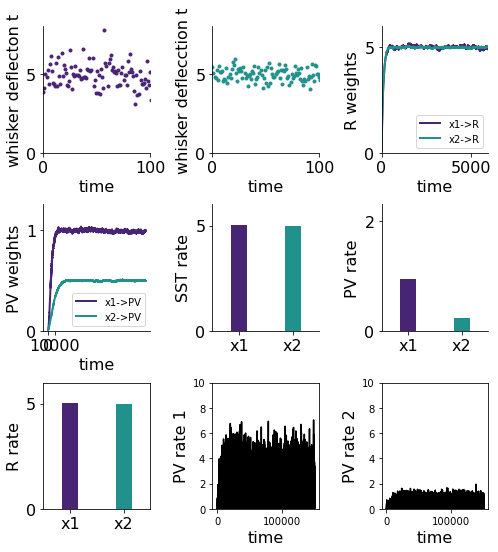

In [15]:
plt.figure(figsize=(7,7.5))
a0 = plt.subplot(331)
plt.plot(rY1,'.',color =cm.viridis(.1))#, label='Y1: mean: %.1f, sigma: %.1f'%(Y1_mean,Y1_sigma))
#plt.axhline(y=0.1, color=cm.viridis(.1), linestyle='-',linewidth=20)

#plt.plot(rY2,'.',color =cm.viridis(.5))#, label='Y2: mean: %.1f, sigma: %.1f'%(Y2_mean,Y2_sigma))
plt.ylabel('whisker deflecton t',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a0.spines['top'].set_visible(False)
a0.spines['right'].set_visible(False)
plt.ylim(0,8)
plt.xlim(0,100)
plt.xticks([0,100],[0,100],fontsize=16)

#plt.legend(loc='lower right')
a6 = plt.subplot(332)
#plt.plot(rY1,'.',color =cm.viridis(.3))#, label='Y1: mean: %.1f, sigma: %.1f'%(Y1_mean,Y1_sigma))
plt.plot(rY2,'.',color =cm.viridis(.5))#, label='Y2: mean: %.1f, sigma: %.1f'%(Y2_mean,Y2_sigma))
#plt.axhline(y=0.1, color=cm.viridis(.5), linestyle='-',linewidth=20)

plt.ylabel('whisker deflecction t',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,8)
plt.xlim(0,100)
plt.yticks([0,5],[0,5],fontsize=16)
plt.xticks([0,100],[0,100],fontsize=16)
a6.spines['top'].set_visible(False)
a6.spines['right'].set_visible(False)

a1 = plt.subplot(333)
plt.plot(wRX1_monitor, label='x1->R', color =cm.viridis(.1),linewidth=2)
plt.plot(wRX2_monitor, label='x2->R',color =cm.viridis(.5),linewidth=2)
plt.ylabel('R weights',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.legend(loc='lower right')
plt.xlim(0,6000)
plt.xticks([0,5000],[0,5000],fontsize=16)
plt.ylim(0,6)
plt.yticks([0,5],[0,5],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)

a5 = plt.subplot(334)
plt.plot(wPX1_monitor, label='x1->PV', color =cm.viridis(.1),linewidth=2)
plt.plot(wPX2_monitor, label='x2->PV',color =cm.viridis(.5),linewidth=2)
plt.ylabel('PV weights',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.yticks([0,1],[0,1],fontsize=16)
plt.xticks([0,10000],[0,10000],fontsize=16)
plt.ylim(0,1.25)
#plt.xlim(0,11000)
plt.legend(loc='lower right')
a5.spines['top'].set_visible(False)
a5.spines['right'].set_visible(False)


a3 = plt.subplot(335)
plt.bar([0,1],[SST_avg1,SST_avg2],color=[cm.viridis(.1),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

a2 = plt.subplot(336)
plt.bar([0,1],[PV_avg1,PV_avg2],color=[cm.viridis(.1),cm.viridis(.5)],width=0.3)
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)
plt.yticks([0,2],[0,2],fontsize=16)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.ylim(0,2.3)
plt.xlim(-0.5,1.5)

a9 = plt.subplot(337)
plt.bar([0,1],[R_avg1,R_avg2],color=[cm.viridis(.1),cm.viridis(.5)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('R rate',fontsize=16)
plt.xticks([0,1],['x1','x2'],fontsize=16)

a10 = plt.subplot(338)
plt.plot(rP1, color = 'k')#,
         #label = 'mean rate during Y1: %.2f; Y2: %.2f'%(np.mean(rP_monitor[100:int(T/2)]),np.mean(rP_monitor[int(T/2)+100:])))
plt.ylabel('PV rate 1',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,10)

a10 = plt.subplot(339)
plt.plot(rP2, color = 'k')#,
         #label = 'mean rate during Y1: %.2f; Y2: %.2f'%(np.mean(rP_monitor[100:int(T/2)]),np.mean(rP_monitor[int(T/2)+100:])))
plt.ylabel('PV rate 2',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,10)

plt.tight_layout()
plt.savefig('./results.pdf', bbox_inches='tight',rasterized=True)


In [16]:
Y1_mean_new = 3.0
Y2_mean_new = 3.0
Y1_sigma_new = 0.5
Y2_sigma_new = 0.5
E_avg1_new, PV_avg1_new, SST_avg1_new, R_avg1_new, E_std1_new, PV_std1_new, SST_std1_new, R_std1_new, dummy, dummy, rE1_new, rS1_new, rP1_new, rY1_new = run_network(mean= Y1_mean_new,sigma=Y1_sigma_new, w_init_PV = wPX1_monitor[-1], w_init_R = wRX1_monitor[-1], plastic=False)
E_avg2_new, PV_avg2_new, SST_avg2_new, R_avg2_new, E_std2_new, PV_std2_new, SST_std2_new, R_std2_new, dummy, dummy, rE2_new, rS2_new, rP2_new, rY2_new = run_network(mean= Y2_mean_new,sigma=Y2_sigma_new, w_init_PV = wPX2_monitor[-1], w_init_R = wRX2_monitor[-1], plastic=False)

[-0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[-0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[-0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[-0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[-0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]


In [17]:
E_avg1_new


0.38154017731038803

<ipython-input-19-d3f025ac6c11>:146: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "rasterized" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('./nPEcircuit.pdf', bbox_inches='tight',rasterized=True)


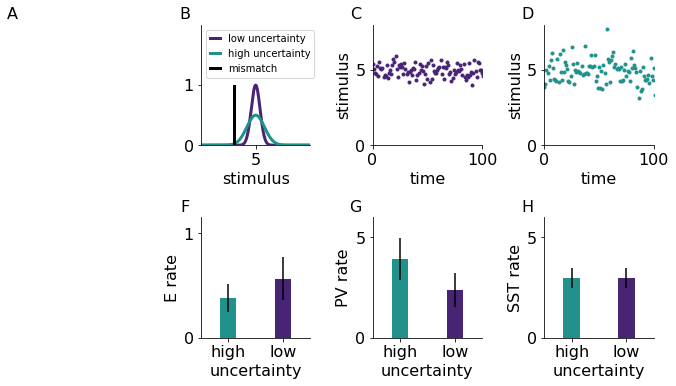

In [19]:
x_values = np.arange(0, 10, 0.001)
y1_values = stats.norm(Y1_mean, Y1_sigma)
y2_values = stats.norm(Y2_mean, Y2_sigma)

plt.figure(figsize=(9.5,5.5))

aa = plt.subplot(241)
aa.text(-0.1, 1.15, 'A', transform=aa.transAxes,
      fontsize=16, va='top', ha='right')
aa.spines['top'].set_visible(False)
aa.spines['right'].set_visible(False)
aa.spines['bottom'].set_visible(False)
aa.spines['left'].set_visible(False)
plt.xticks([])
plt.yticks([])

#a = plt.subplot(241)
a = plt.subplot(242)
a.text(-0.1, 1.15, 'B', transform=a.transAxes,
      fontsize=16, va='top', ha='right')
plt.plot(x_values, y2_values.pdf(x_values), color = cm.viridis(0.1),linewidth =3,label='low uncertainty')
plt.plot(x_values, y1_values.pdf(x_values), color = cm.viridis(0.5),linewidth =3,label='high uncertainty')
plt.plot(np.ones((100))*3,np.arange(0,1,0.01),color = 'k',linewidth=3, label = 'mismatch')
ldg = plt.legend()
plt.xlim(0,10)
plt.ylim(0,2)
plt.yticks([0,1],[0,1],fontsize=16)
plt.xticks([5],[5],fontsize=16)
plt.xlabel('stimulus', fontsize = 16)
a.spines['top'].set_visible(False)
a.spines['right'].set_visible(False)
#a.legend(loc='center left', bbox_to_anchor=(1, 0.5),fancybox=True, shadow=False)
a.legend(loc='upper left',markerscale=0.5,handlelength=1.0)#, bbox_to_anchor=(1, 0.5))


#plt.legend(loc='lower right')
a6 = plt.subplot(243)
a6.text(-0.1, 1.15, 'C', transform=a6.transAxes,
      fontsize=16, va='top', ha='right')
#plt.plot(rY1,'.',color =cm.viridis(.3))#, label='Y1: mean: %.1f, sigma: %.1f'%(Y1_mean,Y1_sigma))
plt.plot(rY2,'.',color =cm.viridis(.1))#, label='Y2: mean: %.1f, sigma: %.1f'%(Y2_mean,Y2_sigma))
#plt.axhline(y=0.1, color=cm.viridis(.5), linestyle='-',linewidth=20)

plt.ylabel('stimulus',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.ylim(0,8)
plt.xlim(0,100)
plt.yticks([0,5],[0,5],fontsize=16)
plt.xticks([0,100],[0,100],fontsize=16)
a6.spines['top'].set_visible(False)
a6.spines['right'].set_visible(False)


a0 = plt.subplot(244)
a0.text(-0.1, 1.15, 'D', transform=a0.transAxes,
      fontsize=16, va='top', ha='right')
plt.plot(rY1,'.',color =cm.viridis(.5))#, label='Y1: mean: %.1f, sigma: %.1f'%(Y1_mean,Y1_sigma))
#plt.axhline(y=0.1, color=cm.viridis(.1), linestyle='-',linewidth=20)

#plt.plot(rY2,'.',color =cm.viridis(.5))#, label='Y2: mean: %.1f, sigma: %.1f'%(Y2_mean,Y2_sigma))
plt.ylabel('stimulus',fontsize=16)
plt.xlabel('time',fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
a0.spines['top'].set_visible(False)
a0.spines['right'].set_visible(False)
plt.ylim(0,8)
plt.xlim(0,100)
plt.xticks([0,100],[0,100],fontsize=16)

"""a7 = plt.subplot(255)
a7.text(-0.1, 1.15, 'E', transform=a7.transAxes,
      fontsize=16, va='top', ha='right')
plt.errorbar(mean_range,SST_rates_mean, yerr=SST_std_mean, color = 'k', fmt='.')

plt.xlabel(r'$\mu$',fontsize=15)
plt.ylabel('SST rate',fontsize=15)
plt.xticks([0,5],[0,5],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
plt.ylim(-0.2,6)
a7.spines['top'].set_visible(False)
a7.spines['right'].set_visible(False)
"""
ae = plt.subplot(245)
ae.spines['top'].set_visible(False)
ae.spines['right'].set_visible(False)
ae.spines['bottom'].set_visible(False)
ae.spines['left'].set_visible(False)
plt.xticks([])
plt.yticks([])

a1 = plt.subplot(246)
a1.text(-0.1, 1.15, 'F', transform=a1.transAxes,
      fontsize=16, va='top', ha='right')
plt.bar([0,1],[E_avg1_new,E_avg2_new],yerr=[E_std1_new,E_std2_new],color=[cm.viridis(.5),cm.viridis(.1)],width=0.3)  
plt.ylabel('E rate',fontsize=16)
plt.xticks([0,1],['high','low'],fontsize=16)
plt.yticks([0,1],[0,1],fontsize=16)
a1.spines['top'].set_visible(False)
a1.spines['right'].set_visible(False)
plt.ylim(0,1.15)
plt.xlim(-0.5,1.5)
plt.xlabel('uncertainty',fontsize=16)


a2 = plt.subplot(247)
a2.text(-0.1, 1.15, 'G', transform=a2.transAxes,
      fontsize=16, va='top', ha='right')
plt.bar([0,1],[PV_avg1_new,PV_avg2_new],yerr=[PV_std1_new,PV_std2_new],color=[cm.viridis(.5),cm.viridis(.1)],width=0.3)  
plt.ylabel('PV rate',fontsize=16)
plt.xticks([0,1],['high','low'],fontsize=16)
plt.yticks([0,5],[0,5],fontsize=16)
plt.ylim(0,6)
a2.spines['top'].set_visible(False)
a2.spines['right'].set_visible(False)
plt.xlim(-0.5,1.5)
plt.xlabel('uncertainty',fontsize=16)


a3 = plt.subplot(248)
a3.text(-0.1, 1.15, 'H', transform=a3.transAxes,
      fontsize=16, va='top', ha='right')
plt.bar([0,1],[SST_avg1_new,SST_avg2_new],yerr=[SST_std1_new,SST_std2_new],color=[cm.viridis(.5),cm.viridis(.1)],width=0.3)  
plt.ylim(0,6)
plt.xlim(-0.5,1.5)
plt.yticks([0,5],[0,5],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
plt.ylabel('SST rate',fontsize=16)
plt.xticks([0,1],['high','low'],fontsize=16)
plt.xlabel('uncertainty',fontsize=16)

"""
a3 = plt.subplot(2,5,10)
a3.text(-0.1, 1.15, 'I', transform=a3.transAxes,
      fontsize=16, va='top', ha='right')
plt.errorbar(sigma_range**2,PV_rates_sigma, yerr=PV_std_sigma, color = 'k',fmt='.')
plt.xlabel(r'$\sigma^2$',fontsize=15)
plt.ylabel('PV rate',fontsize=15)
plt.xticks([0.0,1.0],[0,1],fontsize=16)
plt.yticks([0,2],[0,2],fontsize=16)
a3.spines['top'].set_visible(False)
a3.spines['right'].set_visible(False)
"""
plt.tight_layout()

plt.savefig('./nPEcircuit.pdf', bbox_inches='tight',rasterized=True)

In [12]:
print(SST_std_mean)

NameError: name 'SST_std_mean' is not defined